# Code implementation of the training process and neural network structure

## Import Library
Check that the necessary libraries are installed

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import inspect
import pickle
import time
from scipy.special import erf
import warnings
import os
warnings.filterwarnings('ignore')

## Loading Data and EDA
We need to unzip and upload the dataset ourselves first

In [ ]:
!wget --header='Host: drive.usercontent.google.com' --header='User-Agent: Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/122.0.0.0 Safari/537.36' --header='Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.7' --header='Accept-Language: en-US,en;q=0.9,vi;q=0.8' --header='Cookie: SID=g.a000hAiDNMGLmlmI8WP2uNc4fkAw9NIT3CBgwOoVfDTLBxXx0VmrU6XWLNUpFLHu3JIEc4BhMwACgYKAVISAQASFQHGX2Mi2hSQ1ylGC0zPDlmcJBzUxxoVAUF8yKqjWqqmbvMg-hENYxu3t_f40076; __Secure-1PSID=g.a000hAiDNMGLmlmI8WP2uNc4fkAw9NIT3CBgwOoVfDTLBxXx0VmrqQa_qA1cQjo6BW-BYvpQwQACgYKAWQSAQASFQHGX2MixrLgKSSMs3o4Q59YBTUDMRoVAUF8yKruVNxSm4tykyFUM08OjtXQ0076; __Secure-3PSID=g.a000hAiDNMGLmlmI8WP2uNc4fkAw9NIT3CBgwOoVfDTLBxXx0Vmr85URed2zxoX9Y2j0N7eEWgACgYKAcYSAQASFQHGX2MiVw8t_A_Cgz1A2WNIJ4xmUxoVAUF8yKosoPrNVWjaKHJpTY72CPi30076; HSID=ACzx1pw3ShKANVjOn; SSID=APFHJjkBX2Ardga4C; APISID=dxNw8ece1kCo5fAO/AXxCaUXF-K7mjXEus; SAPISID=CnQJa7gSq9zp2_u0/A9PUllhZ4wSjix75d; __Secure-1PAPISID=CnQJa7gSq9zp2_u0/A9PUllhZ4wSjix75d; __Secure-3PAPISID=CnQJa7gSq9zp2_u0/A9PUllhZ4wSjix75d; AEC=Ae3NU9P31jMLEqdaxTyRIYabDTkaH3z-0TFndxK6jNbqvrG5onjGEKpAAg; NID=512=RCQW39mQpEN5eL7qADv5XDGHRBIfDjig6TwJD0w-A8gQ8YdqQJEZ-sXc2D7-0LOcwUZYnn3nLYEr104Gh37rgn1R6_Z_qfBE-HRRgG94j4TXvi48nydZibrQaejXzu-y-kuN16zUsEzs25XwV7QgWSRYvYs20Sn45IQI78iRwzWFtWO0nyCTUyISif82pAimT8ChvS58bVNMwGdL7bRawtrdbfDjcXXsihMSdGje70rQsVNqSNFkY4f9BvGUay90YTQ72aHE-DYdiiMbWGwpvzSIxueS4uWJz-yxS_x-IK2R7xq13ChfuEqik-xvSK6CQQU0bKt3oY1HZYkcEdpJ5gSJLPuXgG0tY04YMph3kYlXzzJSUxeaBMsOyU7YPHL-XjfzpkNYR297-ipjYbNDB10C6GH1w8L5Xbp2qOn6FSLySP5WUxJp1B0xaIpm3cbpLS9Ok8Me7wYeYxoRH_mA145eX-YTE1PipMY78gMAgiKDjYqo3osQ2XjF5wUPgxbs66oO3VFzwUJaqM-m8NUWu1OirP_9ufD--S7x_5nt5oauYlWiBFM0ZBS6zqPy-go7DXfMq_2A52b2PsC2xweayFP7FSXd6qZskGzf6SRkKmzCwnLVQt7QHuYgnO9s42HZYV_Na3j579mmxXcd9RXzha-ONjnyl87MdmbvC48iNHXFjuTBidu4ak-Be7ktV7hzaNc5EkRevbuEBE4sZLbCaXnq25qciTumEDR-PkJ6BkcWmSHhmt1ncpxzflDcBqnPn9-AKAKkr3-6pXF6qlqzwWUHOJnH3NBF7UonA27oz-x6p83ZgAI_HBQut8ObTikULyEN7AZl7AGysZdetlzVRGWJMxeE5sLasKc2b-YMiEu5lLrgHzCrnePW9T15JrhXHxtnApgxuqngR0jzTdPnYAwUzosBukdxKd2MM87ixRgUhx3hwAL-X2hY-8mcaLywiduBgobC7DnPuuYJp5I; 1P_JAR=2024-03-12-23; __Secure-1PSIDTS=sidts-CjIBYfD7Z-RV7pAeo2n3jdeML5aQ-RWhxljnj4V2m60vIvD8TpxpccqdF_7po3xAznp2IhAA; __Secure-3PSIDTS=sidts-CjIBYfD7Z-RV7pAeo2n3jdeML5aQ-RWhxljnj4V2m60vIvD8TpxpccqdF_7po3xAznp2IhAA; SIDCC=AKEyXzWgMDAURtbhYZZaukOmlkB0yP-68WeDLD0w9sP-YXDQSisq6R4VGwiObhKlCUyZYQrhr2_h; __Secure-1PSIDCC=AKEyXzXMSMZTuNARscTVdkkSv8kvEcLts8crm5ZvDXCcZb4bcNdLCmv7ptgFbKJT6ZMAPcrVYhc; __Secure-3PSIDCC=AKEyXzXOPe8GuBWvIMs9VJQK7vEMpnOHw1xc7HBylZEKqDUOPQPFi4i8Lgd4i5eylN2Kp0rgmGU8' --header='Connection: keep-alive' 'https://drive.usercontent.google.com/download?id=1--R9BajB93t5bNaK4VMEBcVQQJGPqSYv&export=download&authuser=0&confirm=t&uuid=7d82a59a-e8bc-4f4a-9498-9d86a6e63924&at=APZUnTULQyXo28wH5AmkTCXafwHk%3A1710286096144' -c -O 'Assignment1-Dataset.zip'
!unzip Assignment1-Dataset.zip

--2024-04-12 12:36:05--  https://drive.usercontent.google.com/download?id=1--R9BajB93t5bNaK4VMEBcVQQJGPqSYv&export=download&authuser=0&confirm=t&uuid=7d82a59a-e8bc-4f4a-9498-9d86a6e63924&at=APZUnTULQyXo28wH5AmkTCXafwHk%3A1710286096144
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 64.233.188.132, 2404:6800:4008:c06::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|64.233.188.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 59066104 (56M) [application/octet-stream]
Saving to: ‘Assignment1-Dataset.zip’

Assignment1-Dataset 100%[===================>]  56.33M  48.7MB/s    in 1.2s    

2024-04-12 12:36:07 (48.7 MB/s) - ‘Assignment1-Dataset.zip’ saved [59066104/59066104]

Archive:  Assignment1-Dataset.zip
   creating: Assignment1-Dataset/
  inflating: __MACOSX/._Assignment1-Dataset  
  inflating: Assignment1-Dataset/test_label.npy  
  inflating: __MACOSX/Assignment1-Dataset/._test_label.npy  
  inflating: Assi

In [ ]:
# Load the dataset
path='/content/Assignment1-Dataset/'
X_train=np.load(path+'train_data.npy')
y_train=np.load(path+'train_label.npy')
X_test=np.load(path+'test_data.npy')
y_test=np.load(path+'test_label.npy')
print(X_train.shape,y_train.shape,X_test.shape,y_test.shape)

(50000, 128) (50000, 1) (10000, 128) (10000, 1)


The null value in the dataset: False False
The duplicates in the dataset: 0
Lables of the duplicates: []
The duplicates in the cleaned dataset: 0


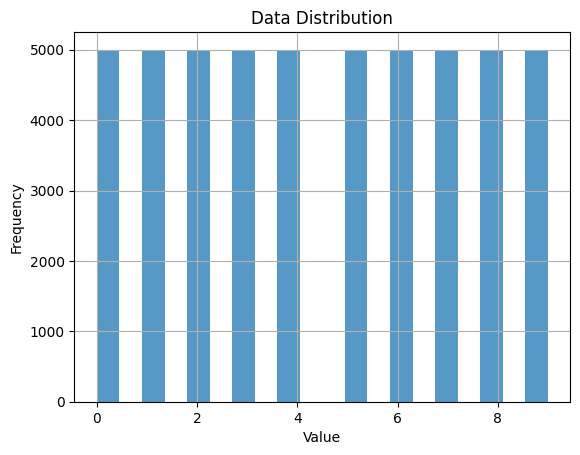

In [ ]:
# Check null value
X_train_null_values = np.isnan(X_train).any()
y_train_null_values = np.isnan(y_train).any()
print("The null value in the dataset:",X_train_null_values, y_train_null_values)
# Check the duplicates
X_train_df = pd.DataFrame(X_train)
# Calculate the duplicates
X_train_duplicates_count = X_train_df.duplicated().sum()
print("The duplicates in the dataset:",X_train_duplicates_count)
# Index of the duplicates
X_train_duplicates = X_train_df.duplicated(keep='first')
duplicate_indices = X_train_duplicates[X_train_duplicates].index
duplicate_images = y_train[duplicate_indices]
print("Lables of the duplicates:",duplicate_images)
duplicated_images = X_train[duplicate_indices]
# Drop the duplicated images
X_train_no_duplicates = X_train[~X_train_duplicates.values]
y_train_no_duplicates = y_train[~X_train_duplicates.values]
# Check the result of drop the duplicated images
X_train_df = pd.DataFrame(X_train_no_duplicates.reshape(X_train_no_duplicates.shape[0], -1))
X_train_duplicates_count = X_train_df.duplicated().sum()
print("The duplicates in the cleaned dataset:",X_train_duplicates_count)

plt.hist(y_train, bins=20, alpha=0.75)
plt.title('Data Distribution')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()



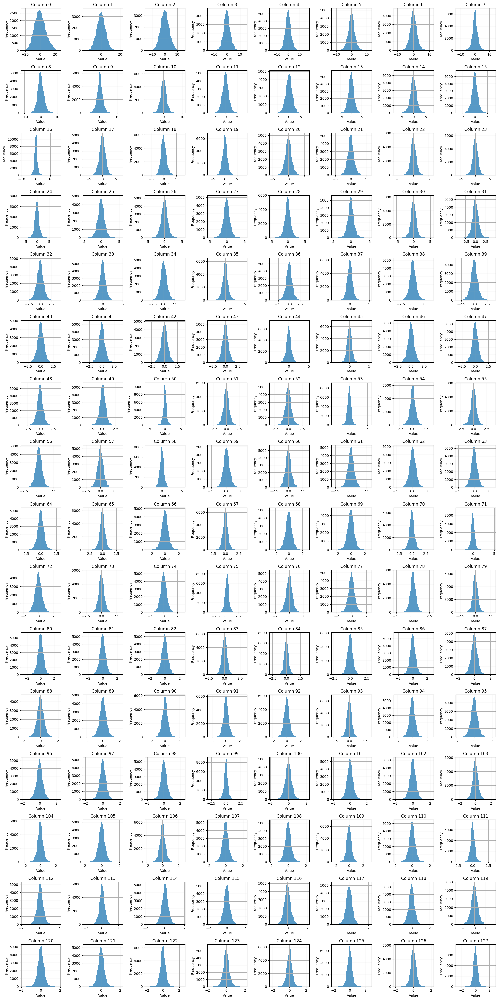

In [ ]:
#plot the distribution of all features
num_columns = X_train.shape[1]
rows = 16
cols = 8

fig, axs = plt.subplots(rows, cols, figsize=(20, 40))

for i in range(rows):
    for j in range(cols):
        col_index = i * cols + j
        if col_index < num_columns:
            axs[i, j].hist(X_train[:, col_index], bins=50, alpha=0.75)
            axs[i, j].set_title(f'Column {col_index}')
            axs[i, j].set_xlabel('Value')
            axs[i, j].set_ylabel('Frequency')
            axs[i, j].grid(True)
        else:
            axs[i, j].axis('off')

plt.tight_layout()
plt.show()

## Data preprocessing

In [ ]:
class Preprocessing:
    def __init__(self, X, y):
        self.X = X
        self.y = y
        self.predictions = None


    # normalize the dataset
    def normalize(self):

        norm_data = (self.X - np.min(self.X))/(np.max(self.X) - np.min(self.X))
        self.X = norm_data

    # standardize the dataset
    def standardize(self):

        self.X = (self.X - np.mean(self.X)) / np.std(self.X)

    # one-hot encoding for labels
    def label_encode(self):
        num_classes = np.unique(self.y).size

        encoded_label_vector = []

        for label in self.y:
            encoded_label = np.zeros(num_classes)
            encoded_label[int(label)] = 1
            encoded_label_vector.append(encoded_label)

        encoded_label_vector = np.array(encoded_label_vector)
        self.y=encoded_label_vector
        return encoded_label_vector

    @staticmethod
    # decode the labels after the prediction
    def decode(prediction_matrix):

        decoded_predictions = np.zeros(prediction_matrix.shape[0])
        for prediction_idx, prediction_vector in enumerate(prediction_matrix):
            decoded_predictions[prediction_idx] = int(np.argmax(prediction_vector))

        return decoded_predictions

    @staticmethod
    # shuffle operation for the dataset
    def shuffle(X, y):
        shuffled_idx = np.arange(X.shape[0])
        np.random.shuffle(shuffled_idx)
        X = X[shuffled_idx]
        y = y[shuffled_idx]

        return X, y

## Linear Hidden Layer

In [ ]:
class HiddenLayer:
  def __init__(self, input_size, output_size):
    self.input_size = input_size
    self.output_size = output_size
    ###weight and bias
    ###kaiming init
    self.W = np.random.randn(self.input_size, self.output_size) * np.sqrt(2. / self.input_size)
    # self.W = np.random.randn(self.input_size, self.output_size)
    self.b = np.zeros(self.output_size,)


    # initial the derivative and velocity of weight and bias
    self.dW = np.zeros(self.W.shape)
    self.db = np.zeros(self.b.shape)
    self.vW = np.zeros_like(self.dW)
    self.vb = np.zeros_like(self.db)


  # forward propagation of hidden layer
  def forward(self, X):
    self.X = X
    self.Z = np.dot(X, self.W) + self.b
    return self.Z


  # backpropagation of hidden layer
  def backward(self, gradient):
    self.dZ = gradient
    self.dW = np.dot(self.X.T, self.dZ)
    self.db = np.sum(self.dZ, axis=0)
    self.dX = np.dot(self.dZ, self.W.T)
    # self.update()
    return self.dX


  # update the parameters after backpropagation
  def update(self,learning_rate=0.0001,weight_decay=0.01,momentum=0.99,momentum_weight=True):
    self.weight_decay = weight_decay
    self.mu = momentum
    self.learning_rate = learning_rate
    if momentum_weight:
      # momentum weight method
      self.vW = self.mu * self.vW + (1 - self.mu) * (self.dW + self.weight_decay * self.W)
      self.vb = self.mu * self.vb + (1 - self.mu) * self.db
      self.W += -self.learning_rate * self.vW
      self.b += -self.learning_rate * self.vb
    else:
      ### momentum in SGD
      self.vW = self.mu * self.vW + self.learning_rate *(self.dW + self.weight_decay * self.W)
      self.vb = self.mu * self.vb + self.learning_rate * self.db
      self.W -= self.vW
      self.b -= self.vb

  def get_params(self):
    return self.W, self.b

  def set_params(self, W, b):
    self.W = W
    self.b = b

  def params_count(self):
    return self.W.size + self.b.size



## Activation Function

In [ ]:
class GELULayer:
    # forward propagation for GELU layer
    def forward(self, input):
        self.input = input
        # calculate output use erf function
        self.output = 0.5 * input * (1 + erf(input / np.sqrt(2)))
        return self.output

    # backpropagation for GELU layer
    def backward(self, output_gradient):
        cdf = 0.5 * (1 + erf(self.input / np.sqrt(2)))
        pdf = np.exp(-0.5 * self.input**2) / np.sqrt(2 * np.pi)
        grad_input = output_gradient * (cdf + self.input * pdf)
        return grad_input

class ReLULayer:
    def forward(self, input):
        self.input = input
        return np.maximum(0, input)

    def backward(self, output_gradient):
        return output_gradient * (self.input > 0)

class LeakyReLULayer:
    def __init__(self, alpha=0.01):
        self.alpha = alpha

    def forward(self, input):
        self.input = input
        return np.where(input > 0, input, self.alpha * input)

    def backward(self, output_gradient):
        return output_gradient * np.where(self.input > 0, 1, self.alpha)

class TanhLayer:
    def forward(self, input):
        self.output = np.tanh(input)
        return self.output

    def backward(self, output_gradient):
        return output_gradient * (1 - self.output ** 2)

class SigmoidLayer:
    def forward(self, input):
        self.output = 1 / (1 + np.exp(-input))
        return self.output

    def backward(self, output_gradient):
        return output_gradient * (self.output * (1 - self.output))

class SoftmaxLayer:
    def forward(self, z):
        z = np.atleast_2d(z)
        max_z = np.max(z, axis=1, keepdims=True)
        exp_z = np.exp(z - max_z)
        sum_exp_z = np.sum(exp_z, axis=1, keepdims=True)
        self.output = exp_z / sum_exp_z
        return self.output

    def backward(self, output_gradient):
        return output_gradient

## Dropout Layer

In [ ]:
class DropoutLayer:
    def __init__(self, dropout_rate):

        self.dropout_rate = dropout_rate
        self.mask = None

    def forward(self, X, training=True,**kwargs):

        # when training, scale the output according to the dropout rate
        if training:
            self.mask = np.random.binomial(1, 1 - self.dropout_rate, X.shape) == 1
            return X * self.mask/(1 - self.dropout_rate)
        else:
            return X


    def backward(self, dA):

        return dA * self.mask/(1 - self.dropout_rate)


## Normalization

In [ ]:

class LayerNormLayer:
    def __init__(self, D, momentum=0.98, eps=1e-5):
        # initial the value and derivative of gamma and beta, eps is a parameter to prevent devide by 0
        self.gamma = np.ones((1, D))
        self.beta = np.zeros((1, D))
        self.eps = eps
        self.v_gamma = np.zeros_like(self.gamma)
        self.v_beta = np.zeros_like(self.beta)

    def forward(self, X):
        # calculate the mean and variance of the inputs
        self.X = X
        self.mu = np.mean(X, axis=1, keepdims=True)
        self.var = np.var(X, axis=1, keepdims=True)
        self.X_norm = (X - self.mu) / np.sqrt(self.var + self.eps)
        out = self.gamma * self.X_norm + self.beta
        return out

    def backward(self, dY):
        # calculate the derivative of gamma and beta to update the weight
        N, D = dY.shape
        self.dgamma = np.sum(dY * self.X_norm, axis=0, keepdims=True)
        self.dbeta = np.sum(dY, axis=0, keepdims=True)

        dX_norm = dY * self.gamma
        # calculate the derivative of mean and variance to further calculate the gradient
        dvar = np.sum(dX_norm * (self.X - self.mu) * -0.5 * np.power(self.var + self.eps, -1.5), axis=1, keepdims=True)
        dmu = np.sum(dX_norm * -1 / np.sqrt(self.var + self.eps), axis=1, keepdims=True) + dvar * np.mean(-2 * (self.X - self.mu), axis=1, keepdims=True)

        # calculate the gradient
        dX = dX_norm / np.sqrt(self.var + self.eps) + dvar * 2 * (self.X - self.mu) / D + dmu / D
        return dX

    def update(self, learning_rate,momentum=0.98,polyak=True,**kwargs):
      #The experimental results prove that the above method is better than the following one
      if polyak:
        # momentum in polyak method
        self.momentum = momentum
        self.v_gamma = self.momentum * self.v_gamma - learning_rate * self.dgamma
        self.gamma += self.v_gamma
        self.v_beta = self.momentum * self.v_beta - learning_rate * self.dbeta
        self.beta += self.v_beta
      else:
        ### momentum in SGD
        self.momentum = momentum
        self.v_gamma = self.momentum * self.v_gamma + learning_rate * self.dgamma
        self.gamma -= self.v_gamma
        self.v_beta = self.momentum * self.v_beta + learning_rate * self.dbeta
        self.beta -= self.v_beta

    def params_count(self):
        return self.gamma.size + self.beta.size

    def get_params(self):
        return self.gamma, self.beta

    def set_params(self, gamma, beta):
        self.gamma = gamma
        self.beta = beta


class BatchNormLayer:
    def __init__(self, n_out):
        # initial the value and derivative of gamma and beta, eps is a parameter to prevent devide by 0
        self.gamma = np.ones(n_out)
        self.beta = np.zeros(n_out)
        self.epsilon = 1e-5
        self.running_mean = np.zeros(n_out)
        self.running_var = np.zeros(n_out)

    def forward(self, X,training=True,momentum=0.98, **kwargs):
        self.momentum = momentum

        if training:

          # calculate the mean and variance of the input batch to achieve batch normalization in the training stage

          batch_mean = np.mean(X, axis=0)
          batch_var = np.var(X, axis=0)

          # calculate the mean and variance of the whole dataset to achieve batch normalization in the inference stage
          self.running_mean = self.momentum * self.running_mean + (1 - self.momentum) * batch_mean
          self.running_var = self.momentum * self.running_var + (1 - self.momentum) * batch_var

          # batch normalization in the training stage
          X_norm = (X - batch_mean) / np.sqrt(batch_var + self.epsilon)
          self.out = self.gamma * X_norm + self.beta


          self.X_norm = X_norm
          self.batch_mean = batch_mean
          self.batch_var = batch_var
          self.X = X

          return self.out
        else:

          # batch normalization in the inference stage
          X_norm = (X - self.running_mean) / np.sqrt(self.running_var + self.epsilon)
          out = self.gamma * X_norm + self.beta
          return out

    def backward(self, dout):
        # calculate the derivative of gamma and beta to update the weight
        self.dgamma = np.sum(dout * self.X_norm, axis=0)
        self.dbeta = np.sum(dout, axis=0)

        # calculate the derivative of mean and variance to further calculate the gradient
        N = dout.shape[0]
        dX_norm = dout * self.gamma
        dvar = np.sum(dX_norm * (self.X - self.batch_mean) * -0.5 * np.power(self.batch_var + self.epsilon, -1.5), axis=0)
        dmean = np.sum(dX_norm * -1 / np.sqrt(self.batch_var + self.epsilon), axis=0) + dvar * np.mean(-2 * (self.X - self.batch_mean), axis=0)
        dX = dX_norm / np.sqrt(self.batch_var + self.epsilon) + dvar * 2 * (self.X - self.batch_mean) / N + dmean / N
        # self.update()
        return dX

    def update(self, learning_rate,using_momentum=False, **kwargs):
        if using_momentum:
          ### momentum in SGD
          self.v_gamma = self.momentum * self.v_gamma + learning_rate * self.dgamma
          self.gamma -= self.v_gamma
          self.v_beta = self.momentum * self.v_beta + learning_rate * self.dbeta
          self.beta -= self.v_beta
        else:
          self.gamma -= learning_rate * self.dgamma
          self.beta -= learning_rate * self.dbeta

    def params_count(self):
      return 2 * len(self.gamma)

    def get_params(self):
      return self.gamma, self.beta, self.running_mean, self.running_var

    def set_params(self, gamma, beta, running_mean, running_var):
      self.gamma = gamma
      self.beta = beta
      self.running_mean = running_mean
      self.running_var = running_var





## Residual Structure

In [ ]:
class ResidualBlock:
    def __init__(self, input_size, output_size, weight_decay=0.01, momentum=0.99):
        self.hidden1 = HiddenLayer(input_size, output_size)
        self.hidden2 = HiddenLayer(output_size, output_size)
        self.GELU = GELULayer()
        if input_size != output_size:
            self.shortcut = HiddenLayer(input_size, output_size)
        else:
            self.shortcut = None

    def forward(self, X):
        Z = self.hidden1.forward(X)
        Z = self.GELU.forward(Z)
        Z = self.hidden2.forward(Z)

        shortcut = X if self.shortcut is None else self.shortcut.forward(X)

        return Z + shortcut

    def backward(self, gradient):
        grad = self.hidden2.backward(gradient)
        grad = self.GELU.backward(grad)
        grad_main_path = self.hidden1.backward(grad)

        if self.shortcut is not None:
            grad_shortcut = self.shortcut.backward(gradient)
        else:
            grad_shortcut = gradient


        total_grad = grad_main_path + grad_shortcut
        return total_grad

    def update(self, learning_rate=0.01, weight_decay=0.01, momentum=0.99):
        self.hidden1.update(learning_rate, weight_decay, momentum)
        self.hidden2.update(learning_rate, weight_decay, momentum)
        if self.shortcut is not None:
            self.shortcut.update(learning_rate, weight_decay, momentum)

    def params_count(self):
      total_params = self.hidden1.params_count() + self.hidden2.params_count()

      if self.shortcut is not None:
          total_params += self.shortcut.params_count()

      return total_params

    def get_params(self):

      params = {
          'hidden1': {'W': self.hidden1.W, 'b': self.hidden1.b},
          'hidden2': {'W': self.hidden2.W, 'b': self.hidden2.b}
      }
      if self.shortcut is not None:
          params['shortcut'] = {'W': self.shortcut.W, 'b': self.shortcut.b}
      return params

    def set_params(self, params):

      self.hidden1.set_params(params['hidden1']['W'], params['hidden1']['b'])
      self.hidden2.set_params(params['hidden2']['W'], params['hidden2']['b'])
      if 'shortcut' in params and self.shortcut is not None:
          self.shortcut.set_params(params['shortcut']['W'], params['shortcut']['b'])
      elif 'shortcut' in params and self.shortcut is None:
          raise ValueError("Shortcut parameters provided but no shortcut layer exists in this ResidualBlock.")
      elif self.shortcut is not None and 'shortcut' not in params:
          raise ValueError("No parameters provided for existing shortcut layer in this ResidualBlock.")

## Loss Function

In [ ]:
class Loss:
    def __init__(self):
        pass

    # calculate the cross entropy loss
    def CE_loss(self, y_true, y_pred):
        epsilon = 1e-11
        y_pred_clipped = np.clip(y_pred, epsilon, 1. - epsilon)
        loss = -np.sum(y_true * np.log(y_pred_clipped)) / y_true.shape[0]
        gradient = (y_pred_clipped - y_true) / y_true.shape[0]
        return loss, gradient

    # calculate the mean square error
    def MSE_loss(self, y_true, y_pred):
        loss = np.mean((y_true - y_pred)**2)
        gradient = 2 * (y_pred - y_true) / y_true.shape[0]
        return loss, gradient


## Building Model

In [ ]:
class MLP:
    def __init__(self):
        self.layers = []

    # add layer to the model
    def add(self, layer):
        self.layers.append(layer)

    # call the forward method in each layer
    def forward(self, inputs, training=True,momentum=0.98):
      for layer in self.layers:
          if 'training' in inspect.signature(layer.forward).parameters:
              inputs = layer.forward(inputs, training=training,momentum=momentum)
          else:
              inputs = layer.forward(inputs)
      return inputs


    # call the backward method in each layer
    def backward(self, gradient):

        for layer in reversed(self.layers):
            gradient = layer.backward(gradient)


    # call the update method in each layer
    def update(self, learning_rate,weight_decay, momentum):

        for layer in self.layers:
            if hasattr(layer, 'update'):
                layer.update(learning_rate=learning_rate,weight_decay=weight_decay, momentum=momentum)



    def predict(self, inputs,training=False):
        return self.forward(inputs,training=training)


    # output the summary of the model
    def summary(self):
        total_params = 0
        for i, layer in enumerate(self.layers):
            if hasattr(layer, 'params_count'):
                layer_params = layer.params_count()
                print(f"Layer {i} ({type(layer).__name__}): {layer_params} parameters")
                total_params += layer_params
            else:
                print(f"Layer {i} ({type(layer).__name__}): No parameters or `param_count` method not implemented.")
        print(f"Total parameters: {total_params}")
        self.total_params = total_params
        return total_params

    def save_model(self, file_path):
      with open(file_path, 'wb') as f:
          pickle.dump(self, f)

    @staticmethod
    def load_model(file_path):
        with open(file_path, 'rb') as f:
            model = pickle.load(f)
        return model



## Training Class

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

class Trainings:
    def __init__(self, X_train, y_train, X_test, y_test, model, epochs=100, batch_size=256, learning_rate=0.0001, weight_decay=0.00001, mu=0.9, patience=10):
        # initial all the parameters needed for training
        self.X_train = X_train
        self.y_train = y_train
        self.X_test = X_test
        self.y_test = y_test
        self.model = model
        self.epochs = epochs
        self.batch_size = batch_size
        self.learning_rate = learning_rate
        self.weight_decay = weight_decay
        # momentum
        self.mu = mu
        # early stopping
        self.patience = patience
        self.loss = Loss()
        self.best_accuracy = 0
        self.best_epoch = 0

        self.apply_preprocessing()

    def apply_preprocessing(self):

        #do preprocess to the dataset
        self.preprocessing = Preprocessing(self.X_train, self.y_train)
        self.preprocessing.normalize()
        self.preprocessing.standardize()
        self.preprocessing.label_encode()
        self.X_train, self.y_train = self.preprocessing.shuffle(self.preprocessing.X, self.preprocessing.y)

        self.preprocessing = Preprocessing(self.X_test, self.y_test)
        self.preprocessing.normalize()
        self.preprocessing.standardize()
        self.preprocessing.label_encode()
        self.X_test, self.y_test = self.preprocessing.shuffle(self.preprocessing.X, self.preprocessing.y)

    def calculate_accuracy(self, X, y):
        y_hat = self.model.predict(X)
        accuracy = np.mean(np.argmax(y_hat, axis=1) == np.argmax(y, axis=1))
        return accuracy

    def SGD_train(self,track=1):
        wait = 0
        train_accuracies = []
        test_accuracies = []
        epoch_losses = []

        for epoch in range(self.epochs):
            epoch_loss = []
            indices = np.arange(self.X_train.shape[0])
            np.random.shuffle(indices)
            X_shuffled = self.X_train[indices]
            y_shuffled = self.y_train[indices]
            ###batch size=1 and batch=1
            for i in range(0, X_shuffled.shape[0]):
                # through inputing only one sample to the model each time to achieve SGD
                X_batch = X_shuffled[i:i+1]
                y_batch = y_shuffled[i:i+1]
                y_hat = self.model.forward(X_batch, self.mu)
                loss, grad = self.loss.CE_loss(y_batch, y_hat)
                epoch_loss.append(loss)
                self.model.backward(grad)
                self.model.update(self.learning_rate, self.weight_decay, self.mu)

            epoch_losses.append(np.mean(epoch_loss))
            if epoch % track == 0 or epoch == self.epochs - 1:
                train_accuracy = self.calculate_accuracy(self.X_train, self.y_train)
                test_accuracy = self.calculate_accuracy(self.X_test, self.y_test)
                train_accuracies.append(train_accuracy)
                test_accuracies.append(test_accuracy)
                print(f"Epoch {epoch+1}, Train Accuracy: {train_accuracy}, Test Accuracy: {test_accuracy}, Loss: {np.mean(epoch_loss)}")

                # early stopping
                if test_accuracy > self.best_accuracy:
                    self.best_accuracy = test_accuracy
                    self.best_epoch = epoch
                    wait = 0
                else:
                    wait += 1
                    if wait >= self.patience:
                        print("Early stopping...")
                        break

        print(f"Best Test Accuracy: {self.best_accuracy} at epoch {self.best_epoch+1}")
        self.plot_metrics(train_accuracies, test_accuracies, epoch_losses)
        trainings.plot_confusion_matrix(trainings.X_test, trainings.y_test, title='Confusion Matrix for Test Set')
        trainings.calculate_performance_metrics(trainings.X_test, trainings.y_test, dataset_name='Test Set')

        trainings.plot_confusion_matrix(trainings.X_train, trainings.y_train, title='Confusion Matrix for Training Set')
        trainings.calculate_performance_metrics(trainings.X_train, trainings.y_train, dataset_name='Training Set')
        return train_accuracies, test_accuracies, epoch_losses

    def mini_batch_train(self,track=1):
        wait = 0
        train_accuracies = []
        test_accuracies = []
        epoch_losses = []
        starttime=time.time()
        for epoch in range(self.epochs):
            epoch_loss = []
            indices = np.arange(self.X_train.shape[0])
            np.random.shuffle(indices)
            X_shuffled = self.X_train[indices]
            y_shuffled = self.y_train[indices]

            for i in range(0, X_shuffled.shape[0], self.batch_size):
                # through inputing multiple samples to the model each time to achieve mini-batch training
                X_batch = X_shuffled[i:i+self.batch_size]
                y_batch = y_shuffled[i:i+self.batch_size]
                y_hat = self.model.forward(X_batch, self.mu)
                loss, grad = self.loss.CE_loss(y_batch, y_hat)
                epoch_loss.append(loss)
                self.model.backward(grad)
                self.model.update(self.learning_rate, self.weight_decay, self.mu)
            epoch_losses.append(np.mean(epoch_loss))

            if epoch % track == 0 or epoch == self.epochs - 1:
                train_accuracy = self.calculate_accuracy(self.X_train, self.y_train)
                test_accuracy = self.calculate_accuracy(self.X_test, self.y_test)
                train_accuracies.append(train_accuracy)
                test_accuracies.append(test_accuracy)
                print(f"Epoch {epoch+1}, Train Accuracy: {train_accuracy}, Test Accuracy: {test_accuracy}, Loss: {np.mean(epoch_loss)}")

                # early stopping
                if test_accuracy > self.best_accuracy:
                    self.best_accuracy = test_accuracy
                    self.best_epoch = epoch
                    wait = 0
                else:
                    wait += 1
                    if wait >= self.patience:
                        print("Early stopping...")
                        break
        endtime=time.time()
        print(f"Best Test Accuracy: {self.best_accuracy} at epoch {self.best_epoch+1}")
        print(test_accuracies, epoch_losses)
        self.plot_metrics(train_accuracies, test_accuracies, epoch_losses)
        self.plot_confusion_matrix(self.X_test, self.y_test, title='Confusion Matrix for Test Set')
        self.test_timecost,self.test_report=self.calculate_performance_metrics(self.X_test, self.y_test, dataset_name='Test Set')

        self.plot_confusion_matrix(self.X_train, self.y_train, title='Confusion Matrix for Training Set')
        self.train_timecost,self.train_report=self.calculate_performance_metrics(self.X_train, self.y_train, dataset_name='Training Set')
        self.timecost=endtime-starttime
        print(f"timecost:{self.timecost}")
        self.train_accuracies = train_accuracies
        self.test_accuracies = test_accuracies
        self.epoch_losses = epoch_losses
        self.params_count = self.model.summary()


    def plot_metrics(self, train_accuracies, test_accuracies, epoch_losses):
        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.plot(range(1, len(train_accuracies) + 1), train_accuracies, label='Train Accuracy')
        plt.plot(range(1, len(test_accuracies) + 1), test_accuracies, label='Test Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.title('Accuracy vs. Epochs')

        plt.subplot(1, 2, 2)
        plt.plot(range(1, len(epoch_losses) + 1), epoch_losses, label='Train Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.title('Loss vs. Epochs')
        plt.tight_layout()
        plt.show()

    def plot_confusion_matrix(self, X, y, title='Confusion Matrix'):
      y_pred = np.argmax(self.model.predict(X), axis=1)
      y_true = np.argmax(y, axis=1)
      matrix = confusion_matrix(y_true, y_pred)
      plt.figure(figsize=(10, 7))
      sns.heatmap(matrix, annot=True, fmt='d', cmap='Blues')
      plt.xlabel('Predicted Label')
      plt.ylabel('True Label')
      plt.title(title)
      plt.show()

    def calculate_performance_metrics(self, X, y, dataset_name='Test Set'):
      starttime=time.time()
      y_pred = np.argmax(self.model.predict(X), axis=1)
      y_true = np.argmax(y, axis=1)
      endtime=time.time()
      timecost=endtime-starttime
      print(f"timecost:{timecost}")
      print(f"Performance Metrics for {dataset_name}:")
      report = classification_report(y_true, y_pred, target_names=[f'Class {i}' for i in range(np.max(y_true) + 1)])
      print(report)
      return timecost,report



In [ ]:
def plot_training_results(epoch_losses, test_accuracies,params):
    """
    Plots the training results including epoch losses and test accuracies.

    Parameters:
    - epoch_losses: A dictionary where keys are learning rates (as strings) and values are lists of losses per epoch.
    - test_accuracies: A dictionary where keys are learning rates (as strings) and values are lists of accuracies per epoch.
    """
    plt.figure(figsize=(14, 6))

    # Plot for Epoch Losses
    plt.subplot(1, 2, 1)
    for lr, losses in epoch_losses.items():
        plt.plot(range(1, len(losses)+1), losses, label=f'{params}={lr}')
    plt.title('Epoch Losses')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    # Plot for Test Accuracies
    plt.subplot(1, 2, 2)
    for lr, accuracies in test_accuracies.items():
        plt.plot(range(1, len(accuracies)+1), accuracies, label=f'{params}={lr}')
    plt.title('Test Accuracies')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Experiments

## Baseline Model


Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 parameters
Layer 3 (SoftmaxLayer): No parameters or `param_count` method not implemented.
Total parameters: 17802


<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.1365, Test Accuracy: 0.1374, Loss: 2.82502981468695
Epoch 2, Train Accuracy: 0.17732, Test Accuracy: 0.1752, Loss: 2.490093221211966
Epoch 3, Train Accuracy: 0.19982, Test Accuracy: 0.2003, Loss: 2.3527190553080595
Epoch 4, Train Accuracy: 0.21566, Test Accuracy: 0.2174, Loss: 2.27528016428412
Epoch 5, Train Accuracy: 0.22928, Test Accuracy: 0.2332, Loss: 2.220323030459177
Epoch 6, Train Accuracy: 0.24014, Test Accuracy: 0.245, Loss: 2.177046932646768
Epoch 7, Train Accuracy: 0.25032, Test Accuracy: 0.2538, Loss: 2.1413974179885766
Epoch 8, Train Accuracy: 0.25986, Test Accuracy: 0.2629, Loss: 2.1111858445461267
Epoch 9, Train Accuracy: 0.26812, Test Accuracy: 0.2708, Loss: 2.085057762397301
Epoch 10, Train Accuracy: 0.27584, Test Accuracy: 0.2793, Loss: 2.062082243343664
Epoch 11, Train Accuracy: 0.28222, Test Accuracy: 0.2848, Loss: 2.041665895757348
Epoch 12, Train Accuracy: 0.28842, Test Accuracy: 0.2909, Loss: 2.0233710277961983
Epoch 13, Train Accuracy:

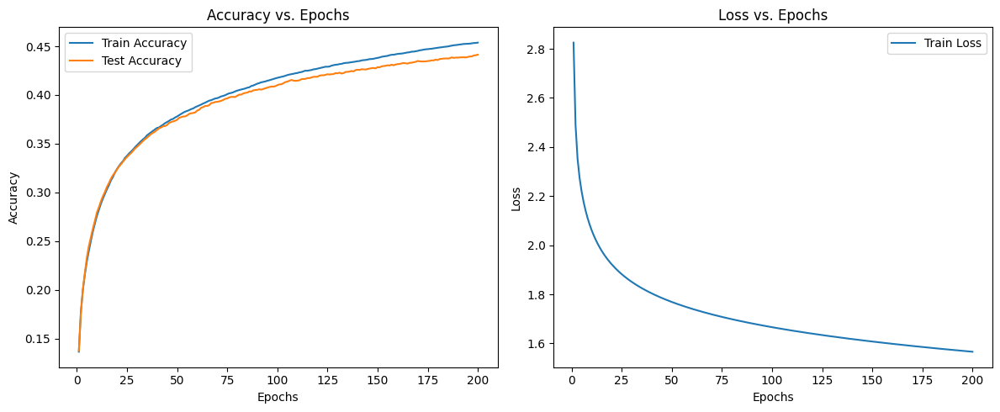

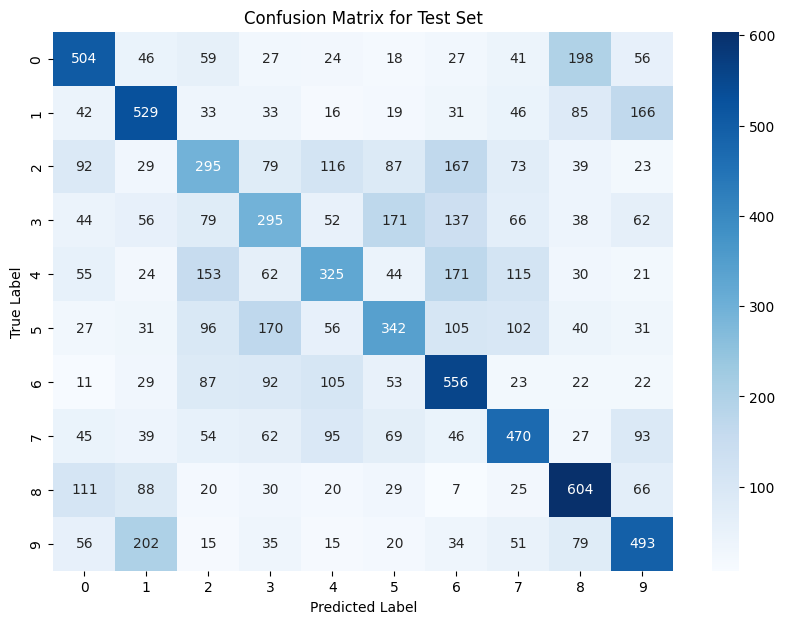

timecost:0.0641322135925293
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.51      0.50      0.51      1000
     Class 1       0.49      0.53      0.51      1000
     Class 2       0.33      0.29      0.31      1000
     Class 3       0.33      0.29      0.31      1000
     Class 4       0.39      0.33      0.36      1000
     Class 5       0.40      0.34      0.37      1000
     Class 6       0.43      0.56      0.49      1000
     Class 7       0.46      0.47      0.47      1000
     Class 8       0.52      0.60      0.56      1000
     Class 9       0.48      0.49      0.48      1000

    accuracy                           0.44     10000
   macro avg       0.44      0.44      0.44     10000
weighted avg       0.44      0.44      0.44     10000



In [ ]:
model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=200,
                      learning_rate=0.001,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings.mini_batch_train()
trainings.model.save_model('basemodel.h5')
trainings.model.load_model('basemodel.h5')
print(trainings.train_accuracies)
print(trainings.test_accuracies)
print(trainings.epoch_losses)
print(trainings.params_count)
print(trainings.train_timecost)
print(trainings.test_timecost)
print(trainings.train_report)
print(trainings.test_report)

Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (DropoutLayer): No parameters or `param_count` method not implemented.
Layer 3 (HiddenLayer): 1290 parameters
Layer 4 (SoftmaxLayer): No parameters or `param_count` method not implemented.
Total parameters: 17802


<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.42646, Test Accuracy: 0.4169, Loss: 1.8977942955835094
Epoch 2, Train Accuracy: 0.45048, Test Accuracy: 0.4388, Loss: 1.7182635203850014
Epoch 3, Train Accuracy: 0.48042, Test Accuracy: 0.4678, Loss: 1.6545004003147123
Epoch 4, Train Accuracy: 0.4851, Test Accuracy: 0.4729, Loss: 1.6170239721464923
Epoch 5, Train Accuracy: 0.502, Test Accuracy: 0.4852, Loss: 1.5922194344999054
Epoch 6, Train Accuracy: 0.50788, Test Accuracy: 0.4913, Loss: 1.569505101908744
Epoch 7, Train Accuracy: 0.50702, Test Accuracy: 0.4921, Loss: 1.5486733881638466
Epoch 8, Train Accuracy: 0.5206, Test Accuracy: 0.4955, Loss: 1.5318380327111472
Epoch 9, Train Accuracy: 0.52276, Test Accuracy: 0.4958, Loss: 1.5229774058992567
Epoch 10, Train Accuracy: 0.5372, Test Accuracy: 0.5088, Loss: 1.5076597044146274
Epoch 11, Train Accuracy: 0.53518, Test Accuracy: 0.5081, Loss: 1.4956524946290313
Epoch 12, Train Accuracy: 0.53962, Test Accuracy: 0.5112, Loss: 1.4950082273382528
Epoch 13, Train Acc

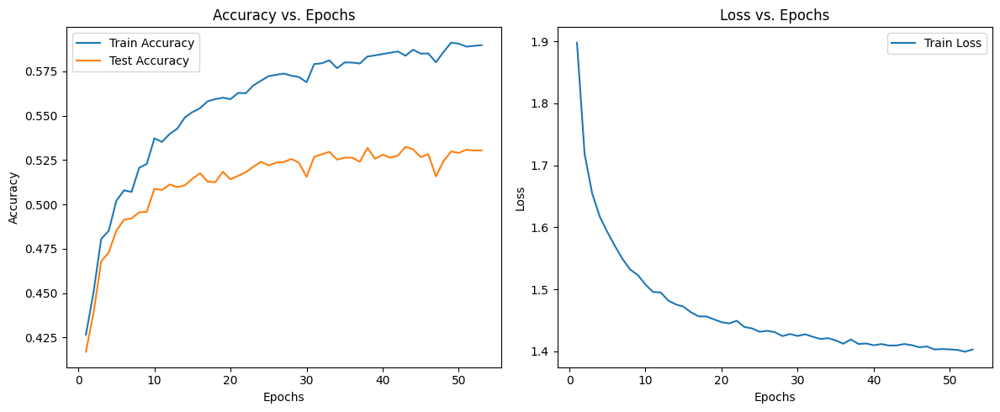

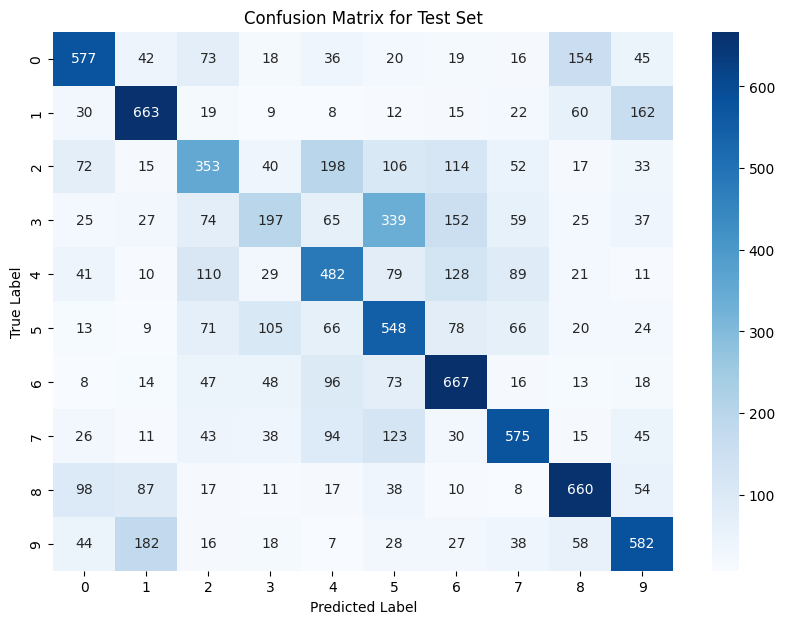

timecost:0.057801246643066406
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.62      0.58      0.60      1000
     Class 1       0.63      0.66      0.64      1000
     Class 2       0.43      0.35      0.39      1000
     Class 3       0.38      0.20      0.26      1000
     Class 4       0.45      0.48      0.47      1000
     Class 5       0.40      0.55      0.46      1000
     Class 6       0.54      0.67      0.60      1000
     Class 7       0.61      0.57      0.59      1000
     Class 8       0.63      0.66      0.65      1000
     Class 9       0.58      0.58      0.58      1000

    accuracy                           0.53     10000
   macro avg       0.53      0.53      0.52     10000
weighted avg       0.53      0.53      0.52     10000



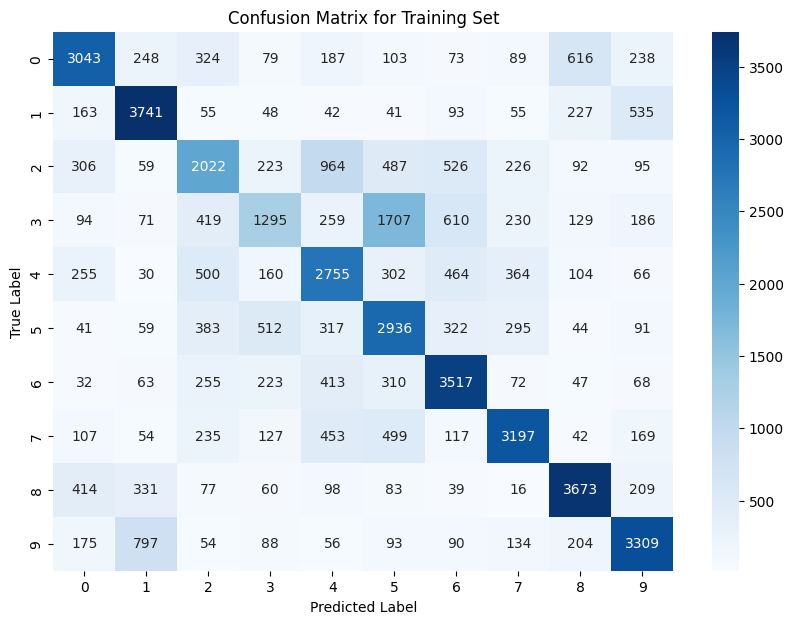

timecost:0.26586198806762695
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.66      0.61      0.63      5000
     Class 1       0.69      0.75      0.72      5000
     Class 2       0.47      0.40      0.43      5000
     Class 3       0.46      0.26      0.33      5000
     Class 4       0.50      0.55      0.52      5000
     Class 5       0.45      0.59      0.51      5000
     Class 6       0.60      0.70      0.65      5000
     Class 7       0.68      0.64      0.66      5000
     Class 8       0.71      0.73      0.72      5000
     Class 9       0.67      0.66      0.66      5000

    accuracy                           0.59     50000
   macro avg       0.59      0.59      0.58     50000
weighted avg       0.59      0.59      0.58     50000

timecost:106.19627332687378
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (DropoutLayer): No par

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.45156, Test Accuracy: 0.446, Loss: 1.8135689543677678
Epoch 2, Train Accuracy: 0.47142, Test Accuracy: 0.4589, Loss: 1.6305524935105478
Epoch 3, Train Accuracy: 0.50132, Test Accuracy: 0.4765, Loss: 1.5637789417273542
Epoch 4, Train Accuracy: 0.50816, Test Accuracy: 0.4857, Loss: 1.5224171034656664
Epoch 5, Train Accuracy: 0.52058, Test Accuracy: 0.4938, Loss: 1.4958856476165723
Epoch 6, Train Accuracy: 0.52812, Test Accuracy: 0.5035, Loss: 1.467198867400772
Epoch 7, Train Accuracy: 0.53512, Test Accuracy: 0.5056, Loss: 1.4443259489078835
Epoch 8, Train Accuracy: 0.54418, Test Accuracy: 0.5107, Loss: 1.4329395759048529
Epoch 9, Train Accuracy: 0.54878, Test Accuracy: 0.5131, Loss: 1.411367198357573
Epoch 10, Train Accuracy: 0.5561, Test Accuracy: 0.5226, Loss: 1.3991302077478958
Epoch 11, Train Accuracy: 0.56116, Test Accuracy: 0.5222, Loss: 1.3858010448948712
Epoch 12, Train Accuracy: 0.56714, Test Accuracy: 0.529, Loss: 1.3812453857711746
Epoch 13, Train Ac

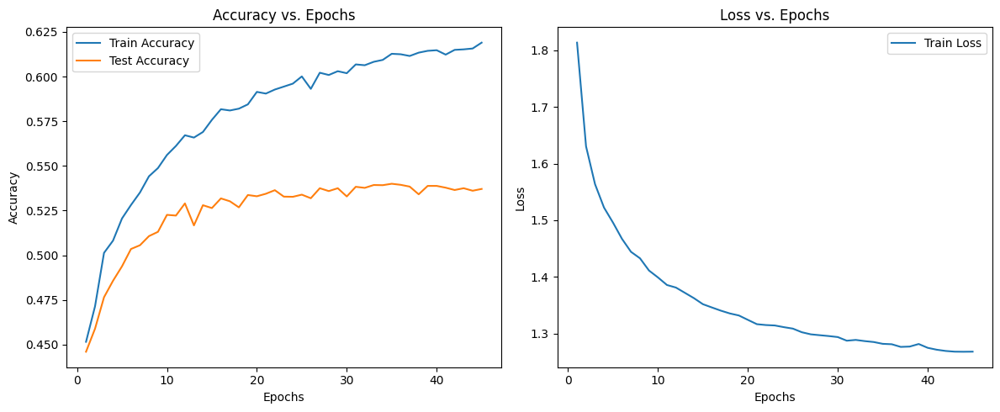

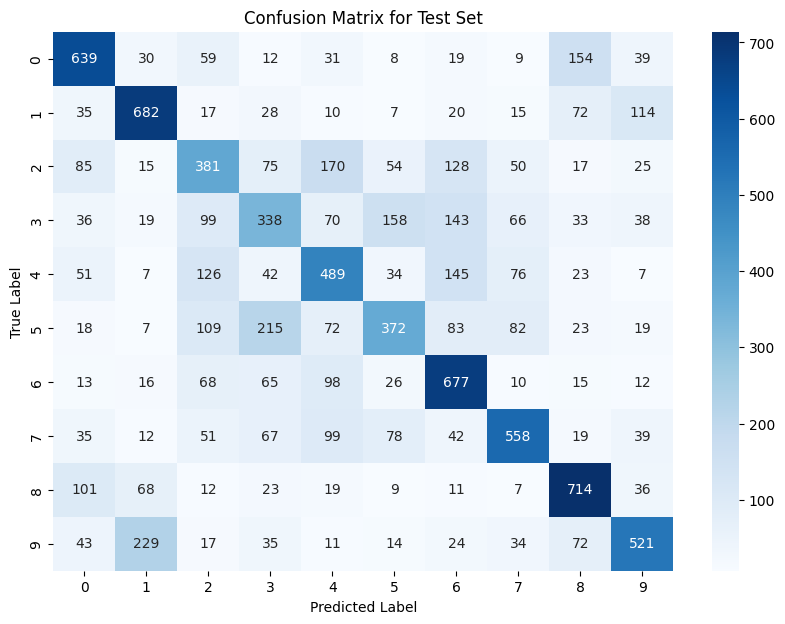

timecost:0.05560708045959473
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.61      0.64      0.62      1000
     Class 1       0.63      0.68      0.65      1000
     Class 2       0.41      0.38      0.39      1000
     Class 3       0.38      0.34      0.36      1000
     Class 4       0.46      0.49      0.47      1000
     Class 5       0.49      0.37      0.42      1000
     Class 6       0.52      0.68      0.59      1000
     Class 7       0.62      0.56      0.59      1000
     Class 8       0.63      0.71      0.67      1000
     Class 9       0.61      0.52      0.56      1000

    accuracy                           0.54     10000
   macro avg       0.53      0.54      0.53     10000
weighted avg       0.53      0.54      0.53     10000



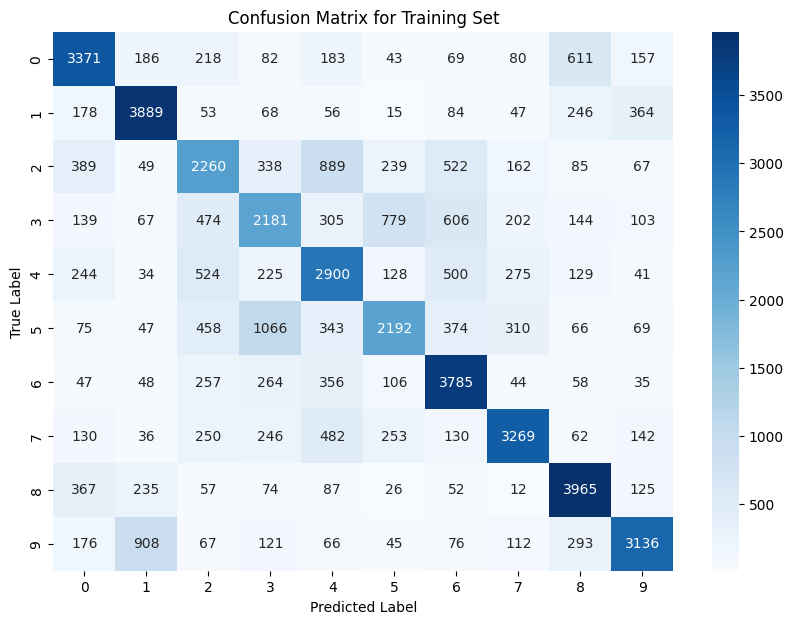

timecost:0.2697155475616455
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.66      0.67      0.67      5000
     Class 1       0.71      0.78      0.74      5000
     Class 2       0.49      0.45      0.47      5000
     Class 3       0.47      0.44      0.45      5000
     Class 4       0.51      0.58      0.54      5000
     Class 5       0.57      0.44      0.50      5000
     Class 6       0.61      0.76      0.68      5000
     Class 7       0.72      0.65      0.69      5000
     Class 8       0.70      0.79      0.74      5000
     Class 9       0.74      0.63      0.68      5000

    accuracy                           0.62     50000
   macro avg       0.62      0.62      0.62     50000
weighted avg       0.62      0.62      0.62     50000

timecost:89.2857301235199
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (DropoutLayer): No parame

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.45768, Test Accuracy: 0.4463, Loss: 1.7875495897567097
Epoch 2, Train Accuracy: 0.48678, Test Accuracy: 0.4723, Loss: 1.5874908397436895
Epoch 3, Train Accuracy: 0.49748, Test Accuracy: 0.4846, Loss: 1.5271772043776828
Epoch 4, Train Accuracy: 0.51844, Test Accuracy: 0.4985, Loss: 1.4819368586382589
Epoch 5, Train Accuracy: 0.52888, Test Accuracy: 0.5019, Loss: 1.4515331945302408
Epoch 6, Train Accuracy: 0.53816, Test Accuracy: 0.5059, Loss: 1.423733304095414
Epoch 7, Train Accuracy: 0.54748, Test Accuracy: 0.5145, Loss: 1.4031507320060472
Epoch 8, Train Accuracy: 0.55166, Test Accuracy: 0.511, Loss: 1.3849732486610546
Epoch 9, Train Accuracy: 0.55756, Test Accuracy: 0.5127, Loss: 1.3673779309224463
Epoch 10, Train Accuracy: 0.56804, Test Accuracy: 0.5165, Loss: 1.3551993308776509
Epoch 11, Train Accuracy: 0.5718, Test Accuracy: 0.5218, Loss: 1.3406685808123366
Epoch 12, Train Accuracy: 0.57638, Test Accuracy: 0.5253, Loss: 1.3273845588342303
Epoch 13, Train 

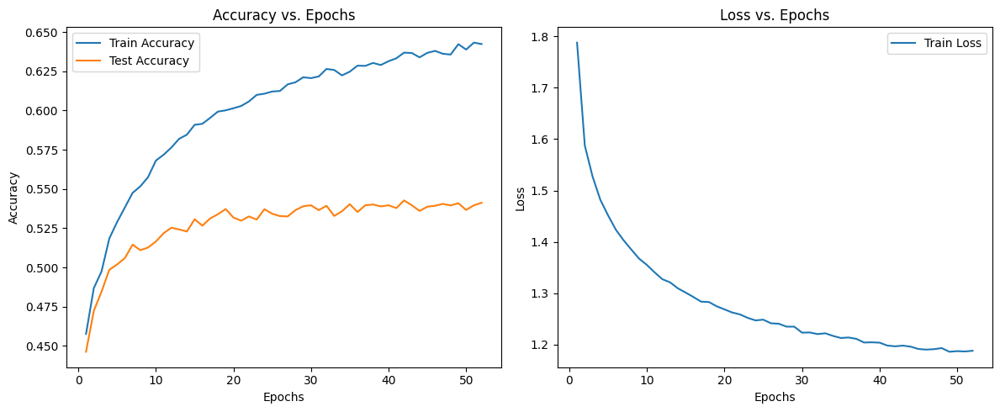

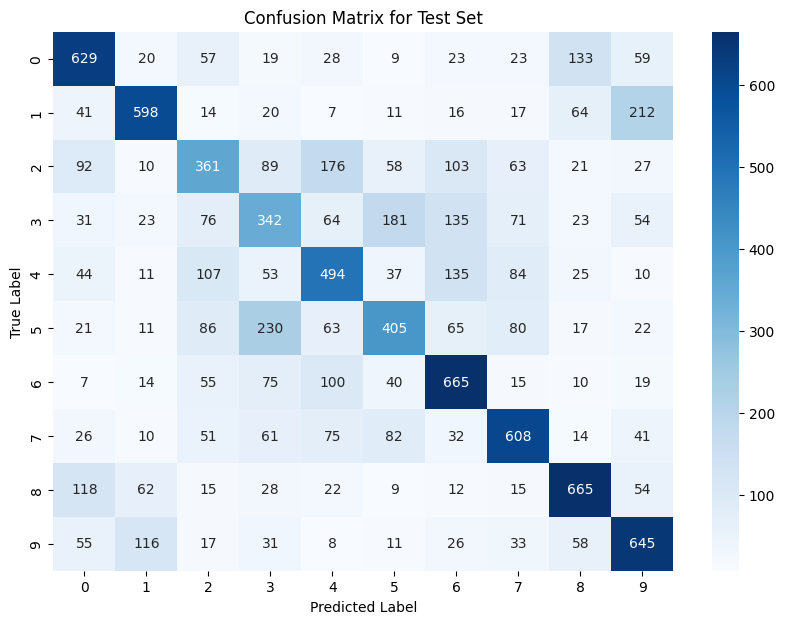

timecost:0.05685234069824219
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.59      0.63      0.61      1000
     Class 1       0.68      0.60      0.64      1000
     Class 2       0.43      0.36      0.39      1000
     Class 3       0.36      0.34      0.35      1000
     Class 4       0.48      0.49      0.49      1000
     Class 5       0.48      0.41      0.44      1000
     Class 6       0.55      0.67      0.60      1000
     Class 7       0.60      0.61      0.61      1000
     Class 8       0.65      0.67      0.66      1000
     Class 9       0.56      0.65      0.60      1000

    accuracy                           0.54     10000
   macro avg       0.54      0.54      0.54     10000
weighted avg       0.54      0.54      0.54     10000



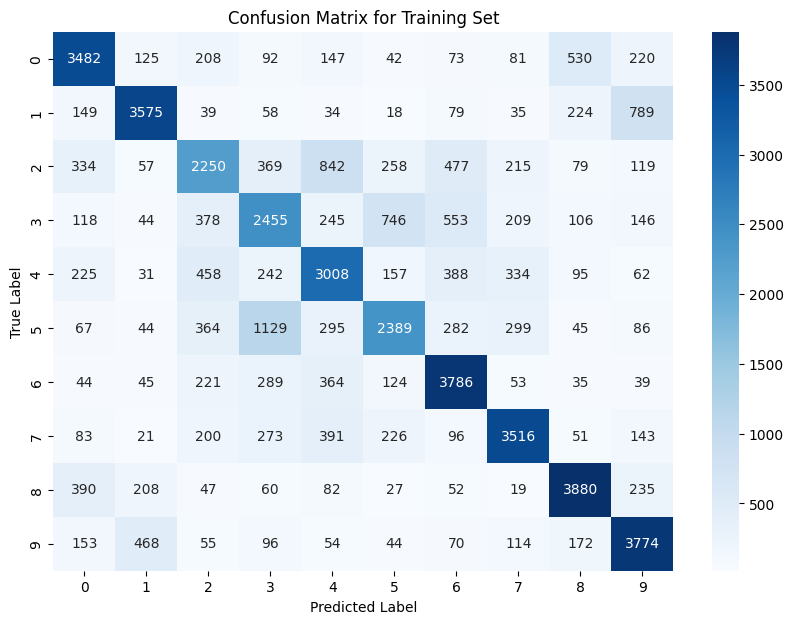

timecost:0.2683384418487549
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.69      0.70      0.69      5000
     Class 1       0.77      0.71      0.74      5000
     Class 2       0.53      0.45      0.49      5000
     Class 3       0.48      0.49      0.49      5000
     Class 4       0.55      0.60      0.58      5000
     Class 5       0.59      0.48      0.53      5000
     Class 6       0.65      0.76      0.70      5000
     Class 7       0.72      0.70      0.71      5000
     Class 8       0.74      0.78      0.76      5000
     Class 9       0.67      0.75      0.71      5000

    accuracy                           0.64     50000
   macro avg       0.64      0.64      0.64     50000
weighted avg       0.64      0.64      0.64     50000

timecost:102.22503232955933
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (DropoutLayer): No para

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.45952, Test Accuracy: 0.4507, Loss: 1.7521830058655743
Epoch 2, Train Accuracy: 0.48622, Test Accuracy: 0.4662, Loss: 1.5475929370186512
Epoch 3, Train Accuracy: 0.51102, Test Accuracy: 0.4894, Loss: 1.481607986168633
Epoch 4, Train Accuracy: 0.52748, Test Accuracy: 0.4964, Loss: 1.4364244331593148
Epoch 5, Train Accuracy: 0.54008, Test Accuracy: 0.5053, Loss: 1.4035609174996502
Epoch 6, Train Accuracy: 0.54642, Test Accuracy: 0.5057, Loss: 1.3776972303134105
Epoch 7, Train Accuracy: 0.55446, Test Accuracy: 0.5136, Loss: 1.3537725409824168
Epoch 8, Train Accuracy: 0.5669, Test Accuracy: 0.523, Loss: 1.333480540853668
Epoch 9, Train Accuracy: 0.57092, Test Accuracy: 0.5207, Loss: 1.3198439243262021
Epoch 10, Train Accuracy: 0.57344, Test Accuracy: 0.5196, Loss: 1.3035167452893262
Epoch 11, Train Accuracy: 0.57428, Test Accuracy: 0.5196, Loss: 1.2851650831245656
Epoch 12, Train Accuracy: 0.5894, Test Accuracy: 0.5311, Loss: 1.2723104235951497
Epoch 13, Train Ac

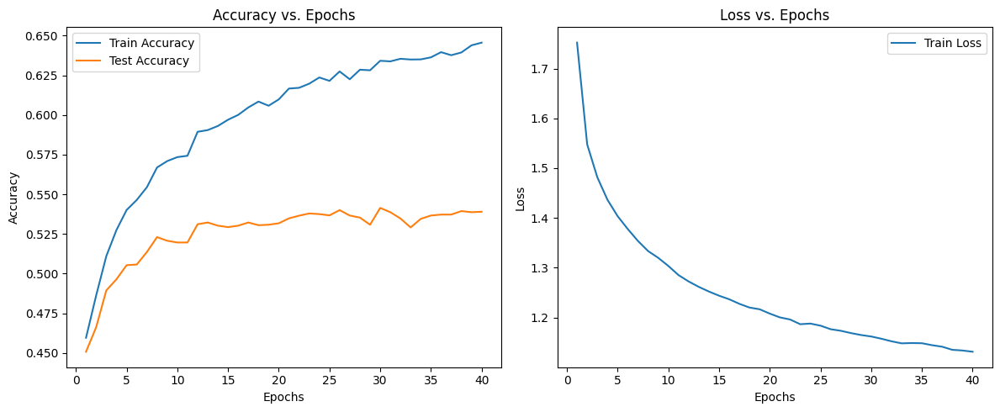

timecost:0.27015089988708496
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.52      0.49      0.51      5000
     Class 1       0.50      0.55      0.53      5000
     Class 2       0.36      0.31      0.33      5000
     Class 3       0.33      0.30      0.31      5000
     Class 4       0.40      0.36      0.38      5000
     Class 5       0.39      0.34      0.36      5000
     Class 6       0.44      0.54      0.48      5000
     Class 7       0.49      0.49      0.49      5000
     Class 8       0.55      0.63      0.59      5000
     Class 9       0.50      0.53      0.51      5000

    accuracy                           0.45     50000
   macro avg       0.45      0.45      0.45     50000
weighted avg       0.45      0.45      0.45     50000

timecost:244.22756457328796
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 pa

In [ ]:
# Dropout rate
model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(DropoutLayer(0.5))
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_dr_05 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_dr_05.mini_batch_train()
print("train_accuracies:",trainings_dr_05.train_accuracies)
print("test_accuracies:",trainings_dr_05.test_accuracies)
print("epoch_losses:",trainings_dr_05.epoch_losses)
print("params_count:",trainings_dr_05.params_count)
print("train_timecost:",trainings_dr_05.train_timecost)
print("test_timecost:",trainings_dr_05.test_timecost)
print("train_report:",trainings_dr_05.train_report)
print("test_report:",trainings_dr_05.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(DropoutLayer(0.3))
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_dr_03 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_dr_03.mini_batch_train()
print("train_accuracies:",trainings_dr_03.train_accuracies)
print("test_accuracies:",trainings_dr_03.test_accuracies)
print("epoch_losses:",trainings_dr_03.epoch_losses)
print("params_count:",trainings_dr_03.params_count)
print("train_timecost:",trainings_dr_03.train_timecost)
print("test_timecost:",trainings_dr_03.test_timecost)
print("train_report:",trainings_dr_03.train_report)
print("test_report:",trainings_dr_03.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_dr_02 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_dr_02.mini_batch_train()
print("train_accuracies:",trainings_dr_02.train_accuracies)
print("test_accuracies:",trainings_dr_02.test_accuracies)
print("epoch_losses:",trainings_dr_02.epoch_losses)
print("params_count:",trainings_dr_02.params_count)
print("train_timecost:",trainings_dr_02.train_timecost)
print("test_timecost:",trainings_dr_02.test_timecost)
print("train_report:",trainings_dr_02.train_report)
print("test_report:",trainings_dr_02.test_report)


model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(DropoutLayer(0.1))
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_dr_01 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_dr_01.mini_batch_train()
print("train_accuracies:",trainings_dr_01.train_accuracies)
print("test_accuracies:",trainings_dr_01.test_accuracies)
print("epoch_losses:",trainings_dr_01.epoch_losses)
print("params_count:",trainings_dr_01.params_count)
print("train_timecost:",trainings_dr_01.train_timecost)
print("test_timecost:",trainings_dr_01.test_timecost)
print("train_report:",trainings_dr_01.train_report)
print("test_report:",trainings_dr_01.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(DropoutLayer(0.05))
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_dr_005 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_dr_005.mini_batch_train()
print("train_accuracies:",trainings_dr_005.train_accuracies)
print("test_accuracies:",trainings_dr_005.test_accuracies)
print("epoch_losses:",trainings_dr_005.epoch_losses)
print("params_count:",trainings_dr_005.params_count)
print("train_timecost:",trainings_dr_005.train_timecost)
print("test_timecost:",trainings_dr_005.test_timecost)
print("train_report:",trainings_dr_005.train_report)
print("test_report:",trainings_dr_005.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_dr_none = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_dr_none.mini_batch_train()
print("train_accuracies:",trainings_dr_none.train_accuracies)
print("test_accuracies:",trainings_dr_none.test_accuracies)
print("epoch_losses:",trainings_dr_none.epoch_losses)
print("params_count:",trainings_dr_none.params_count)
print("train_timecost:",trainings_dr_none.train_timecost)
print("test_timecost:",trainings_dr_none.test_timecost)
print("train_report:",trainings_dr_none.train_report)
print("test_report:",trainings_dr_none.test_report)

epoch_losses = {
"05":trainings_dr_05.epoch_losses,
"03":trainings_dr_03.epoch_losses,
"02":trainings_dr_02.epoch_losses,
"01":trainings_dr_01.epoch_losses,
"005":trainings_dr_005.epoch_losses,
"none":trainings_dr_none.epoch_losses
}

test_accuracies = {
"05":trainings_dr_05.test_accuracies,
"03":trainings_dr_03.test_accuracies,
"02":trainings_dr_02.test_accuracies,
"01":trainings_dr_01.test_accuracies,
"005":trainings_dr_005.test_accuracies,
"none":trainings_dr_none.test_accuracies
}

plot_training_results(epoch_losses, test_accuracies, 'Dropout rate')

## Hyperparameter Analysis

### learning rate

Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 parameters
Layer 3 (SoftmaxLayer): No parameters or `param_count` method not implemented.
Total parameters: 17802


<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.13878, Test Accuracy: 0.1417, Loss: 2.8565357956370305
Epoch 2, Train Accuracy: 0.1706, Test Accuracy: 0.1701, Loss: 2.5022142826610896
Epoch 3, Train Accuracy: 0.19444, Test Accuracy: 0.19, Loss: 2.3405621725873362
Epoch 4, Train Accuracy: 0.21674, Test Accuracy: 0.2138, Loss: 2.246231466178121
Epoch 5, Train Accuracy: 0.23448, Test Accuracy: 0.2333, Loss: 2.1826234719981903
Epoch 6, Train Accuracy: 0.24874, Test Accuracy: 0.2514, Loss: 2.1354632127100874
Epoch 7, Train Accuracy: 0.26178, Test Accuracy: 0.2627, Loss: 2.0985657877297705
Epoch 8, Train Accuracy: 0.27092, Test Accuracy: 0.2718, Loss: 2.0684027168903016
Epoch 9, Train Accuracy: 0.27926, Test Accuracy: 0.2798, Loss: 2.04307967936295
Epoch 10, Train Accuracy: 0.28688, Test Accuracy: 0.2868, Loss: 2.0212641998524257
Epoch 11, Train Accuracy: 0.29344, Test Accuracy: 0.2937, Loss: 2.002228588037314
Epoch 12, Train Accuracy: 0.29854, Test Accuracy: 0.2998, Loss: 1.9853501403863318
Epoch 13, Train Accu

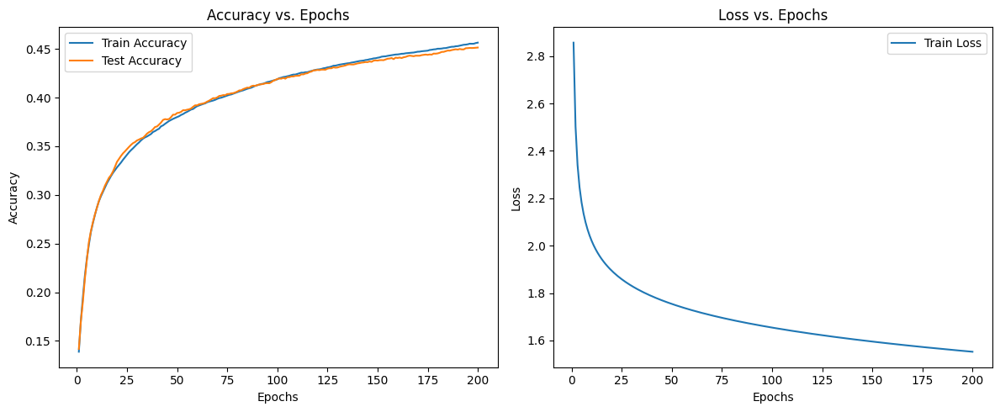

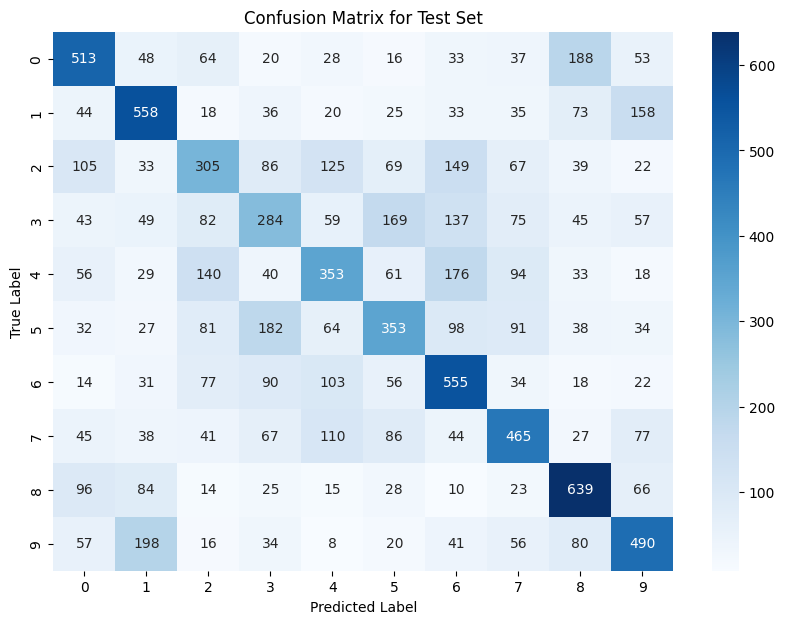

timecost:0.053806304931640625
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.51      0.51      0.51      1000
     Class 1       0.51      0.56      0.53      1000
     Class 2       0.36      0.30      0.33      1000
     Class 3       0.33      0.28      0.30      1000
     Class 4       0.40      0.35      0.37      1000
     Class 5       0.40      0.35      0.37      1000
     Class 6       0.43      0.56      0.49      1000
     Class 7       0.48      0.47      0.47      1000
     Class 8       0.54      0.64      0.59      1000
     Class 9       0.49      0.49      0.49      1000

    accuracy                           0.45     10000
   macro avg       0.45      0.45      0.45     10000
weighted avg       0.45      0.45      0.45     10000



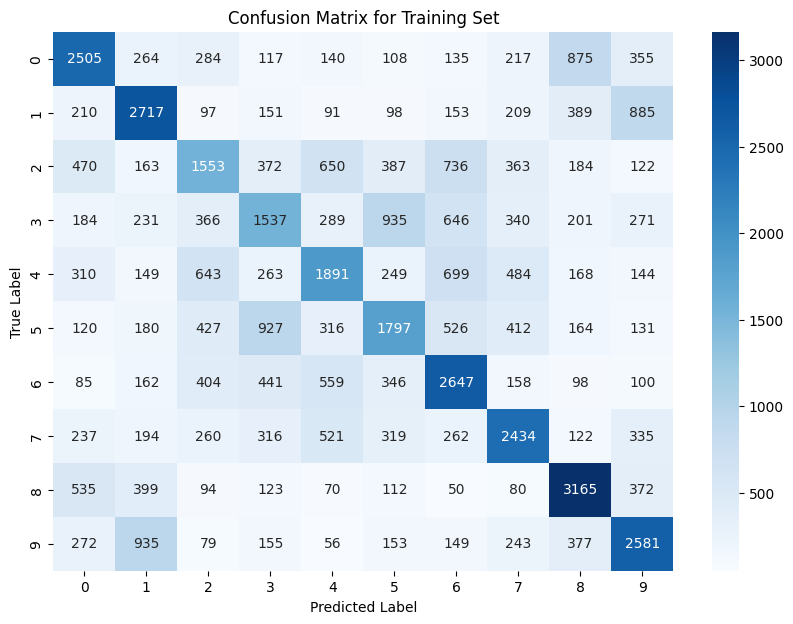

timecost:0.2628746032714844
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.51      0.50      0.50      5000
     Class 1       0.50      0.54      0.52      5000
     Class 2       0.37      0.31      0.34      5000
     Class 3       0.35      0.31      0.33      5000
     Class 4       0.41      0.38      0.39      5000
     Class 5       0.40      0.36      0.38      5000
     Class 6       0.44      0.53      0.48      5000
     Class 7       0.49      0.49      0.49      5000
     Class 8       0.55      0.63      0.59      5000
     Class 9       0.49      0.52      0.50      5000

    accuracy                           0.46     50000
   macro avg       0.45      0.46      0.45     50000
weighted avg       0.45      0.46      0.45     50000

timecost:247.40512347221375
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 par

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.22286, Test Accuracy: 0.2329, Loss: 2.414378509843407
Epoch 2, Train Accuracy: 0.27264, Test Accuracy: 0.2756, Loss: 2.1156582352604314
Epoch 3, Train Accuracy: 0.30216, Test Accuracy: 0.3052, Loss: 2.0084198792179957
Epoch 4, Train Accuracy: 0.32166, Test Accuracy: 0.3247, Loss: 1.9426449003959956
Epoch 5, Train Accuracy: 0.33764, Test Accuracy: 0.3407, Loss: 1.8963180820624088
Epoch 6, Train Accuracy: 0.34898, Test Accuracy: 0.3513, Loss: 1.8609503678009602
Epoch 7, Train Accuracy: 0.36018, Test Accuracy: 0.3626, Loss: 1.83255801472132
Epoch 8, Train Accuracy: 0.36708, Test Accuracy: 0.3696, Loss: 1.8089372297539503
Epoch 9, Train Accuracy: 0.37424, Test Accuracy: 0.3765, Loss: 1.7886493872991778
Epoch 10, Train Accuracy: 0.3801, Test Accuracy: 0.3808, Loss: 1.7708984181734961
Epoch 11, Train Accuracy: 0.38584, Test Accuracy: 0.3852, Loss: 1.7553948227188672
Epoch 12, Train Accuracy: 0.39008, Test Accuracy: 0.3884, Loss: 1.741223149282548
Epoch 13, Train Ac

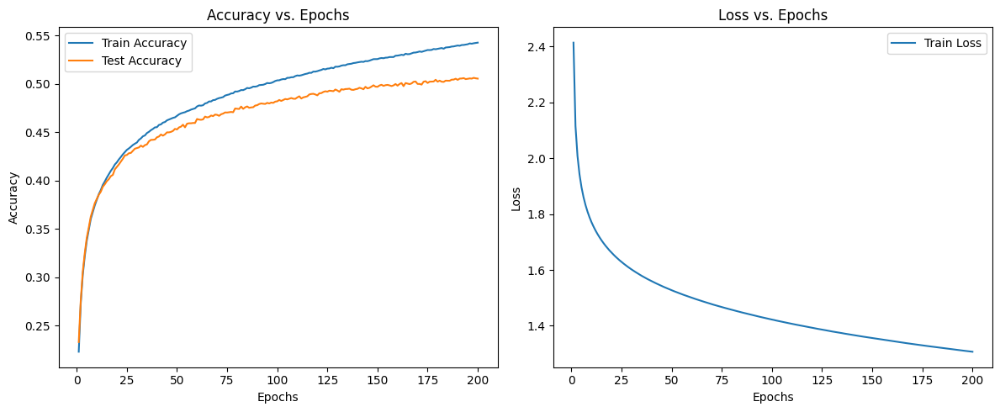

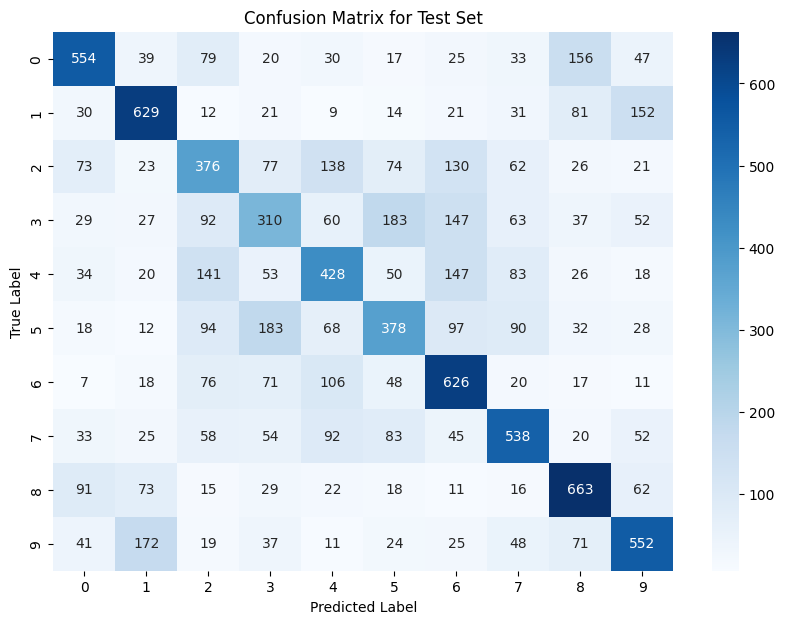

timecost:0.06482958793640137
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.61      0.55      0.58      1000
     Class 1       0.61      0.63      0.62      1000
     Class 2       0.39      0.38      0.38      1000
     Class 3       0.36      0.31      0.33      1000
     Class 4       0.44      0.43      0.44      1000
     Class 5       0.43      0.38      0.40      1000
     Class 6       0.49      0.63      0.55      1000
     Class 7       0.55      0.54      0.54      1000
     Class 8       0.59      0.66      0.62      1000
     Class 9       0.55      0.55      0.55      1000

    accuracy                           0.51     10000
   macro avg       0.50      0.51      0.50     10000
weighted avg       0.50      0.51      0.50     10000



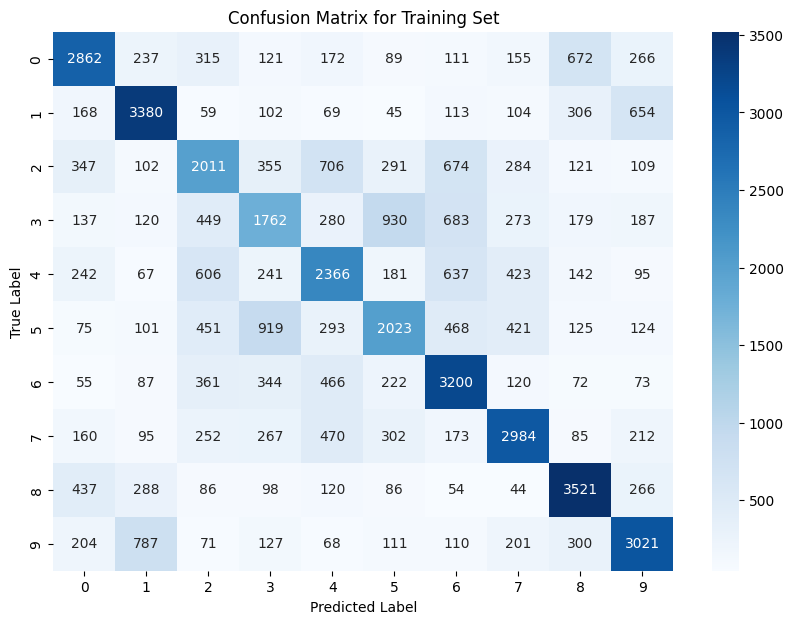

timecost:0.2622566223144531
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.61      0.57      0.59      5000
     Class 1       0.64      0.68      0.66      5000
     Class 2       0.43      0.40      0.42      5000
     Class 3       0.41      0.35      0.38      5000
     Class 4       0.47      0.47      0.47      5000
     Class 5       0.47      0.40      0.44      5000
     Class 6       0.51      0.64      0.57      5000
     Class 7       0.60      0.60      0.60      5000
     Class 8       0.64      0.70      0.67      5000
     Class 9       0.60      0.60      0.60      5000

    accuracy                           0.54     50000
   macro avg       0.54      0.54      0.54     50000
weighted avg       0.54      0.54      0.54     50000

timecost:251.47225761413574
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 par

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.27288, Test Accuracy: 0.2786, Loss: 2.2996146821566987
Epoch 2, Train Accuracy: 0.32676, Test Accuracy: 0.3323, Loss: 1.965709225091736
Epoch 3, Train Accuracy: 0.35028, Test Accuracy: 0.3522, Loss: 1.8706884319463777
Epoch 4, Train Accuracy: 0.36982, Test Accuracy: 0.3664, Loss: 1.8148471823740007
Epoch 5, Train Accuracy: 0.38178, Test Accuracy: 0.3814, Loss: 1.775413138209825
Epoch 6, Train Accuracy: 0.3924, Test Accuracy: 0.3897, Loss: 1.74508193021172
Epoch 7, Train Accuracy: 0.40134, Test Accuracy: 0.3951, Loss: 1.7203924213729198
Epoch 8, Train Accuracy: 0.40846, Test Accuracy: 0.4029, Loss: 1.6995580261653904
Epoch 9, Train Accuracy: 0.41452, Test Accuracy: 0.4112, Loss: 1.681261795860438
Epoch 10, Train Accuracy: 0.42048, Test Accuracy: 0.4148, Loss: 1.6651638363348213
Epoch 11, Train Accuracy: 0.42526, Test Accuracy: 0.4189, Loss: 1.6507245209101424
Epoch 12, Train Accuracy: 0.42972, Test Accuracy: 0.4238, Loss: 1.6378178165691444
Epoch 13, Train Acc

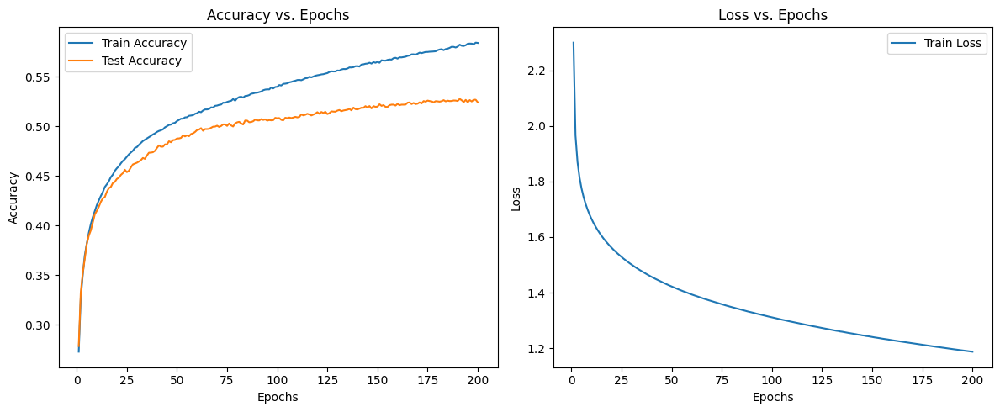

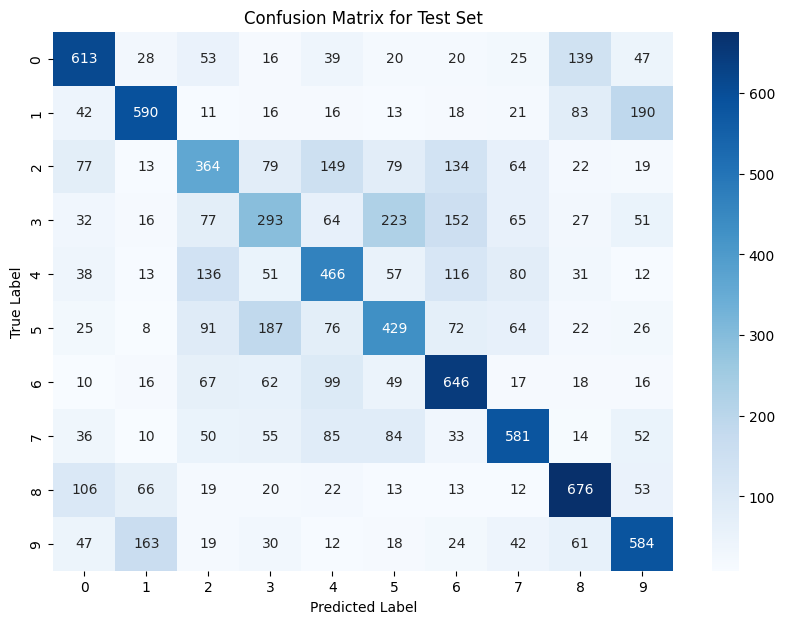

timecost:0.05260014533996582
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.60      0.61      0.61      1000
     Class 1       0.64      0.59      0.61      1000
     Class 2       0.41      0.36      0.39      1000
     Class 3       0.36      0.29      0.32      1000
     Class 4       0.45      0.47      0.46      1000
     Class 5       0.44      0.43      0.43      1000
     Class 6       0.53      0.65      0.58      1000
     Class 7       0.60      0.58      0.59      1000
     Class 8       0.62      0.68      0.65      1000
     Class 9       0.56      0.58      0.57      1000

    accuracy                           0.52     10000
   macro avg       0.52      0.52      0.52     10000
weighted avg       0.52      0.52      0.52     10000



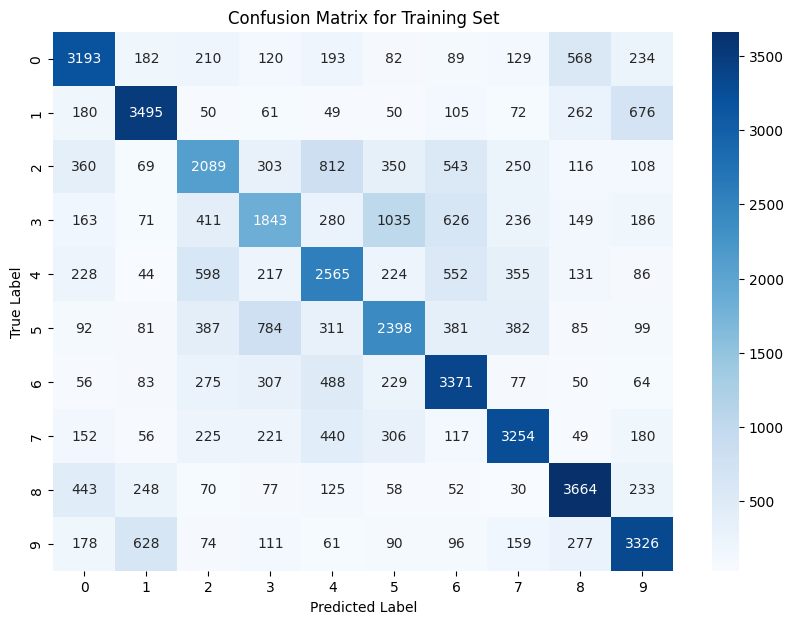

timecost:0.26677441596984863
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.63      0.64      0.64      5000
     Class 1       0.71      0.70      0.70      5000
     Class 2       0.48      0.42      0.44      5000
     Class 3       0.46      0.37      0.41      5000
     Class 4       0.48      0.51      0.50      5000
     Class 5       0.50      0.48      0.49      5000
     Class 6       0.57      0.67      0.62      5000
     Class 7       0.66      0.65      0.65      5000
     Class 8       0.68      0.73      0.71      5000
     Class 9       0.64      0.67      0.65      5000

    accuracy                           0.58     50000
   macro avg       0.58      0.58      0.58     50000
weighted avg       0.58      0.58      0.58     50000

timecost:253.76484513282776
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 pa

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.3798, Test Accuracy: 0.3778, Loss: 1.9818731381809978
Epoch 2, Train Accuracy: 0.4204, Test Accuracy: 0.4143, Loss: 1.7140523566267294
Epoch 3, Train Accuracy: 0.44058, Test Accuracy: 0.4283, Loss: 1.6370807227532542
Epoch 4, Train Accuracy: 0.45484, Test Accuracy: 0.4435, Loss: 1.5882362657995754
Epoch 5, Train Accuracy: 0.46424, Test Accuracy: 0.4512, Loss: 1.5507648794588567
Epoch 6, Train Accuracy: 0.4758, Test Accuracy: 0.4615, Loss: 1.5196042027117986
Epoch 7, Train Accuracy: 0.48532, Test Accuracy: 0.4645, Loss: 1.4946495885127573
Epoch 8, Train Accuracy: 0.49262, Test Accuracy: 0.4726, Loss: 1.4729032395740365
Epoch 9, Train Accuracy: 0.49698, Test Accuracy: 0.4786, Loss: 1.4540600698843096
Epoch 10, Train Accuracy: 0.50464, Test Accuracy: 0.4827, Loss: 1.4361081717310786
Epoch 11, Train Accuracy: 0.50678, Test Accuracy: 0.4864, Loss: 1.4217693971763927
Epoch 12, Train Accuracy: 0.51246, Test Accuracy: 0.4868, Loss: 1.4069394591390771
Epoch 13, Train 

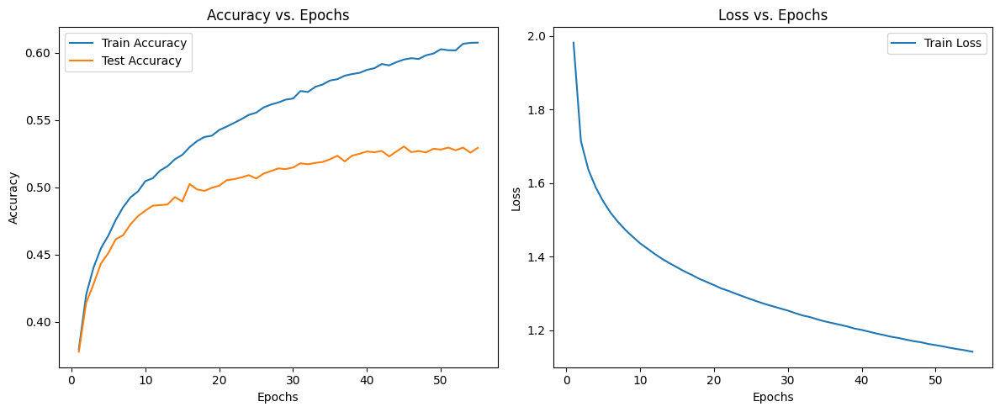

timecost:0.07938671112060547
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.60      0.64      0.62      1000
     Class 1       0.64      0.68      0.66      1000
     Class 2       0.43      0.33      0.37      1000
     Class 3       0.35      0.33      0.34      1000
     Class 4       0.46      0.52      0.49      1000
     Class 5       0.45      0.45      0.45      1000
     Class 6       0.54      0.66      0.60      1000
     Class 7       0.62      0.59      0.60      1000
     Class 8       0.65      0.66      0.65      1000
     Class 9       0.62      0.54      0.58      1000

    accuracy                           0.54     10000
   macro avg       0.54      0.54      0.54     10000
weighted avg       0.54      0.54      0.54     10000



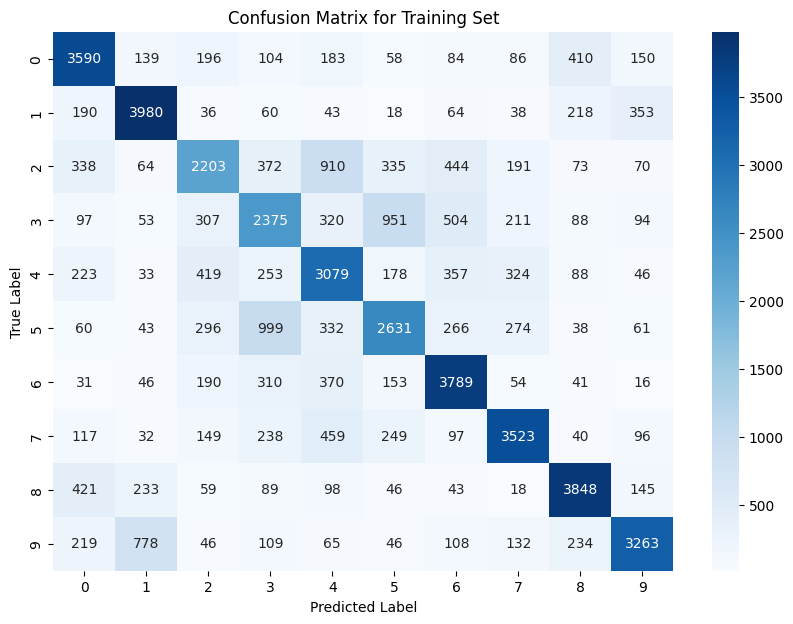

timecost:0.2723124027252197
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.68      0.72      0.70      5000
     Class 1       0.74      0.80      0.77      5000
     Class 2       0.56      0.44      0.50      5000
     Class 3       0.48      0.47      0.48      5000
     Class 4       0.53      0.62      0.57      5000
     Class 5       0.56      0.53      0.54      5000
     Class 6       0.66      0.76      0.70      5000
     Class 7       0.73      0.70      0.72      5000
     Class 8       0.76      0.77      0.76      5000
     Class 9       0.76      0.65      0.70      5000

    accuracy                           0.65     50000
   macro avg       0.65      0.65      0.64     50000
weighted avg       0.65      0.65      0.64     50000

timecost:78.92482352256775
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (DropoutLayer): No param

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.45984, Test Accuracy: 0.4533, Loss: 1.7417036908464902
Epoch 2, Train Accuracy: 0.4868, Test Accuracy: 0.4755, Loss: 1.5381724371189562
Epoch 3, Train Accuracy: 0.51508, Test Accuracy: 0.4941, Loss: 1.4644798913614394
Epoch 4, Train Accuracy: 0.52902, Test Accuracy: 0.5059, Loss: 1.4152327490766308
Epoch 5, Train Accuracy: 0.53748, Test Accuracy: 0.5057, Loss: 1.378531109287566
Epoch 6, Train Accuracy: 0.54922, Test Accuracy: 0.5097, Loss: 1.3470993075507294
Epoch 7, Train Accuracy: 0.5584, Test Accuracy: 0.5107, Loss: 1.3222655113860482
Epoch 8, Train Accuracy: 0.57018, Test Accuracy: 0.5214, Loss: 1.3052442617874151
Epoch 9, Train Accuracy: 0.57428, Test Accuracy: 0.5175, Loss: 1.2819621612530288
Epoch 10, Train Accuracy: 0.57988, Test Accuracy: 0.5213, Loss: 1.2669471664011505
Epoch 11, Train Accuracy: 0.59264, Test Accuracy: 0.5295, Loss: 1.251998881183879
Epoch 12, Train Accuracy: 0.58898, Test Accuracy: 0.522, Loss: 1.2421453636662598
Epoch 13, Train Ac

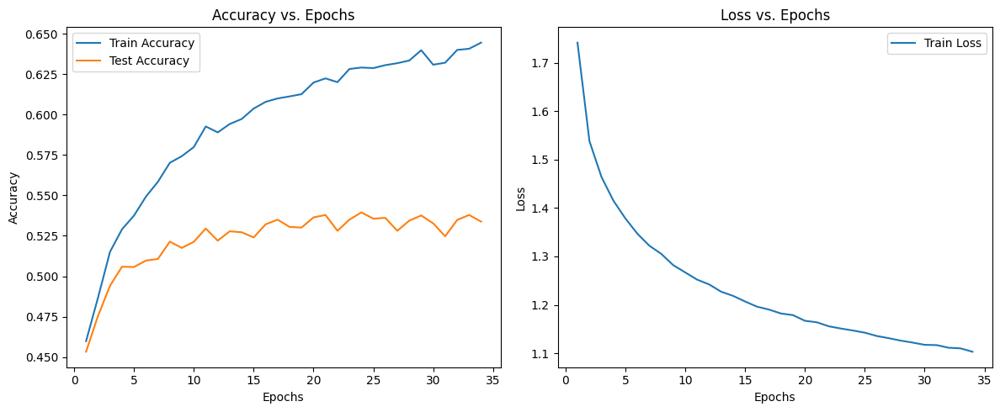

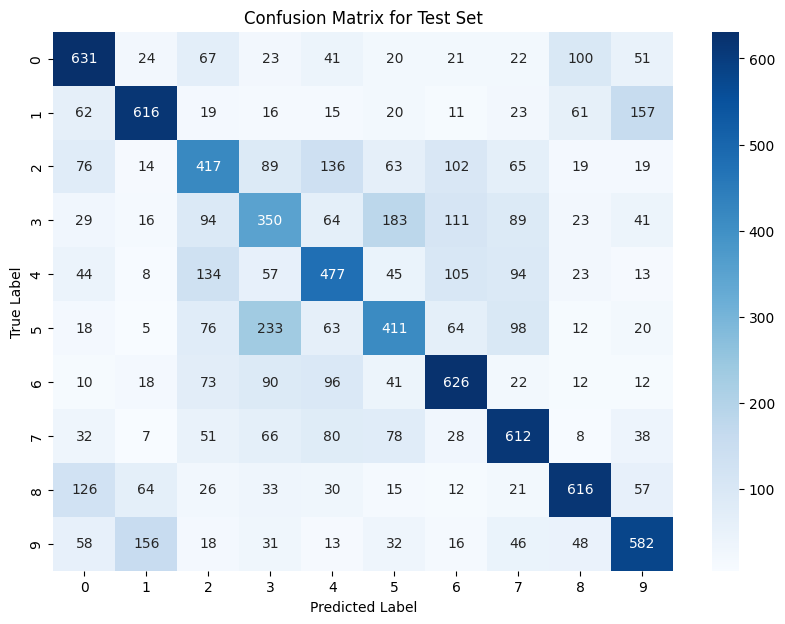

timecost:0.07457852363586426
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.58      0.63      0.60      1000
     Class 1       0.66      0.62      0.64      1000
     Class 2       0.43      0.42      0.42      1000
     Class 3       0.35      0.35      0.35      1000
     Class 4       0.47      0.48      0.47      1000
     Class 5       0.45      0.41      0.43      1000
     Class 6       0.57      0.63      0.60      1000
     Class 7       0.56      0.61      0.59      1000
     Class 8       0.67      0.62      0.64      1000
     Class 9       0.59      0.58      0.58      1000

    accuracy                           0.53     10000
   macro avg       0.53      0.53      0.53     10000
weighted avg       0.53      0.53      0.53     10000



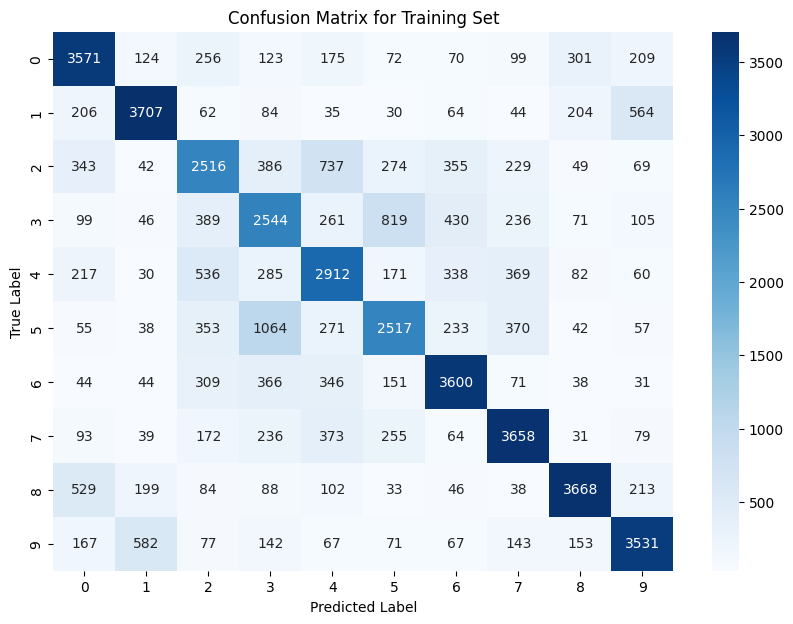

timecost:0.2669973373413086
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.67      0.71      0.69      5000
     Class 1       0.76      0.74      0.75      5000
     Class 2       0.53      0.50      0.52      5000
     Class 3       0.48      0.51      0.49      5000
     Class 4       0.55      0.58      0.57      5000
     Class 5       0.57      0.50      0.54      5000
     Class 6       0.68      0.72      0.70      5000
     Class 7       0.70      0.73      0.71      5000
     Class 8       0.79      0.73      0.76      5000
     Class 9       0.72      0.71      0.71      5000

    accuracy                           0.64     50000
   macro avg       0.65      0.64      0.64     50000
weighted avg       0.65      0.64      0.64     50000

timecost:67.37664842605591
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (DropoutLayer): No param

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.45928, Test Accuracy: 0.4529, Loss: 1.7179581503816557
Epoch 2, Train Accuracy: 0.49556, Test Accuracy: 0.4776, Loss: 1.5072913235288306
Epoch 3, Train Accuracy: 0.5222, Test Accuracy: 0.497, Loss: 1.4314164436591765
Epoch 4, Train Accuracy: 0.53052, Test Accuracy: 0.4976, Loss: 1.3828230580669596
Epoch 5, Train Accuracy: 0.5462, Test Accuracy: 0.5102, Loss: 1.345632640604198
Epoch 6, Train Accuracy: 0.55492, Test Accuracy: 0.5145, Loss: 1.3154496288462338
Epoch 7, Train Accuracy: 0.56532, Test Accuracy: 0.5221, Loss: 1.2882409700998574
Epoch 8, Train Accuracy: 0.57438, Test Accuracy: 0.5158, Loss: 1.2676025786518463
Epoch 9, Train Accuracy: 0.58336, Test Accuracy: 0.5262, Loss: 1.2465530592988325
Epoch 10, Train Accuracy: 0.58222, Test Accuracy: 0.5175, Loss: 1.2283982059232108
Epoch 11, Train Accuracy: 0.58088, Test Accuracy: 0.515, Loss: 1.216081444946126
Epoch 12, Train Accuracy: 0.59814, Test Accuracy: 0.5294, Loss: 1.2012075711868524
Epoch 13, Train Acc

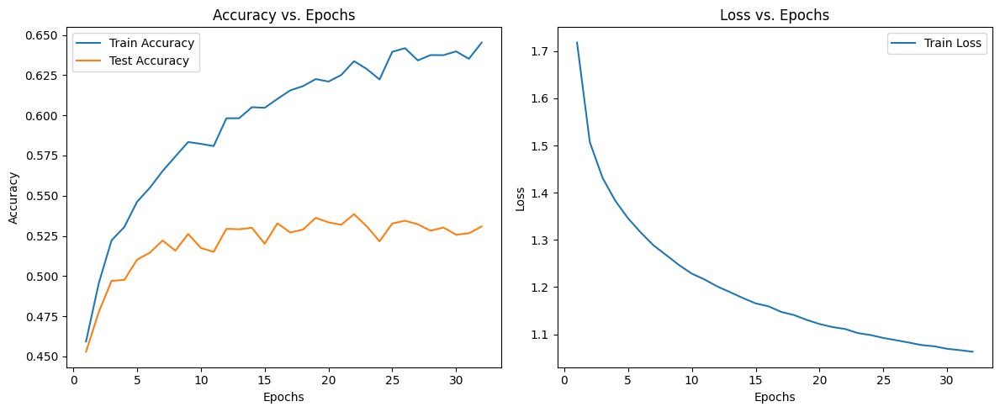

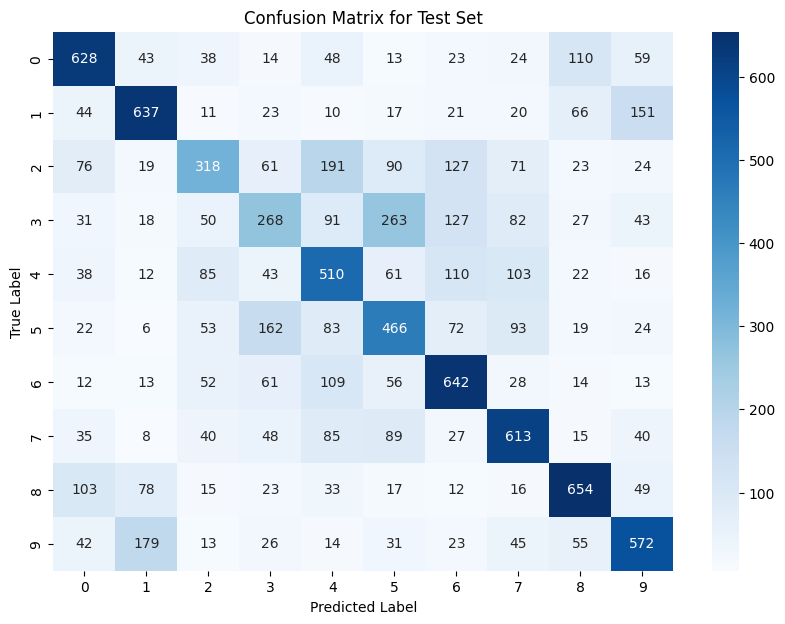

timecost:0.06537866592407227
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.61      0.63      0.62      1000
     Class 1       0.63      0.64      0.63      1000
     Class 2       0.47      0.32      0.38      1000
     Class 3       0.37      0.27      0.31      1000
     Class 4       0.43      0.51      0.47      1000
     Class 5       0.42      0.47      0.44      1000
     Class 6       0.54      0.64      0.59      1000
     Class 7       0.56      0.61      0.59      1000
     Class 8       0.65      0.65      0.65      1000
     Class 9       0.58      0.57      0.57      1000

    accuracy                           0.53     10000
   macro avg       0.53      0.53      0.53     10000
weighted avg       0.53      0.53      0.53     10000



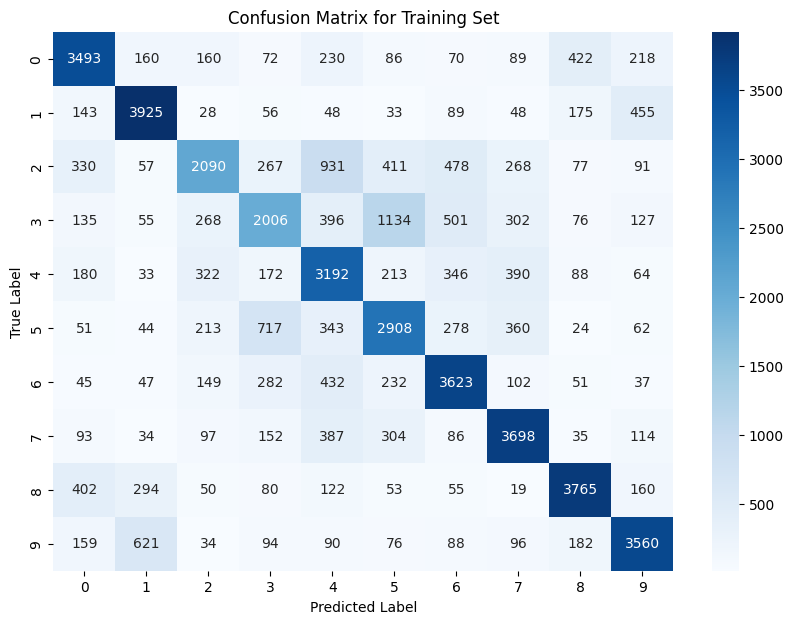

timecost:0.29122304916381836
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.69      0.70      0.70      5000
     Class 1       0.74      0.79      0.76      5000
     Class 2       0.61      0.42      0.50      5000
     Class 3       0.51      0.40      0.45      5000
     Class 4       0.52      0.64      0.57      5000
     Class 5       0.53      0.58      0.56      5000
     Class 6       0.65      0.72      0.68      5000
     Class 7       0.69      0.74      0.71      5000
     Class 8       0.77      0.75      0.76      5000
     Class 9       0.73      0.71      0.72      5000

    accuracy                           0.65     50000
   macro avg       0.64      0.65      0.64     50000
weighted avg       0.64      0.65      0.64     50000

timecost:53.049309968948364
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 pa

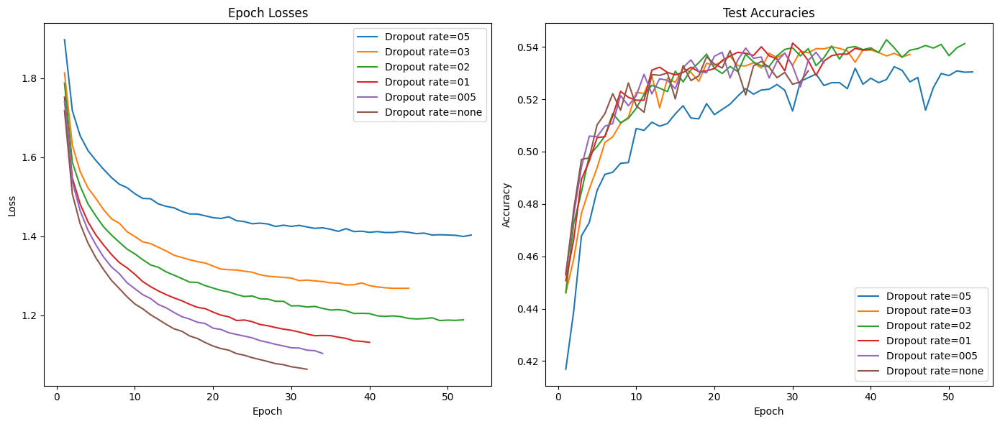

In [ ]:
model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_lr_0001 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=200,
                      learning_rate=0.001,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_lr_0001.mini_batch_train()
print("train_accuracies:",trainings_lr_0001.train_accuracies)
print("test_accuracies:",trainings_lr_0001.test_accuracies)
print("epoch_losses:",trainings_lr_0001.epoch_losses)
print("params_count:",trainings_lr_0001.params_count)
print("train_timecost:",trainings_lr_0001.train_timecost)
print("test_timecost:",trainings_lr_0001.test_timecost)
print("train_report:",trainings_lr_0001.train_report)
print("test_report:",trainings_lr_0001.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_lr_0005 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=200,
                      learning_rate=0.005,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_lr_0005.mini_batch_train()
print("train_accuracies:",trainings_lr_0005.train_accuracies)
print("test_accuracies:",trainings_lr_0005.test_accuracies)
print("epoch_losses:",trainings_lr_0005.epoch_losses)
print("params_count:",trainings_lr_0005.params_count)
print("train_timecost:",trainings_lr_0005.train_timecost)
print("test_timecost:",trainings_lr_0005.test_timecost)
print("train_report:",trainings_lr_0005.train_report)
print("test_report:",trainings_lr_0005.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_lr_001 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=200,
                      learning_rate=0.01,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_lr_001.mini_batch_train()
print("train_accuracies:",trainings_lr_001.train_accuracies)
print("test_accuracies:",trainings_lr_001.test_accuracies)
print("epoch_losses:",trainings_lr_001.epoch_losses)
print("params_count:",trainings_lr_001.params_count)
print("train_timecost:",trainings_lr_001.train_timecost)
print("test_timecost:",trainings_lr_001.test_timecost)
print("train_report:",trainings_lr_001.train_report)
print("test_report:",trainings_lr_001.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_lr_005 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=200,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_lr_005.mini_batch_train()
print("train_accuracies:",trainings_lr_005.train_accuracies)
print("test_accuracies:",trainings_lr_005.test_accuracies)
print("epoch_losses:",trainings_lr_005.epoch_losses)
print("params_count:",trainings_lr_005.params_count)
print("train_timecost:",trainings_lr_005.train_timecost)
print("test_timecost:",trainings_lr_005.test_timecost)
print("train_report:",trainings_lr_005.train_report)
print("test_report:",trainings_lr_005.test_report)

epoch_losses = {
    '0.001': trainings_lr_0001.epoch_losses,
    '0.005': trainings_lr_0005.epoch_losses,
    '0.01': trainings_lr_001.epoch_losses,
    '0.05': trainings_lr_005.epoch_losses
}

test_accuracies = {
    '0.001': trainings_lr_0001.test_accuracies,
    '0.005': trainings_lr_0005.test_accuracies,
    '0.01': trainings_lr_001.test_accuracies,
    '0.05': trainings_lr_005.test_accuracies
}

plot_training_results(epoch_losses, test_accuracies, 'Learning Rate')


### Weight decay

Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 parameters
Layer 3 (SoftmaxLayer): No parameters or `param_count` method not implemented.
Total parameters: 17802


<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.45586, Test Accuracy: 0.4481, Loss: 1.723001596337799
Epoch 2, Train Accuracy: 0.49582, Test Accuracy: 0.4749, Loss: 1.5083322895933193
Epoch 3, Train Accuracy: 0.52142, Test Accuracy: 0.4956, Loss: 1.43120498667872
Epoch 4, Train Accuracy: 0.53604, Test Accuracy: 0.504, Loss: 1.379879749166647
Epoch 5, Train Accuracy: 0.54498, Test Accuracy: 0.5101, Loss: 1.3435675878750697
Epoch 6, Train Accuracy: 0.55742, Test Accuracy: 0.5112, Loss: 1.3134720498931192
Epoch 7, Train Accuracy: 0.56346, Test Accuracy: 0.5136, Loss: 1.288442961189054
Epoch 8, Train Accuracy: 0.5736, Test Accuracy: 0.5149, Loss: 1.2666695237684895
Epoch 9, Train Accuracy: 0.5743, Test Accuracy: 0.5128, Loss: 1.2465616779085993
Epoch 10, Train Accuracy: 0.57912, Test Accuracy: 0.5104, Loss: 1.2312272352974543
Epoch 11, Train Accuracy: 0.5879, Test Accuracy: 0.5148, Loss: 1.2183006751400538
Epoch 12, Train Accuracy: 0.59712, Test Accuracy: 0.5243, Loss: 1.2046705853649498
Epoch 13, Train Accura

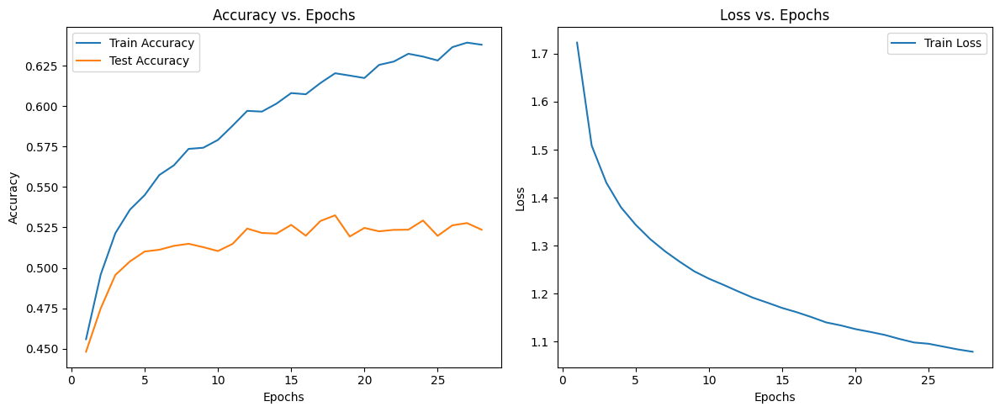

timecost:0.050759315490722656
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.59      0.61      0.60      1000
     Class 1       0.65      0.60      0.63      1000
     Class 2       0.41      0.37      0.39      1000
     Class 3       0.39      0.29      0.33      1000
     Class 4       0.47      0.47      0.47      1000
     Class 5       0.43      0.42      0.42      1000
     Class 6       0.54      0.67      0.60      1000
     Class 7       0.57      0.60      0.59      1000
     Class 8       0.63      0.64      0.64      1000
     Class 9       0.57      0.60      0.59      1000

    accuracy                           0.53     10000
   macro avg       0.52      0.53      0.53     10000
weighted avg       0.52      0.53      0.53     10000



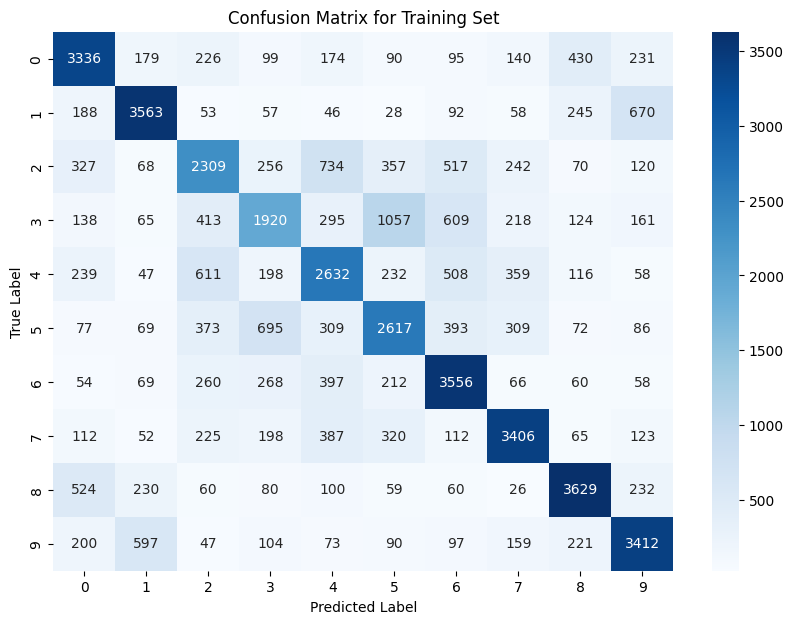

timecost:0.2656559944152832
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.64      0.67      0.65      5000
     Class 1       0.72      0.71      0.72      5000
     Class 2       0.50      0.46      0.48      5000
     Class 3       0.50      0.38      0.43      5000
     Class 4       0.51      0.53      0.52      5000
     Class 5       0.52      0.52      0.52      5000
     Class 6       0.59      0.71      0.64      5000
     Class 7       0.68      0.68      0.68      5000
     Class 8       0.72      0.73      0.72      5000
     Class 9       0.66      0.68      0.67      5000

    accuracy                           0.61     50000
   macro avg       0.60      0.61      0.60     50000
weighted avg       0.60      0.61      0.60     50000

timecost:68.8098714351654
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 param

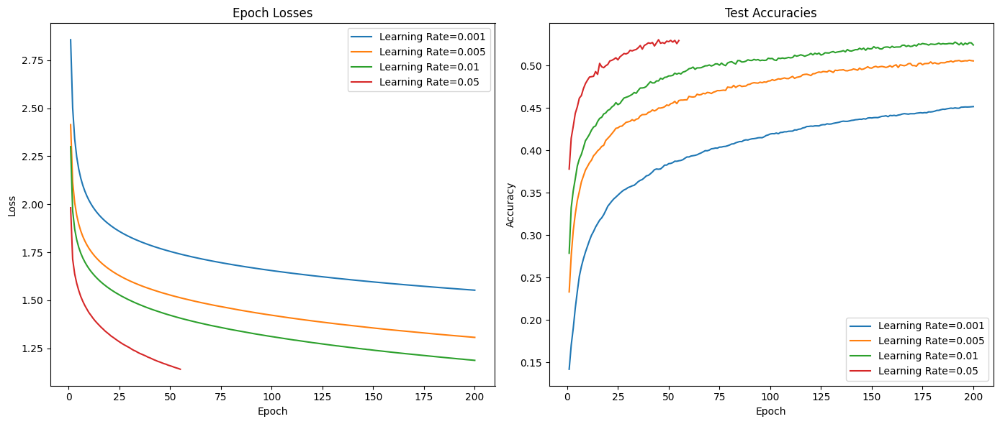

In [ ]:

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_wd_none = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_wd_none.mini_batch_train()
print("train_accuracies:",trainings_wd_none.train_accuracies)
print("test_accuracies:",trainings_wd_none.test_accuracies)
print("epoch_losses:",trainings_wd_none.epoch_losses)
print("params_count:",trainings_wd_none.params_count)
print("train_timecost:",trainings_wd_none.train_timecost)
print("test_timecost:",trainings_wd_none.test_timecost)
print("train_report:",trainings_wd_none.train_report)
print("test_report:",trainings_wd_none.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_wd_0001 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.9,
                      patience=10)
trainings_wd_0001.mini_batch_train()
print("train_accuracies:",trainings_wd_0001.train_accuracies)
print("test_accuracies:",trainings_wd_0001.test_accuracies)
print("epoch_losses:",trainings_wd_0001.epoch_losses)
print("params_count:",trainings_wd_0001.params_count)
print("train_timecost:",trainings_wd_0001.train_timecost)
print("test_timecost:",trainings_wd_0001.test_timecost)
print("train_report:",trainings_wd_0001.train_report)
print("test_report:",trainings_wd_0001.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_wd_001 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.01,
                      mu=0.9,
                      patience=10)
trainings_wd_001.mini_batch_train()
print("train_accuracies:",trainings_wd_001.train_accuracies)
print("test_accuracies:",trainings_wd_001.test_accuracies)
print("epoch_losses:",trainings_wd_001.epoch_losses)
print("params_count:",trainings_wd_001.params_count)
print("train_timecost:",trainings_wd_001.train_timecost)
print("test_timecost:",trainings_wd_001.test_timecost)
print("train_report:",trainings_wd_001.train_report)
print("test_report:",trainings_wd_001.test_report)


model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_wd_01 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.1,
                      mu=0.9,
                      patience=10)
trainings_wd_01.mini_batch_train()
print("train_accuracies:",trainings_wd_01.train_accuracies)
print("test_accuracies:",trainings_wd_01.test_accuracies)
print("epoch_losses:",trainings_wd_01.epoch_losses)
print("params_count:",trainings_wd_01.params_count)
print("train_timecost:",trainings_wd_01.train_timecost)
print("test_timecost:",trainings_wd_01.test_timecost)
print("train_report:",trainings_wd_01.train_report)
print("test_report:",trainings_wd_01.test_report)

epoch_losses = {
"0001":trainings_wd_0001.epoch_losses,
"001":trainings_wd_001.epoch_losses,
"01":trainings_wd_01.epoch_losses,
"None":trainings_wd_none.epoch_losses
}

test_accuracies = {
"0001":trainings_wd_0001.test_accuracies,
"001":trainings_wd_001.test_accuracies,
"01":trainings_wd_01.test_accuracies,
"None":trainings_wd_none.test_accuracies
}
plot_training_results(epoch_losses, test_accuracies, 'Weight decay')

### Batch size

Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 parameters
Layer 3 (SoftmaxLayer): No parameters or `param_count` method not implemented.
Total parameters: 17802


<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.37816, Test Accuracy: 0.3766, Loss: 1.972583096355255
Epoch 2, Train Accuracy: 0.4185, Test Accuracy: 0.4142, Loss: 1.7098887899068327
Epoch 3, Train Accuracy: 0.43794, Test Accuracy: 0.4329, Loss: 1.6324273614820919
Epoch 4, Train Accuracy: 0.4533, Test Accuracy: 0.4428, Loss: 1.5832101717888127
Epoch 5, Train Accuracy: 0.46326, Test Accuracy: 0.4506, Loss: 1.546760243560497
Epoch 6, Train Accuracy: 0.47502, Test Accuracy: 0.4618, Loss: 1.5181217100196978
Epoch 7, Train Accuracy: 0.48216, Test Accuracy: 0.4718, Loss: 1.4934989142050772
Epoch 8, Train Accuracy: 0.48968, Test Accuracy: 0.4721, Loss: 1.4725719987222805
Epoch 9, Train Accuracy: 0.49694, Test Accuracy: 0.4791, Loss: 1.453377223972474
Epoch 10, Train Accuracy: 0.5033, Test Accuracy: 0.4787, Loss: 1.4369002452762947
Epoch 11, Train Accuracy: 0.50696, Test Accuracy: 0.4847, Loss: 1.4214611911796997
Epoch 12, Train Accuracy: 0.51338, Test Accuracy: 0.4868, Loss: 1.4080665686267622
Epoch 13, Train Acc

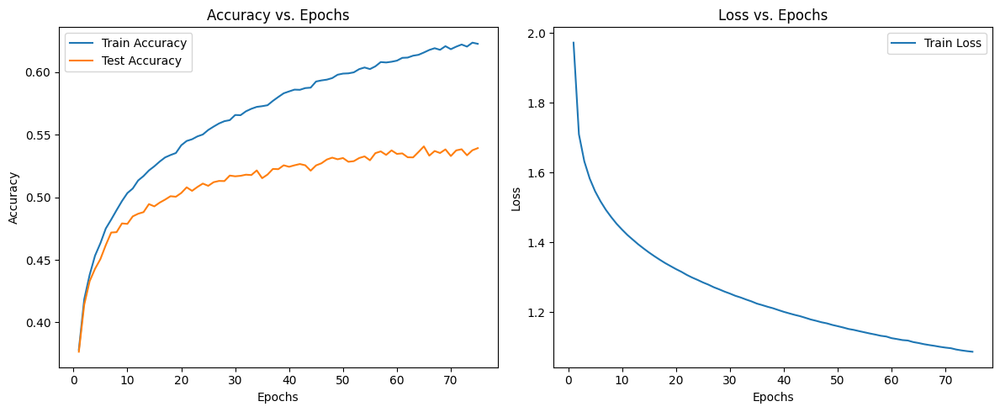

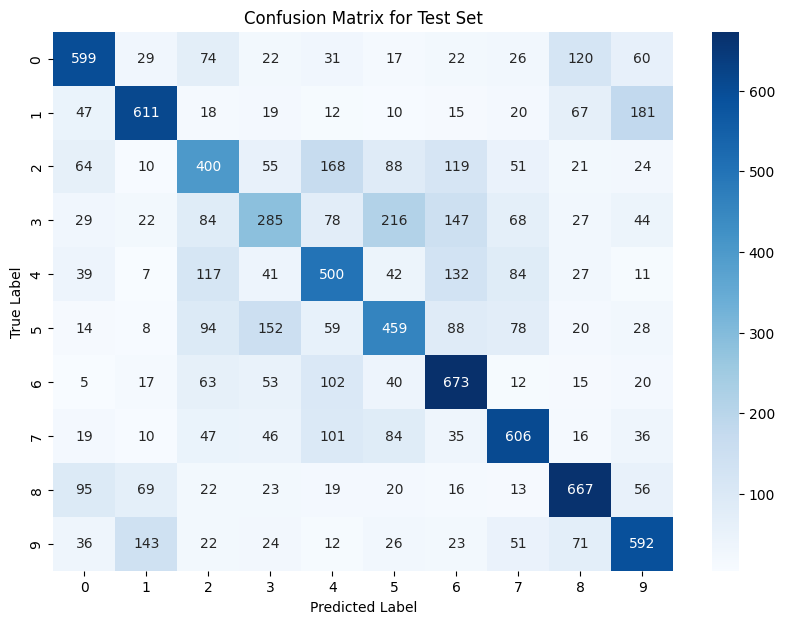

timecost:0.05272316932678223
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.63      0.60      0.62      1000
     Class 1       0.66      0.61      0.63      1000
     Class 2       0.43      0.40      0.41      1000
     Class 3       0.40      0.28      0.33      1000
     Class 4       0.46      0.50      0.48      1000
     Class 5       0.46      0.46      0.46      1000
     Class 6       0.53      0.67      0.59      1000
     Class 7       0.60      0.61      0.60      1000
     Class 8       0.63      0.67      0.65      1000
     Class 9       0.56      0.59      0.58      1000

    accuracy                           0.54     10000
   macro avg       0.54      0.54      0.54     10000
weighted avg       0.54      0.54      0.54     10000



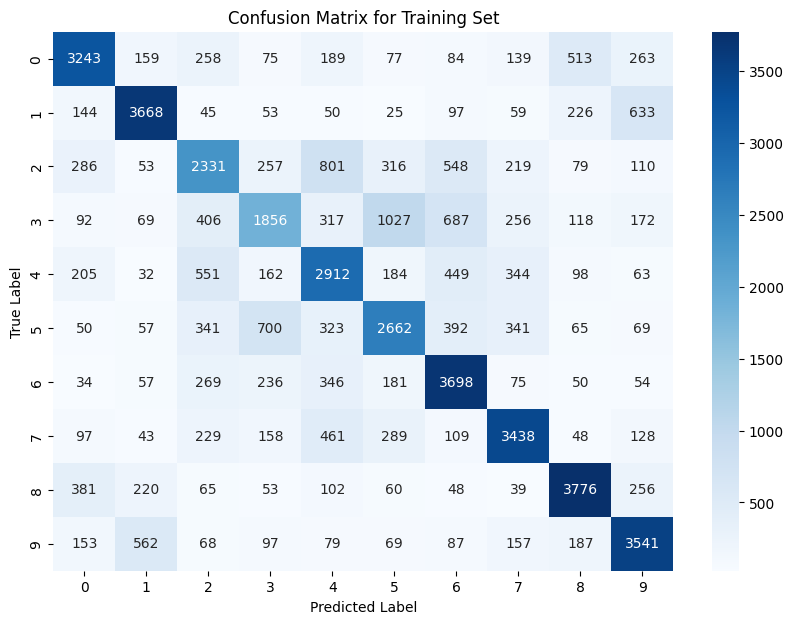

timecost:0.2785067558288574
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.69      0.65      0.67      5000
     Class 1       0.75      0.73      0.74      5000
     Class 2       0.51      0.47      0.49      5000
     Class 3       0.51      0.37      0.43      5000
     Class 4       0.52      0.58      0.55      5000
     Class 5       0.54      0.53      0.54      5000
     Class 6       0.60      0.74      0.66      5000
     Class 7       0.68      0.69      0.68      5000
     Class 8       0.73      0.76      0.74      5000
     Class 9       0.67      0.71      0.69      5000

    accuracy                           0.62     50000
   macro avg       0.62      0.62      0.62     50000
weighted avg       0.62      0.62      0.62     50000

timecost:93.7550859451294
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 param

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.41132, Test Accuracy: 0.4048, Loss: 1.8550989468142556
Epoch 2, Train Accuracy: 0.44858, Test Accuracy: 0.4379, Loss: 1.6266035665955465
Epoch 3, Train Accuracy: 0.46988, Test Accuracy: 0.4572, Loss: 1.551802826402071
Epoch 4, Train Accuracy: 0.48352, Test Accuracy: 0.4701, Loss: 1.500761425708568
Epoch 5, Train Accuracy: 0.49636, Test Accuracy: 0.478, Loss: 1.4627737426641365
Epoch 6, Train Accuracy: 0.5065, Test Accuracy: 0.4866, Loss: 1.4335612612707926
Epoch 7, Train Accuracy: 0.5187, Test Accuracy: 0.4904, Loss: 1.4074894419909807
Epoch 8, Train Accuracy: 0.52076, Test Accuracy: 0.4962, Loss: 1.3853177663965857
Epoch 9, Train Accuracy: 0.52882, Test Accuracy: 0.4991, Loss: 1.3664053906072946
Epoch 10, Train Accuracy: 0.5363, Test Accuracy: 0.5026, Loss: 1.3482169889355937
Epoch 11, Train Accuracy: 0.5374, Test Accuracy: 0.5037, Loss: 1.3323135181062502
Epoch 12, Train Accuracy: 0.54818, Test Accuracy: 0.511, Loss: 1.31687629180632
Epoch 13, Train Accurac

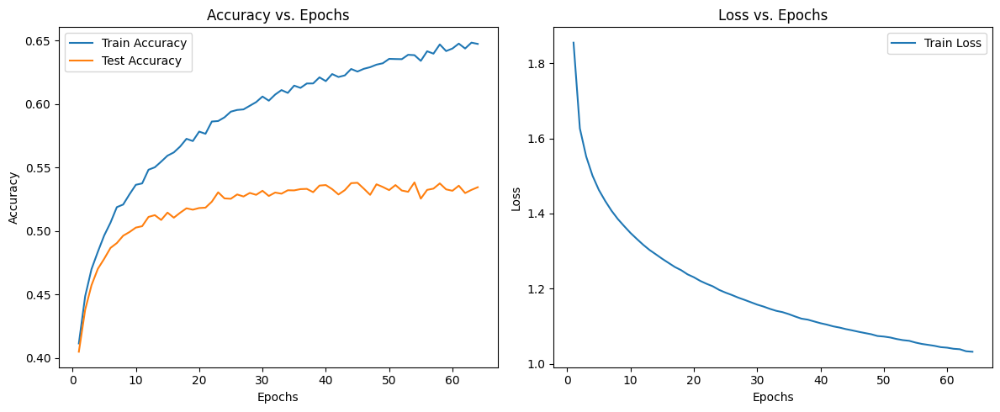

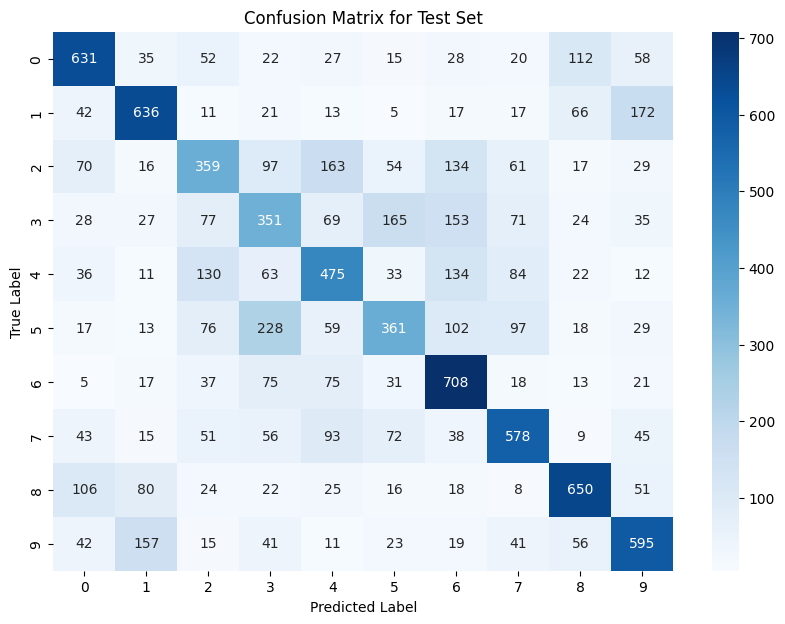

timecost:0.05294990539550781
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.62      0.63      0.62      1000
     Class 1       0.63      0.64      0.63      1000
     Class 2       0.43      0.36      0.39      1000
     Class 3       0.36      0.35      0.36      1000
     Class 4       0.47      0.47      0.47      1000
     Class 5       0.47      0.36      0.41      1000
     Class 6       0.52      0.71      0.60      1000
     Class 7       0.58      0.58      0.58      1000
     Class 8       0.66      0.65      0.65      1000
     Class 9       0.57      0.59      0.58      1000

    accuracy                           0.53     10000
   macro avg       0.53      0.53      0.53     10000
weighted avg       0.53      0.53      0.53     10000



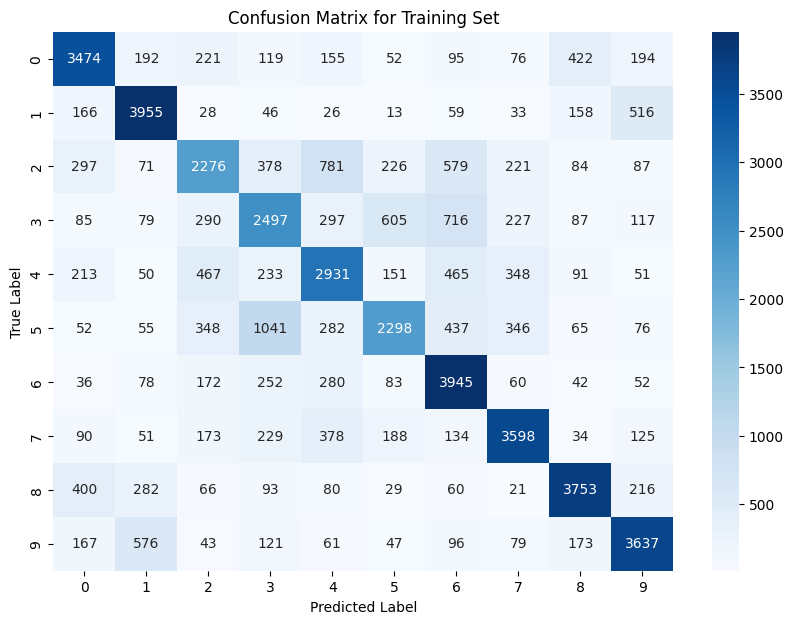

timecost:0.2666587829589844
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.70      0.69      0.70      5000
     Class 1       0.73      0.79      0.76      5000
     Class 2       0.56      0.46      0.50      5000
     Class 3       0.50      0.50      0.50      5000
     Class 4       0.56      0.59      0.57      5000
     Class 5       0.62      0.46      0.53      5000
     Class 6       0.60      0.79      0.68      5000
     Class 7       0.72      0.72      0.72      5000
     Class 8       0.76      0.75      0.76      5000
     Class 9       0.72      0.73      0.72      5000

    accuracy                           0.65     50000
   macro avg       0.65      0.65      0.64     50000
weighted avg       0.65      0.65      0.64     50000

timecost:96.53334403038025
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 para

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.36942, Test Accuracy: 0.3738, Loss: 2.023097691621959
Epoch 2, Train Accuracy: 0.4069, Test Accuracy: 0.4113, Loss: 1.7441527708631182
Epoch 3, Train Accuracy: 0.42872, Test Accuracy: 0.4272, Loss: 1.6676057020108497
Epoch 4, Train Accuracy: 0.44346, Test Accuracy: 0.4411, Loss: 1.6188244394251587
Epoch 5, Train Accuracy: 0.45456, Test Accuracy: 0.4466, Loss: 1.583563806906556
Epoch 6, Train Accuracy: 0.4638, Test Accuracy: 0.4549, Loss: 1.5550039826193258
Epoch 7, Train Accuracy: 0.47258, Test Accuracy: 0.466, Loss: 1.5314775878539595
Epoch 8, Train Accuracy: 0.47978, Test Accuracy: 0.4676, Loss: 1.5105070288267317
Epoch 9, Train Accuracy: 0.4856, Test Accuracy: 0.4728, Loss: 1.4921391415780294
Epoch 10, Train Accuracy: 0.49184, Test Accuracy: 0.4741, Loss: 1.4752685989115057
Epoch 11, Train Accuracy: 0.49412, Test Accuracy: 0.4809, Loss: 1.4601355812396548
Epoch 12, Train Accuracy: 0.50126, Test Accuracy: 0.4852, Loss: 1.4469353287411235
Epoch 13, Train Acc

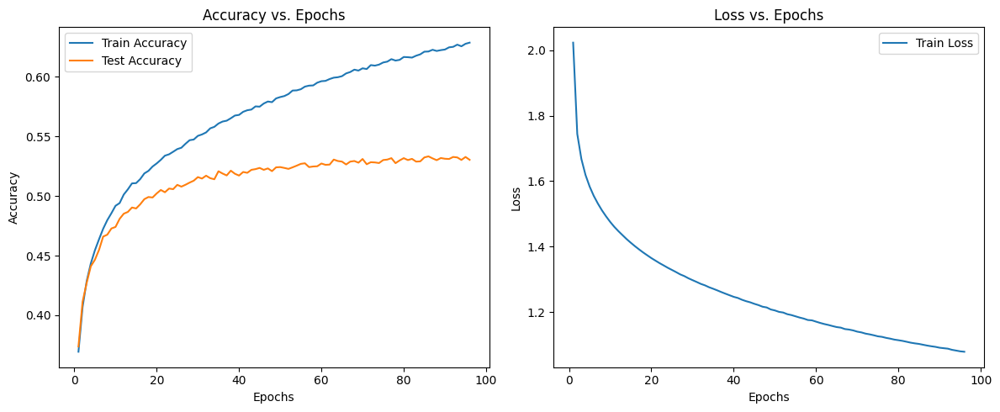

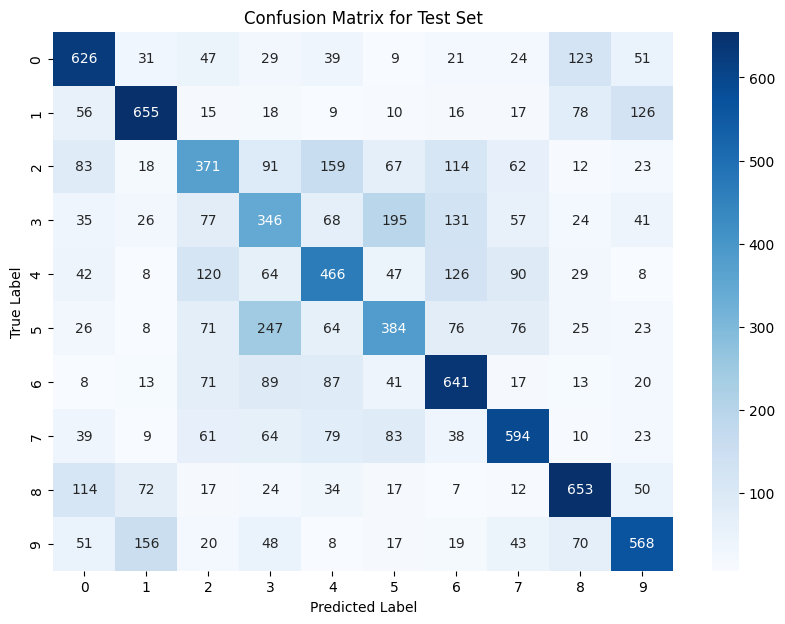

timecost:0.0526585578918457
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.58      0.63      0.60      1000
     Class 1       0.66      0.66      0.66      1000
     Class 2       0.43      0.37      0.40      1000
     Class 3       0.34      0.35      0.34      1000
     Class 4       0.46      0.47      0.46      1000
     Class 5       0.44      0.38      0.41      1000
     Class 6       0.54      0.64      0.59      1000
     Class 7       0.60      0.59      0.60      1000
     Class 8       0.63      0.65      0.64      1000
     Class 9       0.61      0.57      0.59      1000

    accuracy                           0.53     10000
   macro avg       0.53      0.53      0.53     10000
weighted avg       0.53      0.53      0.53     10000



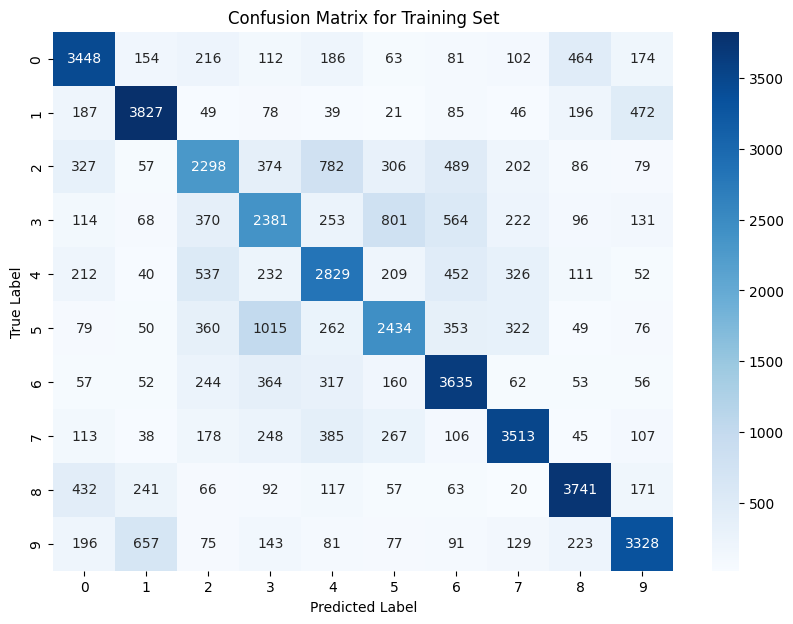

timecost:0.27021002769470215
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.67      0.69      0.68      5000
     Class 1       0.74      0.77      0.75      5000
     Class 2       0.52      0.46      0.49      5000
     Class 3       0.47      0.48      0.47      5000
     Class 4       0.54      0.57      0.55      5000
     Class 5       0.55      0.49      0.52      5000
     Class 6       0.61      0.73      0.67      5000
     Class 7       0.71      0.70      0.71      5000
     Class 8       0.74      0.75      0.74      5000
     Class 9       0.72      0.67      0.69      5000

    accuracy                           0.63     50000
   macro avg       0.63      0.63      0.63     50000
weighted avg       0.63      0.63      0.63     50000

timecost:116.62777709960938
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 pa

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.40108, Test Accuracy: 0.3975, Loss: 1.9003422563690018
Epoch 2, Train Accuracy: 0.44094, Test Accuracy: 0.4331, Loss: 1.658798836962225
Epoch 3, Train Accuracy: 0.45984, Test Accuracy: 0.4511, Loss: 1.5821823660541023
Epoch 4, Train Accuracy: 0.47398, Test Accuracy: 0.464, Loss: 1.5345200578757958
Epoch 5, Train Accuracy: 0.48642, Test Accuracy: 0.4742, Loss: 1.4986632450877877
Epoch 6, Train Accuracy: 0.49612, Test Accuracy: 0.4784, Loss: 1.46755350604082
Epoch 7, Train Accuracy: 0.50422, Test Accuracy: 0.483, Loss: 1.4417833176038386
Epoch 8, Train Accuracy: 0.51248, Test Accuracy: 0.4888, Loss: 1.4203883353251805
Epoch 9, Train Accuracy: 0.51676, Test Accuracy: 0.4936, Loss: 1.3992922394448521
Epoch 10, Train Accuracy: 0.52622, Test Accuracy: 0.4961, Loss: 1.3823000536895387
Epoch 11, Train Accuracy: 0.52884, Test Accuracy: 0.4992, Loss: 1.365743854523026
Epoch 12, Train Accuracy: 0.53284, Test Accuracy: 0.5022, Loss: 1.3511420344847758
Epoch 13, Train Acc

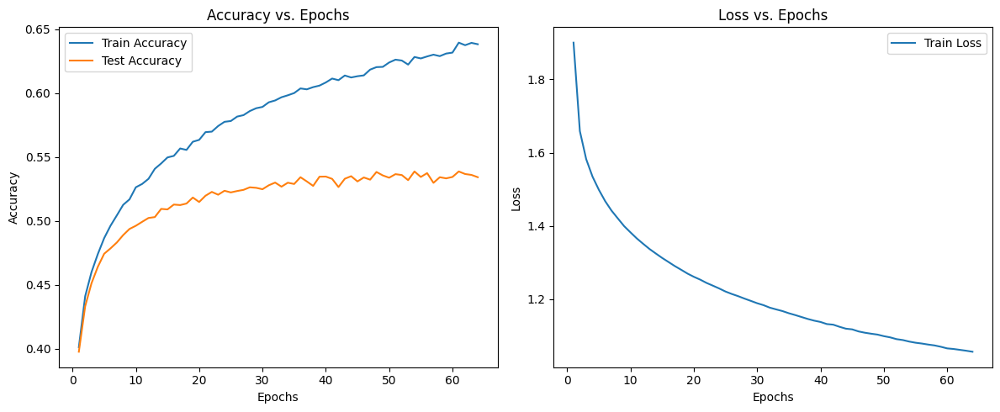

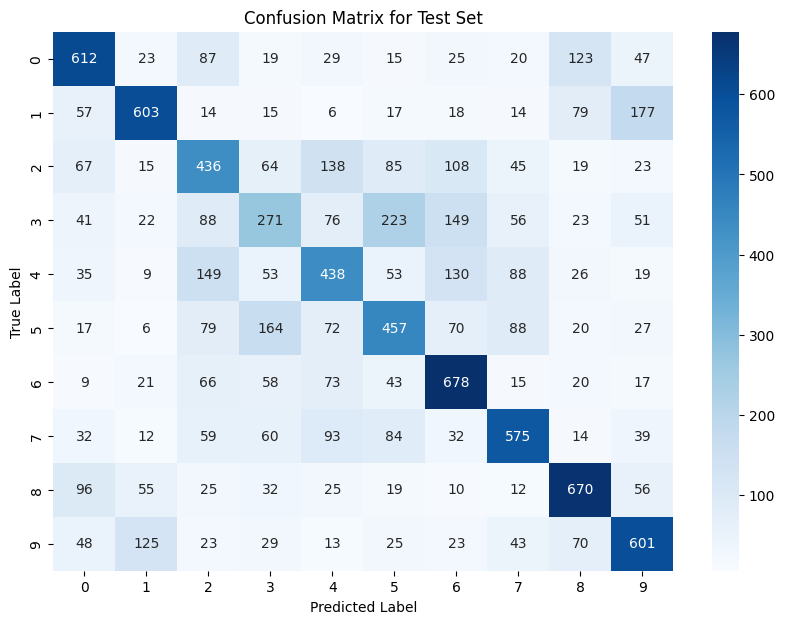

timecost:0.053865671157836914
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.60      0.61      0.61      1000
     Class 1       0.68      0.60      0.64      1000
     Class 2       0.42      0.44      0.43      1000
     Class 3       0.35      0.27      0.31      1000
     Class 4       0.45      0.44      0.45      1000
     Class 5       0.45      0.46      0.45      1000
     Class 6       0.55      0.68      0.60      1000
     Class 7       0.60      0.57      0.59      1000
     Class 8       0.63      0.67      0.65      1000
     Class 9       0.57      0.60      0.58      1000

    accuracy                           0.53     10000
   macro avg       0.53      0.53      0.53     10000
weighted avg       0.53      0.53      0.53     10000



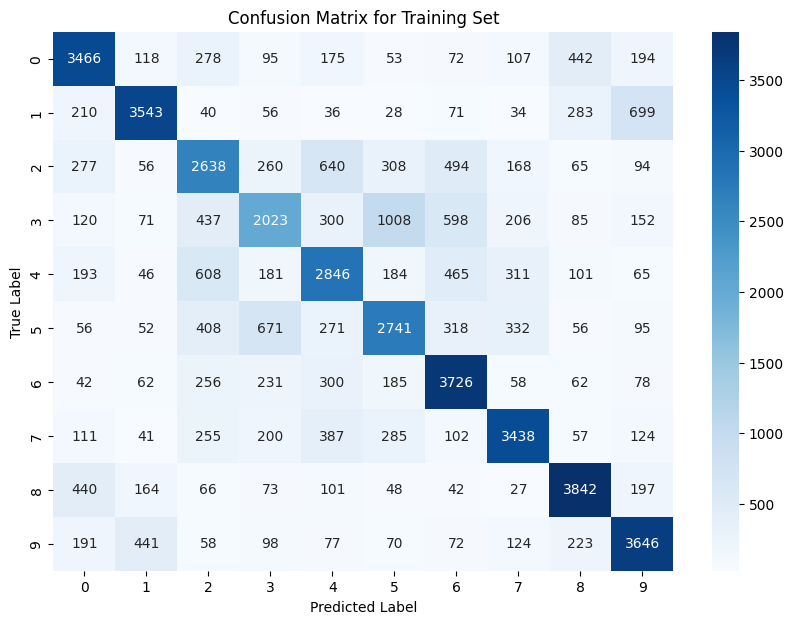

timecost:0.27083826065063477
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.68      0.69      0.69      5000
     Class 1       0.77      0.71      0.74      5000
     Class 2       0.52      0.53      0.53      5000
     Class 3       0.52      0.40      0.46      5000
     Class 4       0.55      0.57      0.56      5000
     Class 5       0.56      0.55      0.55      5000
     Class 6       0.63      0.75      0.68      5000
     Class 7       0.72      0.69      0.70      5000
     Class 8       0.74      0.77      0.75      5000
     Class 9       0.68      0.73      0.70      5000

    accuracy                           0.64     50000
   macro avg       0.64      0.64      0.64     50000
weighted avg       0.64      0.64      0.64     50000

timecost:90.52580761909485
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 par

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.43866, Test Accuracy: 0.4311, Loss: 1.7859063869121035
Epoch 2, Train Accuracy: 0.47282, Test Accuracy: 0.4544, Loss: 1.5656143223032062
Epoch 3, Train Accuracy: 0.48938, Test Accuracy: 0.4708, Loss: 1.490845933103041
Epoch 4, Train Accuracy: 0.50704, Test Accuracy: 0.4856, Loss: 1.44477791786672
Epoch 5, Train Accuracy: 0.52148, Test Accuracy: 0.4941, Loss: 1.407966423020487
Epoch 6, Train Accuracy: 0.5258, Test Accuracy: 0.4958, Loss: 1.3771422066401036
Epoch 7, Train Accuracy: 0.53816, Test Accuracy: 0.5041, Loss: 1.3526021558726036
Epoch 8, Train Accuracy: 0.5467, Test Accuracy: 0.5104, Loss: 1.3305818907818698
Epoch 9, Train Accuracy: 0.55036, Test Accuracy: 0.507, Loss: 1.3103684056196598
Epoch 10, Train Accuracy: 0.55674, Test Accuracy: 0.5144, Loss: 1.293543877015775
Epoch 11, Train Accuracy: 0.56368, Test Accuracy: 0.5132, Loss: 1.2788523285021813
Epoch 12, Train Accuracy: 0.57032, Test Accuracy: 0.5154, Loss: 1.2631486255487818
Epoch 13, Train Accur

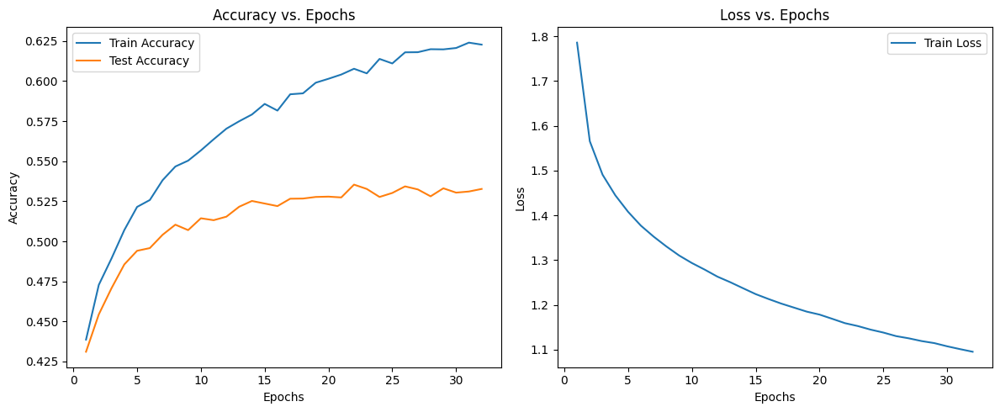

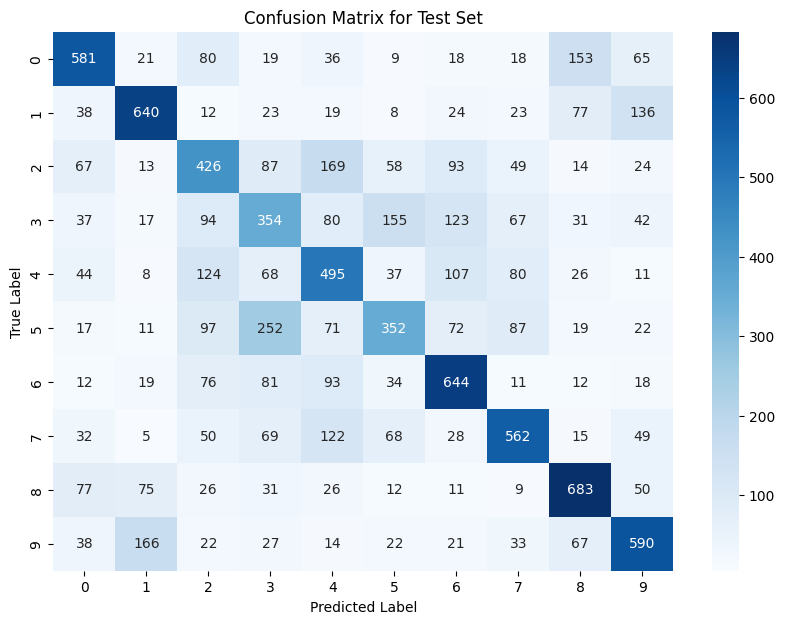

timecost:0.05633544921875
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.62      0.58      0.60      1000
     Class 1       0.66      0.64      0.65      1000
     Class 2       0.42      0.43      0.42      1000
     Class 3       0.35      0.35      0.35      1000
     Class 4       0.44      0.49      0.47      1000
     Class 5       0.47      0.35      0.40      1000
     Class 6       0.56      0.64      0.60      1000
     Class 7       0.60      0.56      0.58      1000
     Class 8       0.62      0.68      0.65      1000
     Class 9       0.59      0.59      0.59      1000

    accuracy                           0.53     10000
   macro avg       0.53      0.53      0.53     10000
weighted avg       0.53      0.53      0.53     10000



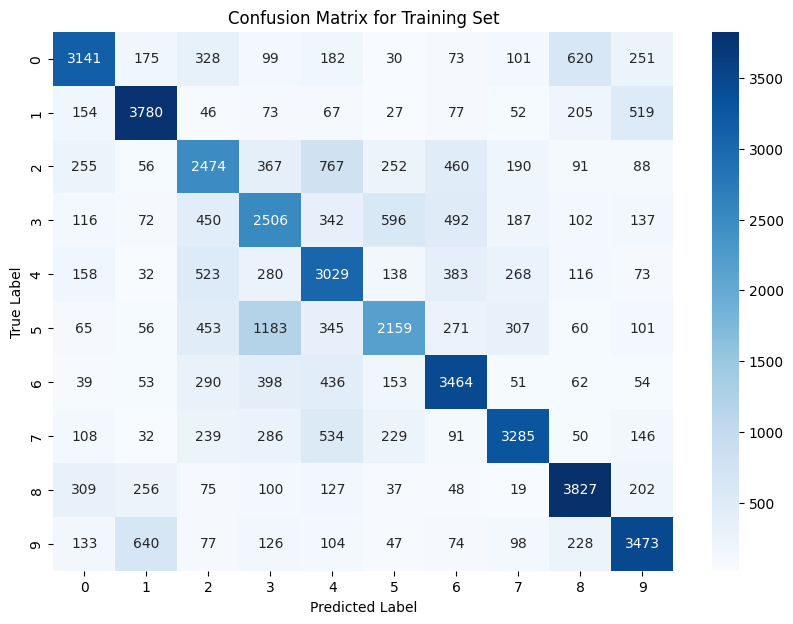

timecost:0.2653813362121582
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.70      0.63      0.66      5000
     Class 1       0.73      0.76      0.74      5000
     Class 2       0.50      0.49      0.50      5000
     Class 3       0.46      0.50      0.48      5000
     Class 4       0.51      0.61      0.55      5000
     Class 5       0.59      0.43      0.50      5000
     Class 6       0.64      0.69      0.66      5000
     Class 7       0.72      0.66      0.69      5000
     Class 8       0.71      0.77      0.74      5000
     Class 9       0.69      0.69      0.69      5000

    accuracy                           0.62     50000
   macro avg       0.63      0.62      0.62     50000
weighted avg       0.63      0.62      0.62     50000

timecost:54.41865086555481
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 para

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.46256, Test Accuracy: 0.4499, Loss: 1.7239368585113488
Epoch 2, Train Accuracy: 0.49032, Test Accuracy: 0.472, Loss: 1.5094451094157575
Epoch 3, Train Accuracy: 0.52036, Test Accuracy: 0.4914, Loss: 1.4344656825653932
Epoch 4, Train Accuracy: 0.52832, Test Accuracy: 0.4897, Loss: 1.386939571806431
Epoch 5, Train Accuracy: 0.54232, Test Accuracy: 0.5066, Loss: 1.3485003149645505
Epoch 6, Train Accuracy: 0.55334, Test Accuracy: 0.5095, Loss: 1.3176712124496888
Epoch 7, Train Accuracy: 0.56262, Test Accuracy: 0.5144, Loss: 1.2937917889528108
Epoch 8, Train Accuracy: 0.57574, Test Accuracy: 0.5144, Loss: 1.271784785763651
Epoch 9, Train Accuracy: 0.578, Test Accuracy: 0.5224, Loss: 1.2536584139672058
Epoch 10, Train Accuracy: 0.5841, Test Accuracy: 0.5246, Loss: 1.237170660683086
Epoch 11, Train Accuracy: 0.58336, Test Accuracy: 0.5216, Loss: 1.221080870241579
Epoch 12, Train Accuracy: 0.59146, Test Accuracy: 0.5284, Loss: 1.2054024326818489
Epoch 13, Train Accur

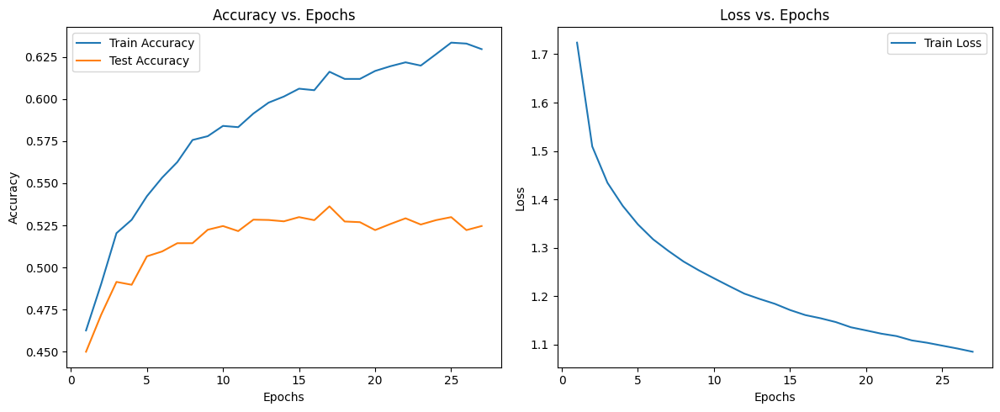

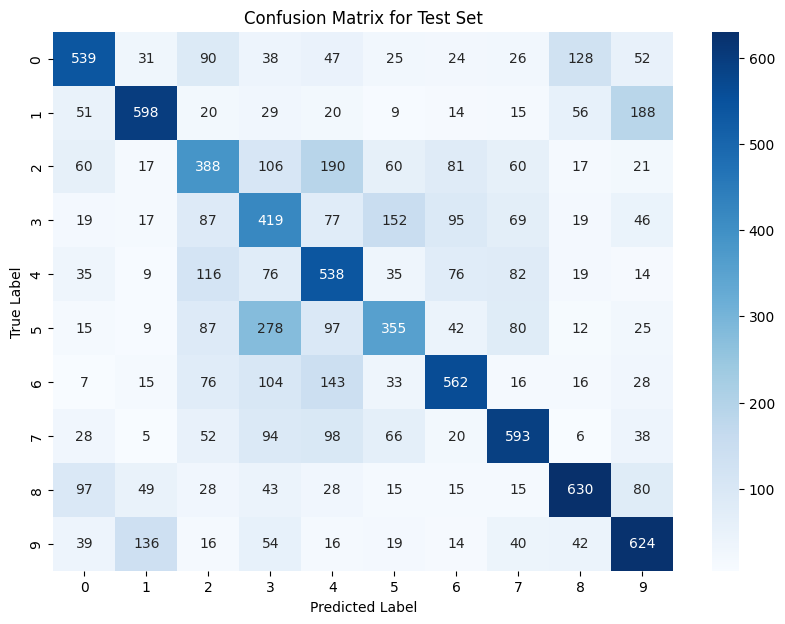

timecost:0.05874371528625488
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.61      0.54      0.57      1000
     Class 1       0.67      0.60      0.63      1000
     Class 2       0.40      0.39      0.40      1000
     Class 3       0.34      0.42      0.37      1000
     Class 4       0.43      0.54      0.48      1000
     Class 5       0.46      0.35      0.40      1000
     Class 6       0.60      0.56      0.58      1000
     Class 7       0.60      0.59      0.59      1000
     Class 8       0.67      0.63      0.65      1000
     Class 9       0.56      0.62      0.59      1000

    accuracy                           0.52     10000
   macro avg       0.53      0.52      0.53     10000
weighted avg       0.53      0.52      0.53     10000



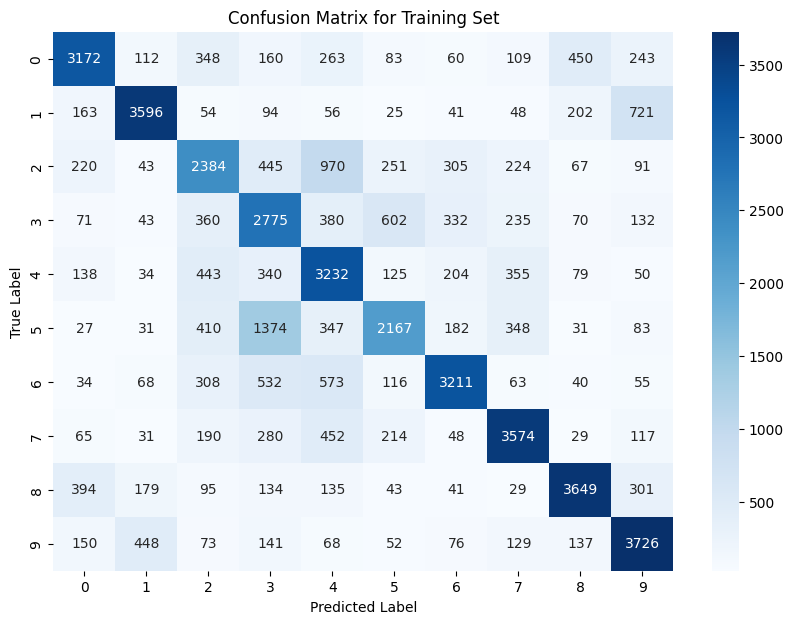

timecost:0.273972749710083
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.72      0.63      0.67      5000
     Class 1       0.78      0.72      0.75      5000
     Class 2       0.51      0.48      0.49      5000
     Class 3       0.44      0.56      0.49      5000
     Class 4       0.50      0.65      0.56      5000
     Class 5       0.59      0.43      0.50      5000
     Class 6       0.71      0.64      0.68      5000
     Class 7       0.70      0.71      0.71      5000
     Class 8       0.77      0.73      0.75      5000
     Class 9       0.68      0.75      0.71      5000

    accuracy                           0.63     50000
   macro avg       0.64      0.63      0.63     50000
weighted avg       0.64      0.63      0.63     50000

timecost:45.31406331062317
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 param

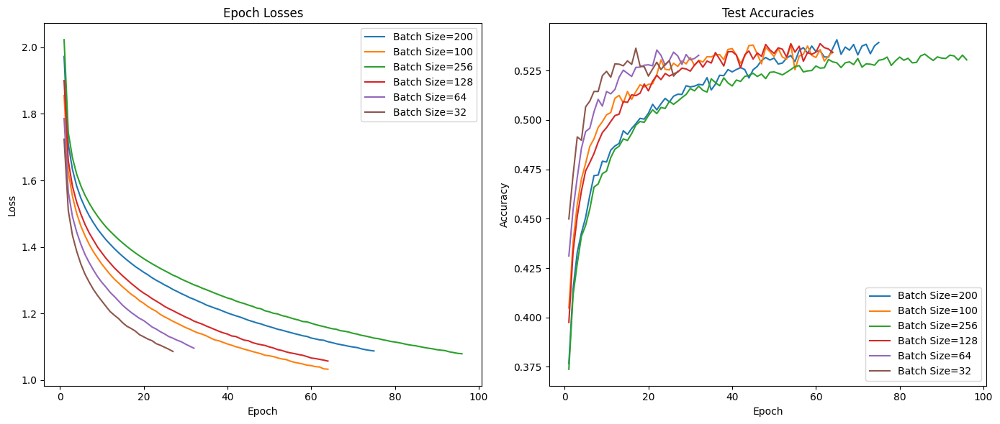

In [ ]:
#Batch size
model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_bs_200 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=200,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_bs_200.mini_batch_train()
print("train_accuracies:",trainings_bs_200.train_accuracies)
print("test_accuracies:",trainings_bs_200.test_accuracies)
print("epoch_losses:",trainings_bs_200.epoch_losses)
print("params_count:",trainings_bs_200.params_count)
print("train_timecost:",trainings_bs_200.train_timecost)
print("test_timecost:",trainings_bs_200.test_timecost)
print("train_report:",trainings_bs_200.train_report)
print("test_report:",trainings_bs_200.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_bs_100 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=100,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_bs_100.mini_batch_train()
print("train_accuracies:",trainings_bs_100.train_accuracies)
print("test_accuracies:",trainings_bs_100.test_accuracies)
print("epoch_losses:",trainings_bs_100.epoch_losses)
print("params_count:",trainings_bs_100.params_count)
print("train_timecost:",trainings_bs_100.train_timecost)
print("test_timecost:",trainings_bs_100.test_timecost)
print("train_report:",trainings_bs_100.train_report)
print("test_report:",trainings_bs_100.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_bs_256 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=256,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_bs_256.mini_batch_train()
print("train_accuracies:",trainings_bs_256.train_accuracies)
print("test_accuracies:",trainings_bs_256.test_accuracies)
print("epoch_losses:",trainings_bs_256.epoch_losses)
print("params_count:",trainings_bs_256.params_count)
print("train_timecost:",trainings_bs_256.train_timecost)
print("test_timecost:",trainings_bs_256.test_timecost)
print("train_report:",trainings_bs_256.train_report)
print("test_report:",trainings_bs_256.test_report)


model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_bs_128 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=128,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_bs_128.mini_batch_train()
print("train_accuracies:",trainings_bs_128.train_accuracies)
print("test_accuracies:",trainings_bs_128.test_accuracies)
print("epoch_losses:",trainings_bs_128.epoch_losses)
print("params_count:",trainings_bs_128.params_count)
print("train_timecost:",trainings_bs_128.train_timecost)
print("test_timecost:",trainings_bs_128.test_timecost)
print("train_report:",trainings_bs_128.train_report)
print("test_report:",trainings_bs_128.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_bs_64 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=64,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_bs_64.mini_batch_train()
print("train_accuracies:",trainings_bs_64.train_accuracies)
print("test_accuracies:",trainings_bs_64.test_accuracies)
print("epoch_losses:",trainings_bs_64.epoch_losses)
print("params_count:",trainings_bs_64.params_count)
print("train_timecost:",trainings_bs_64.train_timecost)
print("test_timecost:",trainings_bs_64.test_timecost)
print("train_report:",trainings_bs_64.train_report)
print("test_report:",trainings_bs_64.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_bs_32 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_bs_32.mini_batch_train()
print("train_accuracies:",trainings_bs_32.train_accuracies)
print("test_accuracies:",trainings_bs_32.test_accuracies)
print("epoch_losses:",trainings_bs_32.epoch_losses)
print("params_count:",trainings_bs_32.params_count)
print("train_timecost:",trainings_bs_32.train_timecost)
print("test_timecost:",trainings_bs_32.test_timecost)
print("train_report:",trainings_bs_32.train_report)
print("test_report:",trainings_bs_32.test_report)


epoch_losses = {
"200": trainings_bs_200.epoch_losses,
"100": trainings_bs_100.epoch_losses,
"256": trainings_bs_256.epoch_losses,
"128": trainings_bs_128.epoch_losses,
"64": trainings_bs_64.epoch_losses,
"32": trainings_bs_32.epoch_losses
}

test_accuracies = {
    '200': trainings_bs_200.test_accuracies,
    '100': trainings_bs_100.test_accuracies,
    '256': trainings_bs_256.test_accuracies,
    '128': trainings_bs_128.test_accuracies,
    '64': trainings_bs_64.test_accuracies,
    '32': trainings_bs_32.test_accuracies
}

plot_training_results(epoch_losses, test_accuracies, 'Batch Size')

### Dropout rate

Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (DropoutLayer): No parameters or `param_count` method not implemented.
Layer 3 (HiddenLayer): 1290 parameters
Layer 4 (SoftmaxLayer): No parameters or `param_count` method not implemented.
Total parameters: 17802


<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.42646, Test Accuracy: 0.4169, Loss: 1.8977942955835094
Epoch 2, Train Accuracy: 0.45048, Test Accuracy: 0.4388, Loss: 1.7182635203850014
Epoch 3, Train Accuracy: 0.48042, Test Accuracy: 0.4678, Loss: 1.6545004003147123
Epoch 4, Train Accuracy: 0.4851, Test Accuracy: 0.4729, Loss: 1.6170239721464923
Epoch 5, Train Accuracy: 0.502, Test Accuracy: 0.4852, Loss: 1.5922194344999054
Epoch 6, Train Accuracy: 0.50788, Test Accuracy: 0.4913, Loss: 1.569505101908744
Epoch 7, Train Accuracy: 0.50702, Test Accuracy: 0.4921, Loss: 1.5486733881638466
Epoch 8, Train Accuracy: 0.5206, Test Accuracy: 0.4955, Loss: 1.5318380327111472
Epoch 9, Train Accuracy: 0.52276, Test Accuracy: 0.4958, Loss: 1.5229774058992567
Epoch 10, Train Accuracy: 0.5372, Test Accuracy: 0.5088, Loss: 1.5076597044146274
Epoch 11, Train Accuracy: 0.53518, Test Accuracy: 0.5081, Loss: 1.4956524946290313
Epoch 12, Train Accuracy: 0.53962, Test Accuracy: 0.5112, Loss: 1.4950082273382528
Epoch 13, Train Acc

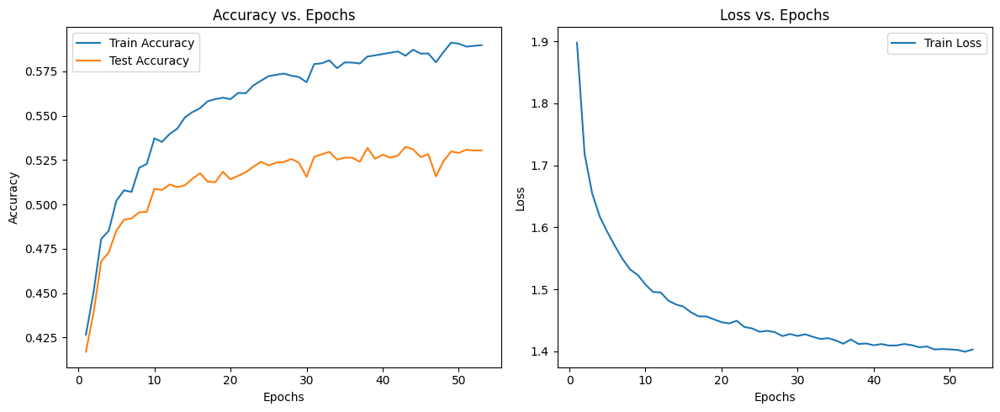

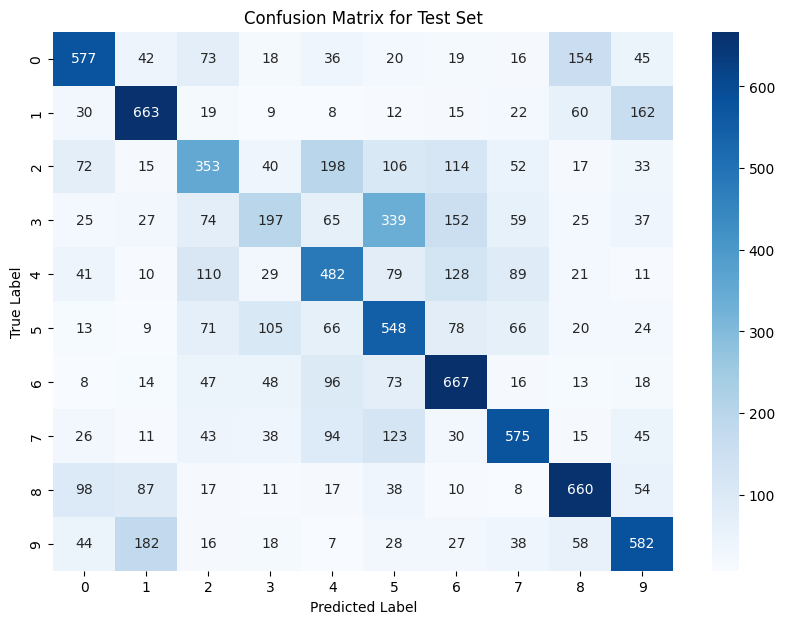

timecost:0.057801246643066406
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.62      0.58      0.60      1000
     Class 1       0.63      0.66      0.64      1000
     Class 2       0.43      0.35      0.39      1000
     Class 3       0.38      0.20      0.26      1000
     Class 4       0.45      0.48      0.47      1000
     Class 5       0.40      0.55      0.46      1000
     Class 6       0.54      0.67      0.60      1000
     Class 7       0.61      0.57      0.59      1000
     Class 8       0.63      0.66      0.65      1000
     Class 9       0.58      0.58      0.58      1000

    accuracy                           0.53     10000
   macro avg       0.53      0.53      0.52     10000
weighted avg       0.53      0.53      0.52     10000



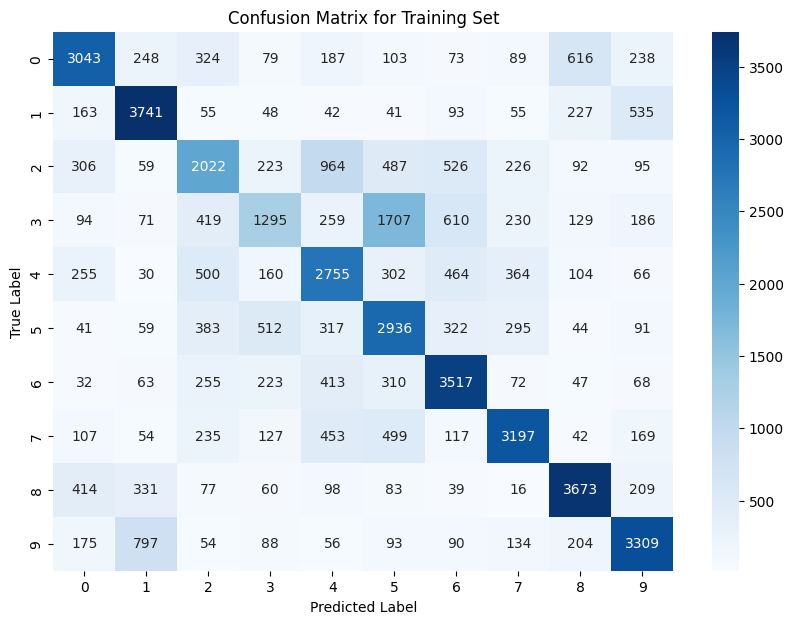

timecost:0.26586198806762695
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.66      0.61      0.63      5000
     Class 1       0.69      0.75      0.72      5000
     Class 2       0.47      0.40      0.43      5000
     Class 3       0.46      0.26      0.33      5000
     Class 4       0.50      0.55      0.52      5000
     Class 5       0.45      0.59      0.51      5000
     Class 6       0.60      0.70      0.65      5000
     Class 7       0.68      0.64      0.66      5000
     Class 8       0.71      0.73      0.72      5000
     Class 9       0.67      0.66      0.66      5000

    accuracy                           0.59     50000
   macro avg       0.59      0.59      0.58     50000
weighted avg       0.59      0.59      0.58     50000

timecost:106.19627332687378
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (DropoutLayer): No par

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.45156, Test Accuracy: 0.446, Loss: 1.8135689543677678
Epoch 2, Train Accuracy: 0.47142, Test Accuracy: 0.4589, Loss: 1.6305524935105478
Epoch 3, Train Accuracy: 0.50132, Test Accuracy: 0.4765, Loss: 1.5637789417273542
Epoch 4, Train Accuracy: 0.50816, Test Accuracy: 0.4857, Loss: 1.5224171034656664
Epoch 5, Train Accuracy: 0.52058, Test Accuracy: 0.4938, Loss: 1.4958856476165723
Epoch 6, Train Accuracy: 0.52812, Test Accuracy: 0.5035, Loss: 1.467198867400772
Epoch 7, Train Accuracy: 0.53512, Test Accuracy: 0.5056, Loss: 1.4443259489078835
Epoch 8, Train Accuracy: 0.54418, Test Accuracy: 0.5107, Loss: 1.4329395759048529
Epoch 9, Train Accuracy: 0.54878, Test Accuracy: 0.5131, Loss: 1.411367198357573
Epoch 10, Train Accuracy: 0.5561, Test Accuracy: 0.5226, Loss: 1.3991302077478958
Epoch 11, Train Accuracy: 0.56116, Test Accuracy: 0.5222, Loss: 1.3858010448948712
Epoch 12, Train Accuracy: 0.56714, Test Accuracy: 0.529, Loss: 1.3812453857711746
Epoch 13, Train Ac

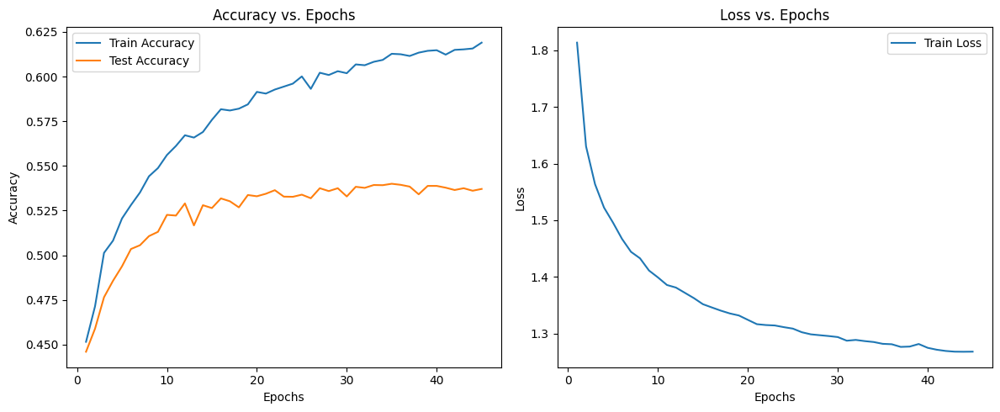

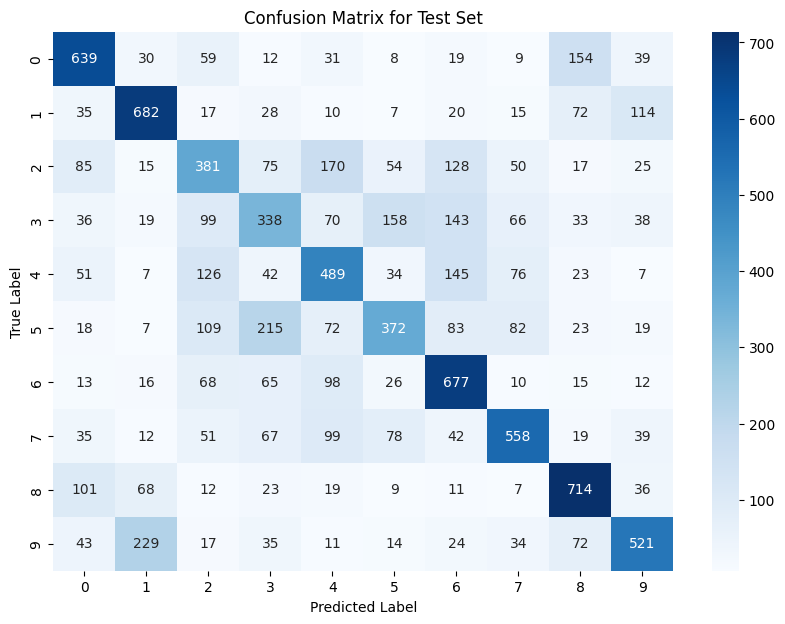

timecost:0.05560708045959473
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.61      0.64      0.62      1000
     Class 1       0.63      0.68      0.65      1000
     Class 2       0.41      0.38      0.39      1000
     Class 3       0.38      0.34      0.36      1000
     Class 4       0.46      0.49      0.47      1000
     Class 5       0.49      0.37      0.42      1000
     Class 6       0.52      0.68      0.59      1000
     Class 7       0.62      0.56      0.59      1000
     Class 8       0.63      0.71      0.67      1000
     Class 9       0.61      0.52      0.56      1000

    accuracy                           0.54     10000
   macro avg       0.53      0.54      0.53     10000
weighted avg       0.53      0.54      0.53     10000



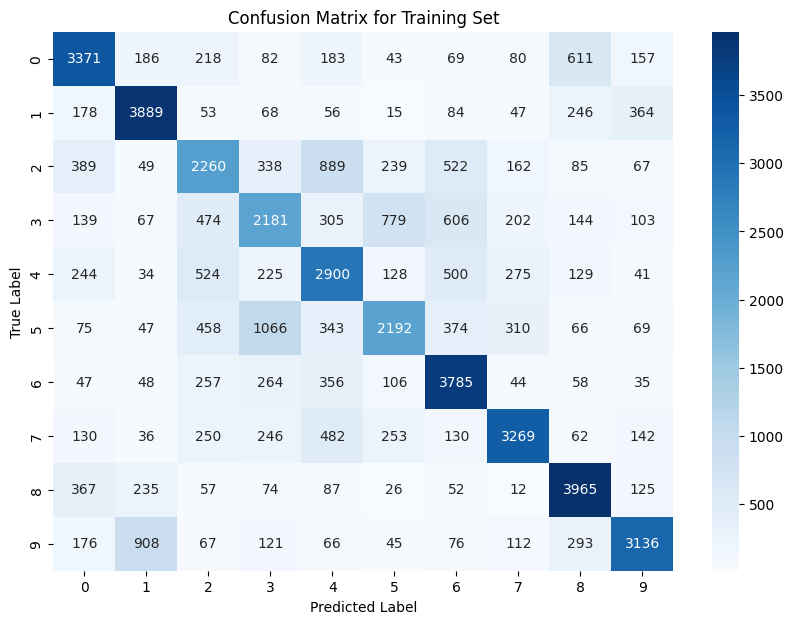

timecost:0.2697155475616455
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.66      0.67      0.67      5000
     Class 1       0.71      0.78      0.74      5000
     Class 2       0.49      0.45      0.47      5000
     Class 3       0.47      0.44      0.45      5000
     Class 4       0.51      0.58      0.54      5000
     Class 5       0.57      0.44      0.50      5000
     Class 6       0.61      0.76      0.68      5000
     Class 7       0.72      0.65      0.69      5000
     Class 8       0.70      0.79      0.74      5000
     Class 9       0.74      0.63      0.68      5000

    accuracy                           0.62     50000
   macro avg       0.62      0.62      0.62     50000
weighted avg       0.62      0.62      0.62     50000

timecost:89.2857301235199
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (DropoutLayer): No parame

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.45768, Test Accuracy: 0.4463, Loss: 1.7875495897567097
Epoch 2, Train Accuracy: 0.48678, Test Accuracy: 0.4723, Loss: 1.5874908397436895
Epoch 3, Train Accuracy: 0.49748, Test Accuracy: 0.4846, Loss: 1.5271772043776828
Epoch 4, Train Accuracy: 0.51844, Test Accuracy: 0.4985, Loss: 1.4819368586382589
Epoch 5, Train Accuracy: 0.52888, Test Accuracy: 0.5019, Loss: 1.4515331945302408
Epoch 6, Train Accuracy: 0.53816, Test Accuracy: 0.5059, Loss: 1.423733304095414
Epoch 7, Train Accuracy: 0.54748, Test Accuracy: 0.5145, Loss: 1.4031507320060472
Epoch 8, Train Accuracy: 0.55166, Test Accuracy: 0.511, Loss: 1.3849732486610546
Epoch 9, Train Accuracy: 0.55756, Test Accuracy: 0.5127, Loss: 1.3673779309224463
Epoch 10, Train Accuracy: 0.56804, Test Accuracy: 0.5165, Loss: 1.3551993308776509
Epoch 11, Train Accuracy: 0.5718, Test Accuracy: 0.5218, Loss: 1.3406685808123366
Epoch 12, Train Accuracy: 0.57638, Test Accuracy: 0.5253, Loss: 1.3273845588342303
Epoch 13, Train 

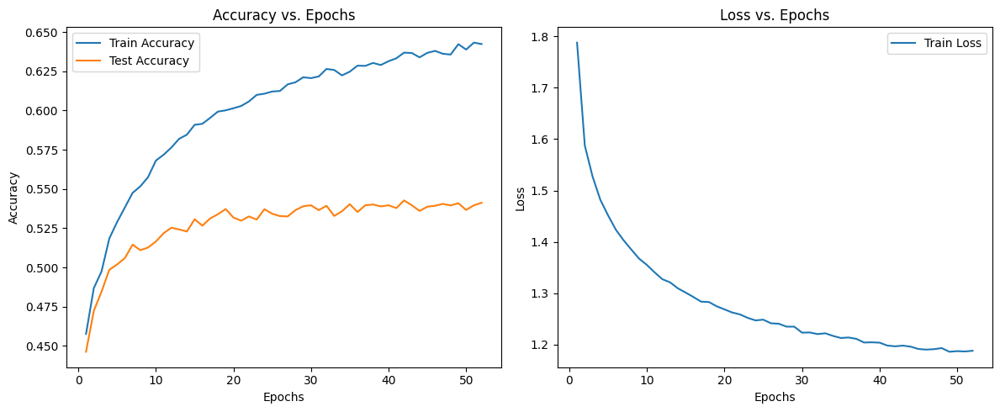

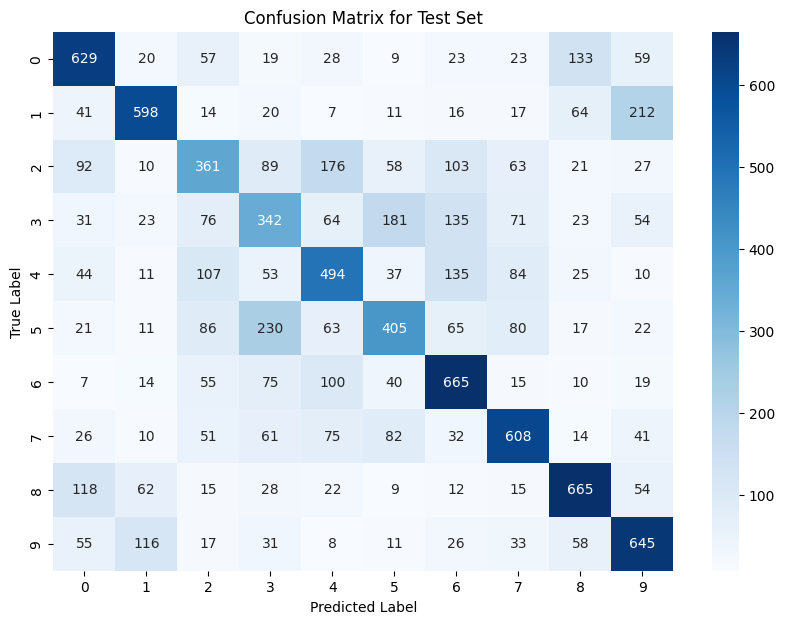

timecost:0.05685234069824219
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.59      0.63      0.61      1000
     Class 1       0.68      0.60      0.64      1000
     Class 2       0.43      0.36      0.39      1000
     Class 3       0.36      0.34      0.35      1000
     Class 4       0.48      0.49      0.49      1000
     Class 5       0.48      0.41      0.44      1000
     Class 6       0.55      0.67      0.60      1000
     Class 7       0.60      0.61      0.61      1000
     Class 8       0.65      0.67      0.66      1000
     Class 9       0.56      0.65      0.60      1000

    accuracy                           0.54     10000
   macro avg       0.54      0.54      0.54     10000
weighted avg       0.54      0.54      0.54     10000



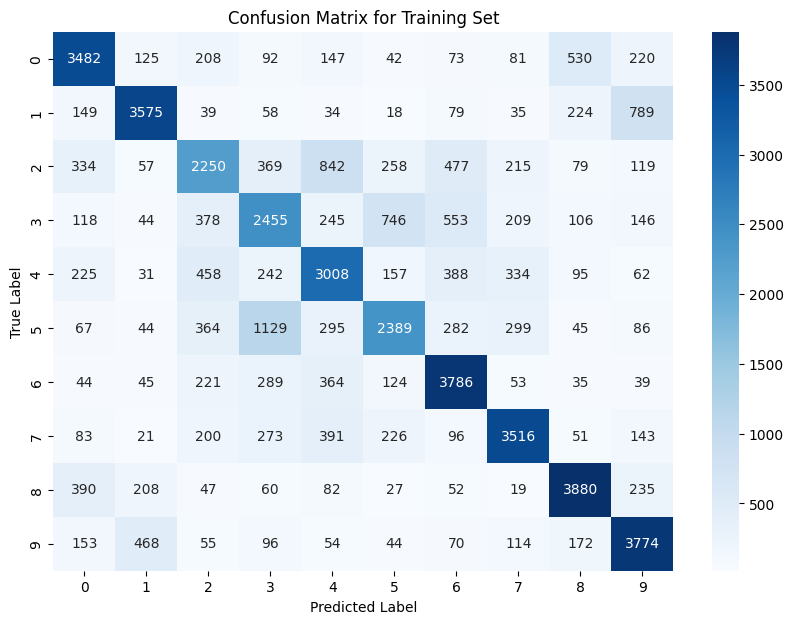

timecost:0.2683384418487549
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.69      0.70      0.69      5000
     Class 1       0.77      0.71      0.74      5000
     Class 2       0.53      0.45      0.49      5000
     Class 3       0.48      0.49      0.49      5000
     Class 4       0.55      0.60      0.58      5000
     Class 5       0.59      0.48      0.53      5000
     Class 6       0.65      0.76      0.70      5000
     Class 7       0.72      0.70      0.71      5000
     Class 8       0.74      0.78      0.76      5000
     Class 9       0.67      0.75      0.71      5000

    accuracy                           0.64     50000
   macro avg       0.64      0.64      0.64     50000
weighted avg       0.64      0.64      0.64     50000

timecost:102.22503232955933
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (DropoutLayer): No para

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.45952, Test Accuracy: 0.4507, Loss: 1.7521830058655743
Epoch 2, Train Accuracy: 0.48622, Test Accuracy: 0.4662, Loss: 1.5475929370186512
Epoch 3, Train Accuracy: 0.51102, Test Accuracy: 0.4894, Loss: 1.481607986168633
Epoch 4, Train Accuracy: 0.52748, Test Accuracy: 0.4964, Loss: 1.4364244331593148
Epoch 5, Train Accuracy: 0.54008, Test Accuracy: 0.5053, Loss: 1.4035609174996502
Epoch 6, Train Accuracy: 0.54642, Test Accuracy: 0.5057, Loss: 1.3776972303134105
Epoch 7, Train Accuracy: 0.55446, Test Accuracy: 0.5136, Loss: 1.3537725409824168
Epoch 8, Train Accuracy: 0.5669, Test Accuracy: 0.523, Loss: 1.333480540853668
Epoch 9, Train Accuracy: 0.57092, Test Accuracy: 0.5207, Loss: 1.3198439243262021
Epoch 10, Train Accuracy: 0.57344, Test Accuracy: 0.5196, Loss: 1.3035167452893262
Epoch 11, Train Accuracy: 0.57428, Test Accuracy: 0.5196, Loss: 1.2851650831245656
Epoch 12, Train Accuracy: 0.5894, Test Accuracy: 0.5311, Loss: 1.2723104235951497
Epoch 13, Train Ac

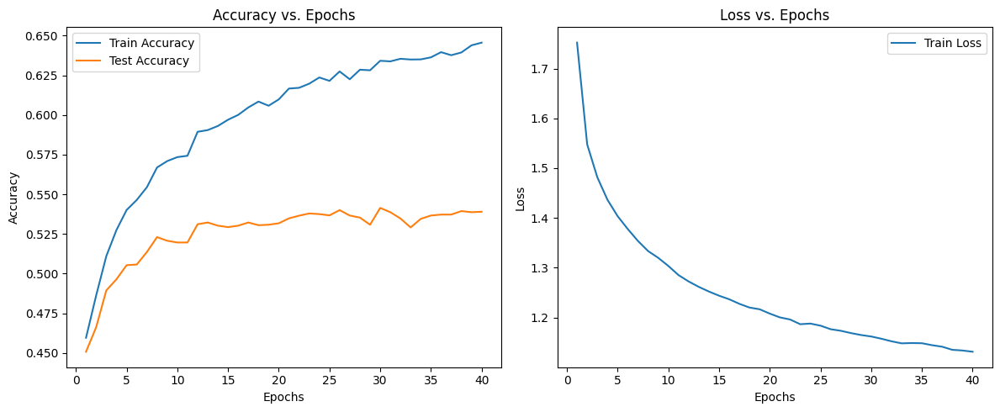

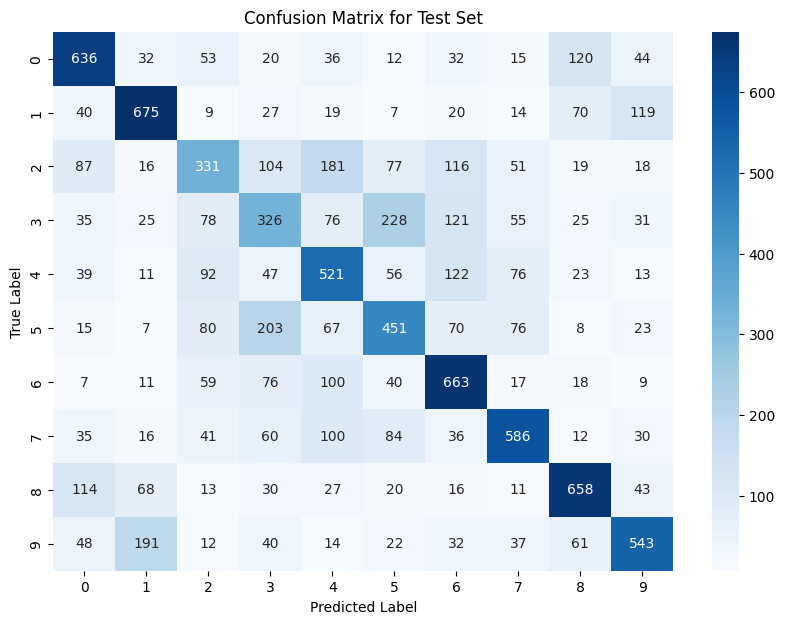

timecost:0.07938671112060547
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.60      0.64      0.62      1000
     Class 1       0.64      0.68      0.66      1000
     Class 2       0.43      0.33      0.37      1000
     Class 3       0.35      0.33      0.34      1000
     Class 4       0.46      0.52      0.49      1000
     Class 5       0.45      0.45      0.45      1000
     Class 6       0.54      0.66      0.60      1000
     Class 7       0.62      0.59      0.60      1000
     Class 8       0.65      0.66      0.65      1000
     Class 9       0.62      0.54      0.58      1000

    accuracy                           0.54     10000
   macro avg       0.54      0.54      0.54     10000
weighted avg       0.54      0.54      0.54     10000



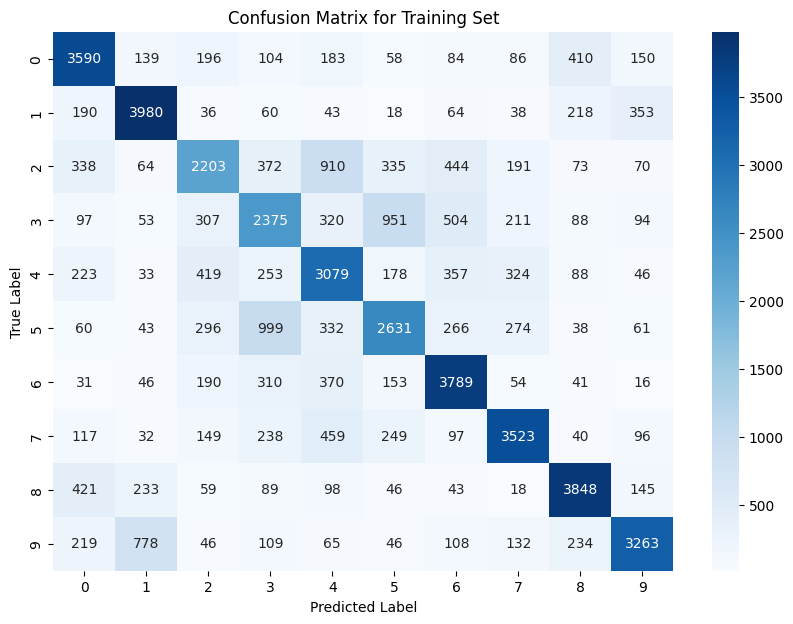

timecost:0.2723124027252197
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.68      0.72      0.70      5000
     Class 1       0.74      0.80      0.77      5000
     Class 2       0.56      0.44      0.50      5000
     Class 3       0.48      0.47      0.48      5000
     Class 4       0.53      0.62      0.57      5000
     Class 5       0.56      0.53      0.54      5000
     Class 6       0.66      0.76      0.70      5000
     Class 7       0.73      0.70      0.72      5000
     Class 8       0.76      0.77      0.76      5000
     Class 9       0.76      0.65      0.70      5000

    accuracy                           0.65     50000
   macro avg       0.65      0.65      0.64     50000
weighted avg       0.65      0.65      0.64     50000

timecost:78.92482352256775
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (DropoutLayer): No param

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.45984, Test Accuracy: 0.4533, Loss: 1.7417036908464902
Epoch 2, Train Accuracy: 0.4868, Test Accuracy: 0.4755, Loss: 1.5381724371189562
Epoch 3, Train Accuracy: 0.51508, Test Accuracy: 0.4941, Loss: 1.4644798913614394
Epoch 4, Train Accuracy: 0.52902, Test Accuracy: 0.5059, Loss: 1.4152327490766308
Epoch 5, Train Accuracy: 0.53748, Test Accuracy: 0.5057, Loss: 1.378531109287566
Epoch 6, Train Accuracy: 0.54922, Test Accuracy: 0.5097, Loss: 1.3470993075507294
Epoch 7, Train Accuracy: 0.5584, Test Accuracy: 0.5107, Loss: 1.3222655113860482
Epoch 8, Train Accuracy: 0.57018, Test Accuracy: 0.5214, Loss: 1.3052442617874151
Epoch 9, Train Accuracy: 0.57428, Test Accuracy: 0.5175, Loss: 1.2819621612530288
Epoch 10, Train Accuracy: 0.57988, Test Accuracy: 0.5213, Loss: 1.2669471664011505
Epoch 11, Train Accuracy: 0.59264, Test Accuracy: 0.5295, Loss: 1.251998881183879
Epoch 12, Train Accuracy: 0.58898, Test Accuracy: 0.522, Loss: 1.2421453636662598
Epoch 13, Train Ac

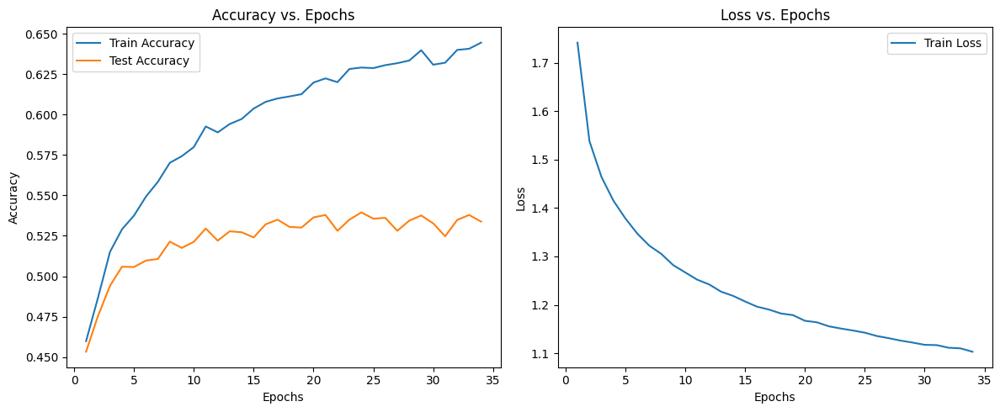

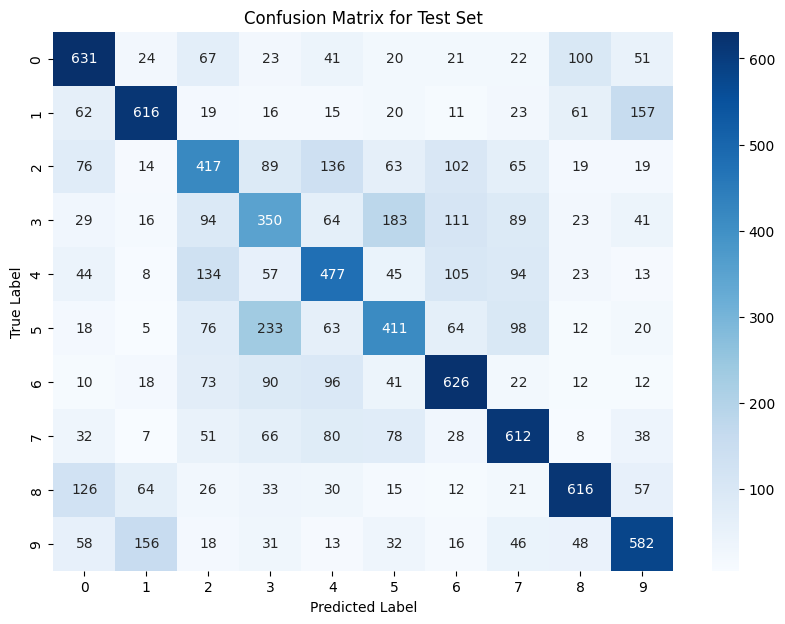

timecost:0.07457852363586426
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.58      0.63      0.60      1000
     Class 1       0.66      0.62      0.64      1000
     Class 2       0.43      0.42      0.42      1000
     Class 3       0.35      0.35      0.35      1000
     Class 4       0.47      0.48      0.47      1000
     Class 5       0.45      0.41      0.43      1000
     Class 6       0.57      0.63      0.60      1000
     Class 7       0.56      0.61      0.59      1000
     Class 8       0.67      0.62      0.64      1000
     Class 9       0.59      0.58      0.58      1000

    accuracy                           0.53     10000
   macro avg       0.53      0.53      0.53     10000
weighted avg       0.53      0.53      0.53     10000



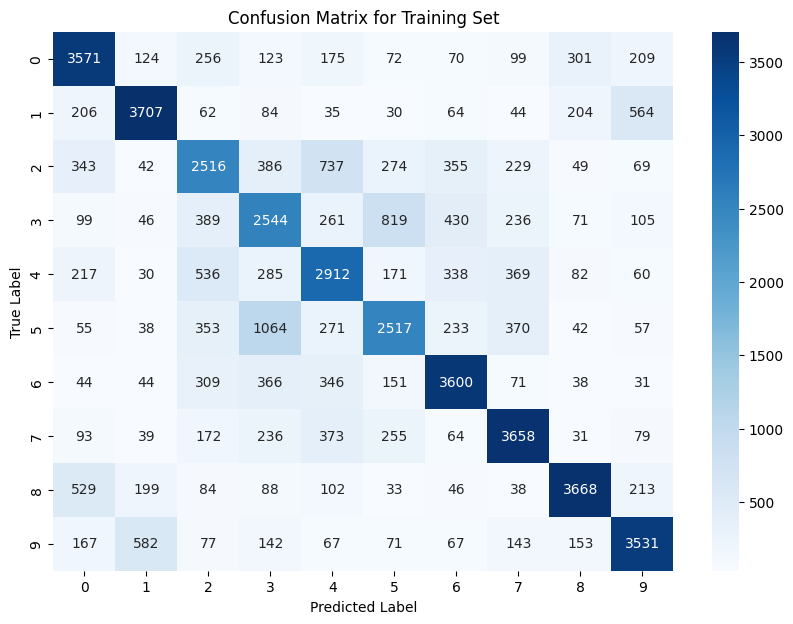

timecost:0.2669973373413086
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.67      0.71      0.69      5000
     Class 1       0.76      0.74      0.75      5000
     Class 2       0.53      0.50      0.52      5000
     Class 3       0.48      0.51      0.49      5000
     Class 4       0.55      0.58      0.57      5000
     Class 5       0.57      0.50      0.54      5000
     Class 6       0.68      0.72      0.70      5000
     Class 7       0.70      0.73      0.71      5000
     Class 8       0.79      0.73      0.76      5000
     Class 9       0.72      0.71      0.71      5000

    accuracy                           0.64     50000
   macro avg       0.65      0.64      0.64     50000
weighted avg       0.65      0.64      0.64     50000

timecost:67.37664842605591
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (DropoutLayer): No param

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.45928, Test Accuracy: 0.4529, Loss: 1.7179581503816557
Epoch 2, Train Accuracy: 0.49556, Test Accuracy: 0.4776, Loss: 1.5072913235288306
Epoch 3, Train Accuracy: 0.5222, Test Accuracy: 0.497, Loss: 1.4314164436591765
Epoch 4, Train Accuracy: 0.53052, Test Accuracy: 0.4976, Loss: 1.3828230580669596
Epoch 5, Train Accuracy: 0.5462, Test Accuracy: 0.5102, Loss: 1.345632640604198
Epoch 6, Train Accuracy: 0.55492, Test Accuracy: 0.5145, Loss: 1.3154496288462338
Epoch 7, Train Accuracy: 0.56532, Test Accuracy: 0.5221, Loss: 1.2882409700998574
Epoch 8, Train Accuracy: 0.57438, Test Accuracy: 0.5158, Loss: 1.2676025786518463
Epoch 9, Train Accuracy: 0.58336, Test Accuracy: 0.5262, Loss: 1.2465530592988325
Epoch 10, Train Accuracy: 0.58222, Test Accuracy: 0.5175, Loss: 1.2283982059232108
Epoch 11, Train Accuracy: 0.58088, Test Accuracy: 0.515, Loss: 1.216081444946126
Epoch 12, Train Accuracy: 0.59814, Test Accuracy: 0.5294, Loss: 1.2012075711868524
Epoch 13, Train Acc

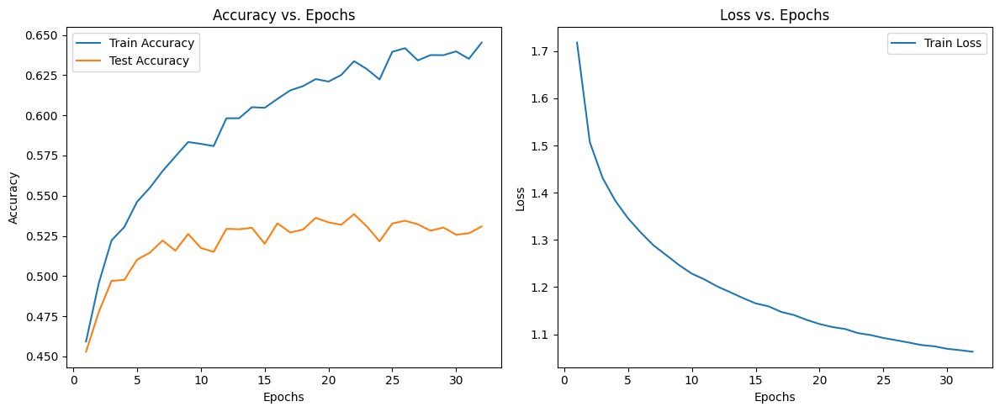

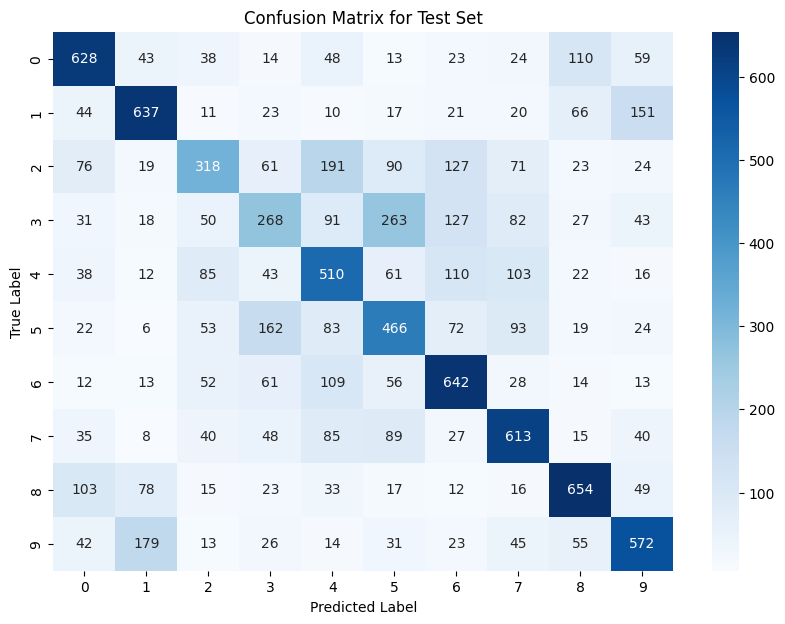

timecost:0.06537866592407227
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.61      0.63      0.62      1000
     Class 1       0.63      0.64      0.63      1000
     Class 2       0.47      0.32      0.38      1000
     Class 3       0.37      0.27      0.31      1000
     Class 4       0.43      0.51      0.47      1000
     Class 5       0.42      0.47      0.44      1000
     Class 6       0.54      0.64      0.59      1000
     Class 7       0.56      0.61      0.59      1000
     Class 8       0.65      0.65      0.65      1000
     Class 9       0.58      0.57      0.57      1000

    accuracy                           0.53     10000
   macro avg       0.53      0.53      0.53     10000
weighted avg       0.53      0.53      0.53     10000



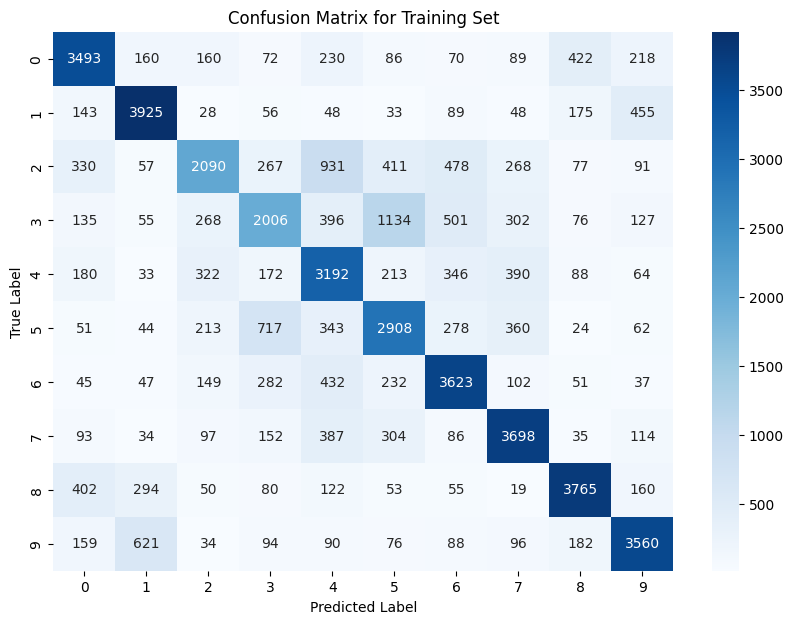

timecost:0.29122304916381836
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.69      0.70      0.70      5000
     Class 1       0.74      0.79      0.76      5000
     Class 2       0.61      0.42      0.50      5000
     Class 3       0.51      0.40      0.45      5000
     Class 4       0.52      0.64      0.57      5000
     Class 5       0.53      0.58      0.56      5000
     Class 6       0.65      0.72      0.68      5000
     Class 7       0.69      0.74      0.71      5000
     Class 8       0.77      0.75      0.76      5000
     Class 9       0.73      0.71      0.72      5000

    accuracy                           0.65     50000
   macro avg       0.64      0.65      0.64     50000
weighted avg       0.64      0.65      0.64     50000

timecost:53.049309968948364
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 pa

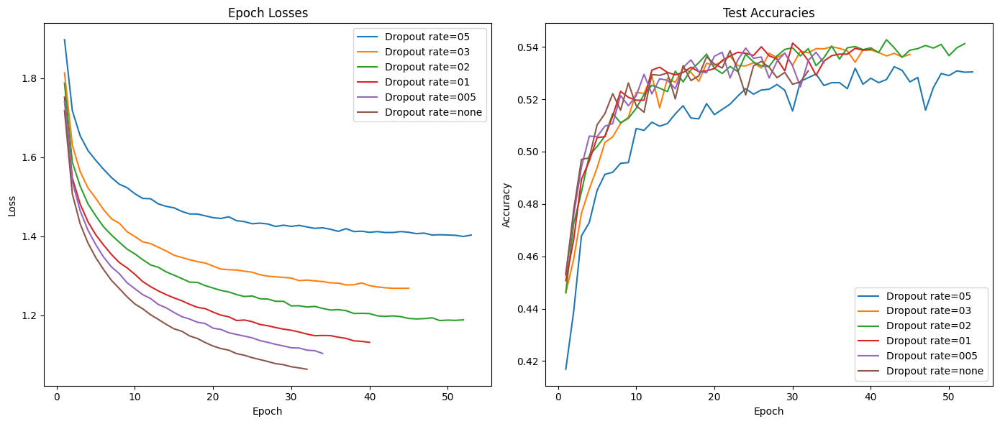

In [ ]:
model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(DropoutLayer(0.5))
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_dr_05 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_dr_05.mini_batch_train()
print("train_accuracies:",trainings_dr_05.train_accuracies)
print("test_accuracies:",trainings_dr_05.test_accuracies)
print("epoch_losses:",trainings_dr_05.epoch_losses)
print("params_count:",trainings_dr_05.params_count)
print("train_timecost:",trainings_dr_05.train_timecost)
print("test_timecost:",trainings_dr_05.test_timecost)
print("train_report:",trainings_dr_05.train_report)
print("test_report:",trainings_dr_05.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(DropoutLayer(0.3))
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_dr_03 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_dr_03.mini_batch_train()
print("train_accuracies:",trainings_dr_03.train_accuracies)
print("test_accuracies:",trainings_dr_03.test_accuracies)
print("epoch_losses:",trainings_dr_03.epoch_losses)
print("params_count:",trainings_dr_03.params_count)
print("train_timecost:",trainings_dr_03.train_timecost)
print("test_timecost:",trainings_dr_03.test_timecost)
print("train_report:",trainings_dr_03.train_report)
print("test_report:",trainings_dr_03.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_dr_02 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_dr_02.mini_batch_train()
print("train_accuracies:",trainings_dr_02.train_accuracies)
print("test_accuracies:",trainings_dr_02.test_accuracies)
print("epoch_losses:",trainings_dr_02.epoch_losses)
print("params_count:",trainings_dr_02.params_count)
print("train_timecost:",trainings_dr_02.train_timecost)
print("test_timecost:",trainings_dr_02.test_timecost)
print("train_report:",trainings_dr_02.train_report)
print("test_report:",trainings_dr_02.test_report)


model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(DropoutLayer(0.1))
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_dr_01 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_dr_01.mini_batch_train()
print("train_accuracies:",trainings_dr_01.train_accuracies)
print("test_accuracies:",trainings_dr_01.test_accuracies)
print("epoch_losses:",trainings_dr_01.epoch_losses)
print("params_count:",trainings_dr_01.params_count)
print("train_timecost:",trainings_dr_01.train_timecost)
print("test_timecost:",trainings_dr_01.test_timecost)
print("train_report:",trainings_dr_01.train_report)
print("test_report:",trainings_dr_01.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(DropoutLayer(0.05))
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_dr_005 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_dr_005.mini_batch_train()
print("train_accuracies:",trainings_dr_005.train_accuracies)
print("test_accuracies:",trainings_dr_005.test_accuracies)
print("epoch_losses:",trainings_dr_005.epoch_losses)
print("params_count:",trainings_dr_005.params_count)
print("train_timecost:",trainings_dr_005.train_timecost)
print("test_timecost:",trainings_dr_005.test_timecost)
print("train_report:",trainings_dr_005.train_report)
print("test_report:",trainings_dr_005.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_dr_none = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_dr_none.mini_batch_train()
print("train_accuracies:",trainings_dr_none.train_accuracies)
print("test_accuracies:",trainings_dr_none.test_accuracies)
print("epoch_losses:",trainings_dr_none.epoch_losses)
print("params_count:",trainings_dr_none.params_count)
print("train_timecost:",trainings_dr_none.train_timecost)
print("test_timecost:",trainings_dr_none.test_timecost)
print("train_report:",trainings_dr_none.train_report)
print("test_report:",trainings_dr_none.test_report)

epoch_losses = {
"05":trainings_dr_05.epoch_losses,
"03":trainings_dr_03.epoch_losses,
"02":trainings_dr_02.epoch_losses,
"01":trainings_dr_01.epoch_losses,
"005":trainings_dr_005.epoch_losses,
"none":trainings_dr_none.epoch_losses
}

test_accuracies = {
"05":trainings_dr_05.test_accuracies,
"03":trainings_dr_03.test_accuracies,
"02":trainings_dr_02.test_accuracies,
"01":trainings_dr_01.test_accuracies,
"005":trainings_dr_005.test_accuracies,
"none":trainings_dr_none.test_accuracies
}

plot_training_results(epoch_losses, test_accuracies, 'Dropout rate')

### Weight decay

Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 parameters
Layer 3 (SoftmaxLayer): No parameters or `param_count` method not implemented.
Total parameters: 17802


<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.45586, Test Accuracy: 0.4481, Loss: 1.723001596337799
Epoch 2, Train Accuracy: 0.49582, Test Accuracy: 0.4749, Loss: 1.5083322895933193
Epoch 3, Train Accuracy: 0.52142, Test Accuracy: 0.4956, Loss: 1.43120498667872
Epoch 4, Train Accuracy: 0.53604, Test Accuracy: 0.504, Loss: 1.379879749166647
Epoch 5, Train Accuracy: 0.54498, Test Accuracy: 0.5101, Loss: 1.3435675878750697
Epoch 6, Train Accuracy: 0.55742, Test Accuracy: 0.5112, Loss: 1.3134720498931192
Epoch 7, Train Accuracy: 0.56346, Test Accuracy: 0.5136, Loss: 1.288442961189054
Epoch 8, Train Accuracy: 0.5736, Test Accuracy: 0.5149, Loss: 1.2666695237684895
Epoch 9, Train Accuracy: 0.5743, Test Accuracy: 0.5128, Loss: 1.2465616779085993
Epoch 10, Train Accuracy: 0.57912, Test Accuracy: 0.5104, Loss: 1.2312272352974543
Epoch 11, Train Accuracy: 0.5879, Test Accuracy: 0.5148, Loss: 1.2183006751400538
Epoch 12, Train Accuracy: 0.59712, Test Accuracy: 0.5243, Loss: 1.2046705853649498
Epoch 13, Train Accura

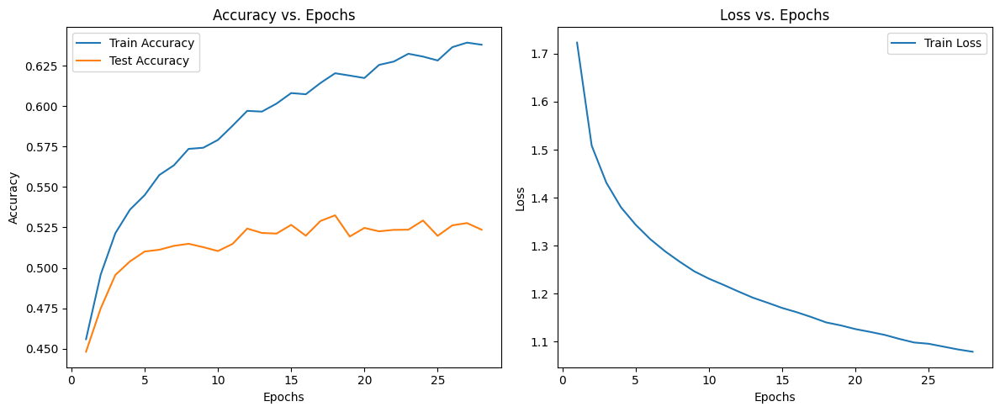

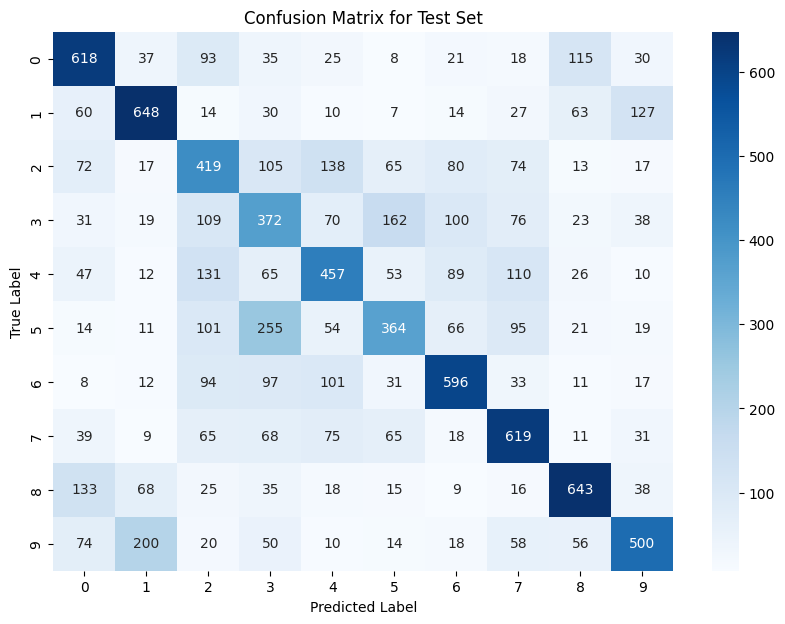

timecost:0.057114362716674805
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.56      0.62      0.59      1000
     Class 1       0.63      0.65      0.64      1000
     Class 2       0.39      0.42      0.40      1000
     Class 3       0.33      0.37      0.35      1000
     Class 4       0.48      0.46      0.47      1000
     Class 5       0.46      0.36      0.41      1000
     Class 6       0.59      0.60      0.59      1000
     Class 7       0.55      0.62      0.58      1000
     Class 8       0.65      0.64      0.65      1000
     Class 9       0.60      0.50      0.55      1000

    accuracy                           0.52     10000
   macro avg       0.53      0.52      0.52     10000
weighted avg       0.53      0.52      0.52     10000



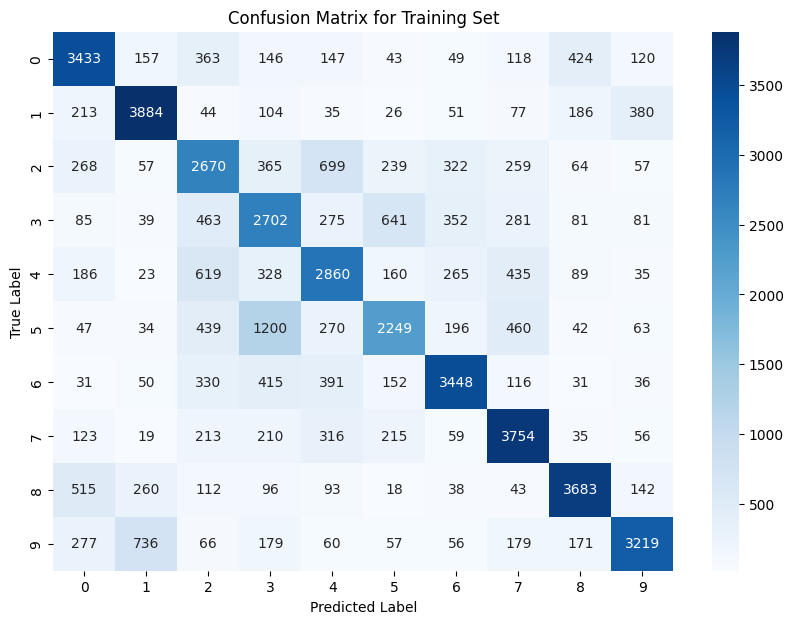

timecost:0.28343629837036133
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.66      0.69      0.67      5000
     Class 1       0.74      0.78      0.76      5000
     Class 2       0.50      0.53      0.52      5000
     Class 3       0.47      0.54      0.50      5000
     Class 4       0.56      0.57      0.56      5000
     Class 5       0.59      0.45      0.51      5000
     Class 6       0.71      0.69      0.70      5000
     Class 7       0.66      0.75      0.70      5000
     Class 8       0.77      0.74      0.75      5000
     Class 9       0.77      0.64      0.70      5000

    accuracy                           0.64     50000
   macro avg       0.64      0.64      0.64     50000
weighted avg       0.64      0.64      0.64     50000

timecost:47.03301525115967
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 par

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.46394, Test Accuracy: 0.4547, Loss: 1.7102701844607713
Epoch 2, Train Accuracy: 0.5019, Test Accuracy: 0.4802, Loss: 1.5032075785823376
Epoch 3, Train Accuracy: 0.51182, Test Accuracy: 0.4901, Loss: 1.4315552288101607
Epoch 4, Train Accuracy: 0.5336, Test Accuracy: 0.5, Loss: 1.3853071383988955
Epoch 5, Train Accuracy: 0.54004, Test Accuracy: 0.5083, Loss: 1.353590475986214
Epoch 6, Train Accuracy: 0.55062, Test Accuracy: 0.5153, Loss: 1.326123189495067
Epoch 7, Train Accuracy: 0.557, Test Accuracy: 0.5115, Loss: 1.3035936206261243
Epoch 8, Train Accuracy: 0.5654, Test Accuracy: 0.5259, Loss: 1.2883696886431821
Epoch 9, Train Accuracy: 0.56682, Test Accuracy: 0.523, Loss: 1.2713980261724234
Epoch 10, Train Accuracy: 0.57782, Test Accuracy: 0.5289, Loss: 1.2580963810135468
Epoch 11, Train Accuracy: 0.5821, Test Accuracy: 0.5246, Loss: 1.244258260403365
Epoch 12, Train Accuracy: 0.58116, Test Accuracy: 0.5258, Loss: 1.2341008954530415
Epoch 13, Train Accuracy: 

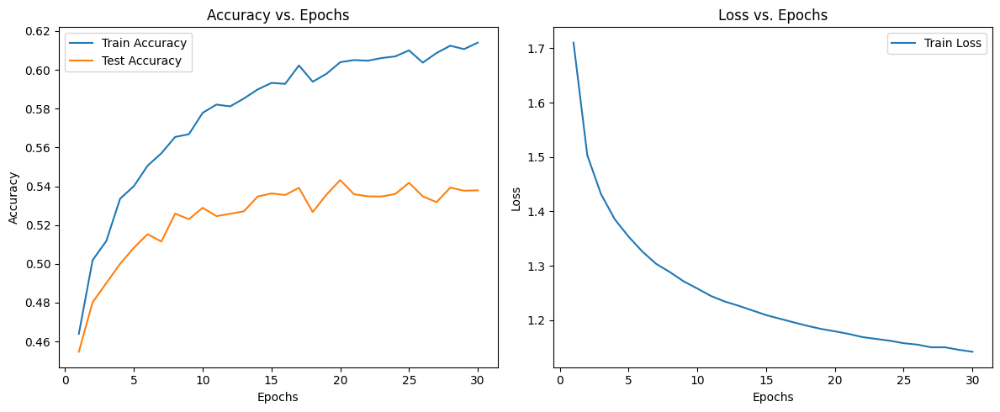

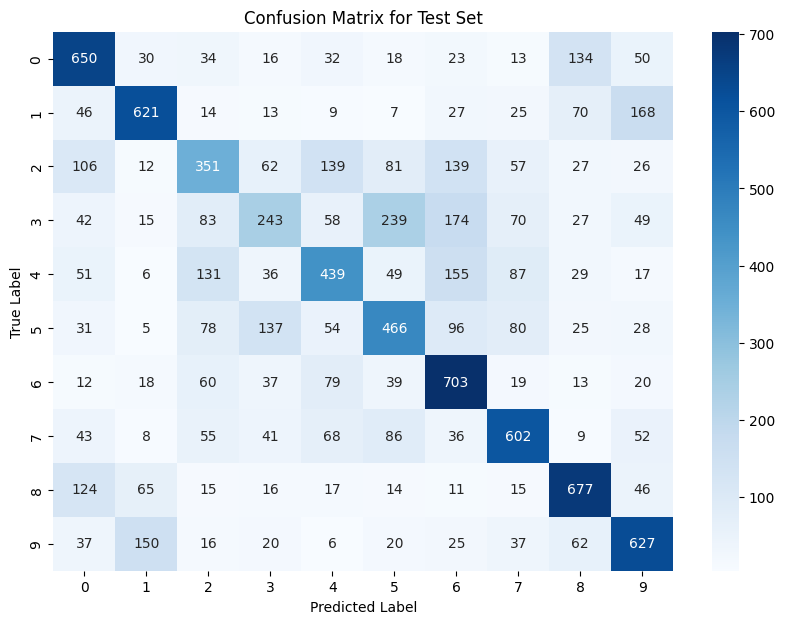

timecost:0.05232119560241699
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.57      0.65      0.61      1000
     Class 1       0.67      0.62      0.64      1000
     Class 2       0.42      0.35      0.38      1000
     Class 3       0.39      0.24      0.30      1000
     Class 4       0.49      0.44      0.46      1000
     Class 5       0.46      0.47      0.46      1000
     Class 6       0.51      0.70      0.59      1000
     Class 7       0.60      0.60      0.60      1000
     Class 8       0.63      0.68      0.65      1000
     Class 9       0.58      0.63      0.60      1000

    accuracy                           0.54     10000
   macro avg       0.53      0.54      0.53     10000
weighted avg       0.53      0.54      0.53     10000



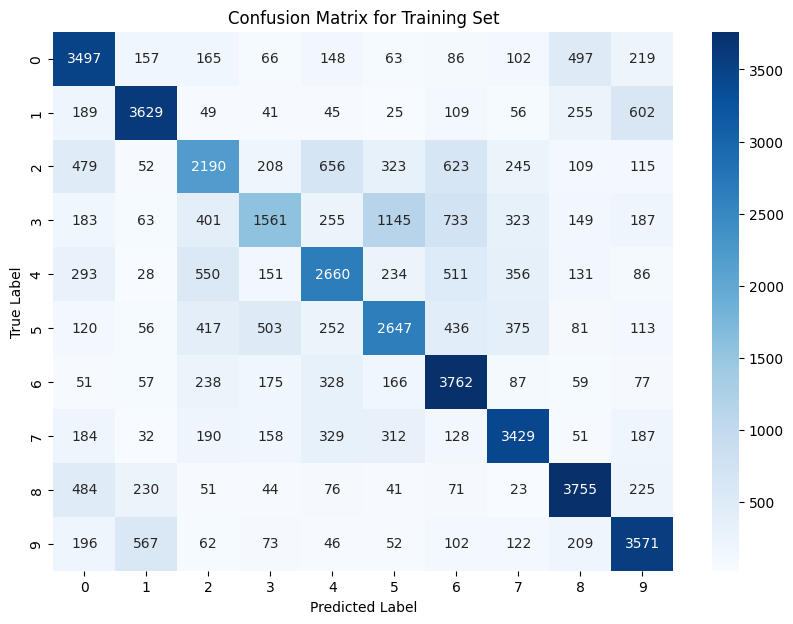

timecost:0.2606236934661865
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.62      0.70      0.66      5000
     Class 1       0.75      0.73      0.74      5000
     Class 2       0.51      0.44      0.47      5000
     Class 3       0.52      0.31      0.39      5000
     Class 4       0.55      0.53      0.54      5000
     Class 5       0.53      0.53      0.53      5000
     Class 6       0.57      0.75      0.65      5000
     Class 7       0.67      0.69      0.68      5000
     Class 8       0.71      0.75      0.73      5000
     Class 9       0.66      0.71      0.69      5000

    accuracy                           0.61     50000
   macro avg       0.61      0.61      0.61     50000
weighted avg       0.61      0.61      0.61     50000

timecost:47.289472341537476
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 par

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.44218, Test Accuracy: 0.4397, Loss: 1.7229096758967597
Epoch 2, Train Accuracy: 0.4622, Test Accuracy: 0.4622, Loss: 1.570986986511281
Epoch 3, Train Accuracy: 0.4738, Test Accuracy: 0.4656, Loss: 1.5426825871214487
Epoch 4, Train Accuracy: 0.47062, Test Accuracy: 0.4637, Loss: 1.528159884544777
Epoch 5, Train Accuracy: 0.4775, Test Accuracy: 0.4737, Loss: 1.5209927555765144
Epoch 6, Train Accuracy: 0.47942, Test Accuracy: 0.4723, Loss: 1.5170450605874883
Epoch 7, Train Accuracy: 0.47498, Test Accuracy: 0.4691, Loss: 1.5117903930539776
Epoch 8, Train Accuracy: 0.48004, Test Accuracy: 0.4726, Loss: 1.5094018073720004
Epoch 9, Train Accuracy: 0.4803, Test Accuracy: 0.4751, Loss: 1.508153960661152
Epoch 10, Train Accuracy: 0.47532, Test Accuracy: 0.4706, Loss: 1.5028783090039046
Epoch 11, Train Accuracy: 0.47592, Test Accuracy: 0.4733, Loss: 1.5040557164845239
Epoch 12, Train Accuracy: 0.47422, Test Accuracy: 0.4727, Loss: 1.5018732797713832
Epoch 13, Train Accu

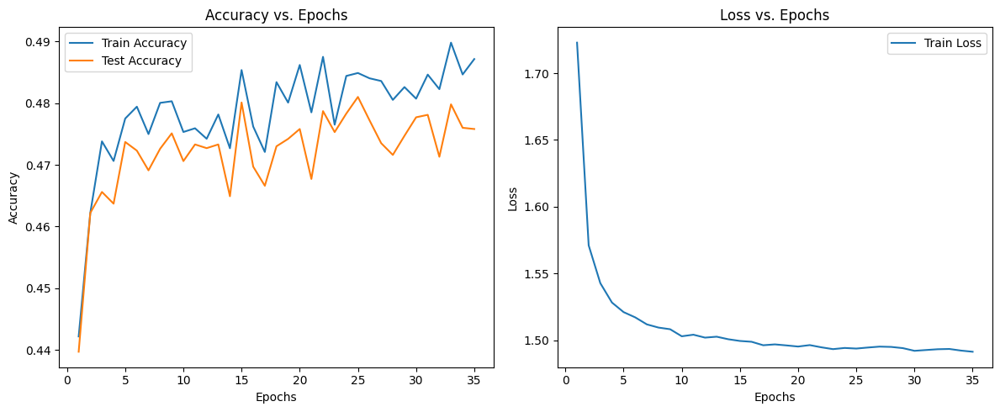

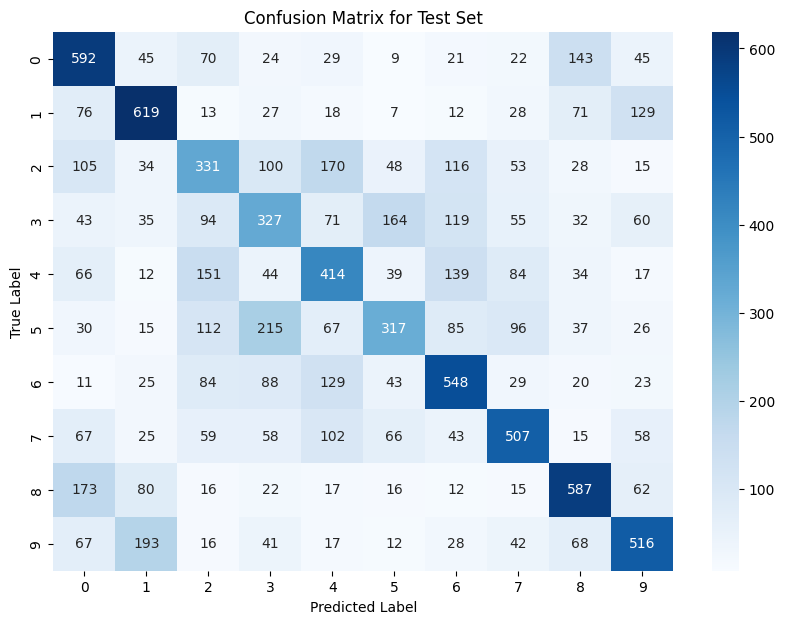

timecost:0.04031872749328613
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.48      0.59      0.53      1000
     Class 1       0.57      0.62      0.59      1000
     Class 2       0.35      0.33      0.34      1000
     Class 3       0.35      0.33      0.34      1000
     Class 4       0.40      0.41      0.41      1000
     Class 5       0.44      0.32      0.37      1000
     Class 6       0.49      0.55      0.52      1000
     Class 7       0.54      0.51      0.53      1000
     Class 8       0.57      0.59      0.58      1000
     Class 9       0.54      0.52      0.53      1000

    accuracy                           0.48     10000
   macro avg       0.47      0.48      0.47     10000
weighted avg       0.47      0.48      0.47     10000



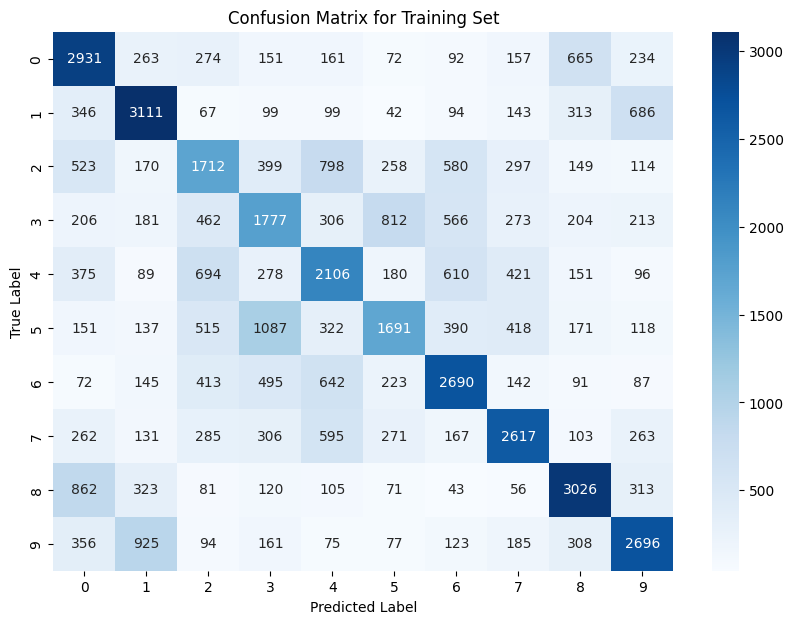

timecost:0.2487473487854004
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.48      0.59      0.53      5000
     Class 1       0.57      0.62      0.59      5000
     Class 2       0.37      0.34      0.36      5000
     Class 3       0.36      0.36      0.36      5000
     Class 4       0.40      0.42      0.41      5000
     Class 5       0.46      0.34      0.39      5000
     Class 6       0.50      0.54      0.52      5000
     Class 7       0.56      0.52      0.54      5000
     Class 8       0.58      0.61      0.59      5000
     Class 9       0.56      0.54      0.55      5000

    accuracy                           0.49     50000
   macro avg       0.49      0.49      0.48     50000
weighted avg       0.49      0.49      0.48     50000

timecost:52.69813847541809
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 para

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.30876, Test Accuracy: 0.3111, Loss: 1.983782115556125
Epoch 2, Train Accuracy: 0.31934, Test Accuracy: 0.3199, Loss: 1.95322298344509
Epoch 3, Train Accuracy: 0.3084, Test Accuracy: 0.3016, Loss: 1.9419042235303041
Epoch 4, Train Accuracy: 0.31462, Test Accuracy: 0.3128, Loss: 1.938873116327048
Epoch 5, Train Accuracy: 0.3217, Test Accuracy: 0.3225, Loss: 1.9402882402266326
Epoch 6, Train Accuracy: 0.3186, Test Accuracy: 0.3188, Loss: 1.9382311160155803
Epoch 7, Train Accuracy: 0.3244, Test Accuracy: 0.3253, Loss: 1.9406311892719104
Epoch 8, Train Accuracy: 0.31472, Test Accuracy: 0.319, Loss: 1.939623933923719
Epoch 9, Train Accuracy: 0.32466, Test Accuracy: 0.327, Loss: 1.9395633237483232
Epoch 10, Train Accuracy: 0.31312, Test Accuracy: 0.3138, Loss: 1.9396186217573363
Epoch 11, Train Accuracy: 0.30792, Test Accuracy: 0.3067, Loss: 1.9393812011535103
Epoch 12, Train Accuracy: 0.30554, Test Accuracy: 0.3045, Loss: 1.941271034433761
Epoch 13, Train Accuracy:

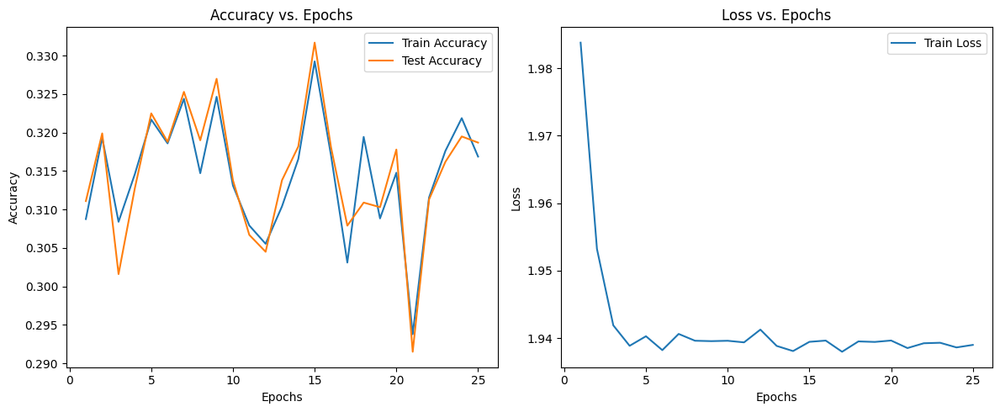

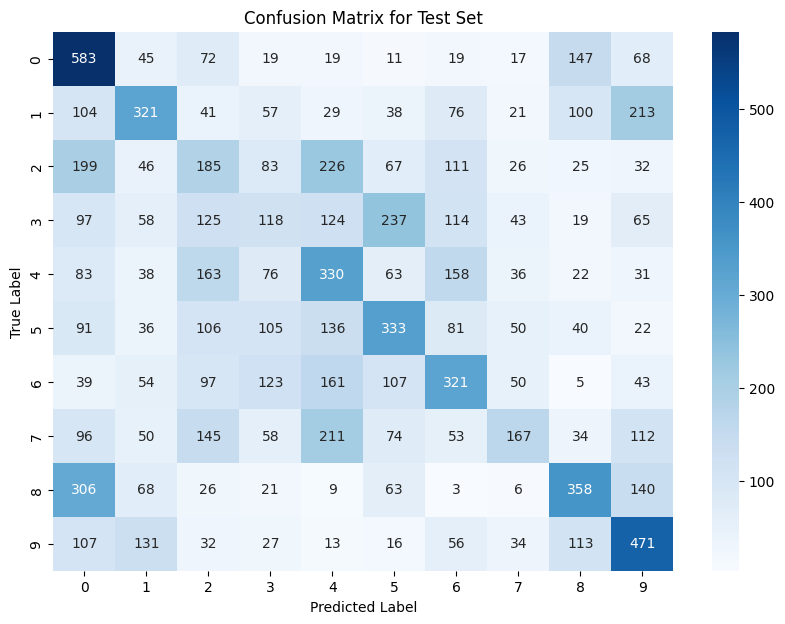

timecost:0.0515599250793457
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.34      0.58      0.43      1000
     Class 1       0.38      0.32      0.35      1000
     Class 2       0.19      0.18      0.19      1000
     Class 3       0.17      0.12      0.14      1000
     Class 4       0.26      0.33      0.29      1000
     Class 5       0.33      0.33      0.33      1000
     Class 6       0.32      0.32      0.32      1000
     Class 7       0.37      0.17      0.23      1000
     Class 8       0.41      0.36      0.38      1000
     Class 9       0.39      0.47      0.43      1000

    accuracy                           0.32     10000
   macro avg       0.32      0.32      0.31     10000
weighted avg       0.32      0.32      0.31     10000



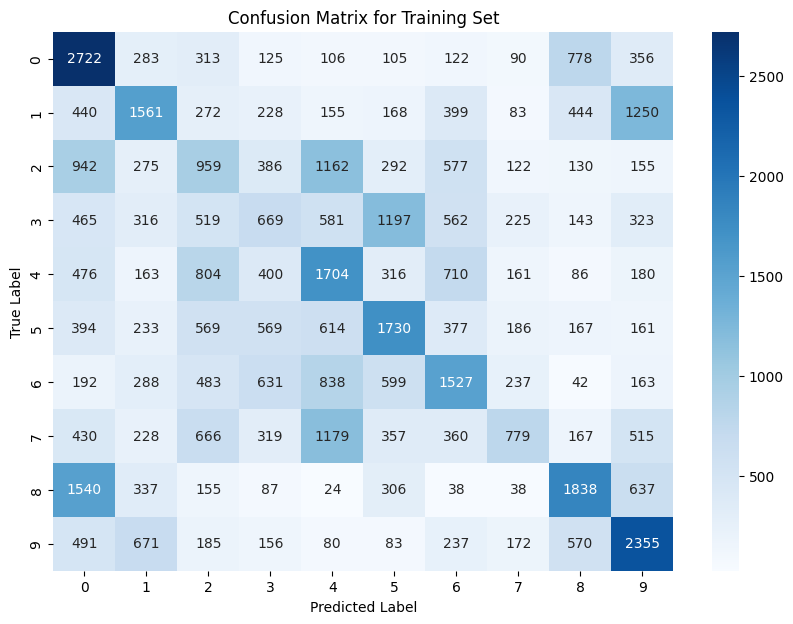

timecost:0.2014484405517578
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.34      0.54      0.42      5000
     Class 1       0.36      0.31      0.33      5000
     Class 2       0.19      0.19      0.19      5000
     Class 3       0.19      0.13      0.16      5000
     Class 4       0.26      0.34      0.30      5000
     Class 5       0.34      0.35      0.34      5000
     Class 6       0.31      0.31      0.31      5000
     Class 7       0.37      0.16      0.22      5000
     Class 8       0.42      0.37      0.39      5000
     Class 9       0.39      0.47      0.42      5000

    accuracy                           0.32     50000
   macro avg       0.32      0.32      0.31     50000
weighted avg       0.32      0.32      0.31     50000

timecost:34.541526079177856
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 par

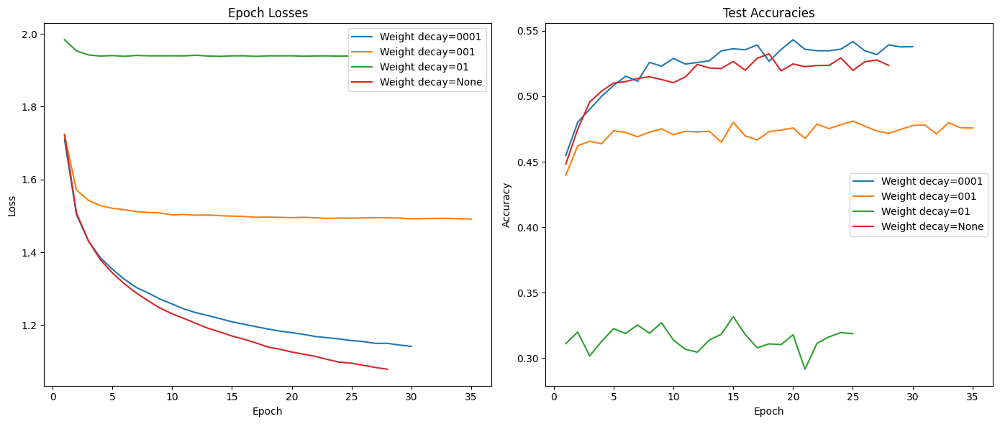

In [ ]:
# Weight decay
model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_wd_none = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0,
                      mu=0.9,
                      patience=10)
trainings_wd_none.mini_batch_train()
print("train_accuracies:",trainings_wd_none.train_accuracies)
print("test_accuracies:",trainings_wd_none.test_accuracies)
print("epoch_losses:",trainings_wd_none.epoch_losses)
print("params_count:",trainings_wd_none.params_count)
print("train_timecost:",trainings_wd_none.train_timecost)
print("test_timecost:",trainings_wd_none.test_timecost)
print("train_report:",trainings_wd_none.train_report)
print("test_report:",trainings_wd_none.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_wd_0001 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.9,
                      patience=10)
trainings_wd_0001.mini_batch_train()
print("train_accuracies:",trainings_wd_0001.train_accuracies)
print("test_accuracies:",trainings_wd_0001.test_accuracies)
print("epoch_losses:",trainings_wd_0001.epoch_losses)
print("params_count:",trainings_wd_0001.params_count)
print("train_timecost:",trainings_wd_0001.train_timecost)
print("test_timecost:",trainings_wd_0001.test_timecost)
print("train_report:",trainings_wd_0001.train_report)
print("test_report:",trainings_wd_0001.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_wd_001 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.01,
                      mu=0.9,
                      patience=10)
trainings_wd_001.mini_batch_train()
print("train_accuracies:",trainings_wd_001.train_accuracies)
print("test_accuracies:",trainings_wd_001.test_accuracies)
print("epoch_losses:",trainings_wd_001.epoch_losses)
print("params_count:",trainings_wd_001.params_count)
print("train_timecost:",trainings_wd_001.train_timecost)
print("test_timecost:",trainings_wd_001.test_timecost)
print("train_report:",trainings_wd_001.train_report)
print("test_report:",trainings_wd_001.test_report)


model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_wd_01 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.1,
                      mu=0.9,
                      patience=10)
trainings_wd_01.mini_batch_train()
print("train_accuracies:",trainings_wd_01.train_accuracies)
print("test_accuracies:",trainings_wd_01.test_accuracies)
print("epoch_losses:",trainings_wd_01.epoch_losses)
print("params_count:",trainings_wd_01.params_count)
print("train_timecost:",trainings_wd_01.train_timecost)
print("test_timecost:",trainings_wd_01.test_timecost)
print("train_report:",trainings_wd_01.train_report)
print("test_report:",trainings_wd_01.test_report)

epoch_losses = {
"0001":trainings_wd_0001.epoch_losses,
"001":trainings_wd_001.epoch_losses,
"01":trainings_wd_01.epoch_losses,
"None":trainings_wd_none.epoch_losses
}

test_accuracies = {
"0001":trainings_wd_0001.test_accuracies,
"001":trainings_wd_001.test_accuracies,
"01":trainings_wd_01.test_accuracies,
"None":trainings_wd_none.test_accuracies
}
plot_training_results(epoch_losses, test_accuracies, 'Weight decay')

### momentum

Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 parameters
Layer 3 (SoftmaxLayer): No parameters or `param_count` method not implemented.
Total parameters: 17802


<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.45824, Test Accuracy: 0.4475, Loss: 1.7119743803394591
Epoch 2, Train Accuracy: 0.49344, Test Accuracy: 0.4761, Loss: 1.5052507611523576
Epoch 3, Train Accuracy: 0.518, Test Accuracy: 0.4959, Loss: 1.4351827802035515
Epoch 4, Train Accuracy: 0.52984, Test Accuracy: 0.5017, Loss: 1.387985806010917
Epoch 5, Train Accuracy: 0.54222, Test Accuracy: 0.5136, Loss: 1.3523313975327922
Epoch 6, Train Accuracy: 0.54912, Test Accuracy: 0.5066, Loss: 1.3284839580525563
Epoch 7, Train Accuracy: 0.55916, Test Accuracy: 0.5143, Loss: 1.3076118101518914
Epoch 8, Train Accuracy: 0.56698, Test Accuracy: 0.5203, Loss: 1.2893201656501958
Epoch 9, Train Accuracy: 0.56688, Test Accuracy: 0.517, Loss: 1.273223261068696
Epoch 10, Train Accuracy: 0.57858, Test Accuracy: 0.524, Loss: 1.2621687139835802
Epoch 11, Train Accuracy: 0.58162, Test Accuracy: 0.5266, Loss: 1.2476767754759366
Epoch 12, Train Accuracy: 0.5886, Test Accuracy: 0.5283, Loss: 1.2380871442817851
Epoch 13, Train Accu

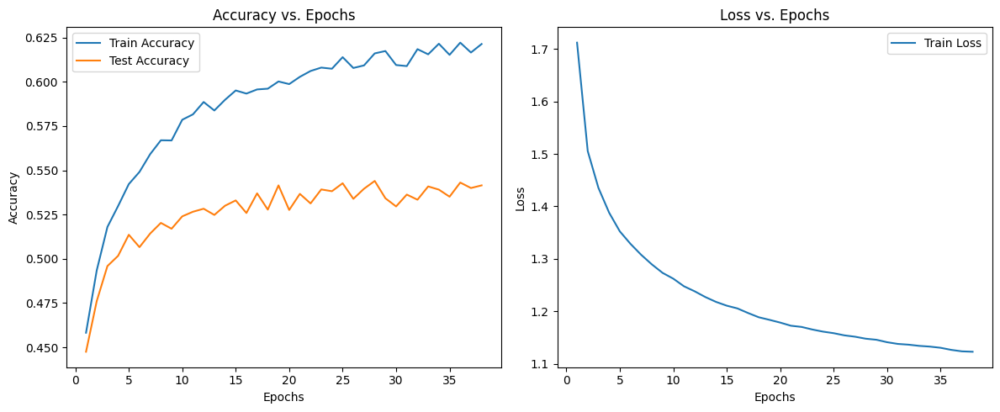

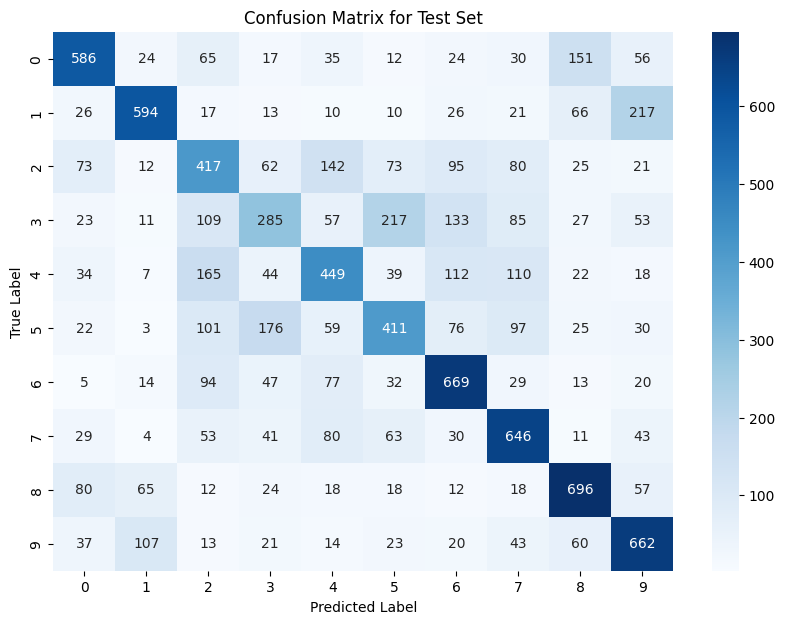

timecost:0.05237531661987305
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.64      0.59      0.61      1000
     Class 1       0.71      0.59      0.65      1000
     Class 2       0.40      0.42      0.41      1000
     Class 3       0.39      0.28      0.33      1000
     Class 4       0.48      0.45      0.46      1000
     Class 5       0.46      0.41      0.43      1000
     Class 6       0.56      0.67      0.61      1000
     Class 7       0.56      0.65      0.60      1000
     Class 8       0.64      0.70      0.66      1000
     Class 9       0.56      0.66      0.61      1000

    accuracy                           0.54     10000
   macro avg       0.54      0.54      0.54     10000
weighted avg       0.54      0.54      0.54     10000



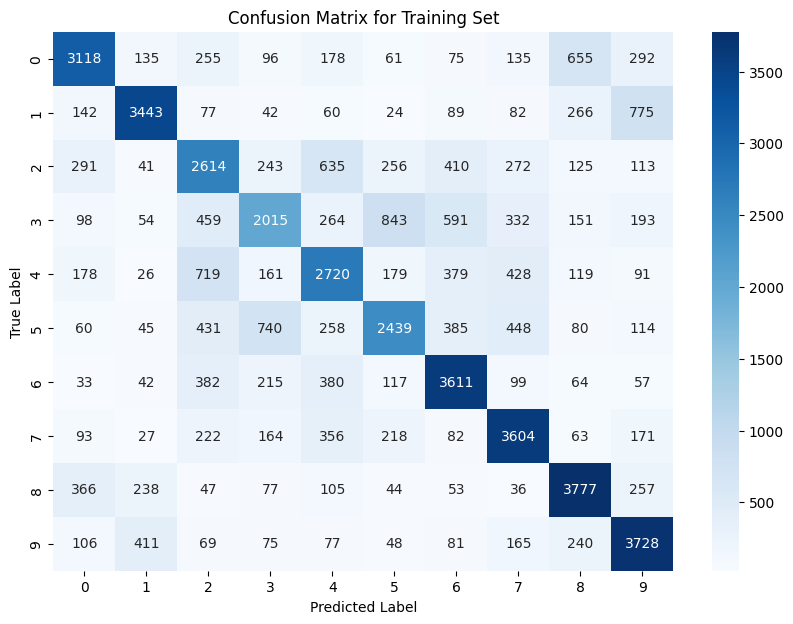

timecost:0.2562427520751953
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.70      0.62      0.66      5000
     Class 1       0.77      0.69      0.73      5000
     Class 2       0.50      0.52      0.51      5000
     Class 3       0.53      0.40      0.46      5000
     Class 4       0.54      0.54      0.54      5000
     Class 5       0.58      0.49      0.53      5000
     Class 6       0.63      0.72      0.67      5000
     Class 7       0.64      0.72      0.68      5000
     Class 8       0.68      0.76      0.72      5000
     Class 9       0.64      0.75      0.69      5000

    accuracy                           0.62     50000
   macro avg       0.62      0.62      0.62     50000
weighted avg       0.62      0.62      0.62     50000

timecost:61.61209535598755
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 para

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.46248, Test Accuracy: 0.4557, Loss: 1.7097227398140245
Epoch 2, Train Accuracy: 0.49884, Test Accuracy: 0.4776, Loss: 1.4989577054066348
Epoch 3, Train Accuracy: 0.51274, Test Accuracy: 0.4895, Loss: 1.426429623705229
Epoch 4, Train Accuracy: 0.5375, Test Accuracy: 0.5079, Loss: 1.3808909725417544
Epoch 5, Train Accuracy: 0.54506, Test Accuracy: 0.5071, Loss: 1.3460290941431643
Epoch 6, Train Accuracy: 0.5533, Test Accuracy: 0.5164, Loss: 1.3208702652603896
Epoch 7, Train Accuracy: 0.55766, Test Accuracy: 0.5182, Loss: 1.3014758101674901
Epoch 8, Train Accuracy: 0.56476, Test Accuracy: 0.5168, Loss: 1.284098518822064
Epoch 9, Train Accuracy: 0.5663, Test Accuracy: 0.5166, Loss: 1.2670810467202818
Epoch 10, Train Accuracy: 0.57622, Test Accuracy: 0.5267, Loss: 1.252156051300629
Epoch 11, Train Accuracy: 0.57714, Test Accuracy: 0.5287, Loss: 1.2432621786230693
Epoch 12, Train Accuracy: 0.57958, Test Accuracy: 0.5269, Loss: 1.2345593009077371
Epoch 13, Train Acc

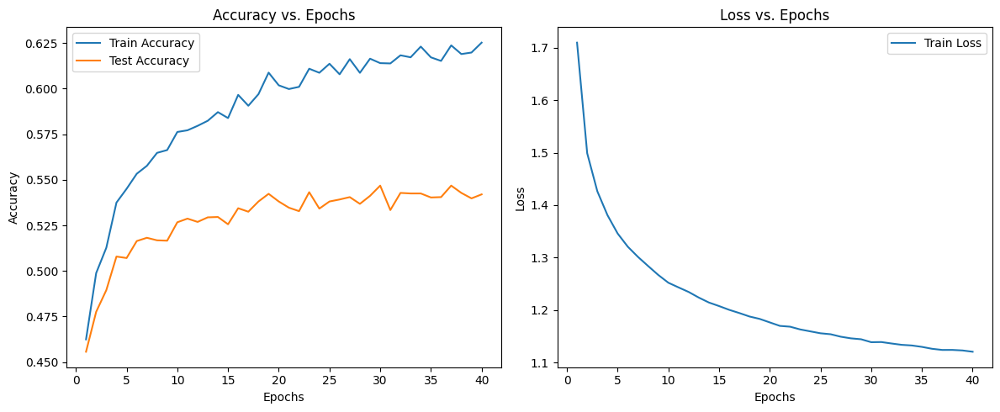

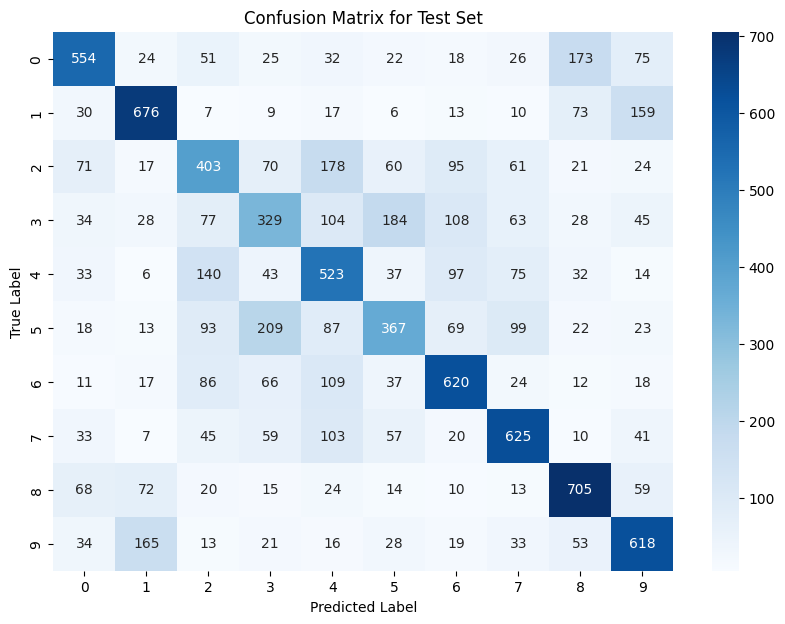

timecost:0.062387704849243164
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.63      0.55      0.59      1000
     Class 1       0.66      0.68      0.67      1000
     Class 2       0.43      0.40      0.42      1000
     Class 3       0.39      0.33      0.36      1000
     Class 4       0.44      0.52      0.48      1000
     Class 5       0.45      0.37      0.41      1000
     Class 6       0.58      0.62      0.60      1000
     Class 7       0.61      0.62      0.62      1000
     Class 8       0.62      0.70      0.66      1000
     Class 9       0.57      0.62      0.60      1000

    accuracy                           0.54     10000
   macro avg       0.54      0.54      0.54     10000
weighted avg       0.54      0.54      0.54     10000



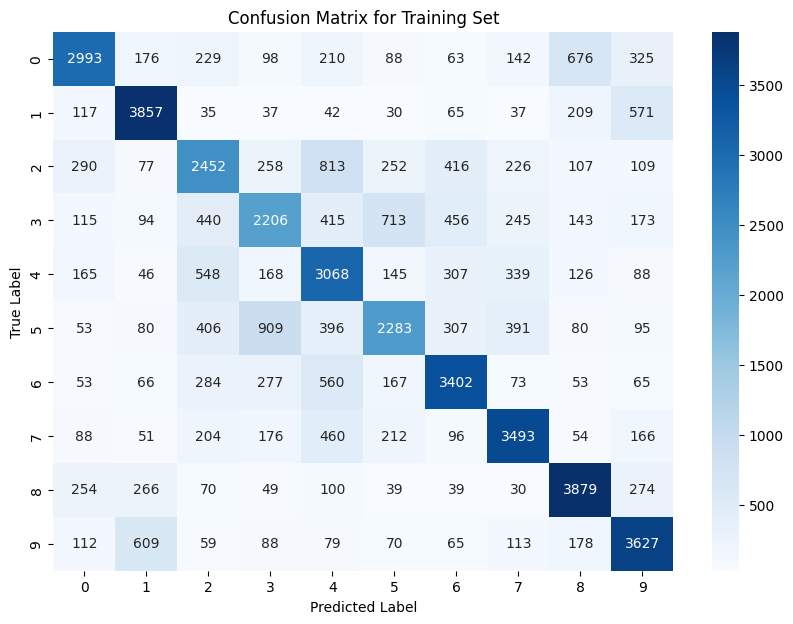

timecost:0.2648637294769287
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.71      0.60      0.65      5000
     Class 1       0.72      0.77      0.75      5000
     Class 2       0.52      0.49      0.50      5000
     Class 3       0.52      0.44      0.48      5000
     Class 4       0.50      0.61      0.55      5000
     Class 5       0.57      0.46      0.51      5000
     Class 6       0.65      0.68      0.67      5000
     Class 7       0.69      0.70      0.69      5000
     Class 8       0.70      0.78      0.74      5000
     Class 9       0.66      0.73      0.69      5000

    accuracy                           0.63     50000
   macro avg       0.62      0.63      0.62     50000
weighted avg       0.62      0.63      0.62     50000

timecost:64.83515095710754
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 para

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.4562, Test Accuracy: 0.445, Loss: 1.7322028197958268
Epoch 2, Train Accuracy: 0.49318, Test Accuracy: 0.4806, Loss: 1.5075532658247632
Epoch 3, Train Accuracy: 0.51428, Test Accuracy: 0.4922, Loss: 1.430123967127041
Epoch 4, Train Accuracy: 0.53256, Test Accuracy: 0.4983, Loss: 1.3837853099944846
Epoch 5, Train Accuracy: 0.54146, Test Accuracy: 0.5036, Loss: 1.3491816263055796
Epoch 6, Train Accuracy: 0.55178, Test Accuracy: 0.5131, Loss: 1.3227212569837847
Epoch 7, Train Accuracy: 0.5575, Test Accuracy: 0.5189, Loss: 1.301179158167687
Epoch 8, Train Accuracy: 0.5612, Test Accuracy: 0.5129, Loss: 1.2807816387028639
Epoch 9, Train Accuracy: 0.56824, Test Accuracy: 0.5194, Loss: 1.2633994378329392
Epoch 10, Train Accuracy: 0.57132, Test Accuracy: 0.5181, Loss: 1.2522452760458813
Epoch 11, Train Accuracy: 0.57976, Test Accuracy: 0.5281, Loss: 1.2413412500672993
Epoch 12, Train Accuracy: 0.58016, Test Accuracy: 0.5273, Loss: 1.2297965782235325
Epoch 13, Train Acc

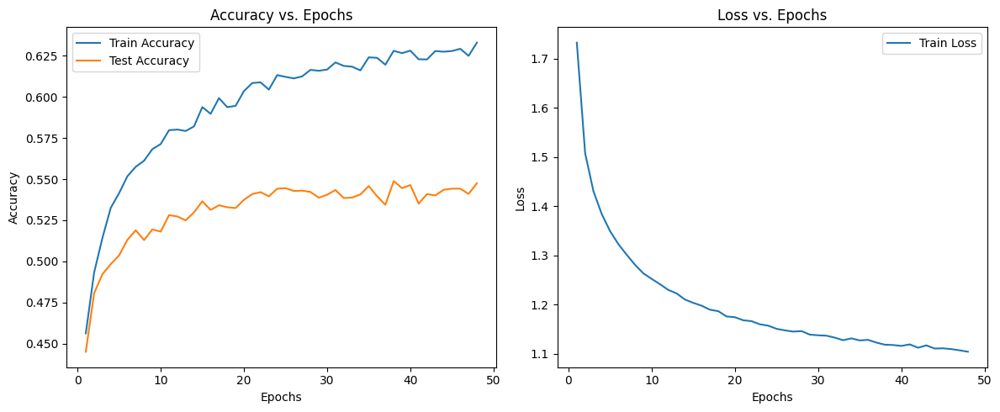

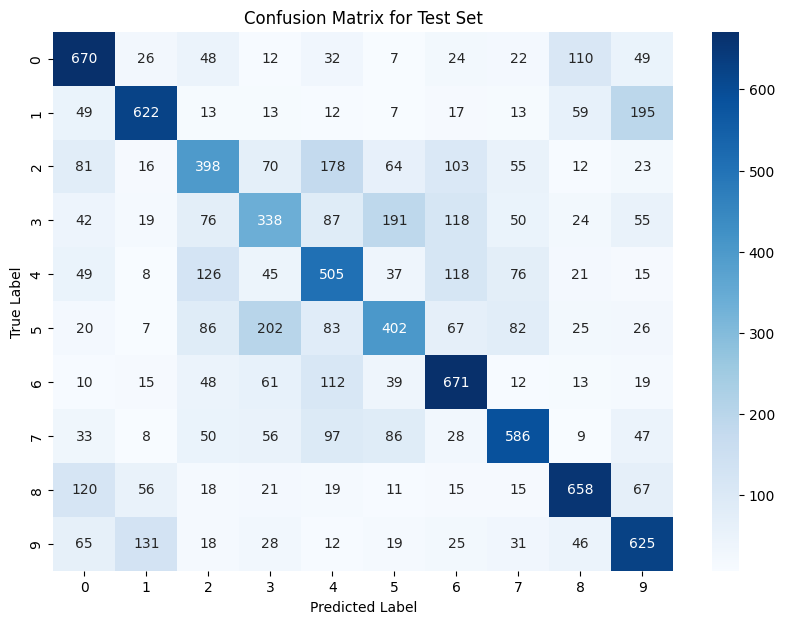

timecost:0.047942161560058594
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.59      0.67      0.63      1000
     Class 1       0.69      0.62      0.65      1000
     Class 2       0.45      0.40      0.42      1000
     Class 3       0.40      0.34      0.37      1000
     Class 4       0.44      0.51      0.47      1000
     Class 5       0.47      0.40      0.43      1000
     Class 6       0.57      0.67      0.61      1000
     Class 7       0.62      0.59      0.60      1000
     Class 8       0.67      0.66      0.67      1000
     Class 9       0.56      0.62      0.59      1000

    accuracy                           0.55     10000
   macro avg       0.55      0.55      0.54     10000
weighted avg       0.55      0.55      0.54     10000



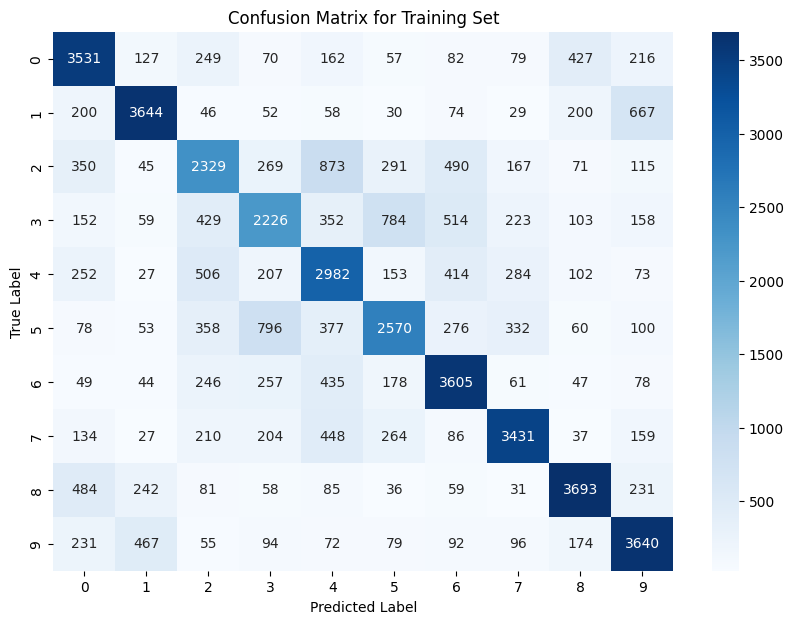

timecost:0.2600250244140625
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.65      0.71      0.68      5000
     Class 1       0.77      0.73      0.75      5000
     Class 2       0.52      0.47      0.49      5000
     Class 3       0.53      0.45      0.48      5000
     Class 4       0.51      0.60      0.55      5000
     Class 5       0.58      0.51      0.54      5000
     Class 6       0.63      0.72      0.67      5000
     Class 7       0.72      0.69      0.71      5000
     Class 8       0.75      0.74      0.75      5000
     Class 9       0.67      0.73      0.70      5000

    accuracy                           0.63     50000
   macro avg       0.63      0.63      0.63     50000
weighted avg       0.63      0.63      0.63     50000

timecost:78.24501991271973
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 para

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.45444, Test Accuracy: 0.4411, Loss: 1.7408400501833172
Epoch 2, Train Accuracy: 0.48888, Test Accuracy: 0.4712, Loss: 1.5094463269405909
Epoch 3, Train Accuracy: 0.51562, Test Accuracy: 0.4928, Loss: 1.429722758780999
Epoch 4, Train Accuracy: 0.5326, Test Accuracy: 0.5025, Loss: 1.3833175071623336
Epoch 5, Train Accuracy: 0.5413, Test Accuracy: 0.5059, Loss: 1.3493207027031633
Epoch 6, Train Accuracy: 0.54644, Test Accuracy: 0.5088, Loss: 1.3210245069325912
Epoch 7, Train Accuracy: 0.55914, Test Accuracy: 0.5181, Loss: 1.3031387681911062
Epoch 8, Train Accuracy: 0.56608, Test Accuracy: 0.5176, Loss: 1.2816783386909771
Epoch 9, Train Accuracy: 0.56142, Test Accuracy: 0.5157, Loss: 1.268579890637297
Epoch 10, Train Accuracy: 0.57216, Test Accuracy: 0.5205, Loss: 1.2554592370043562
Epoch 11, Train Accuracy: 0.57936, Test Accuracy: 0.5226, Loss: 1.2423475041857959
Epoch 12, Train Accuracy: 0.58206, Test Accuracy: 0.531, Loss: 1.2317963447019793
Epoch 13, Train Ac

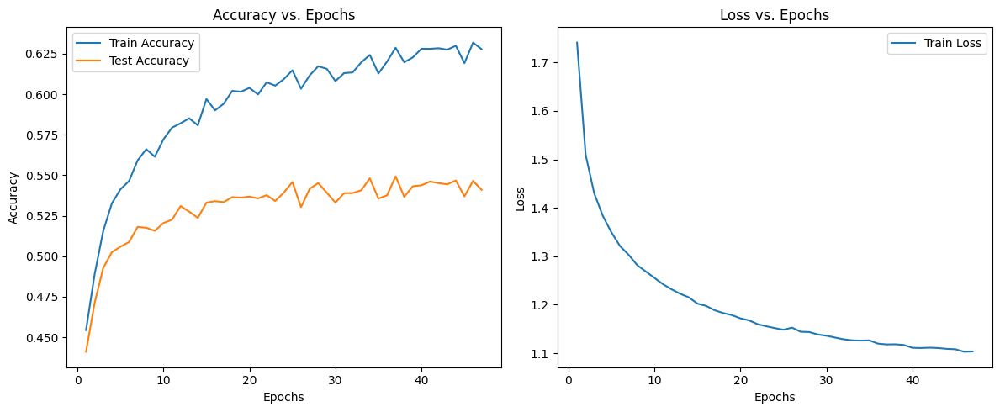

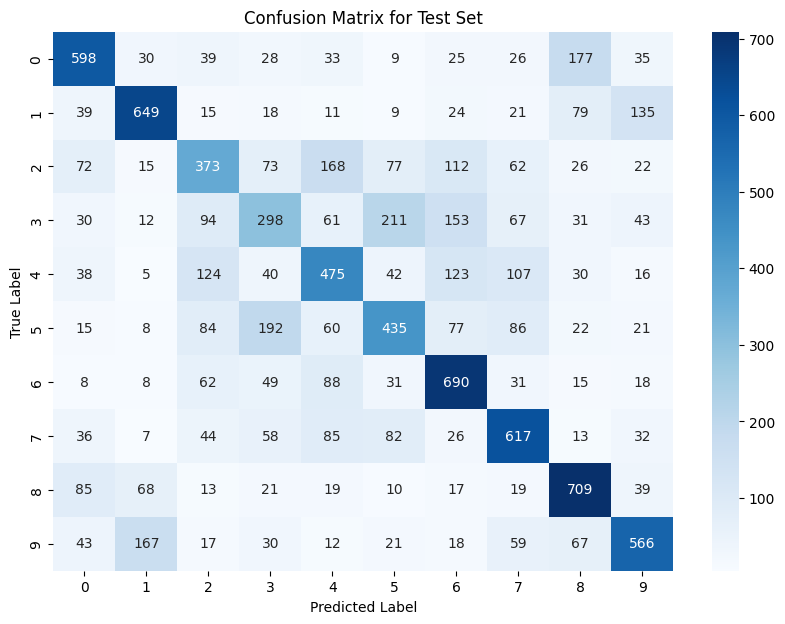

timecost:0.04956173896789551
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.62      0.60      0.61      1000
     Class 1       0.67      0.65      0.66      1000
     Class 2       0.43      0.37      0.40      1000
     Class 3       0.37      0.30      0.33      1000
     Class 4       0.47      0.47      0.47      1000
     Class 5       0.47      0.43      0.45      1000
     Class 6       0.55      0.69      0.61      1000
     Class 7       0.56      0.62      0.59      1000
     Class 8       0.61      0.71      0.65      1000
     Class 9       0.61      0.57      0.59      1000

    accuracy                           0.54     10000
   macro avg       0.54      0.54      0.54     10000
weighted avg       0.54      0.54      0.54     10000



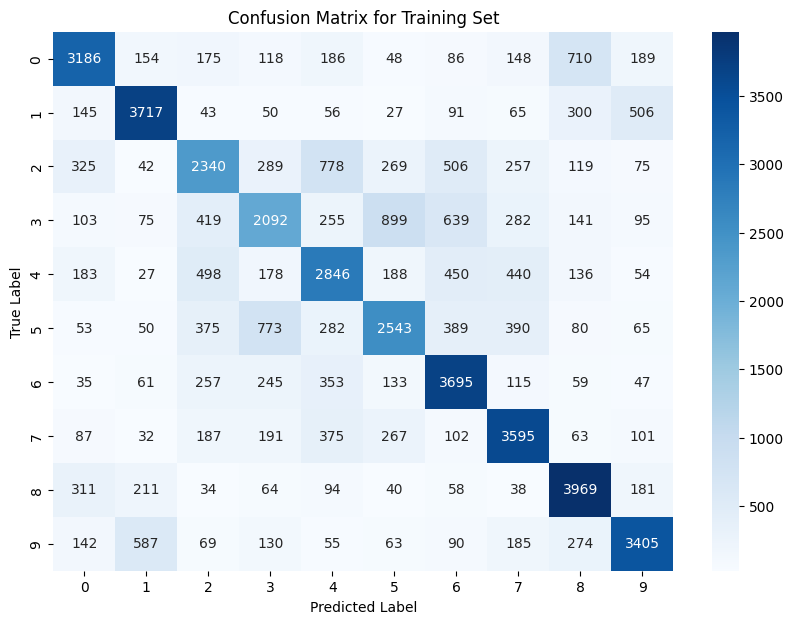

timecost:0.25284528732299805
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.70      0.64      0.67      5000
     Class 1       0.75      0.74      0.75      5000
     Class 2       0.53      0.47      0.50      5000
     Class 3       0.51      0.42      0.46      5000
     Class 4       0.54      0.57      0.55      5000
     Class 5       0.57      0.51      0.54      5000
     Class 6       0.61      0.74      0.67      5000
     Class 7       0.65      0.72      0.68      5000
     Class 8       0.68      0.79      0.73      5000
     Class 9       0.72      0.68      0.70      5000

    accuracy                           0.63     50000
   macro avg       0.62      0.63      0.62     50000
weighted avg       0.62      0.63      0.62     50000

timecost:76.19510817527771
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 par

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.39548, Test Accuracy: 0.3907, Loss: 2.020380796868225
Epoch 2, Train Accuracy: 0.4588, Test Accuracy: 0.4441, Loss: 1.6209418488793896
Epoch 3, Train Accuracy: 0.48386, Test Accuracy: 0.469, Loss: 1.4971020320699169
Epoch 4, Train Accuracy: 0.51834, Test Accuracy: 0.4967, Loss: 1.4247600585989229
Epoch 5, Train Accuracy: 0.53022, Test Accuracy: 0.5002, Loss: 1.3728517446865598
Epoch 6, Train Accuracy: 0.54194, Test Accuracy: 0.5114, Loss: 1.3355142865511291
Epoch 7, Train Accuracy: 0.55138, Test Accuracy: 0.5166, Loss: 1.3037489295065516
Epoch 8, Train Accuracy: 0.561, Test Accuracy: 0.5186, Loss: 1.2858082105885993
Epoch 9, Train Accuracy: 0.5658, Test Accuracy: 0.5213, Loss: 1.2672919024299525
Epoch 10, Train Accuracy: 0.56812, Test Accuracy: 0.5268, Loss: 1.251652850898734
Epoch 11, Train Accuracy: 0.57322, Test Accuracy: 0.5257, Loss: 1.2376936082615142
Epoch 12, Train Accuracy: 0.57618, Test Accuracy: 0.5211, Loss: 1.222396798956308
Epoch 13, Train Accur

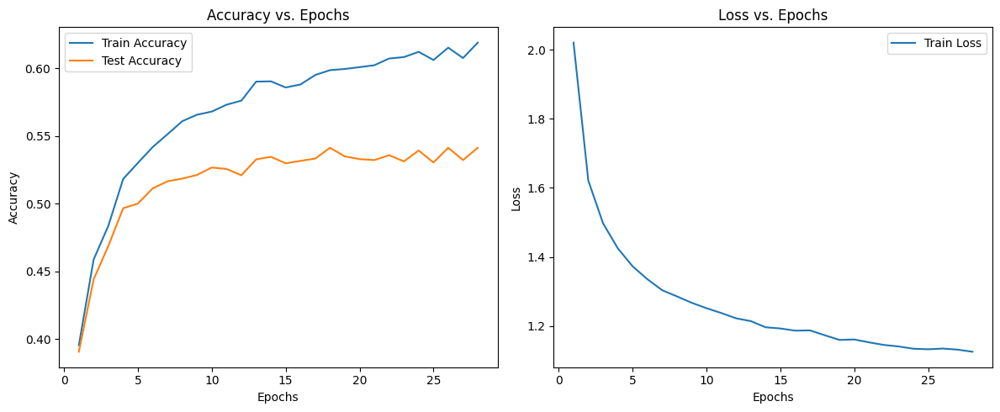

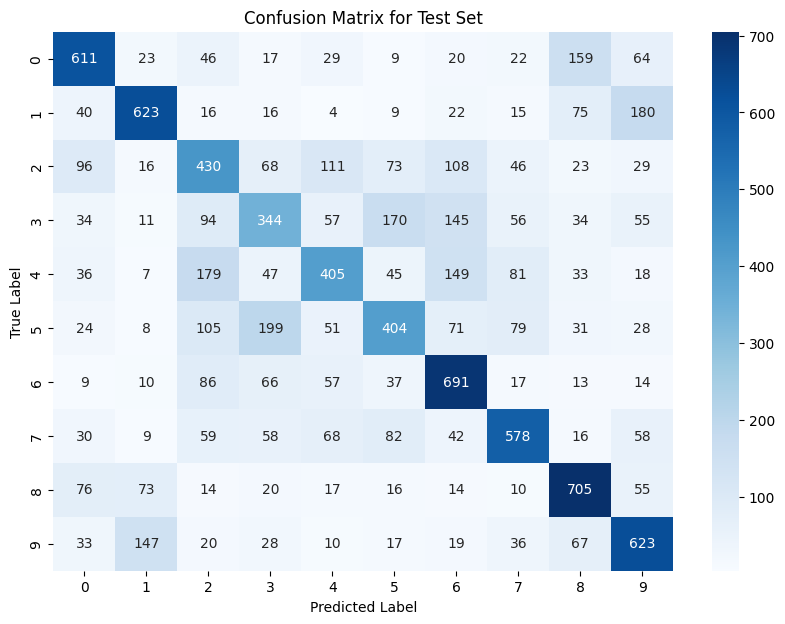

timecost:0.06446146965026855
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.62      0.61      0.61      1000
     Class 1       0.67      0.62      0.65      1000
     Class 2       0.41      0.43      0.42      1000
     Class 3       0.40      0.34      0.37      1000
     Class 4       0.50      0.41      0.45      1000
     Class 5       0.47      0.40      0.43      1000
     Class 6       0.54      0.69      0.61      1000
     Class 7       0.61      0.58      0.60      1000
     Class 8       0.61      0.70      0.65      1000
     Class 9       0.55      0.62      0.59      1000

    accuracy                           0.54     10000
   macro avg       0.54      0.54      0.54     10000
weighted avg       0.54      0.54      0.54     10000



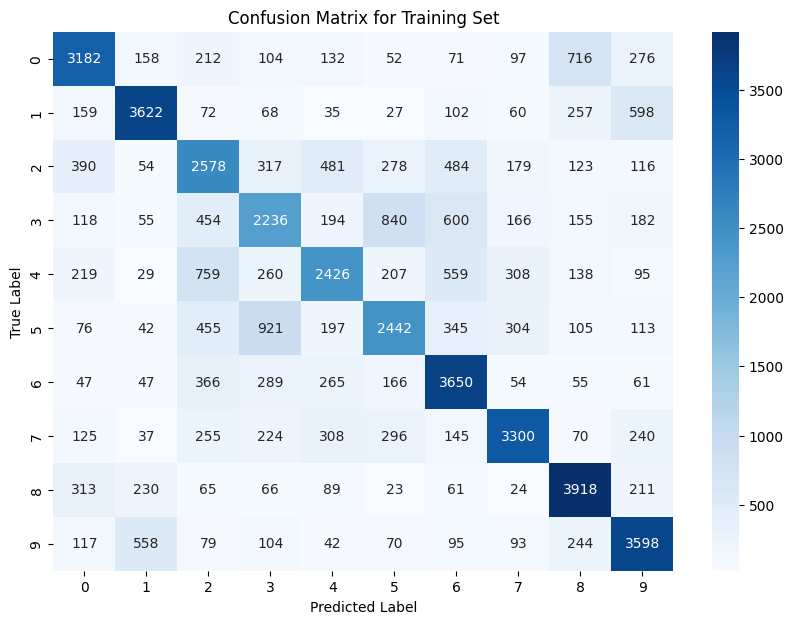

timecost:0.24626541137695312
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.67      0.64      0.65      5000
     Class 1       0.75      0.72      0.74      5000
     Class 2       0.49      0.52      0.50      5000
     Class 3       0.49      0.45      0.47      5000
     Class 4       0.58      0.49      0.53      5000
     Class 5       0.55      0.49      0.52      5000
     Class 6       0.60      0.73      0.66      5000
     Class 7       0.72      0.66      0.69      5000
     Class 8       0.68      0.78      0.73      5000
     Class 9       0.66      0.72      0.69      5000

    accuracy                           0.62     50000
   macro avg       0.62      0.62      0.62     50000
weighted avg       0.62      0.62      0.62     50000

timecost:45.21914577484131
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 par

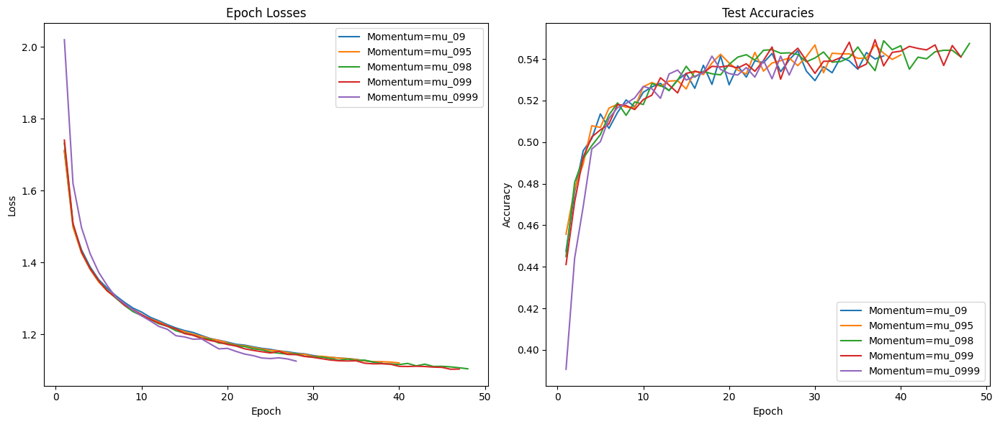

In [ ]:
# momentum
model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_mu_09 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.9,
                      patience=10)
trainings_mu_09.mini_batch_train()
print("train_accuracies:",trainings_mu_09.train_accuracies)
print("test_accuracies:",trainings_mu_09.test_accuracies)
print("epoch_losses:",trainings_mu_09.epoch_losses)
print("params_count:",trainings_mu_09.params_count)
print("train_timecost:",trainings_mu_09.train_timecost)
print("test_timecost:",trainings_mu_09.test_timecost)
print("train_report:",trainings_mu_09.train_report)
print("test_report:",trainings_mu_09.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_mu_095 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.95,
                      patience=10)
trainings_mu_095.mini_batch_train()
print("train_accuracies:",trainings_mu_095.train_accuracies)
print("test_accuracies:",trainings_mu_095.test_accuracies)
print("epoch_losses:",trainings_mu_095.epoch_losses)
print("params_count:",trainings_mu_095.params_count)
print("train_timecost:",trainings_mu_095.train_timecost)
print("test_timecost:",trainings_mu_095.test_timecost)
print("train_report:",trainings_mu_095.train_report)
print("test_report:",trainings_mu_095.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_mu_098 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.98,
                      patience=10)
trainings_mu_098.mini_batch_train()
print("train_accuracies:",trainings_mu_098.train_accuracies)
print("test_accuracies:",trainings_mu_098.test_accuracies)
print("epoch_losses:",trainings_mu_098.epoch_losses)
print("params_count:",trainings_mu_098.params_count)
print("train_timecost:",trainings_mu_098.train_timecost)
print("test_timecost:",trainings_mu_098.test_timecost)
print("train_report:",trainings_mu_098.train_report)
print("test_report:",trainings_mu_098.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_mu_099 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.99,
                      patience=10)
trainings_mu_099.mini_batch_train()
print("train_accuracies:",trainings_mu_099.train_accuracies)
print("test_accuracies:",trainings_mu_099.test_accuracies)
print("epoch_losses:",trainings_mu_099.epoch_losses)
print("params_count:",trainings_mu_099.params_count)
print("train_timecost:",trainings_mu_099.train_timecost)
print("test_timecost:",trainings_mu_099.test_timecost)
print("train_report:",trainings_mu_099.train_report)
print("test_report:",trainings_mu_099.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_mu_0999 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_mu_0999.mini_batch_train()
print("train_accuracies:",trainings_mu_0999.train_accuracies)
print("test_accuracies:",trainings_mu_0999.test_accuracies)
print("epoch_losses:",trainings_mu_0999.epoch_losses)
print("params_count:",trainings_mu_0999.params_count)
print("train_timecost:",trainings_mu_0999.train_timecost)
print("test_timecost:",trainings_mu_0999.test_timecost)
print("train_report:",trainings_mu_0999.train_report)
print("test_report:",trainings_mu_0999.test_report)


epoch_losses = {
"mu_09":trainings_mu_09.epoch_losses,
"mu_095":trainings_mu_095.epoch_losses,
"mu_098":trainings_mu_098.epoch_losses,
"mu_099":trainings_mu_099.epoch_losses,
"mu_0999":trainings_mu_0999.epoch_losses

}

test_accuracies = {
    "mu_09":trainings_mu_09.test_accuracies,
    "mu_095":trainings_mu_095.test_accuracies,
    "mu_098":trainings_mu_098.test_accuracies,
    "mu_099":trainings_mu_099.test_accuracies,
    "mu_0999":trainings_mu_0999.test_accuracies
}

plot_training_results(epoch_losses, test_accuracies, 'Momentum')

### Neurons

Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 2570 parameters
Layer 3 (SoftmaxLayer): No parameters or `param_count` method not implemented.
Total parameters: 35594


<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.41246, Test Accuracy: 0.4075, Loss: 1.986186459883141
Epoch 2, Train Accuracy: 0.47934, Test Accuracy: 0.4612, Loss: 1.5822177338315095
Epoch 3, Train Accuracy: 0.51752, Test Accuracy: 0.4919, Loss: 1.44371329856241
Epoch 4, Train Accuracy: 0.53802, Test Accuracy: 0.5043, Loss: 1.3680455887467522
Epoch 5, Train Accuracy: 0.55462, Test Accuracy: 0.5156, Loss: 1.3199533520469926
Epoch 6, Train Accuracy: 0.56034, Test Accuracy: 0.5164, Loss: 1.286838477315257
Epoch 7, Train Accuracy: 0.57882, Test Accuracy: 0.5264, Loss: 1.2613684185085186
Epoch 8, Train Accuracy: 0.58014, Test Accuracy: 0.5284, Loss: 1.2331239289747413
Epoch 9, Train Accuracy: 0.58278, Test Accuracy: 0.5255, Loss: 1.2155021290277057
Epoch 10, Train Accuracy: 0.58964, Test Accuracy: 0.5301, Loss: 1.200029121512751
Epoch 11, Train Accuracy: 0.5942, Test Accuracy: 0.5309, Loss: 1.194191219663889
Epoch 12, Train Accuracy: 0.6064, Test Accuracy: 0.5379, Loss: 1.1687942526344846
Epoch 13, Train Accur

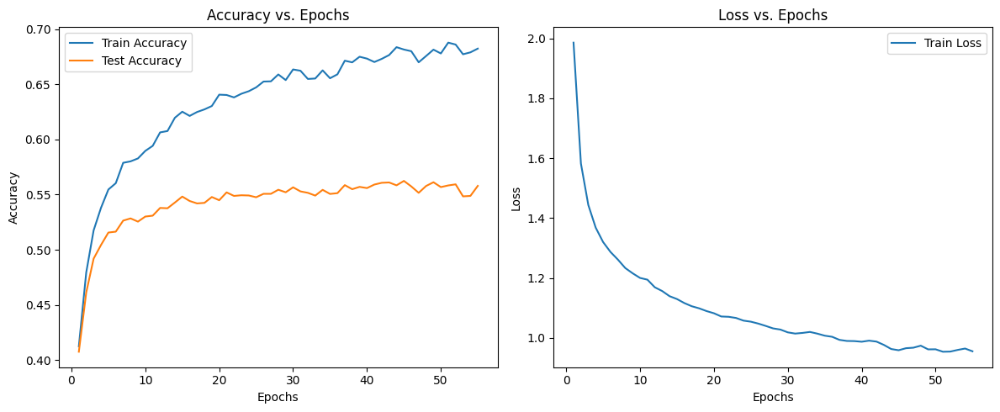

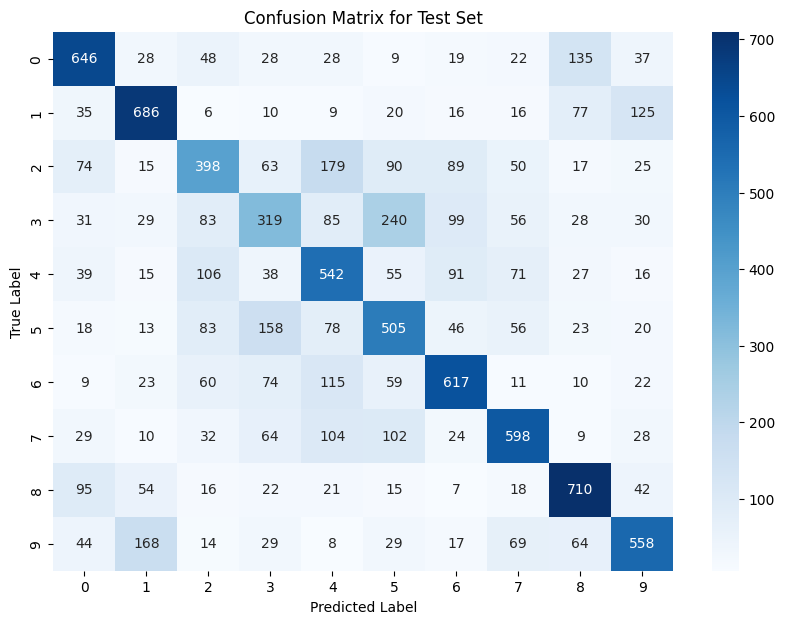

timecost:0.10481548309326172
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.63      0.65      0.64      1000
     Class 1       0.66      0.69      0.67      1000
     Class 2       0.47      0.40      0.43      1000
     Class 3       0.40      0.32      0.35      1000
     Class 4       0.46      0.54      0.50      1000
     Class 5       0.45      0.51      0.48      1000
     Class 6       0.60      0.62      0.61      1000
     Class 7       0.62      0.60      0.61      1000
     Class 8       0.65      0.71      0.68      1000
     Class 9       0.62      0.56      0.59      1000

    accuracy                           0.56     10000
   macro avg       0.56      0.56      0.56     10000
weighted avg       0.56      0.56      0.56     10000



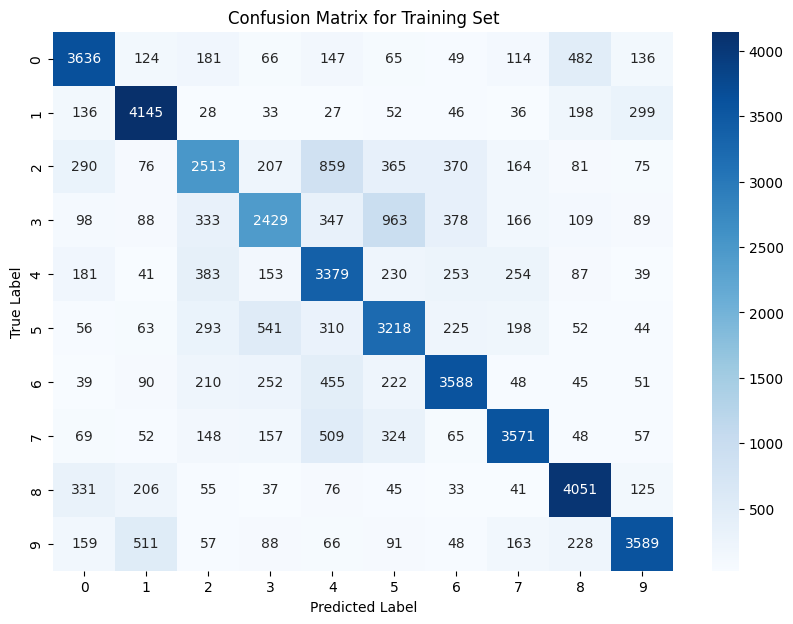

timecost:0.4252605438232422
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.73      0.73      0.73      5000
     Class 1       0.77      0.83      0.80      5000
     Class 2       0.60      0.50      0.55      5000
     Class 3       0.61      0.49      0.54      5000
     Class 4       0.55      0.68      0.60      5000
     Class 5       0.58      0.64      0.61      5000
     Class 6       0.71      0.72      0.71      5000
     Class 7       0.75      0.71      0.73      5000
     Class 8       0.75      0.81      0.78      5000
     Class 9       0.80      0.72      0.76      5000

    accuracy                           0.68     50000
   macro avg       0.68      0.68      0.68     50000
weighted avg       0.68      0.68      0.68     50000

timecost:184.55769038200378
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 2570 par

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.38608, Test Accuracy: 0.3824, Loss: 2.0431177048845743
Epoch 2, Train Accuracy: 0.45998, Test Accuracy: 0.4511, Loss: 1.6257994050065268
Epoch 3, Train Accuracy: 0.4878, Test Accuracy: 0.4734, Loss: 1.49548985894937
Epoch 4, Train Accuracy: 0.5214, Test Accuracy: 0.496, Loss: 1.4174800193097332
Epoch 5, Train Accuracy: 0.53418, Test Accuracy: 0.5057, Loss: 1.3651704920164816
Epoch 6, Train Accuracy: 0.54546, Test Accuracy: 0.512, Loss: 1.3296046811578992
Epoch 7, Train Accuracy: 0.55388, Test Accuracy: 0.514, Loss: 1.3059213399381986
Epoch 8, Train Accuracy: 0.5565, Test Accuracy: 0.5125, Loss: 1.2794803527334069
Epoch 9, Train Accuracy: 0.55242, Test Accuracy: 0.5082, Loss: 1.266488333962044
Epoch 10, Train Accuracy: 0.56516, Test Accuracy: 0.5158, Loss: 1.2658731801550889
Epoch 11, Train Accuracy: 0.57886, Test Accuracy: 0.5252, Loss: 1.2395725697867712
Epoch 12, Train Accuracy: 0.58306, Test Accuracy: 0.5325, Loss: 1.2194999220282088
Epoch 13, Train Accura

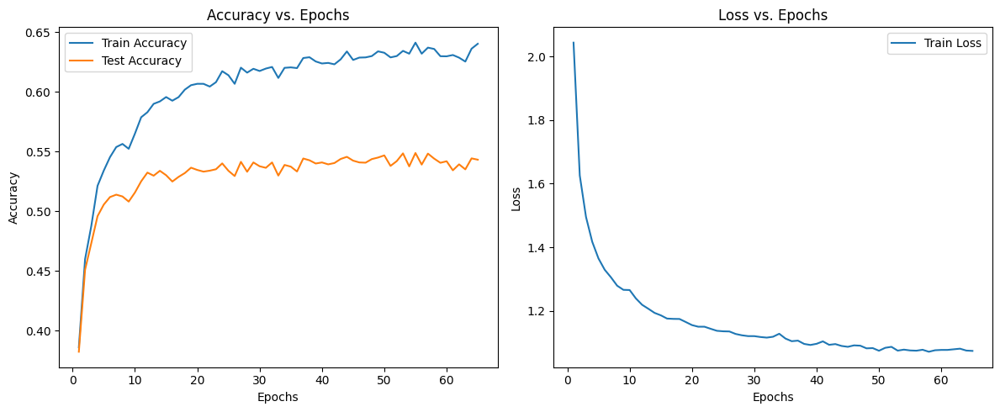

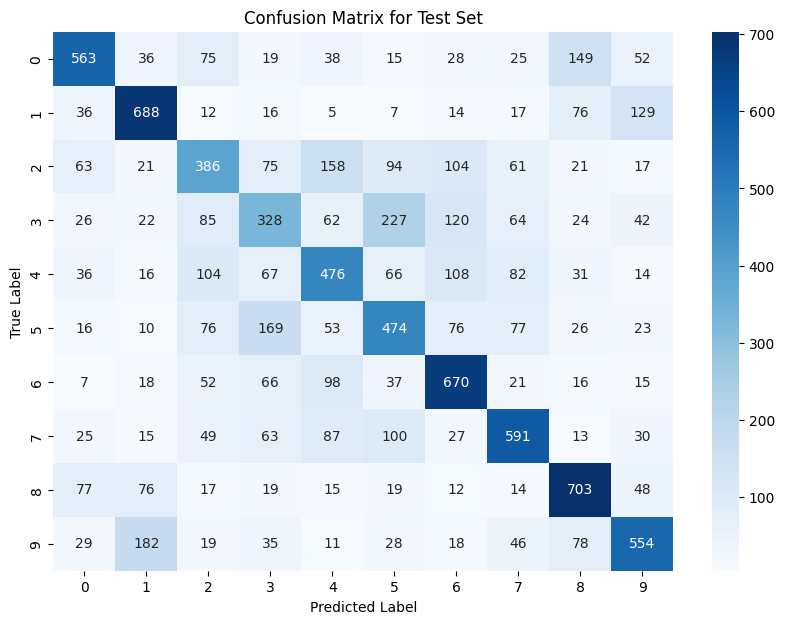

timecost:0.04956674575805664
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.64      0.56      0.60      1000
     Class 1       0.63      0.69      0.66      1000
     Class 2       0.44      0.39      0.41      1000
     Class 3       0.38      0.33      0.35      1000
     Class 4       0.47      0.48      0.48      1000
     Class 5       0.44      0.47      0.46      1000
     Class 6       0.57      0.67      0.62      1000
     Class 7       0.59      0.59      0.59      1000
     Class 8       0.62      0.70      0.66      1000
     Class 9       0.60      0.55      0.58      1000

    accuracy                           0.54     10000
   macro avg       0.54      0.54      0.54     10000
weighted avg       0.54      0.54      0.54     10000



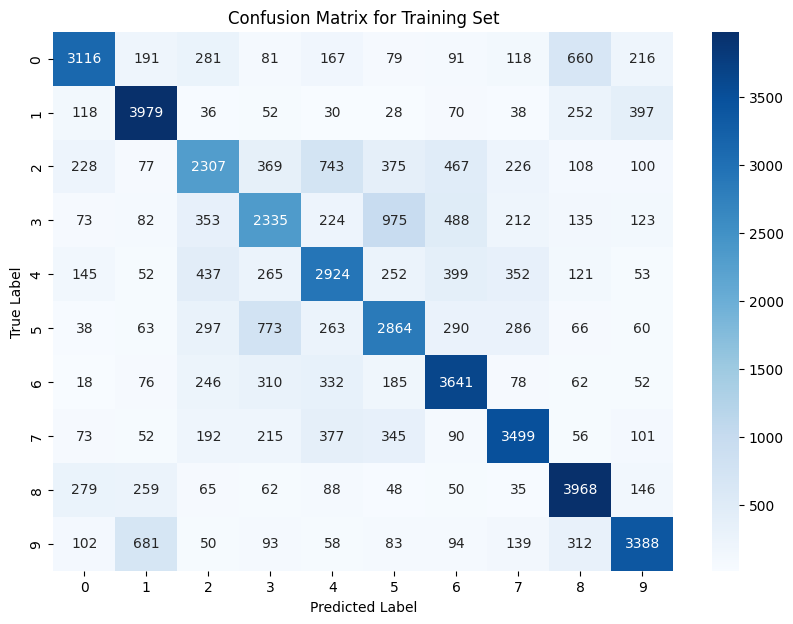

timecost:0.2606773376464844
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.74      0.62      0.68      5000
     Class 1       0.72      0.80      0.76      5000
     Class 2       0.54      0.46      0.50      5000
     Class 3       0.51      0.47      0.49      5000
     Class 4       0.56      0.58      0.57      5000
     Class 5       0.55      0.57      0.56      5000
     Class 6       0.64      0.73      0.68      5000
     Class 7       0.70      0.70      0.70      5000
     Class 8       0.69      0.79      0.74      5000
     Class 9       0.73      0.68      0.70      5000

    accuracy                           0.64     50000
   macro avg       0.64      0.64      0.64     50000
weighted avg       0.64      0.64      0.64     50000

timecost:106.15246987342834
Layer 0 (HiddenLayer): 16512 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1290 par

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.37058, Test Accuracy: 0.3777, Loss: 2.061747160814819
Epoch 2, Train Accuracy: 0.44318, Test Accuracy: 0.4395, Loss: 1.6849178478803708
Epoch 3, Train Accuracy: 0.47584, Test Accuracy: 0.4687, Loss: 1.5416530409697111
Epoch 4, Train Accuracy: 0.49608, Test Accuracy: 0.4807, Loss: 1.471546655113695
Epoch 5, Train Accuracy: 0.50338, Test Accuracy: 0.4793, Loss: 1.4227654022488083
Epoch 6, Train Accuracy: 0.52266, Test Accuracy: 0.4958, Loss: 1.3960510952911447
Epoch 7, Train Accuracy: 0.52428, Test Accuracy: 0.4958, Loss: 1.3642665984106026
Epoch 8, Train Accuracy: 0.52912, Test Accuracy: 0.496, Loss: 1.3458015150599918
Epoch 9, Train Accuracy: 0.5332, Test Accuracy: 0.5009, Loss: 1.338812660153923
Epoch 10, Train Accuracy: 0.54356, Test Accuracy: 0.5062, Loss: 1.3213763951620974
Epoch 11, Train Accuracy: 0.54412, Test Accuracy: 0.5089, Loss: 1.3071728274664534
Epoch 12, Train Accuracy: 0.54938, Test Accuracy: 0.5047, Loss: 1.2942638152850912
Epoch 13, Train Ac

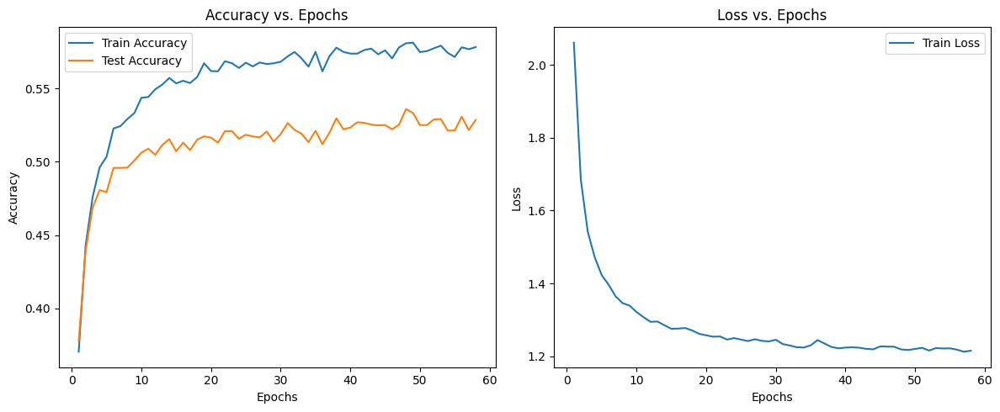

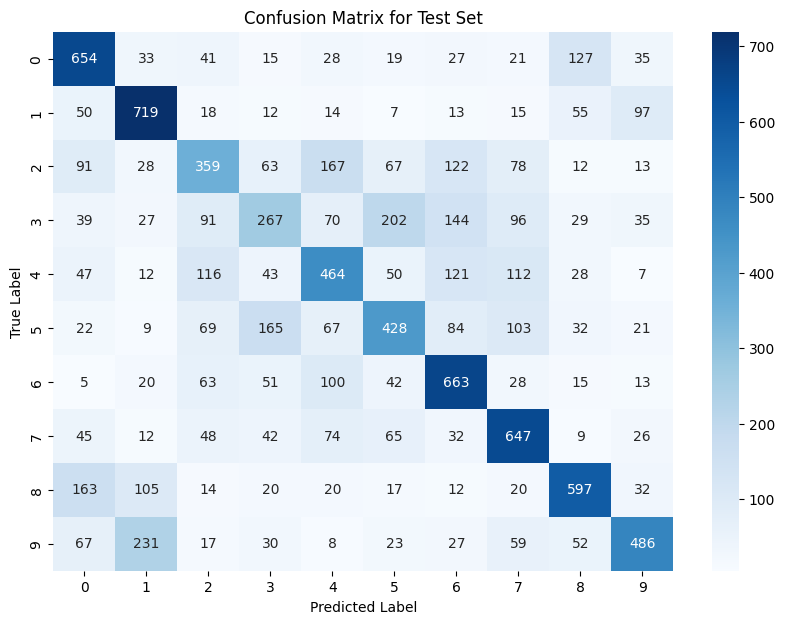

timecost:0.02799248695373535
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.55      0.65      0.60      1000
     Class 1       0.60      0.72      0.65      1000
     Class 2       0.43      0.36      0.39      1000
     Class 3       0.38      0.27      0.31      1000
     Class 4       0.46      0.46      0.46      1000
     Class 5       0.47      0.43      0.45      1000
     Class 6       0.53      0.66      0.59      1000
     Class 7       0.55      0.65      0.59      1000
     Class 8       0.62      0.60      0.61      1000
     Class 9       0.64      0.49      0.55      1000

    accuracy                           0.53     10000
   macro avg       0.52      0.53      0.52     10000
weighted avg       0.52      0.53      0.52     10000



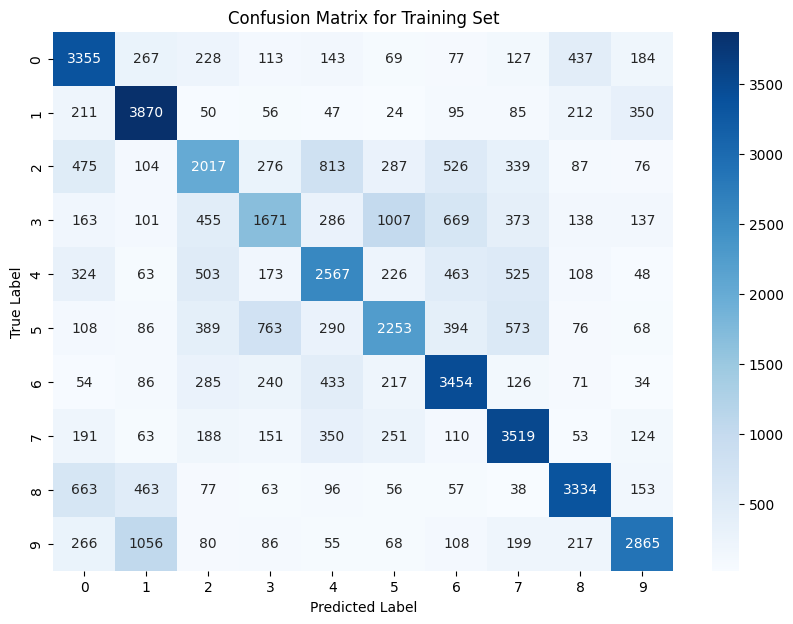

timecost:0.16466760635375977
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.58      0.67      0.62      5000
     Class 1       0.63      0.77      0.69      5000
     Class 2       0.47      0.40      0.44      5000
     Class 3       0.47      0.33      0.39      5000
     Class 4       0.51      0.51      0.51      5000
     Class 5       0.51      0.45      0.48      5000
     Class 6       0.58      0.69      0.63      5000
     Class 7       0.60      0.70      0.65      5000
     Class 8       0.70      0.67      0.69      5000
     Class 9       0.71      0.57      0.63      5000

    accuracy                           0.58     50000
   macro avg       0.57      0.58      0.57     50000
weighted avg       0.57      0.58      0.57     50000

timecost:63.513033390045166
Layer 0 (HiddenLayer): 8256 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 650 para

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.41912, Test Accuracy: 0.4145, Loss: 1.9764676227877456
Epoch 2, Train Accuracy: 0.48106, Test Accuracy: 0.4642, Loss: 1.5835331480956907
Epoch 3, Train Accuracy: 0.50794, Test Accuracy: 0.4838, Loss: 1.455808289869153
Epoch 4, Train Accuracy: 0.53428, Test Accuracy: 0.4988, Loss: 1.3825046956270524
Epoch 5, Train Accuracy: 0.5456, Test Accuracy: 0.5094, Loss: 1.332618997859907
Epoch 6, Train Accuracy: 0.56014, Test Accuracy: 0.5128, Loss: 1.2977396588330894
Epoch 7, Train Accuracy: 0.56508, Test Accuracy: 0.5167, Loss: 1.2715617152335787
Epoch 8, Train Accuracy: 0.5758, Test Accuracy: 0.5217, Loss: 1.2471660073664836
Epoch 9, Train Accuracy: 0.58236, Test Accuracy: 0.5248, Loss: 1.22280289190658
Epoch 10, Train Accuracy: 0.59108, Test Accuracy: 0.5259, Loss: 1.2089819543269897
Epoch 11, Train Accuracy: 0.5963, Test Accuracy: 0.5323, Loss: 1.1911760680101122
Epoch 12, Train Accuracy: 0.59992, Test Accuracy: 0.5275, Loss: 1.1813344925267077
Epoch 13, Train Accu

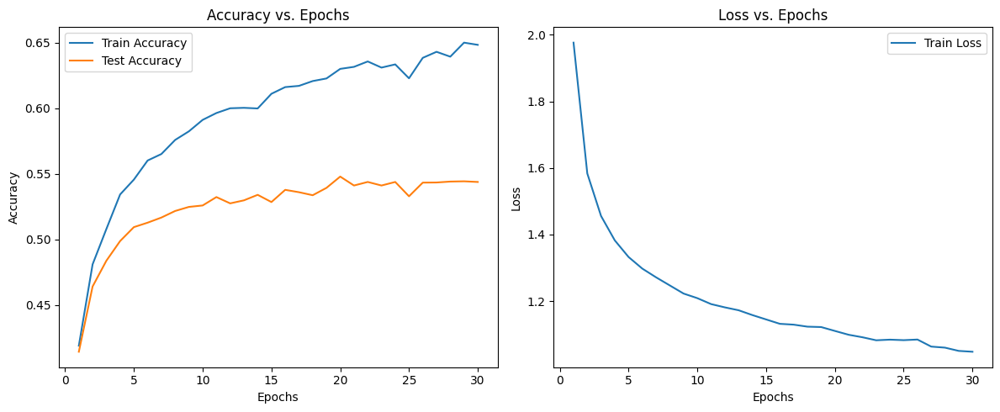

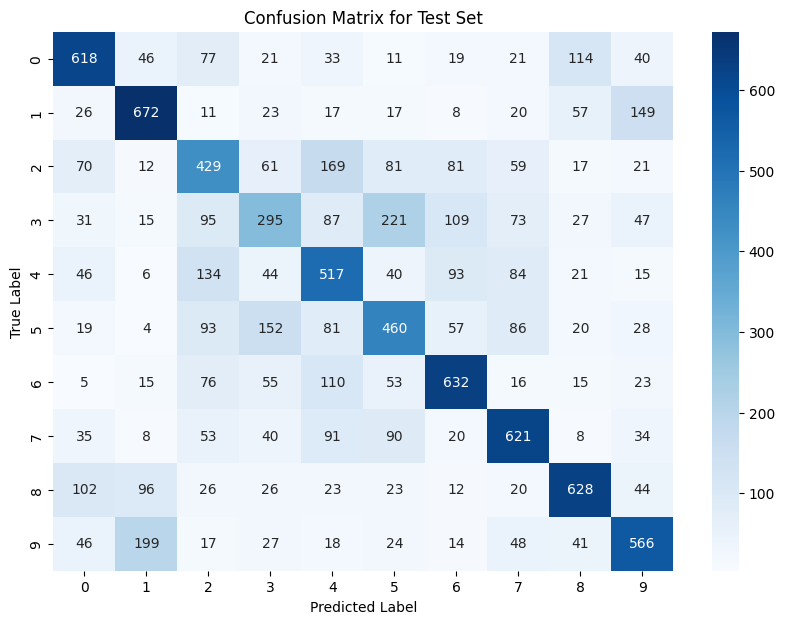

timecost:0.06797647476196289
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.62      0.62      0.62      1000
     Class 1       0.63      0.67      0.65      1000
     Class 2       0.42      0.43      0.43      1000
     Class 3       0.40      0.29      0.34      1000
     Class 4       0.45      0.52      0.48      1000
     Class 5       0.45      0.46      0.46      1000
     Class 6       0.60      0.63      0.62      1000
     Class 7       0.59      0.62      0.61      1000
     Class 8       0.66      0.63      0.64      1000
     Class 9       0.59      0.57      0.58      1000

    accuracy                           0.54     10000
   macro avg       0.54      0.54      0.54     10000
weighted avg       0.54      0.54      0.54     10000



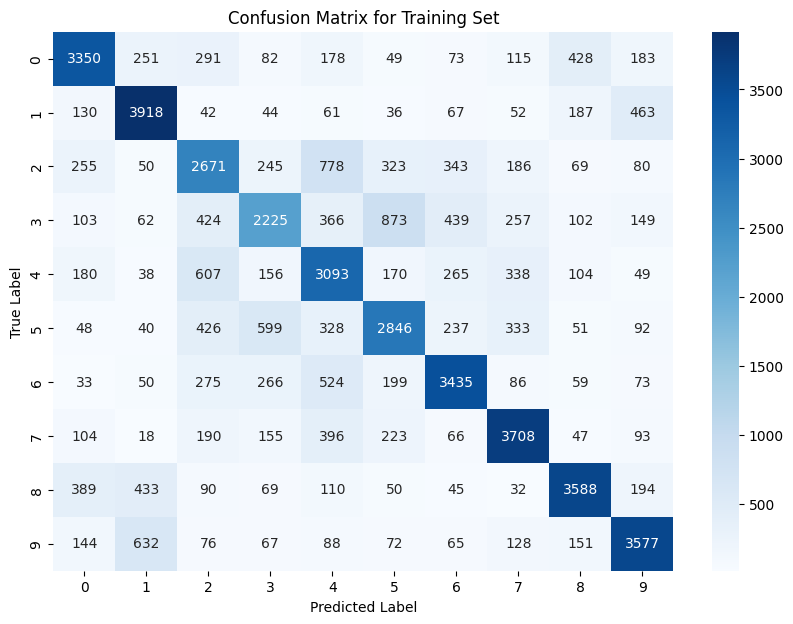

timecost:0.351215124130249
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.71      0.67      0.69      5000
     Class 1       0.71      0.78      0.75      5000
     Class 2       0.52      0.53      0.53      5000
     Class 3       0.57      0.45      0.50      5000
     Class 4       0.52      0.62      0.57      5000
     Class 5       0.59      0.57      0.58      5000
     Class 6       0.68      0.69      0.68      5000
     Class 7       0.71      0.74      0.72      5000
     Class 8       0.75      0.72      0.73      5000
     Class 9       0.72      0.72      0.72      5000

    accuracy                           0.65     50000
   macro avg       0.65      0.65      0.65     50000
weighted avg       0.65      0.65      0.65     50000

timecost:62.7489070892334
Layer 0 (HiddenLayer): 25800 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 2010 parame

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.39182, Test Accuracy: 0.3926, Loss: 2.058962937126292
Epoch 2, Train Accuracy: 0.47012, Test Accuracy: 0.4594, Loss: 1.6141973612563665
Epoch 3, Train Accuracy: 0.50696, Test Accuracy: 0.4889, Loss: 1.4683130745922153
Epoch 4, Train Accuracy: 0.51936, Test Accuracy: 0.485, Loss: 1.3987955288410607
Epoch 5, Train Accuracy: 0.53472, Test Accuracy: 0.4989, Loss: 1.3530854807750603
Epoch 6, Train Accuracy: 0.5501, Test Accuracy: 0.5157, Loss: 1.3233705710448784
Epoch 7, Train Accuracy: 0.56394, Test Accuracy: 0.5188, Loss: 1.2927668000321824
Epoch 8, Train Accuracy: 0.5672, Test Accuracy: 0.5126, Loss: 1.266457578333719
Epoch 9, Train Accuracy: 0.5717, Test Accuracy: 0.5242, Loss: 1.2516562497090509
Epoch 10, Train Accuracy: 0.5784, Test Accuracy: 0.5235, Loss: 1.233091664501561
Epoch 11, Train Accuracy: 0.58608, Test Accuracy: 0.5293, Loss: 1.2272868364385556
Epoch 12, Train Accuracy: 0.58182, Test Accuracy: 0.5255, Loss: 1.2124960779846552
Epoch 13, Train Accur

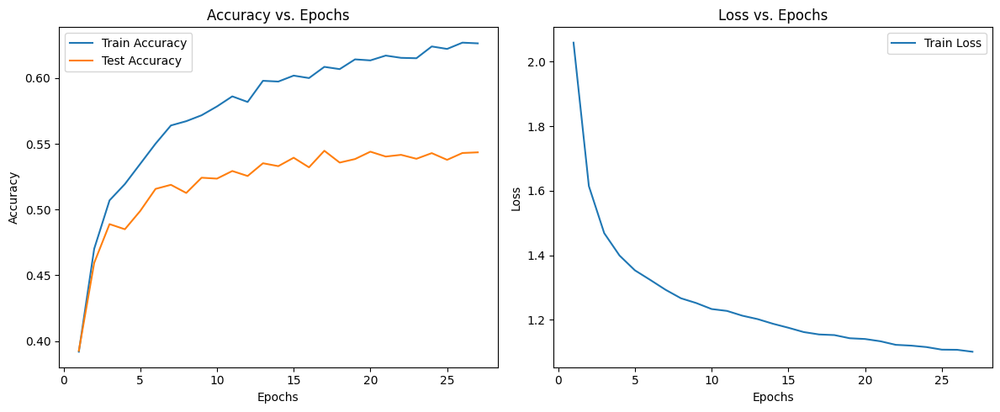

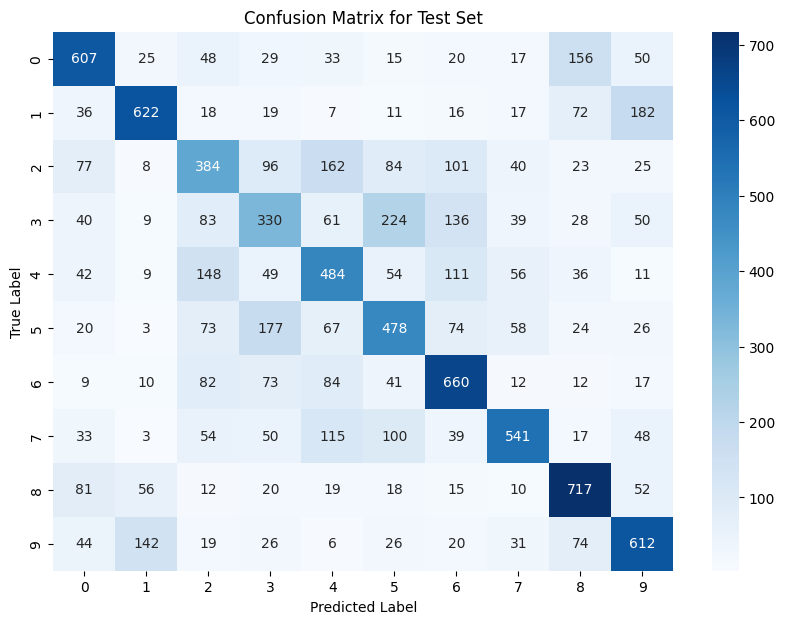

timecost:0.060263633728027344
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.61      0.61      0.61      1000
     Class 1       0.70      0.62      0.66      1000
     Class 2       0.42      0.38      0.40      1000
     Class 3       0.38      0.33      0.35      1000
     Class 4       0.47      0.48      0.47      1000
     Class 5       0.45      0.48      0.47      1000
     Class 6       0.55      0.66      0.60      1000
     Class 7       0.66      0.54      0.59      1000
     Class 8       0.62      0.72      0.66      1000
     Class 9       0.57      0.61      0.59      1000

    accuracy                           0.54     10000
   macro avg       0.54      0.54      0.54     10000
weighted avg       0.54      0.54      0.54     10000



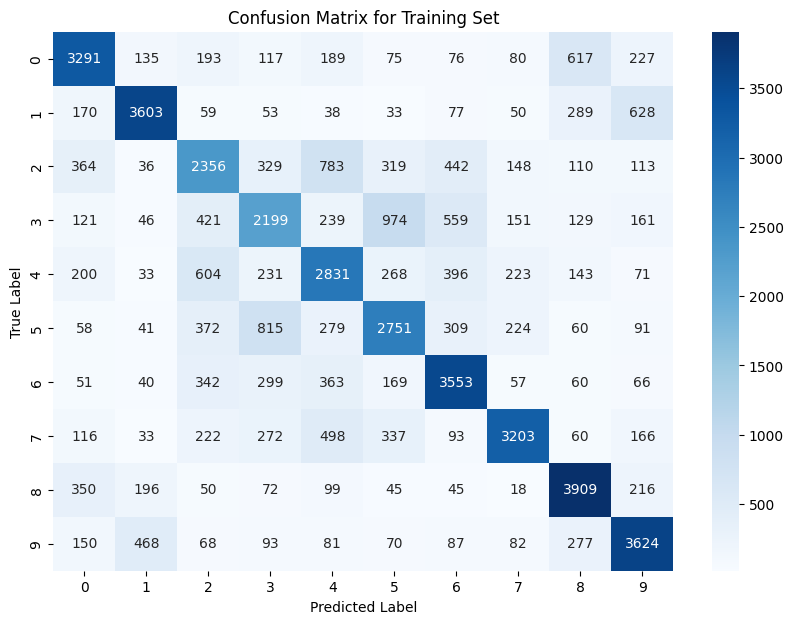

timecost:0.2801952362060547
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.68      0.66      0.67      5000
     Class 1       0.78      0.72      0.75      5000
     Class 2       0.50      0.47      0.49      5000
     Class 3       0.49      0.44      0.46      5000
     Class 4       0.52      0.57      0.54      5000
     Class 5       0.55      0.55      0.55      5000
     Class 6       0.63      0.71      0.67      5000
     Class 7       0.76      0.64      0.69      5000
     Class 8       0.69      0.78      0.73      5000
     Class 9       0.68      0.72      0.70      5000

    accuracy                           0.63     50000
   macro avg       0.63      0.63      0.63     50000
weighted avg       0.63      0.63      0.63     50000

timecost:47.40699100494385
Layer 0 (HiddenLayer): 19350 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1510 para

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.38334, Test Accuracy: 0.3855, Loss: 2.0148750791086867
Epoch 2, Train Accuracy: 0.4571, Test Accuracy: 0.4513, Loss: 1.6432870498271337
Epoch 3, Train Accuracy: 0.48266, Test Accuracy: 0.475, Loss: 1.5089411436955567
Epoch 4, Train Accuracy: 0.50586, Test Accuracy: 0.4873, Loss: 1.4404688141667947
Epoch 5, Train Accuracy: 0.52104, Test Accuracy: 0.4962, Loss: 1.3887020255857696
Epoch 6, Train Accuracy: 0.52846, Test Accuracy: 0.4974, Loss: 1.3523243233386686
Epoch 7, Train Accuracy: 0.54444, Test Accuracy: 0.5139, Loss: 1.3276030997810377
Epoch 8, Train Accuracy: 0.55068, Test Accuracy: 0.5141, Loss: 1.3083657034863396
Epoch 9, Train Accuracy: 0.55596, Test Accuracy: 0.518, Loss: 1.2901905051455138
Epoch 10, Train Accuracy: 0.56002, Test Accuracy: 0.5178, Loss: 1.273773402263608
Epoch 11, Train Accuracy: 0.56598, Test Accuracy: 0.5174, Loss: 1.2598031853003668
Epoch 12, Train Accuracy: 0.57344, Test Accuracy: 0.5275, Loss: 1.2509777319790247
Epoch 13, Train A

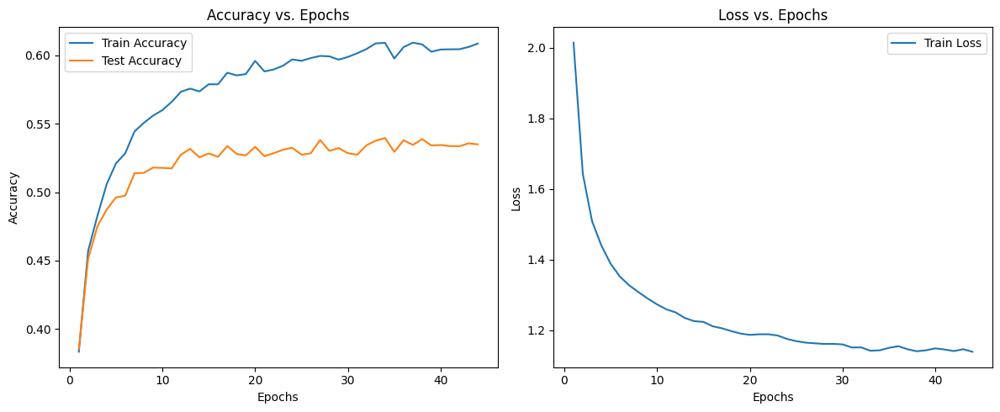

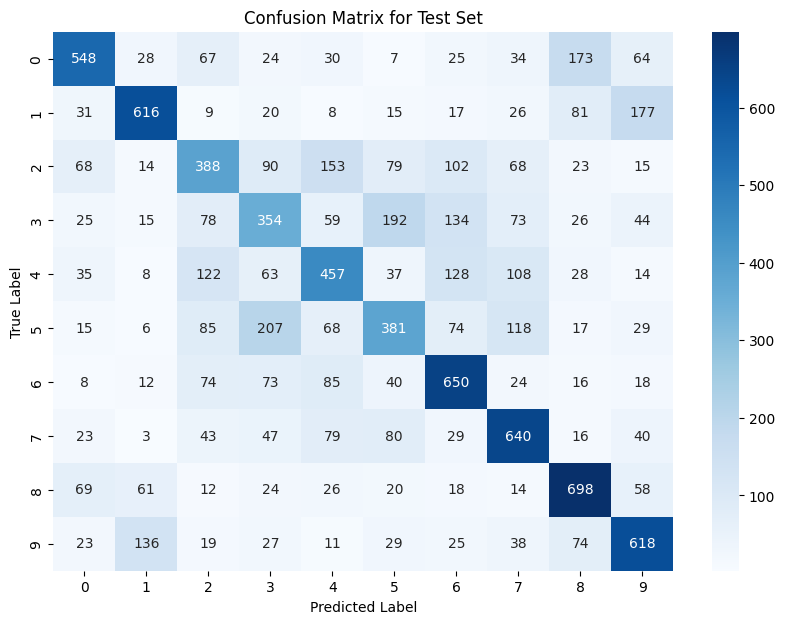

timecost:0.06052446365356445
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.65      0.55      0.59      1000
     Class 1       0.69      0.62      0.65      1000
     Class 2       0.43      0.39      0.41      1000
     Class 3       0.38      0.35      0.37      1000
     Class 4       0.47      0.46      0.46      1000
     Class 5       0.43      0.38      0.41      1000
     Class 6       0.54      0.65      0.59      1000
     Class 7       0.56      0.64      0.60      1000
     Class 8       0.61      0.70      0.65      1000
     Class 9       0.57      0.62      0.60      1000

    accuracy                           0.54     10000
   macro avg       0.53      0.54      0.53     10000
weighted avg       0.53      0.54      0.53     10000



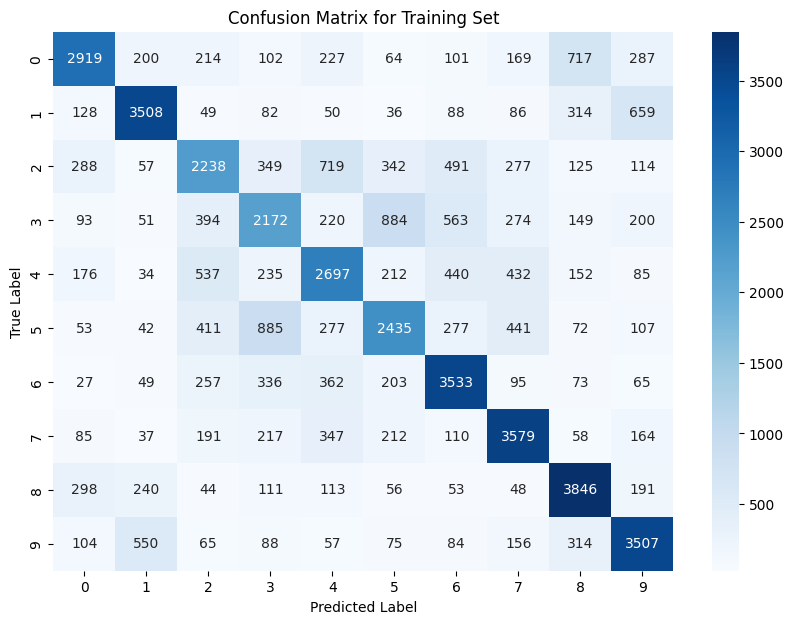

timecost:0.21518373489379883
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.70      0.58      0.64      5000
     Class 1       0.74      0.70      0.72      5000
     Class 2       0.51      0.45      0.48      5000
     Class 3       0.47      0.43      0.45      5000
     Class 4       0.53      0.54      0.54      5000
     Class 5       0.54      0.49      0.51      5000
     Class 6       0.62      0.71      0.66      5000
     Class 7       0.64      0.72      0.68      5000
     Class 8       0.66      0.77      0.71      5000
     Class 9       0.65      0.70      0.68      5000

    accuracy                           0.61     50000
   macro avg       0.61      0.61      0.61     50000
weighted avg       0.61      0.61      0.61     50000

timecost:61.567946434020996
Layer 0 (HiddenLayer): 12900 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 1010 pa

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.37864, Test Accuracy: 0.374, Loss: 2.0320460129465325
Epoch 2, Train Accuracy: 0.43958, Test Accuracy: 0.4365, Loss: 1.6780963666208548
Epoch 3, Train Accuracy: 0.47126, Test Accuracy: 0.4581, Loss: 1.5545248126539166
Epoch 4, Train Accuracy: 0.48236, Test Accuracy: 0.4686, Loss: 1.4973373480678513
Epoch 5, Train Accuracy: 0.49784, Test Accuracy: 0.4824, Loss: 1.4556094099399992
Epoch 6, Train Accuracy: 0.50352, Test Accuracy: 0.4825, Loss: 1.4208783711540847
Epoch 7, Train Accuracy: 0.51274, Test Accuracy: 0.4863, Loss: 1.4009353757893395
Epoch 8, Train Accuracy: 0.52008, Test Accuracy: 0.4932, Loss: 1.3843550991585056
Epoch 9, Train Accuracy: 0.5247, Test Accuracy: 0.4958, Loss: 1.3698891588448239
Epoch 10, Train Accuracy: 0.52694, Test Accuracy: 0.4972, Loss: 1.3521411320591539
Epoch 11, Train Accuracy: 0.53298, Test Accuracy: 0.501, Loss: 1.3421193559751048
Epoch 12, Train Accuracy: 0.53494, Test Accuracy: 0.5019, Loss: 1.337848723124855
Epoch 13, Train A

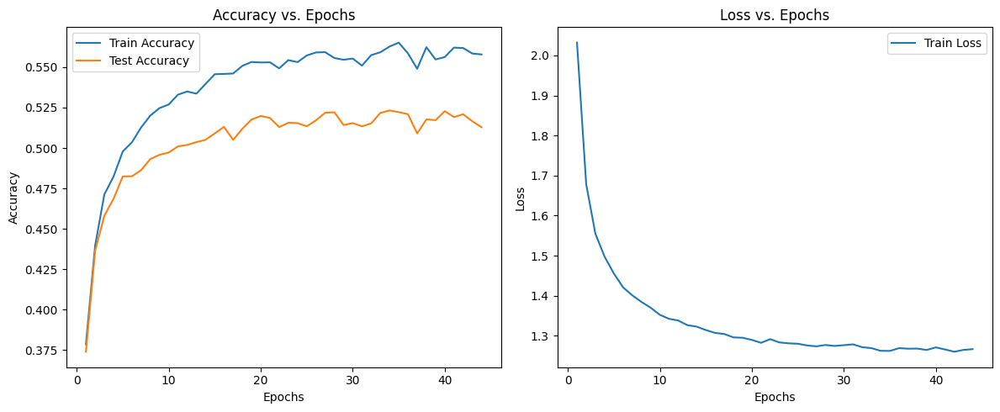

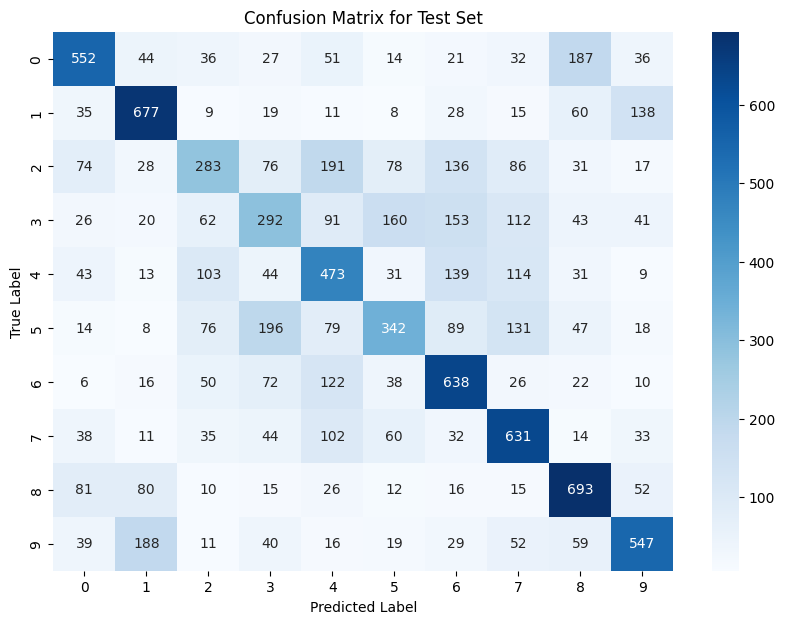

timecost:0.03787565231323242
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.61      0.55      0.58      1000
     Class 1       0.62      0.68      0.65      1000
     Class 2       0.42      0.28      0.34      1000
     Class 3       0.35      0.29      0.32      1000
     Class 4       0.41      0.47      0.44      1000
     Class 5       0.45      0.34      0.39      1000
     Class 6       0.50      0.64      0.56      1000
     Class 7       0.52      0.63      0.57      1000
     Class 8       0.58      0.69      0.63      1000
     Class 9       0.61      0.55      0.58      1000

    accuracy                           0.51     10000
   macro avg       0.51      0.51      0.51     10000
weighted avg       0.51      0.51      0.51     10000



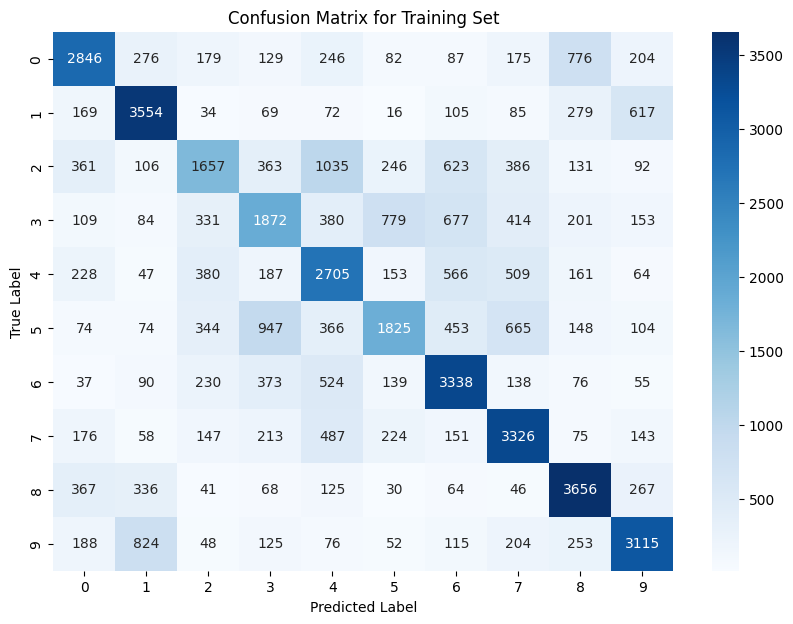

timecost:0.11438679695129395
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.62      0.57      0.60      5000
     Class 1       0.65      0.71      0.68      5000
     Class 2       0.49      0.33      0.39      5000
     Class 3       0.43      0.37      0.40      5000
     Class 4       0.45      0.54      0.49      5000
     Class 5       0.51      0.36      0.43      5000
     Class 6       0.54      0.67      0.60      5000
     Class 7       0.56      0.67      0.61      5000
     Class 8       0.64      0.73      0.68      5000
     Class 9       0.65      0.62      0.63      5000

    accuracy                           0.56     50000
   macro avg       0.55      0.56      0.55     50000
weighted avg       0.55      0.56      0.55     50000

timecost:44.0944766998291
Layer 0 (HiddenLayer): 6450 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 510 parame

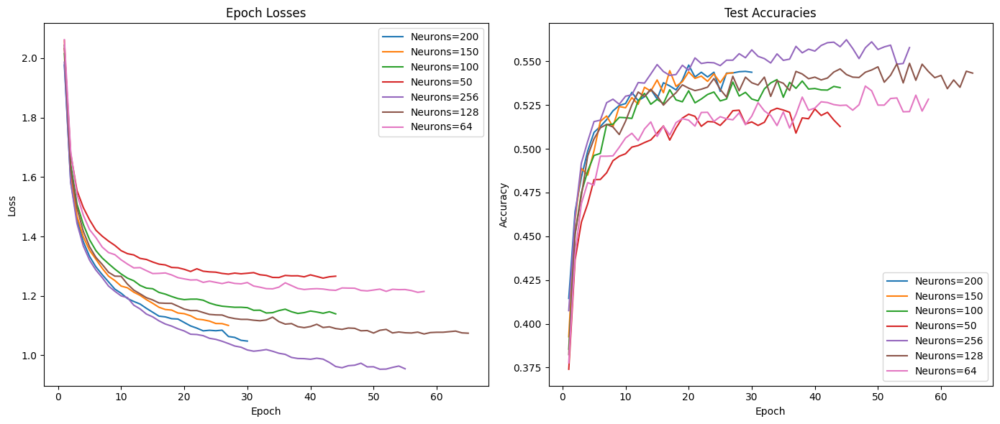

In [ ]:
# Neurons
model = MLP()
model.add(HiddenLayer(128, 256))
model.add(GELULayer())
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_ne_256 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_ne_256.mini_batch_train()
print("train_accuracies:",trainings_ne_256.train_accuracies)
print("test_accuracies:",trainings_ne_256.test_accuracies)
print("epoch_losses:",trainings_ne_256.epoch_losses)
print("params_count:",trainings_ne_256.params_count)
print("train_timecost:",trainings_ne_256.train_timecost)
print("test_timecost:",trainings_ne_256.test_timecost)
print("train_report:",trainings_ne_256.train_report)
print("test_report:",trainings_ne_256.test_report)

model = MLP()
model.add(HiddenLayer(128, 128))
model.add(GELULayer())
model.add(HiddenLayer(128, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_ne_128 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_ne_128.mini_batch_train()
print("train_accuracies:",trainings_ne_128.train_accuracies)
print("test_accuracies:",trainings_ne_128.test_accuracies)
print("epoch_losses:",trainings_ne_128.epoch_losses)
print("params_count:",trainings_ne_128.params_count)
print("train_timecost:",trainings_ne_128.train_timecost)
print("test_timecost:",trainings_ne_128.test_timecost)
print("train_report:",trainings_ne_128.train_report)
print("test_report:",trainings_ne_128.test_report)

model = MLP()
model.add(HiddenLayer(128, 64))
model.add(GELULayer())
model.add(HiddenLayer(64, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_ne_64 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_ne_64.mini_batch_train()
print("train_accuracies:",trainings_ne_64.train_accuracies)
print("test_accuracies:",trainings_ne_64.test_accuracies)
print("epoch_losses:",trainings_ne_64.epoch_losses)
print("params_count:",trainings_ne_64.params_count)
print("train_timecost:",trainings_ne_64.train_timecost)
print("test_timecost:",trainings_ne_64.test_timecost)
print("train_report:",trainings_ne_64.train_report)
print("test_report:",trainings_ne_64.test_report)

model = MLP()
model.add(HiddenLayer(128, 200))
model.add(GELULayer())
model.add(HiddenLayer(200, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_ne_200 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_ne_200.mini_batch_train()
print("train_accuracies:",trainings_ne_200.train_accuracies)
print("test_accuracies:",trainings_ne_200.test_accuracies)
print("epoch_losses:",trainings_ne_200.epoch_losses)
print("params_count:",trainings_ne_200.params_count)
print("train_timecost:",trainings_ne_200.train_timecost)
print("test_timecost:",trainings_ne_200.test_timecost)
print("train_report:",trainings_ne_200.train_report)
print("test_report:",trainings_ne_200.test_report)

model = MLP()
model.add(HiddenLayer(128, 150))
model.add(GELULayer())
model.add(HiddenLayer(150, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_ne_150 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_ne_150.mini_batch_train()
print("train_accuracies:",trainings_ne_150.train_accuracies)
print("test_accuracies:",trainings_ne_150.test_accuracies)
print("epoch_losses:",trainings_ne_150.epoch_losses)
print("params_count:",trainings_ne_150.params_count)
print("train_timecost:",trainings_ne_150.train_timecost)
print("test_timecost:",trainings_ne_150.test_timecost)
print("train_report:",trainings_ne_150.train_report)
print("test_report:",trainings_ne_150.test_report)

model = MLP()
model.add(HiddenLayer(128, 100))
model.add(GELULayer())
model.add(HiddenLayer(100, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_ne_100 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_ne_100.mini_batch_train()
print("train_accuracies:",trainings_ne_100.train_accuracies)
print("test_accuracies:",trainings_ne_100.test_accuracies)
print("epoch_losses:",trainings_ne_100.epoch_losses)
print("params_count:",trainings_ne_100.params_count)
print("train_timecost:",trainings_ne_100.train_timecost)
print("test_timecost:",trainings_ne_100.test_timecost)
print("train_report:",trainings_ne_100.train_report)
print("test_report:",trainings_ne_100.test_report)

model = MLP()
model.add(HiddenLayer(128, 50))
model.add(GELULayer())
model.add(HiddenLayer(50, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_ne_50 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_ne_50.mini_batch_train()
print("train_accuracies:",trainings_ne_50.train_accuracies)
print("test_accuracies:",trainings_ne_50.test_accuracies)
print("epoch_losses:",trainings_ne_50.epoch_losses)
print("params_count:",trainings_ne_50.params_count)
print("train_timecost:",trainings_ne_50.train_timecost)
print("test_timecost:",trainings_ne_50.test_timecost)
print("train_report:",trainings_ne_50.train_report)
print("test_report:",trainings_ne_50.test_report)

epoch_losses = {
"200":trainings_ne_200.epoch_losses,
"150":trainings_ne_150.epoch_losses,
"100":trainings_ne_100.epoch_losses,
"50":trainings_ne_50.epoch_losses,
"256":trainings_ne_256.epoch_losses,
"128":trainings_ne_128.epoch_losses,
"64":trainings_ne_64.epoch_losses
}

test_accuracies = {
"200":trainings_ne_200.test_accuracies,
"150":trainings_ne_150.test_accuracies,
"100":trainings_ne_100.test_accuracies,
"50":trainings_ne_50.test_accuracies,
"256":trainings_ne_256.test_accuracies,
"128":trainings_ne_128.test_accuracies,
"64":trainings_ne_64.test_accuracies
}

plot_training_results(epoch_losses, test_accuracies, 'Neurons')

### Layers

Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 2570 parameters
Layer 3 (SoftmaxLayer): No parameters or `param_count` method not implemented.
Total parameters: 35594


<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.41278, Test Accuracy: 0.4023, Loss: 1.9969660356326908
Epoch 2, Train Accuracy: 0.49182, Test Accuracy: 0.4665, Loss: 1.5791231000680641
Epoch 3, Train Accuracy: 0.51264, Test Accuracy: 0.4843, Loss: 1.4431195663781107
Epoch 4, Train Accuracy: 0.53794, Test Accuracy: 0.5026, Loss: 1.3695371126976406
Epoch 5, Train Accuracy: 0.5502, Test Accuracy: 0.5103, Loss: 1.32283808538925
Epoch 6, Train Accuracy: 0.56678, Test Accuracy: 0.5226, Loss: 1.284093893742833
Epoch 7, Train Accuracy: 0.57534, Test Accuracy: 0.5223, Loss: 1.2539998808181219
Epoch 8, Train Accuracy: 0.58798, Test Accuracy: 0.5278, Loss: 1.2256922607300562
Epoch 9, Train Accuracy: 0.59952, Test Accuracy: 0.5376, Loss: 1.2032441386407133
Epoch 10, Train Accuracy: 0.6022, Test Accuracy: 0.5313, Loss: 1.1892086726593531
Epoch 11, Train Accuracy: 0.60092, Test Accuracy: 0.5297, Loss: 1.17543513981058
Epoch 12, Train Accuracy: 0.60934, Test Accuracy: 0.5329, Loss: 1.1537500508394116
Epoch 13, Train Accu

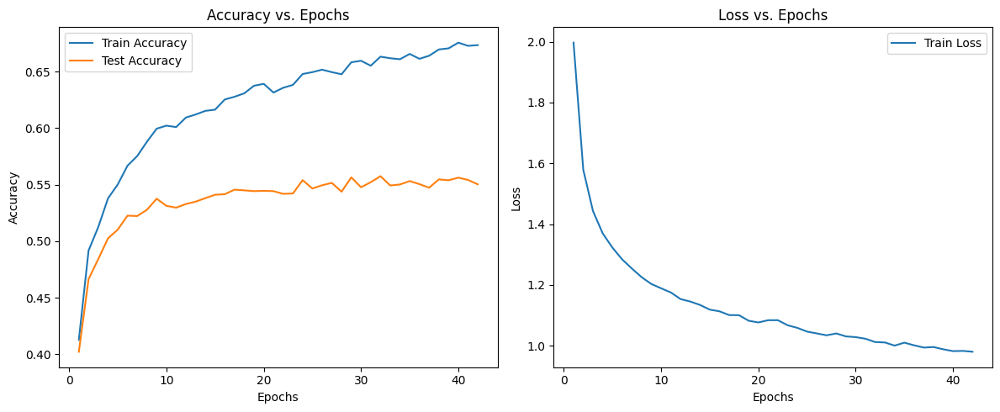

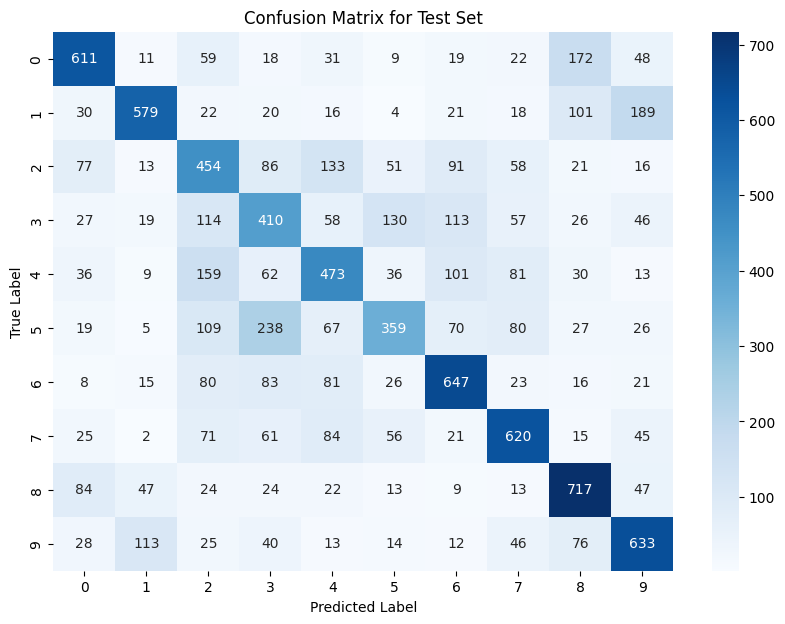

timecost:0.11424803733825684
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.65      0.61      0.63      1000
     Class 1       0.71      0.58      0.64      1000
     Class 2       0.41      0.45      0.43      1000
     Class 3       0.39      0.41      0.40      1000
     Class 4       0.48      0.47      0.48      1000
     Class 5       0.51      0.36      0.42      1000
     Class 6       0.59      0.65      0.62      1000
     Class 7       0.61      0.62      0.61      1000
     Class 8       0.60      0.72      0.65      1000
     Class 9       0.58      0.63      0.61      1000

    accuracy                           0.55     10000
   macro avg       0.55      0.55      0.55     10000
weighted avg       0.55      0.55      0.55     10000



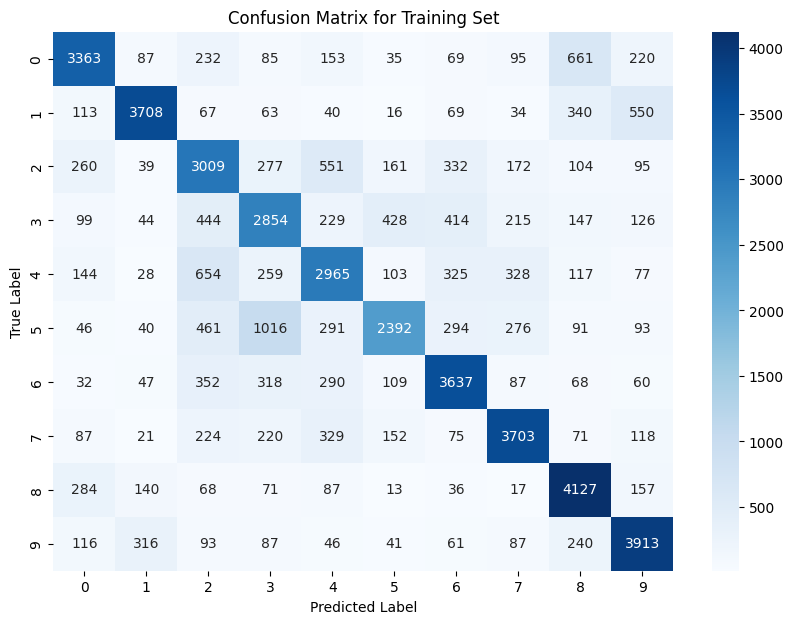

timecost:0.4172801971435547
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.74      0.67      0.70      5000
     Class 1       0.83      0.74      0.78      5000
     Class 2       0.54      0.60      0.57      5000
     Class 3       0.54      0.57      0.56      5000
     Class 4       0.60      0.59      0.59      5000
     Class 5       0.69      0.48      0.57      5000
     Class 6       0.68      0.73      0.71      5000
     Class 7       0.74      0.74      0.74      5000
     Class 8       0.69      0.83      0.75      5000
     Class 9       0.72      0.78      0.75      5000

    accuracy                           0.67     50000
   macro avg       0.68      0.67      0.67     50000
weighted avg       0.68      0.67      0.67     50000

timecost:139.7850046157837
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 2570 para

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.41922, Test Accuracy: 0.4066, Loss: 1.9070751821488061
Epoch 2, Train Accuracy: 0.4985, Test Accuracy: 0.476, Loss: 1.5293146389172938
Epoch 3, Train Accuracy: 0.53852, Test Accuracy: 0.5001, Loss: 1.3804203601099494
Epoch 4, Train Accuracy: 0.5684, Test Accuracy: 0.5161, Loss: 1.283324602270538
Epoch 5, Train Accuracy: 0.58806, Test Accuracy: 0.5299, Loss: 1.226003762510439
Epoch 6, Train Accuracy: 0.60348, Test Accuracy: 0.5291, Loss: 1.1764506799428742
Epoch 7, Train Accuracy: 0.61754, Test Accuracy: 0.5372, Loss: 1.1352511491729471
Epoch 8, Train Accuracy: 0.63142, Test Accuracy: 0.5438, Loss: 1.102241503095061
Epoch 9, Train Accuracy: 0.63884, Test Accuracy: 0.5431, Loss: 1.0708300254624536
Epoch 10, Train Accuracy: 0.6509, Test Accuracy: 0.5439, Loss: 1.0428548697443334
Epoch 11, Train Accuracy: 0.658, Test Accuracy: 0.5474, Loss: 1.0175447557060466
Epoch 12, Train Accuracy: 0.66342, Test Accuracy: 0.5473, Loss: 0.9924745283622861
Epoch 13, Train Accura

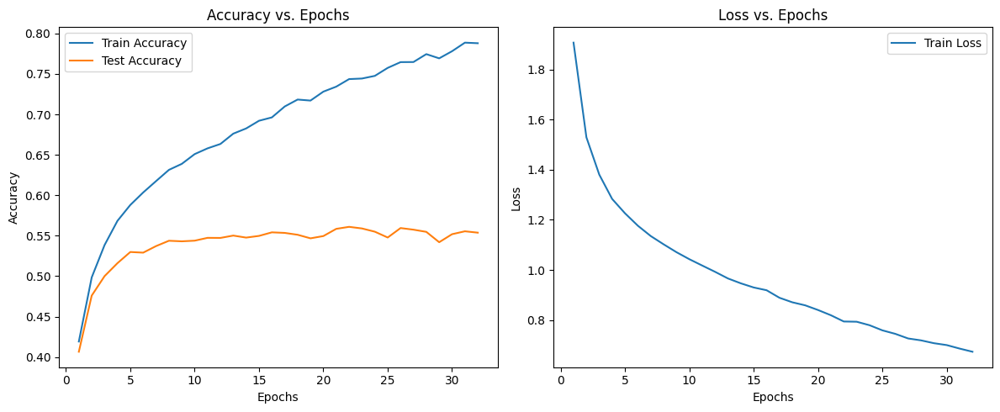

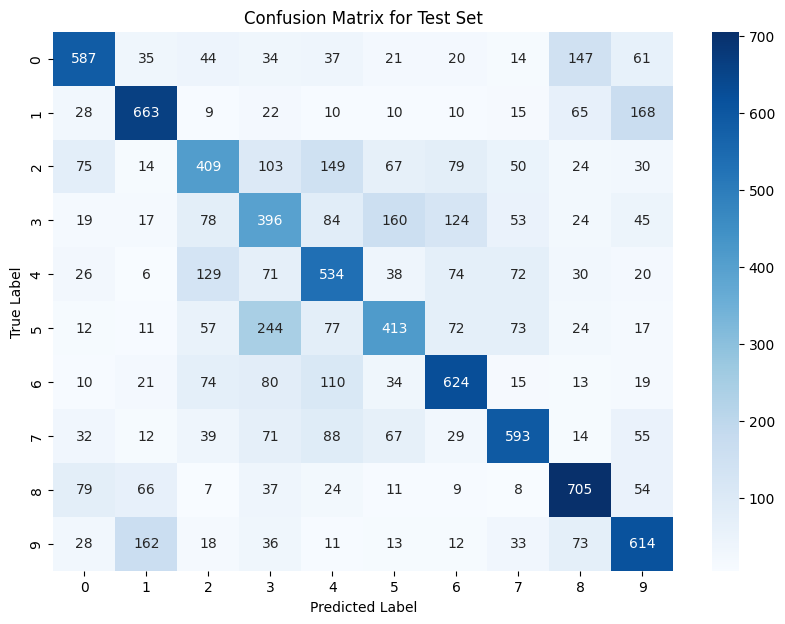

timecost:0.18817496299743652
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.66      0.59      0.62      1000
     Class 1       0.66      0.66      0.66      1000
     Class 2       0.47      0.41      0.44      1000
     Class 3       0.36      0.40      0.38      1000
     Class 4       0.48      0.53      0.50      1000
     Class 5       0.50      0.41      0.45      1000
     Class 6       0.59      0.62      0.61      1000
     Class 7       0.64      0.59      0.62      1000
     Class 8       0.63      0.70      0.67      1000
     Class 9       0.57      0.61      0.59      1000

    accuracy                           0.55     10000
   macro avg       0.55      0.55      0.55     10000
weighted avg       0.55      0.55      0.55     10000



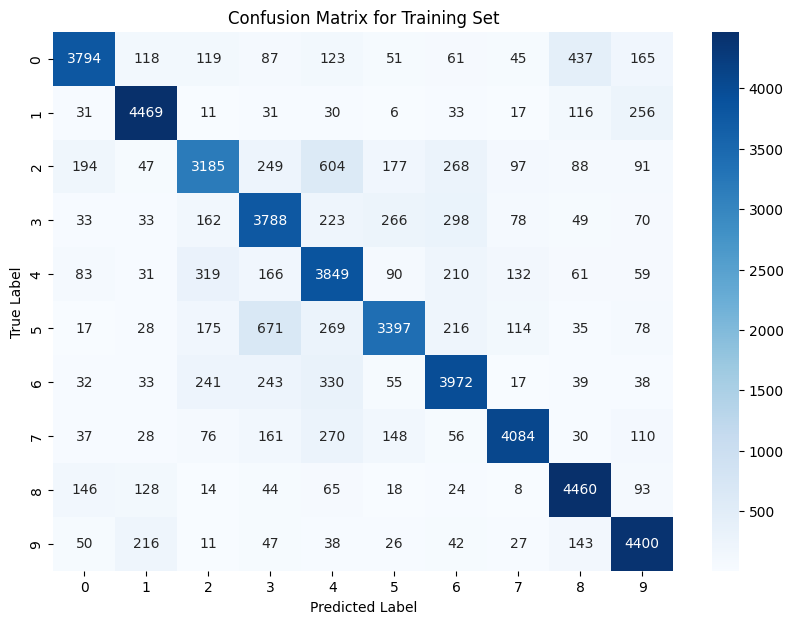

timecost:0.8546352386474609
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.86      0.76      0.81      5000
     Class 1       0.87      0.89      0.88      5000
     Class 2       0.74      0.64      0.68      5000
     Class 3       0.69      0.76      0.72      5000
     Class 4       0.66      0.77      0.71      5000
     Class 5       0.80      0.68      0.74      5000
     Class 6       0.77      0.79      0.78      5000
     Class 7       0.88      0.82      0.85      5000
     Class 8       0.82      0.89      0.85      5000
     Class 9       0.82      0.88      0.85      5000

    accuracy                           0.79     50000
   macro avg       0.79      0.79      0.79     50000
weighted avg       0.79      0.79      0.79     50000

timecost:205.28304386138916
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 65792 pa

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.43158, Test Accuracy: 0.4274, Loss: 1.8807618495512477
Epoch 2, Train Accuracy: 0.49706, Test Accuracy: 0.4792, Loss: 1.522178759933508
Epoch 3, Train Accuracy: 0.53704, Test Accuracy: 0.5025, Loss: 1.3740765475376544
Epoch 4, Train Accuracy: 0.55552, Test Accuracy: 0.5142, Loss: 1.29051988616944
Epoch 5, Train Accuracy: 0.57952, Test Accuracy: 0.5224, Loss: 1.223241519275196
Epoch 6, Train Accuracy: 0.60128, Test Accuracy: 0.5276, Loss: 1.1650740798421693
Epoch 7, Train Accuracy: 0.62272, Test Accuracy: 0.5388, Loss: 1.1216563149640373
Epoch 8, Train Accuracy: 0.63076, Test Accuracy: 0.5315, Loss: 1.0835595261697364
Epoch 9, Train Accuracy: 0.64014, Test Accuracy: 0.5404, Loss: 1.052431247928558
Epoch 10, Train Accuracy: 0.65258, Test Accuracy: 0.545, Loss: 1.0201818719690516
Epoch 11, Train Accuracy: 0.66008, Test Accuracy: 0.5387, Loss: 1.0067212279754023
Epoch 12, Train Accuracy: 0.67608, Test Accuracy: 0.5505, Loss: 0.977365458627523
Epoch 13, Train Accu

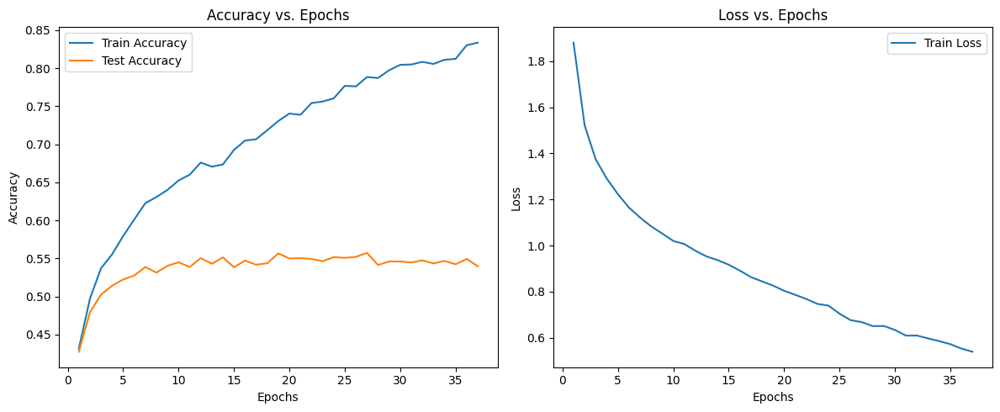

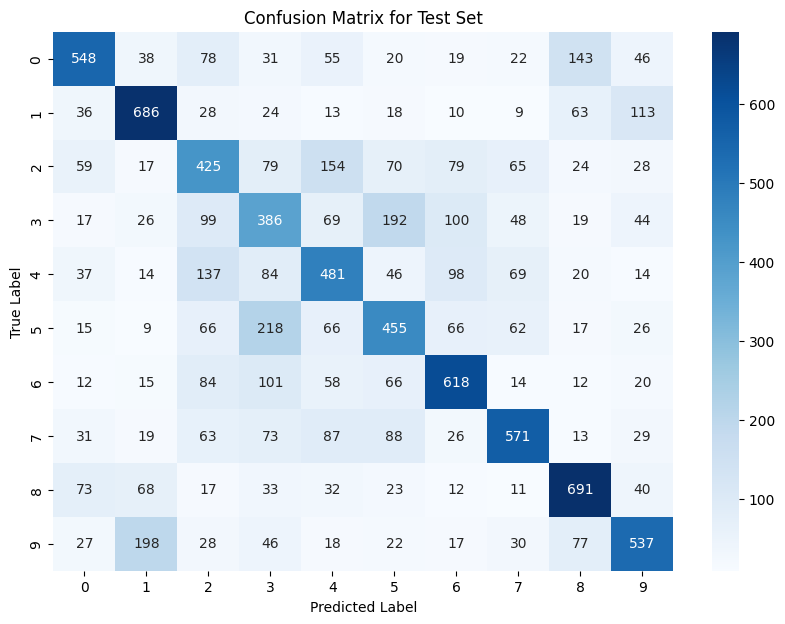

timecost:0.2827160358428955
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.64      0.55      0.59      1000
     Class 1       0.63      0.69      0.66      1000
     Class 2       0.41      0.42      0.42      1000
     Class 3       0.36      0.39      0.37      1000
     Class 4       0.47      0.48      0.47      1000
     Class 5       0.46      0.46      0.46      1000
     Class 6       0.59      0.62      0.60      1000
     Class 7       0.63      0.57      0.60      1000
     Class 8       0.64      0.69      0.66      1000
     Class 9       0.60      0.54      0.57      1000

    accuracy                           0.54     10000
   macro avg       0.54      0.54      0.54     10000
weighted avg       0.54      0.54      0.54     10000



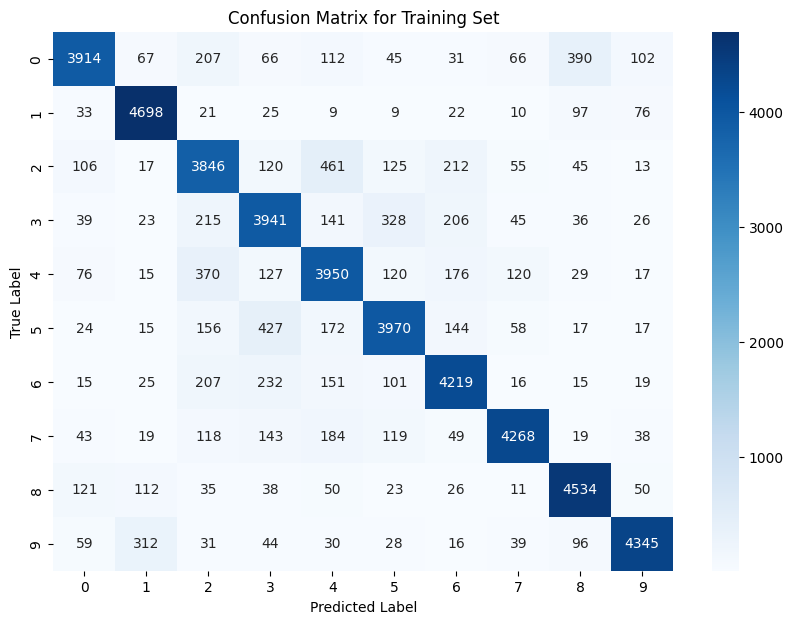

timecost:1.2060058116912842
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.88      0.78      0.83      5000
     Class 1       0.89      0.94      0.91      5000
     Class 2       0.74      0.77      0.75      5000
     Class 3       0.76      0.79      0.78      5000
     Class 4       0.75      0.79      0.77      5000
     Class 5       0.82      0.79      0.80      5000
     Class 6       0.83      0.84      0.84      5000
     Class 7       0.91      0.85      0.88      5000
     Class 8       0.86      0.91      0.88      5000
     Class 9       0.92      0.87      0.90      5000

    accuracy                           0.83     50000
   macro avg       0.84      0.83      0.83     50000
weighted avg       0.84      0.83      0.83     50000

timecost:335.24387645721436
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 65792 pa

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.41374, Test Accuracy: 0.4052, Loss: 1.9075214511650567
Epoch 2, Train Accuracy: 0.48286, Test Accuracy: 0.4662, Loss: 1.551681902903479
Epoch 3, Train Accuracy: 0.52742, Test Accuracy: 0.4932, Loss: 1.3966296836097352
Epoch 4, Train Accuracy: 0.55732, Test Accuracy: 0.515, Loss: 1.302364766352834
Epoch 5, Train Accuracy: 0.58036, Test Accuracy: 0.5181, Loss: 1.2332269689005717
Epoch 6, Train Accuracy: 0.60558, Test Accuracy: 0.5324, Loss: 1.1715349912739093
Epoch 7, Train Accuracy: 0.6088, Test Accuracy: 0.5283, Loss: 1.129305639482931
Epoch 8, Train Accuracy: 0.62656, Test Accuracy: 0.5344, Loss: 1.100749390767318
Epoch 9, Train Accuracy: 0.64218, Test Accuracy: 0.5328, Loss: 1.0641845466216873
Epoch 10, Train Accuracy: 0.64426, Test Accuracy: 0.5373, Loss: 1.036491266496631
Epoch 11, Train Accuracy: 0.66328, Test Accuracy: 0.5351, Loss: 1.0124686849287277
Epoch 12, Train Accuracy: 0.66184, Test Accuracy: 0.5365, Loss: 0.9765417875165029
Epoch 13, Train Accu

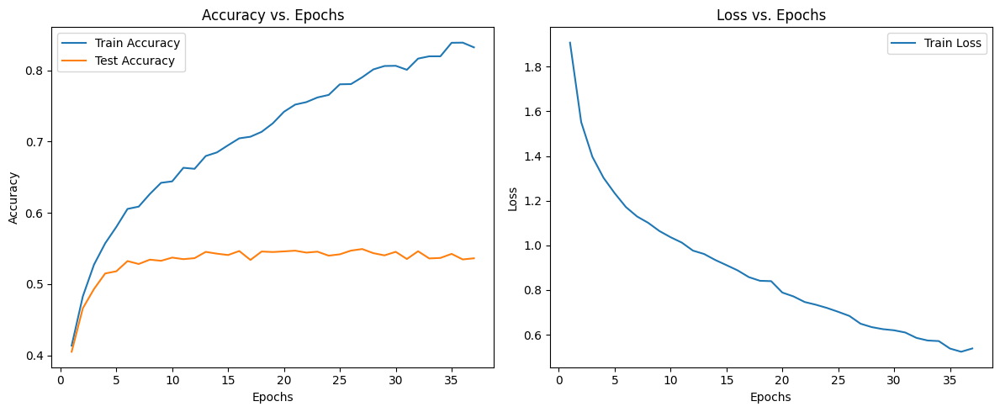

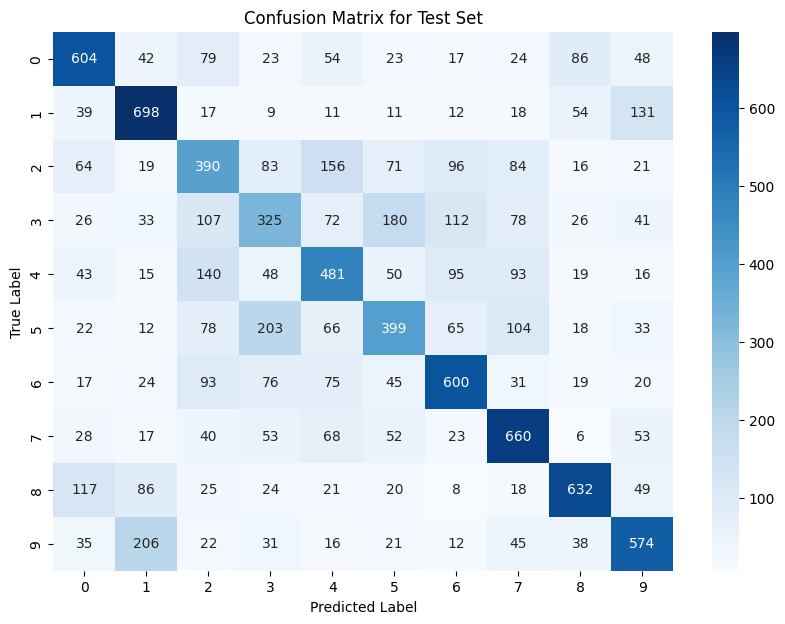

timecost:0.3219735622406006
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.61      0.60      0.61      1000
     Class 1       0.61      0.70      0.65      1000
     Class 2       0.39      0.39      0.39      1000
     Class 3       0.37      0.33      0.35      1000
     Class 4       0.47      0.48      0.48      1000
     Class 5       0.46      0.40      0.43      1000
     Class 6       0.58      0.60      0.59      1000
     Class 7       0.57      0.66      0.61      1000
     Class 8       0.69      0.63      0.66      1000
     Class 9       0.58      0.57      0.58      1000

    accuracy                           0.54     10000
   macro avg       0.53      0.54      0.53     10000
weighted avg       0.53      0.54      0.53     10000



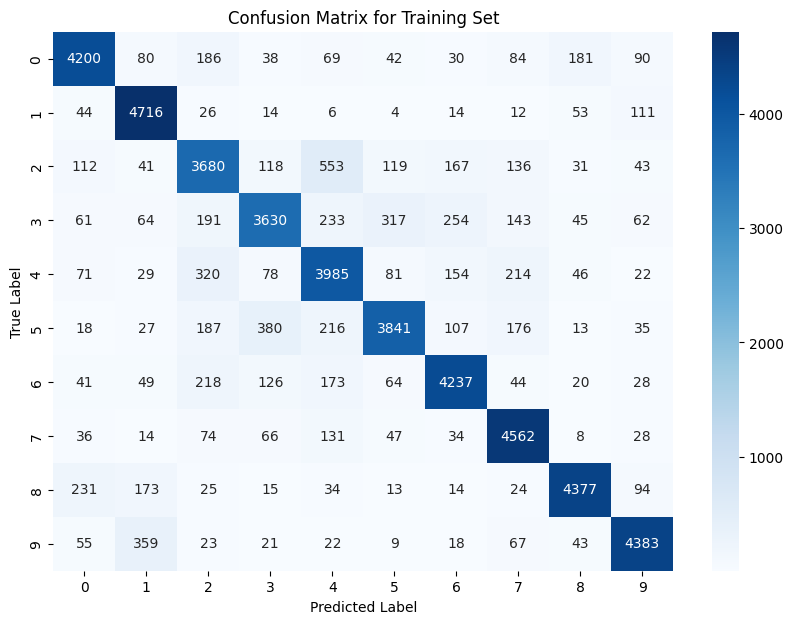

timecost:1.5171115398406982
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.86      0.84      0.85      5000
     Class 1       0.85      0.94      0.89      5000
     Class 2       0.75      0.74      0.74      5000
     Class 3       0.81      0.73      0.77      5000
     Class 4       0.73      0.80      0.76      5000
     Class 5       0.85      0.77      0.81      5000
     Class 6       0.84      0.85      0.84      5000
     Class 7       0.84      0.91      0.87      5000
     Class 8       0.91      0.88      0.89      5000
     Class 9       0.90      0.88      0.89      5000

    accuracy                           0.83     50000
   macro avg       0.83      0.83      0.83     50000
weighted avg       0.83      0.83      0.83     50000

timecost:427.09315752983093
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 65792 pa

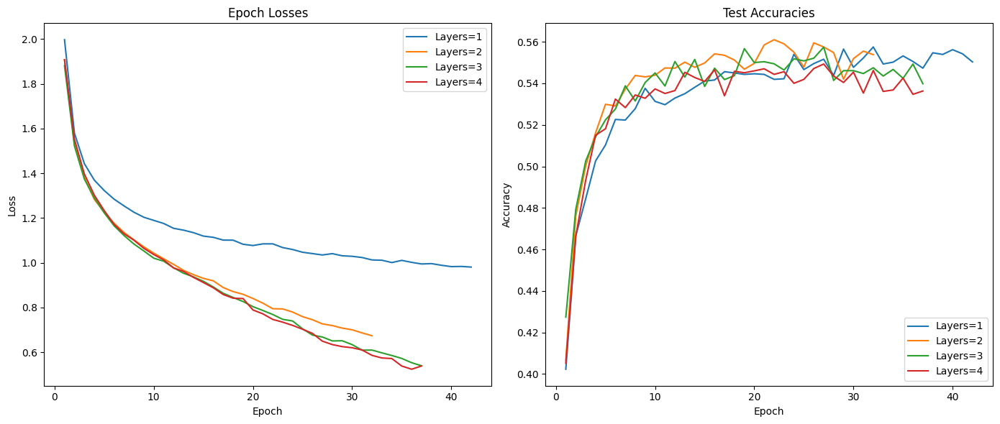

In [ ]:
# Layers
model = MLP()
model.add(HiddenLayer(128, 256))
model.add(GELULayer())
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_la_1 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_la_1.mini_batch_train()
print("train_accuracies:",trainings_la_1.train_accuracies)
print("test_accuracies:",trainings_la_1.test_accuracies)
print("epoch_losses:",trainings_la_1.epoch_losses)
print("params_count:",trainings_la_1.params_count)
print("train_timecost:",trainings_la_1.train_timecost)
print("test_timecost:",trainings_la_1.test_timecost)
print("train_report:",trainings_la_1.train_report)
print("test_report:",trainings_la_1.test_report)

model = MLP()
model.add(HiddenLayer(128, 256))
model.add(GELULayer())
model.add(HiddenLayer(256, 256))
model.add(GELULayer())
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_la_2 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_la_2.mini_batch_train()
print("train_accuracies:",trainings_la_2.train_accuracies)
print("test_accuracies:",trainings_la_2.test_accuracies)
print("epoch_losses:",trainings_la_2.epoch_losses)
print("params_count:",trainings_la_2.params_count)
print("train_timecost:",trainings_la_2.train_timecost)
print("test_timecost:",trainings_la_2.test_timecost)
print("train_report:",trainings_la_2.train_report)
print("test_report:",trainings_la_2.test_report)

model = MLP()
model.add(HiddenLayer(128, 256))
model.add(GELULayer())
model.add(HiddenLayer(256, 256))
model.add(GELULayer())
model.add(HiddenLayer(256, 256))
model.add(GELULayer())
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_la_3 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_la_3.mini_batch_train()
print("train_accuracies:",trainings_la_3.train_accuracies)
print("test_accuracies:",trainings_la_3.test_accuracies)
print("epoch_losses:",trainings_la_3.epoch_losses)
print("params_count:",trainings_la_3.params_count)
print("train_timecost:",trainings_la_3.train_timecost)
print("test_timecost:",trainings_la_3.test_timecost)
print("train_report:",trainings_la_3.train_report)
print("test_report:",trainings_la_3.test_report)

model = MLP()
model.add(HiddenLayer(128, 256))
model.add(GELULayer())
model.add(HiddenLayer(256, 256))
model.add(GELULayer())
model.add(HiddenLayer(256, 256))
model.add(GELULayer())
model.add(HiddenLayer(256, 256))
model.add(GELULayer())
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_la_4 = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_la_4.mini_batch_train()
print("train_accuracies:",trainings_la_4.train_accuracies)
print("test_accuracies:",trainings_la_4.test_accuracies)
print("epoch_losses:",trainings_la_4.epoch_losses)
print("params_count:",trainings_la_4.params_count)
print("train_timecost:",trainings_la_4.train_timecost)
print("test_timecost:",trainings_la_4.test_timecost)
print("train_report:",trainings_la_4.train_report)
print("test_report:",trainings_la_4.test_report)

epoch_losses = {
"1":trainings_la_1.epoch_losses,
"2":trainings_la_2.epoch_losses,
"3":trainings_la_3.epoch_losses,
"4":trainings_la_4.epoch_losses,
}

test_accuracies = {
"1":trainings_la_1.test_accuracies,
"2":trainings_la_2.test_accuracies,
"3":trainings_la_3.test_accuracies,
"4":trainings_la_4.test_accuracies,
}

plot_training_results(epoch_losses, test_accuracies, 'Layers')

## Ablation studies

Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (HiddenLayer): 65792 parameters
Layer 2 (HiddenLayer): 2570 parameters
Layer 3 (SoftmaxLayer): No parameters or `param_count` method not implemented.
Total parameters: 101386


<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.32084, Test Accuracy: 0.3196, Loss: 2.3546811695873195
Epoch 2, Train Accuracy: 0.36248, Test Accuracy: 0.36, Loss: 1.9016924505488362
Epoch 3, Train Accuracy: 0.3856, Test Accuracy: 0.3794, Loss: 1.8026253294028525
Epoch 4, Train Accuracy: 0.39092, Test Accuracy: 0.3815, Loss: 1.7756823952247838
Epoch 5, Train Accuracy: 0.39452, Test Accuracy: 0.3852, Loss: 1.76161405388654
Epoch 6, Train Accuracy: 0.40046, Test Accuracy: 0.3952, Loss: 1.7556450169122293
Epoch 7, Train Accuracy: 0.40138, Test Accuracy: 0.3923, Loss: 1.7484849939750056
Epoch 8, Train Accuracy: 0.4018, Test Accuracy: 0.3919, Loss: 1.750620931255788
Epoch 9, Train Accuracy: 0.40042, Test Accuracy: 0.3906, Loss: 1.7506822657784846
Epoch 10, Train Accuracy: 0.39798, Test Accuracy: 0.39, Loss: 1.751088586018159
Epoch 11, Train Accuracy: 0.3956, Test Accuracy: 0.3876, Loss: 1.7495558096963162
Epoch 12, Train Accuracy: 0.4039, Test Accuracy: 0.3993, Loss: 1.7467074279598296
Epoch 13, Train Accuracy:

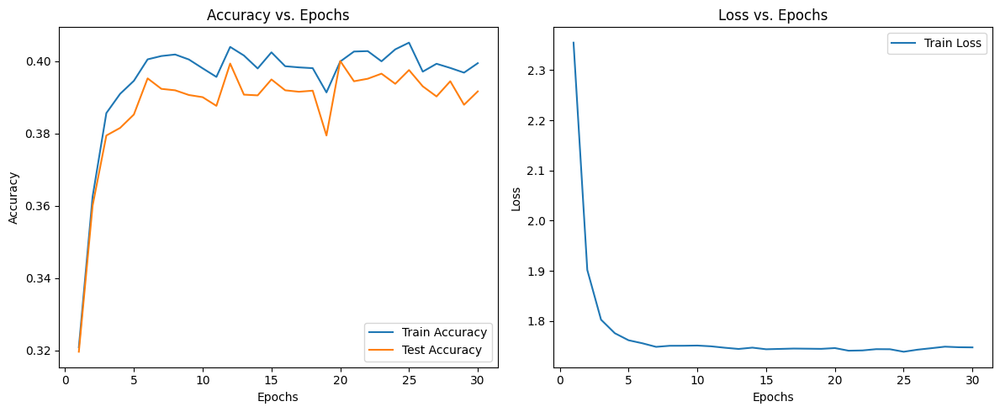

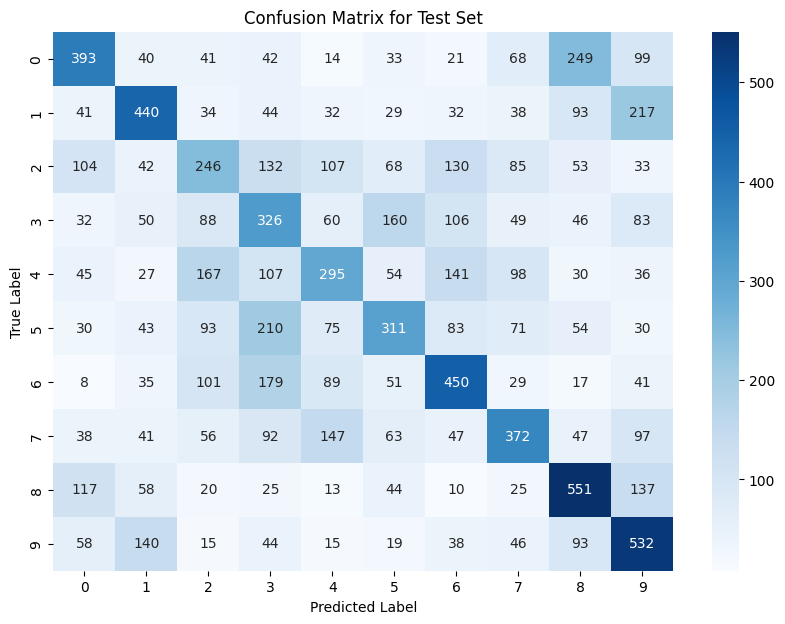

timecost:0.035085439682006836
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.45      0.39      0.42      1000
     Class 1       0.48      0.44      0.46      1000
     Class 2       0.29      0.25      0.26      1000
     Class 3       0.27      0.33      0.30      1000
     Class 4       0.35      0.29      0.32      1000
     Class 5       0.37      0.31      0.34      1000
     Class 6       0.43      0.45      0.44      1000
     Class 7       0.42      0.37      0.40      1000
     Class 8       0.45      0.55      0.49      1000
     Class 9       0.41      0.53      0.46      1000

    accuracy                           0.39     10000
   macro avg       0.39      0.39      0.39     10000
weighted avg       0.39      0.39      0.39     10000



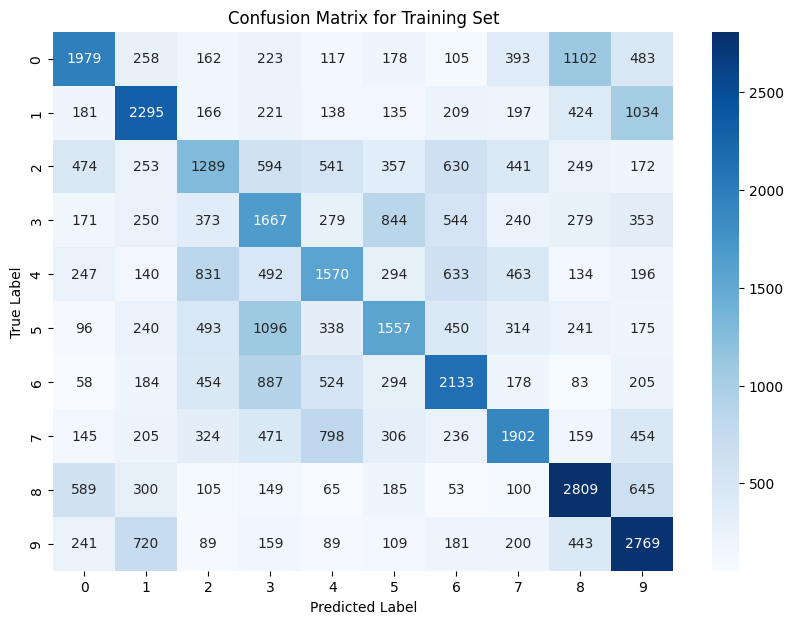

timecost:0.21509289741516113
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.47      0.40      0.43      5000
     Class 1       0.47      0.46      0.47      5000
     Class 2       0.30      0.26      0.28      5000
     Class 3       0.28      0.33      0.30      5000
     Class 4       0.35      0.31      0.33      5000
     Class 5       0.37      0.31      0.34      5000
     Class 6       0.41      0.43      0.42      5000
     Class 7       0.43      0.38      0.40      5000
     Class 8       0.47      0.56      0.51      5000
     Class 9       0.43      0.55      0.48      5000

    accuracy                           0.40     50000
   macro avg       0.40      0.40      0.40     50000
weighted avg       0.40      0.40      0.40     50000

timecost:98.3790533542633
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (HiddenLayer): 65792 parameters
Layer 2 (HiddenLayer): 2570 parameters
Layer 3 (SoftmaxLayer): No pa

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.41136, Test Accuracy: 0.4118, Loss: 1.9538979306471034
Epoch 2, Train Accuracy: 0.4907, Test Accuracy: 0.4717, Loss: 1.549645271742645
Epoch 3, Train Accuracy: 0.52606, Test Accuracy: 0.4934, Loss: 1.4010327207899904
Epoch 4, Train Accuracy: 0.55734, Test Accuracy: 0.5104, Loss: 1.3139539025164237
Epoch 5, Train Accuracy: 0.572, Test Accuracy: 0.5239, Loss: 1.2505993969040674
Epoch 6, Train Accuracy: 0.59532, Test Accuracy: 0.5363, Loss: 1.1989094049660727
Epoch 7, Train Accuracy: 0.60422, Test Accuracy: 0.529, Loss: 1.1613991660104976
Epoch 8, Train Accuracy: 0.61908, Test Accuracy: 0.5419, Loss: 1.1305691433904819
Epoch 9, Train Accuracy: 0.6287, Test Accuracy: 0.5451, Loss: 1.0974467538353097
Epoch 10, Train Accuracy: 0.64066, Test Accuracy: 0.5515, Loss: 1.067979259527279
Epoch 11, Train Accuracy: 0.65222, Test Accuracy: 0.5477, Loss: 1.0423978505494647
Epoch 12, Train Accuracy: 0.65322, Test Accuracy: 0.548, Loss: 1.0206047721720566
Epoch 13, Train Accur

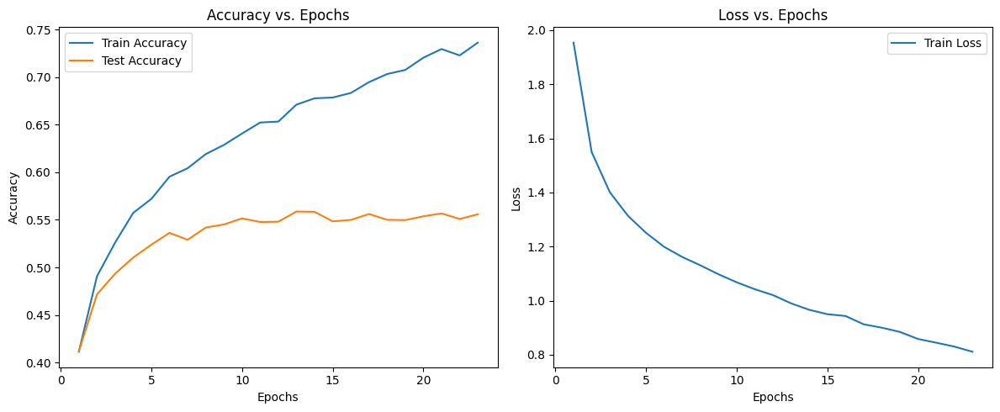

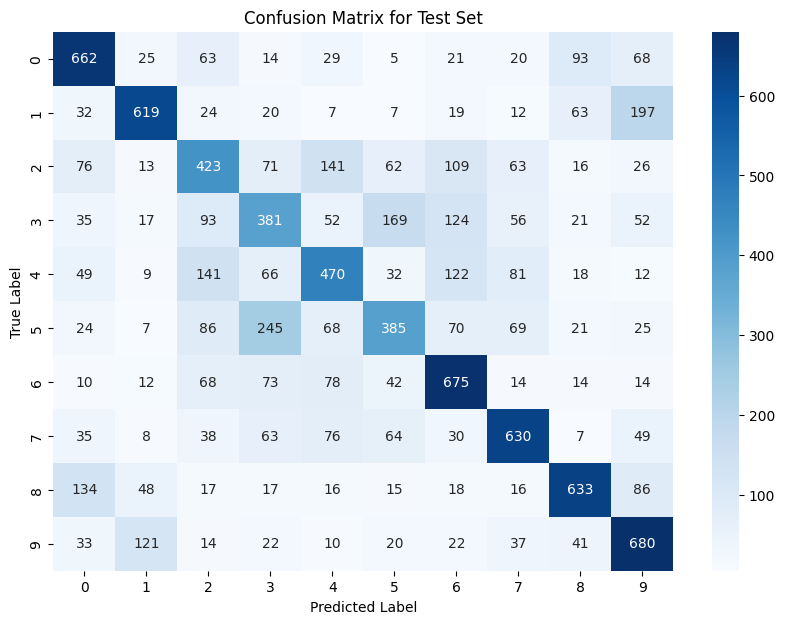

timecost:0.19903898239135742
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.61      0.66      0.63      1000
     Class 1       0.70      0.62      0.66      1000
     Class 2       0.44      0.42      0.43      1000
     Class 3       0.39      0.38      0.39      1000
     Class 4       0.50      0.47      0.48      1000
     Class 5       0.48      0.39      0.43      1000
     Class 6       0.56      0.68      0.61      1000
     Class 7       0.63      0.63      0.63      1000
     Class 8       0.68      0.63      0.66      1000
     Class 9       0.56      0.68      0.62      1000

    accuracy                           0.56     10000
   macro avg       0.56      0.56      0.55     10000
weighted avg       0.56      0.56      0.55     10000



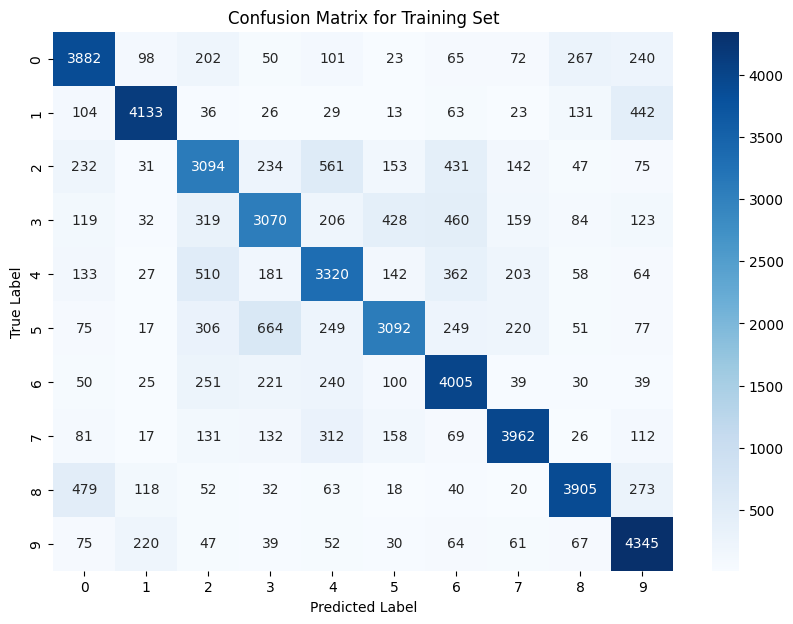

timecost:0.8412039279937744
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.74      0.78      0.76      5000
     Class 1       0.88      0.83      0.85      5000
     Class 2       0.63      0.62      0.62      5000
     Class 3       0.66      0.61      0.64      5000
     Class 4       0.65      0.66      0.66      5000
     Class 5       0.74      0.62      0.68      5000
     Class 6       0.69      0.80      0.74      5000
     Class 7       0.81      0.79      0.80      5000
     Class 8       0.84      0.78      0.81      5000
     Class 9       0.75      0.87      0.81      5000

    accuracy                           0.74     50000
   macro avg       0.74      0.74      0.74     50000
weighted avg       0.74      0.74      0.74     50000

timecost:148.1175925731659
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (GELULayer): No parameters or `param_count` method not implemented.
Layer 2 (HiddenLayer): 65792 par

In [ ]:
# none
model = MLP()
model.add(HiddenLayer(128, 256))
model.add(HiddenLayer(256, 256))
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_none_acti = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=50,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_none_acti.mini_batch_train()
print("train_accuracies:",trainings_none_acti.train_accuracies)
print("test_accuracies:",trainings_none_acti.test_accuracies)
print("epoch_losses:",trainings_none_acti.epoch_losses)
print("params_count:",trainings_none_acti.params_count)
print("train_timecost:",trainings_none_acti.train_timecost)
print("test_timecost:",trainings_none_acti.test_timecost)
print("train_report:",trainings_none_acti.train_report)
print("test_report:",trainings_none_acti.test_report)

###GELU
model = MLP()
model.add(HiddenLayer(128, 256))
model.add(GELULayer())
model.add(HiddenLayer(256, 256))
model.add(GELULayer())
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
trainings_GELU = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=50,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_GELU.mini_batch_train()
print("train_accuracies:",trainings_GELU.train_accuracies)
print("test_accuracies:",trainings_GELU.test_accuracies)
print("epoch_losses:",trainings_GELU.epoch_losses)
print("params_count:",trainings_GELU.params_count)
print("train_timecost:",trainings_GELU.train_timecost)
print("test_timecost:",trainings_GELU.test_timecost)
print("train_report:",trainings_GELU.train_report)
print("test_report:",trainings_GELU.test_report)

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.43988, Test Accuracy: 0.4284, Loss: 1.8804291637748807
Epoch 2, Train Accuracy: 0.49758, Test Accuracy: 0.4791, Loss: 1.5674127611435904
Epoch 3, Train Accuracy: 0.52788, Test Accuracy: 0.4971, Loss: 1.4540741550364378
Epoch 4, Train Accuracy: 0.55424, Test Accuracy: 0.5136, Loss: 1.3804251640195746
Epoch 5, Train Accuracy: 0.58176, Test Accuracy: 0.5213, Loss: 1.3215279802765778
Epoch 6, Train Accuracy: 0.59944, Test Accuracy: 0.533, Loss: 1.2641495611566833
Epoch 7, Train Accuracy: 0.61352, Test Accuracy: 0.5373, Loss: 1.2235370523934266
Epoch 8, Train Accuracy: 0.62486, Test Accuracy: 0.5429, Loss: 1.1994376470175219
Epoch 9, Train Accuracy: 0.63856, Test Accuracy: 0.5419, Loss: 1.1707570567533354
Epoch 10, Train Accuracy: 0.65384, Test Accuracy: 0.5412, Loss: 1.1430098962209128
Epoch 11, Train Accuracy: 0.6535, Test Accuracy: 0.5473, Loss: 1.1156812788229054
Epoch 12, Train Accuracy: 0.67004, Test Accuracy: 0.546, Loss: 1.097610290738199
Epoch 13, Train A

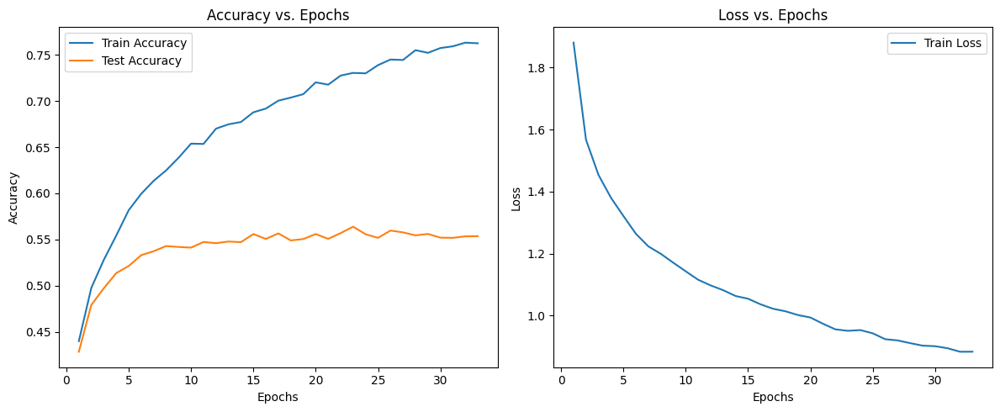

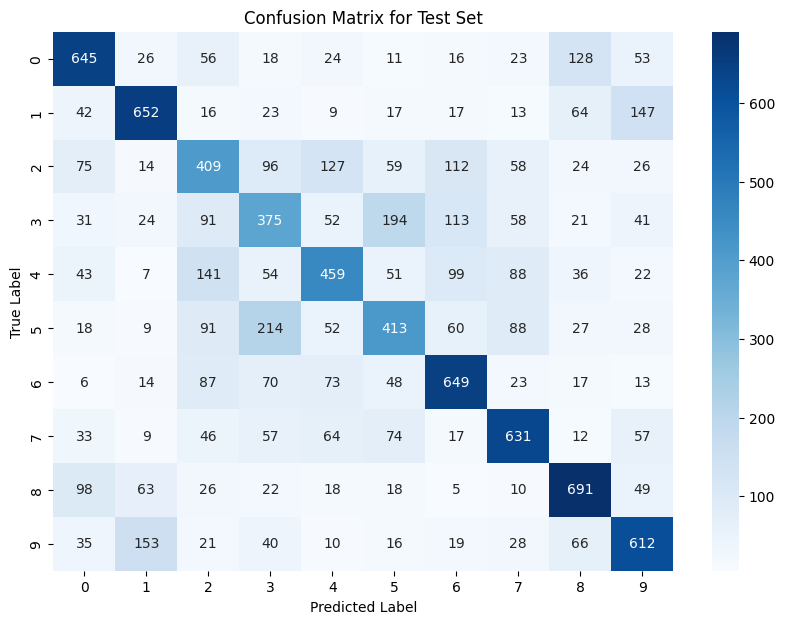

timecost:0.23127388954162598
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.63      0.65      0.64      1000
     Class 1       0.67      0.65      0.66      1000
     Class 2       0.42      0.41      0.41      1000
     Class 3       0.39      0.38      0.38      1000
     Class 4       0.52      0.46      0.49      1000
     Class 5       0.46      0.41      0.43      1000
     Class 6       0.59      0.65      0.62      1000
     Class 7       0.62      0.63      0.62      1000
     Class 8       0.64      0.69      0.66      1000
     Class 9       0.58      0.61      0.60      1000

    accuracy                           0.55     10000
   macro avg       0.55      0.55      0.55     10000
weighted avg       0.55      0.55      0.55     10000



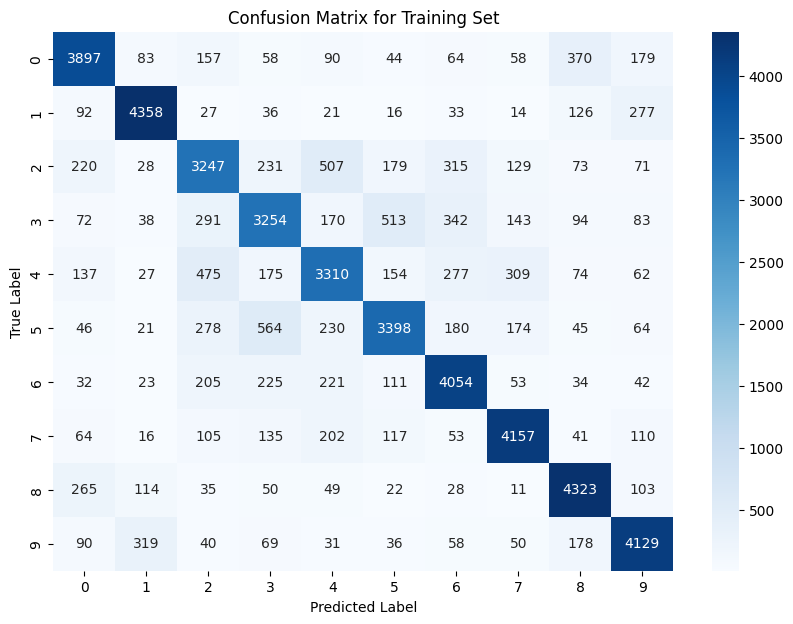

timecost:1.19325590133667
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.79      0.78      0.79      5000
     Class 1       0.87      0.87      0.87      5000
     Class 2       0.67      0.65      0.66      5000
     Class 3       0.68      0.65      0.66      5000
     Class 4       0.69      0.66      0.67      5000
     Class 5       0.74      0.68      0.71      5000
     Class 6       0.75      0.81      0.78      5000
     Class 7       0.82      0.83      0.82      5000
     Class 8       0.81      0.86      0.83      5000
     Class 9       0.81      0.83      0.82      5000

    accuracy                           0.76     50000
   macro avg       0.76      0.76      0.76     50000
weighted avg       0.76      0.76      0.76     50000

timecost:307.0549235343933
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (BatchNormLayer): 512 parameters
Layer 2 (GELULayer): No parameters or `param_count` method not implem

In [ ]:
###norm+gelu
model = MLP()
model.add(HiddenLayer(128, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(HiddenLayer(256, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
trainings_norm_gelu = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=50,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_norm_gelu.mini_batch_train()
print("train_accuracies:",trainings_norm_gelu.train_accuracies)
print("test_accuracies:",trainings_norm_gelu.test_accuracies)
print("epoch_losses:",trainings_norm_gelu.epoch_losses)
print("params_count:",trainings_norm_gelu.params_count)
print("train_timecost:",trainings_norm_gelu.train_timecost)
print("test_timecost:",trainings_norm_gelu.test_timecost)
print("train_report:",trainings_norm_gelu.train_report)
print("test_report:",trainings_norm_gelu.test_report)

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.4174, Test Accuracy: 0.4207, Loss: 1.9689632670441592
Epoch 2, Train Accuracy: 0.46266, Test Accuracy: 0.4592, Loss: 1.6779322889696489
Epoch 3, Train Accuracy: 0.49598, Test Accuracy: 0.4829, Loss: 1.5793968807867431
Epoch 4, Train Accuracy: 0.52122, Test Accuracy: 0.4984, Loss: 1.5188717566806518
Epoch 5, Train Accuracy: 0.53658, Test Accuracy: 0.5143, Loss: 1.46907600331469
Epoch 6, Train Accuracy: 0.54862, Test Accuracy: 0.5225, Loss: 1.4381204032337487
Epoch 7, Train Accuracy: 0.55938, Test Accuracy: 0.5251, Loss: 1.4067756053466547
Epoch 8, Train Accuracy: 0.5745, Test Accuracy: 0.536, Loss: 1.3825506691856715
Epoch 9, Train Accuracy: 0.58574, Test Accuracy: 0.5401, Loss: 1.3570043056095558
Epoch 10, Train Accuracy: 0.59002, Test Accuracy: 0.5436, Loss: 1.3418172516063875
Epoch 11, Train Accuracy: 0.60026, Test Accuracy: 0.5432, Loss: 1.32559766606311
Epoch 12, Train Accuracy: 0.60614, Test Accuracy: 0.5471, Loss: 1.3082673259371942
Epoch 13, Train Accu

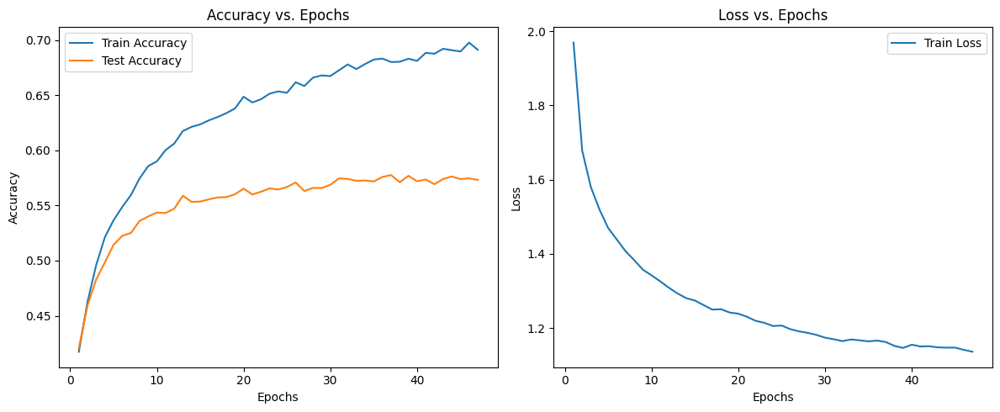

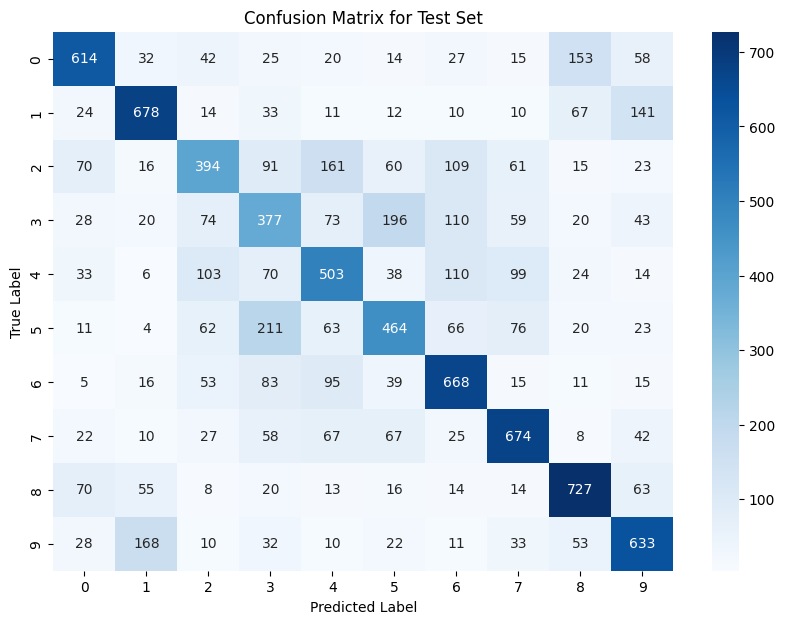

timecost:0.2062544822692871
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.68      0.61      0.64      1000
     Class 1       0.67      0.68      0.68      1000
     Class 2       0.50      0.39      0.44      1000
     Class 3       0.38      0.38      0.38      1000
     Class 4       0.50      0.50      0.50      1000
     Class 5       0.50      0.46      0.48      1000
     Class 6       0.58      0.67      0.62      1000
     Class 7       0.64      0.67      0.66      1000
     Class 8       0.66      0.73      0.69      1000
     Class 9       0.60      0.63      0.62      1000

    accuracy                           0.57     10000
   macro avg       0.57      0.57      0.57     10000
weighted avg       0.57      0.57      0.57     10000



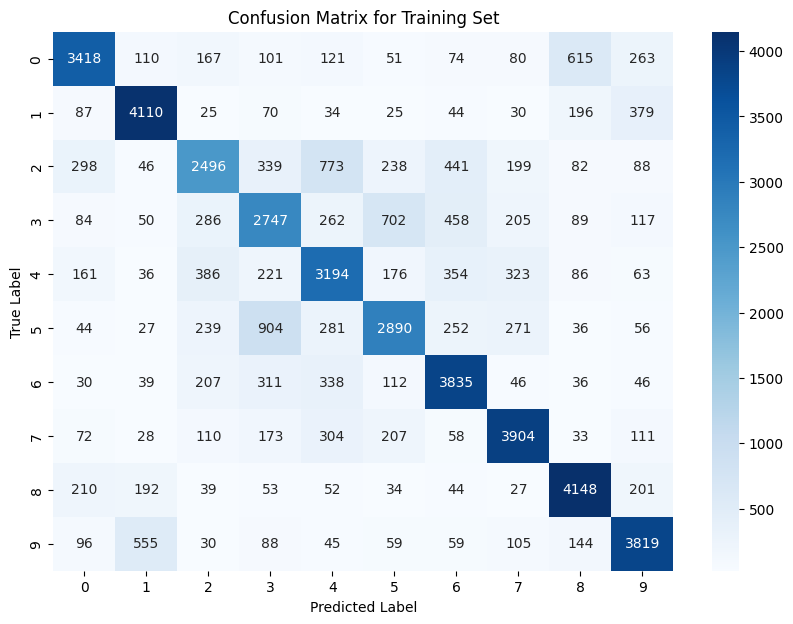

timecost:1.1014251708984375
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.76      0.68      0.72      5000
     Class 1       0.79      0.82      0.81      5000
     Class 2       0.63      0.50      0.56      5000
     Class 3       0.55      0.55      0.55      5000
     Class 4       0.59      0.64      0.61      5000
     Class 5       0.64      0.58      0.61      5000
     Class 6       0.68      0.77      0.72      5000
     Class 7       0.75      0.78      0.77      5000
     Class 8       0.76      0.83      0.79      5000
     Class 9       0.74      0.76      0.75      5000

    accuracy                           0.69     50000
   macro avg       0.69      0.69      0.69     50000
weighted avg       0.69      0.69      0.69     50000

timecost:491.955584526062
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (BatchNormLayer): 512 parameters
Layer 2 (GELULayer): No parameters or `param_count` method not imple

In [ ]:
model = MLP()
model.add(HiddenLayer(128, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(256, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
trainings_norm_gelu_dropout = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=50,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_norm_gelu_dropout.mini_batch_train()
print("train_accuracies:",trainings_norm_gelu_dropout.train_accuracies)
print("test_accuracies:",trainings_norm_gelu_dropout.test_accuracies)
print("epoch_losses:",trainings_norm_gelu_dropout.epoch_losses)
print("params_count:",trainings_norm_gelu_dropout.params_count)
print("train_timecost:",trainings_norm_gelu_dropout.train_timecost)
print("test_timecost:",trainings_norm_gelu_dropout.test_timecost)
print("train_report:",trainings_norm_gelu_dropout.train_report)
print("test_report:",trainings_norm_gelu_dropout.test_report)

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.4151, Test Accuracy: 0.4126, Loss: 2.0067148256359753
Epoch 2, Train Accuracy: 0.4633, Test Accuracy: 0.455, Loss: 1.6922101003083245
Epoch 3, Train Accuracy: 0.49438, Test Accuracy: 0.4813, Loss: 1.579719360139418
Epoch 4, Train Accuracy: 0.51518, Test Accuracy: 0.4916, Loss: 1.5204024742665205
Epoch 5, Train Accuracy: 0.53332, Test Accuracy: 0.5119, Loss: 1.478321492938924
Epoch 6, Train Accuracy: 0.54436, Test Accuracy: 0.5165, Loss: 1.4379739489542829
Epoch 7, Train Accuracy: 0.55962, Test Accuracy: 0.5249, Loss: 1.414177249636191
Epoch 8, Train Accuracy: 0.5672, Test Accuracy: 0.5269, Loss: 1.392843403664541
Epoch 9, Train Accuracy: 0.57244, Test Accuracy: 0.533, Loss: 1.3740560780486213
Epoch 10, Train Accuracy: 0.57772, Test Accuracy: 0.5328, Loss: 1.3613684550622343
Epoch 11, Train Accuracy: 0.58654, Test Accuracy: 0.5377, Loss: 1.3442238334486416
Epoch 12, Train Accuracy: 0.58766, Test Accuracy: 0.5369, Loss: 1.3328094751470285
Epoch 13, Train Accura

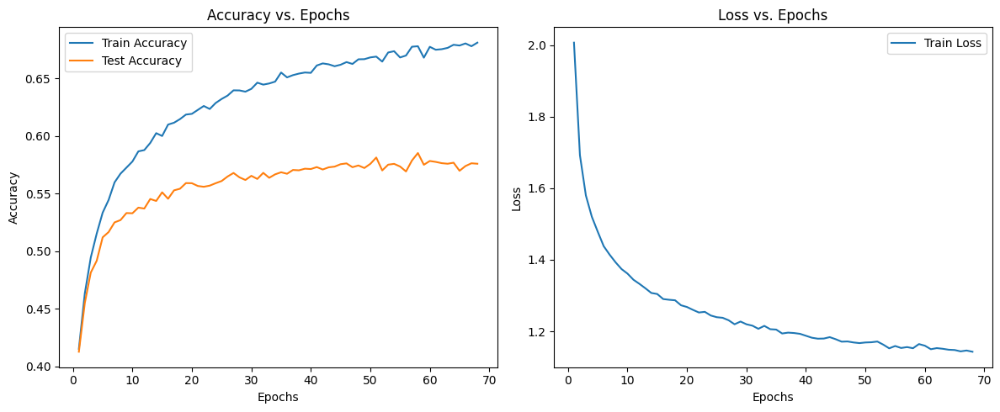

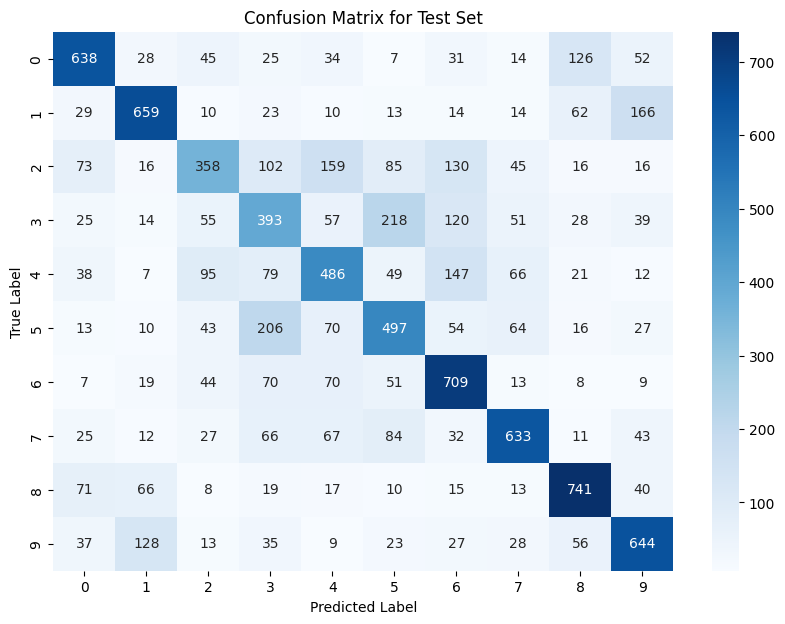

timecost:0.285503625869751
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.67      0.64      0.65      1000
     Class 1       0.69      0.66      0.67      1000
     Class 2       0.51      0.36      0.42      1000
     Class 3       0.39      0.39      0.39      1000
     Class 4       0.50      0.49      0.49      1000
     Class 5       0.48      0.50      0.49      1000
     Class 6       0.55      0.71      0.62      1000
     Class 7       0.67      0.63      0.65      1000
     Class 8       0.68      0.74      0.71      1000
     Class 9       0.61      0.64      0.63      1000

    accuracy                           0.58     10000
   macro avg       0.58      0.58      0.57     10000
weighted avg       0.58      0.58      0.57     10000



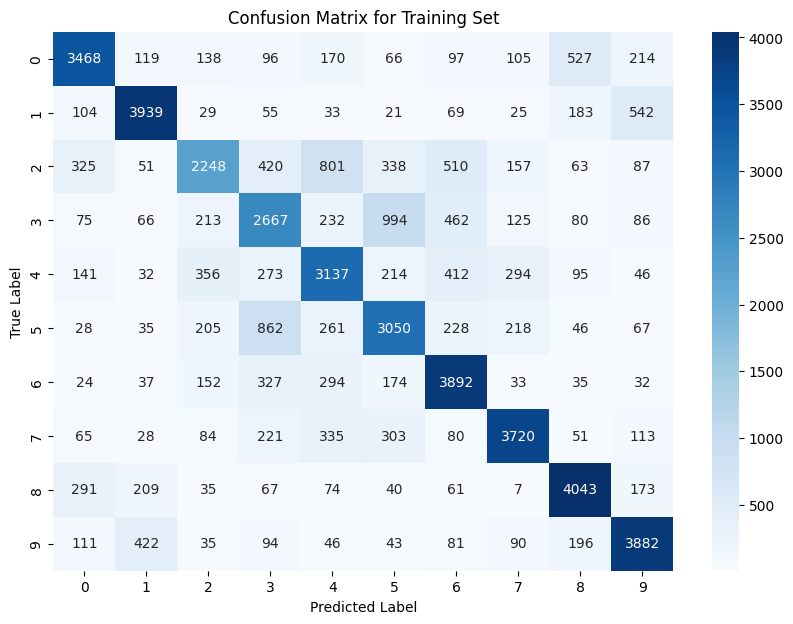

timecost:1.4909327030181885
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.75      0.69      0.72      5000
     Class 1       0.80      0.79      0.79      5000
     Class 2       0.64      0.45      0.53      5000
     Class 3       0.52      0.53      0.53      5000
     Class 4       0.58      0.63      0.60      5000
     Class 5       0.58      0.61      0.60      5000
     Class 6       0.66      0.78      0.71      5000
     Class 7       0.78      0.74      0.76      5000
     Class 8       0.76      0.81      0.78      5000
     Class 9       0.74      0.78      0.76      5000

    accuracy                           0.68     50000
   macro avg       0.68      0.68      0.68     50000
weighted avg       0.68      0.68      0.68     50000

timecost:904.6853954792023
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (BatchNormLayer): 512 parameters
Layer 2 (GELULayer): No parameters or `param_count` method not impl

In [ ]:
model = MLP()
model.add(HiddenLayer(128, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(ResidualBlock(256, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
trainings_norm_gelu_dropout_res = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_norm_gelu_dropout_res.mini_batch_train()
print("train_accuracies:",trainings_norm_gelu_dropout_res.train_accuracies)
print("test_accuracies:",trainings_norm_gelu_dropout_res.test_accuracies)
print("epoch_losses:",trainings_norm_gelu_dropout_res.epoch_losses)
print("params_count:",trainings_norm_gelu_dropout_res.params_count)
print("train_timecost:",trainings_norm_gelu_dropout_res.train_timecost)
print("test_timecost:",trainings_norm_gelu_dropout_res.test_timecost)
print("train_report:",trainings_norm_gelu_dropout_res.train_report)
print("test_report:",trainings_norm_gelu_dropout_res.test_report)

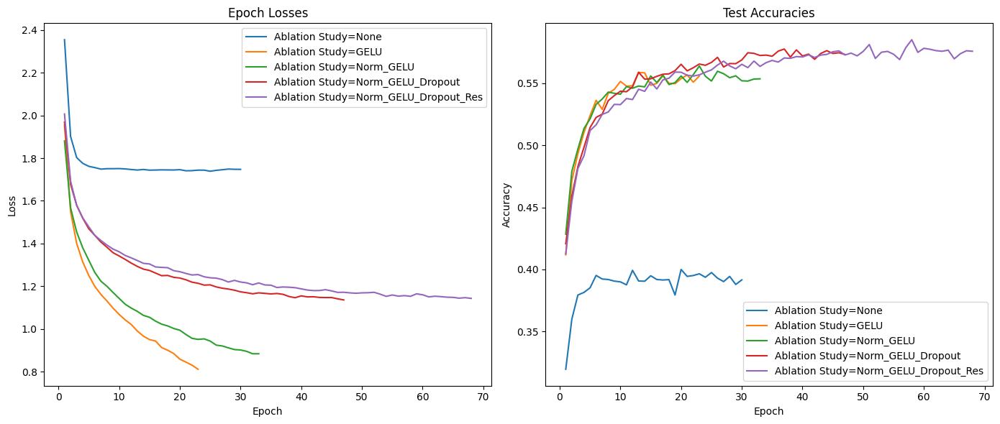

In [ ]:
epoch_losses = {
"None":trainings_none_acti.epoch_losses,
"GELU":trainings_GELU.epoch_losses,
"Norm_GELU":trainings_norm_gelu.epoch_losses,
"Norm_GELU_Dropout":trainings_norm_gelu_dropout.epoch_losses,
"Norm_GELU_Dropout_Res":trainings_norm_gelu_dropout_res.epoch_losses
}




test_accuracies = {
"None":trainings_none_acti.test_accuracies,
"GELU":trainings_GELU.test_accuracies,
"Norm_GELU":trainings_norm_gelu.test_accuracies,
"Norm_GELU_Dropout":trainings_norm_gelu_dropout.test_accuracies,
"Norm_GELU_Dropout_Res":trainings_norm_gelu_dropout_res.test_accuracies
}
plot_training_results(epoch_losses, test_accuracies, 'Ablation Study')

## Comparison experiments

### normalization

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.32502, Test Accuracy: 0.3255, Loss: 2.0418120330790694
Epoch 2, Train Accuracy: 0.35254, Test Accuracy: 0.3485, Loss: 1.8876949193803942
Epoch 3, Train Accuracy: 0.37454, Test Accuracy: 0.3772, Loss: 1.8292727765420864
Epoch 4, Train Accuracy: 0.3987, Test Accuracy: 0.4013, Loss: 1.8056650940482848
Epoch 5, Train Accuracy: 0.4068, Test Accuracy: 0.4035, Loss: 1.7633850497248824
Epoch 6, Train Accuracy: 0.4149, Test Accuracy: 0.4144, Loss: 1.7469076749661983
Epoch 7, Train Accuracy: 0.44092, Test Accuracy: 0.4381, Loss: 1.716126630777591
Epoch 8, Train Accuracy: 0.42922, Test Accuracy: 0.4199, Loss: 1.702424581246173
Epoch 9, Train Accuracy: 0.44942, Test Accuracy: 0.4395, Loss: 1.6871468396644853
Epoch 10, Train Accuracy: 0.45524, Test Accuracy: 0.4484, Loss: 1.6852175978815853
Epoch 11, Train Accuracy: 0.45266, Test Accuracy: 0.4373, Loss: 1.677533819717008
Epoch 12, Train Accuracy: 0.4718, Test Accuracy: 0.4549, Loss: 1.6578584604561097
Epoch 13, Train Accu

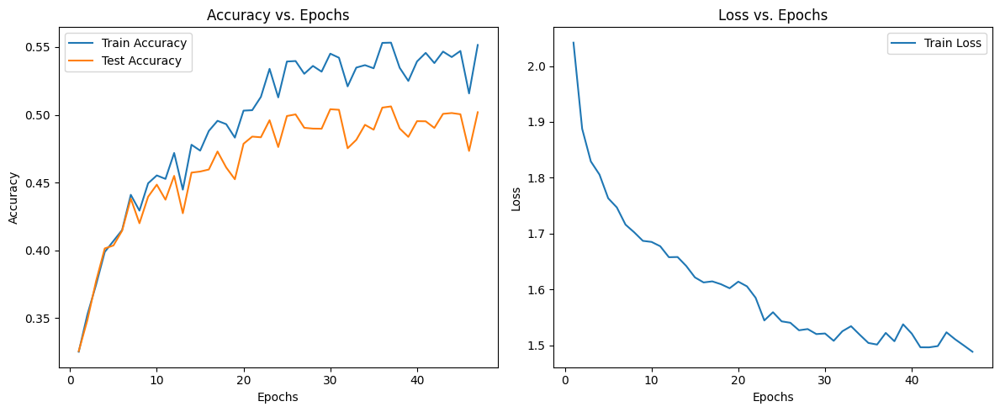

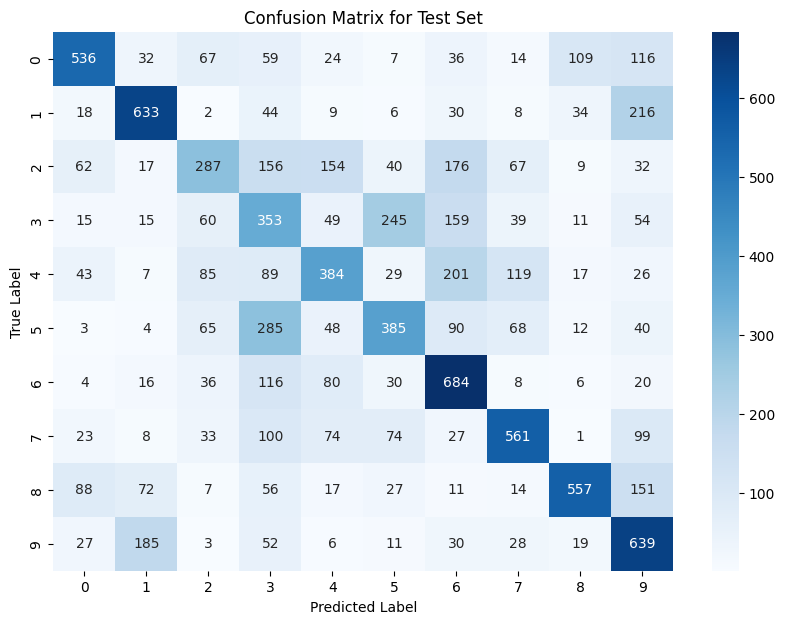

timecost:0.4649229049682617
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.65      0.54      0.59      1000
     Class 1       0.64      0.63      0.64      1000
     Class 2       0.44      0.29      0.35      1000
     Class 3       0.27      0.35      0.31      1000
     Class 4       0.45      0.38      0.42      1000
     Class 5       0.45      0.39      0.42      1000
     Class 6       0.47      0.68      0.56      1000
     Class 7       0.61      0.56      0.58      1000
     Class 8       0.72      0.56      0.63      1000
     Class 9       0.46      0.64      0.53      1000

    accuracy                           0.50     10000
   macro avg       0.52      0.50      0.50     10000
weighted avg       0.52      0.50      0.50     10000



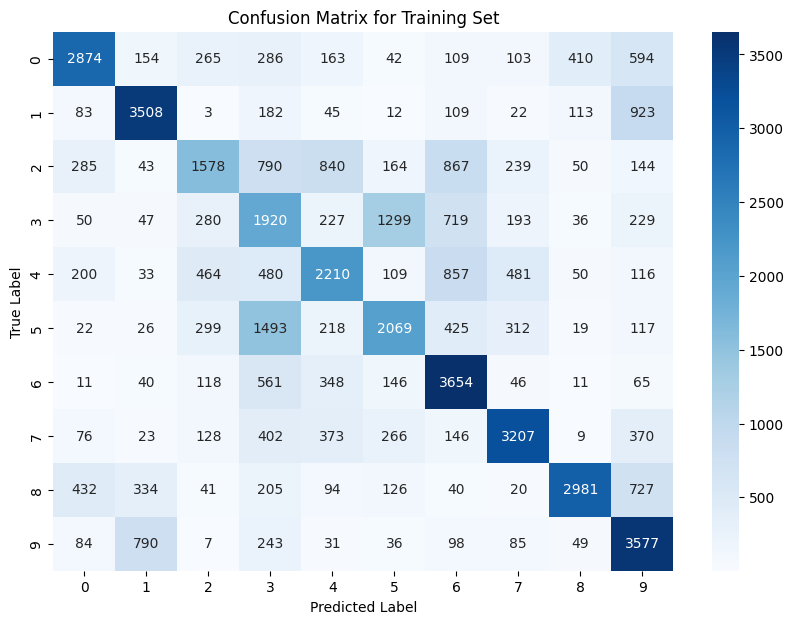

timecost:2.1693296432495117
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.70      0.57      0.63      5000
     Class 1       0.70      0.70      0.70      5000
     Class 2       0.50      0.32      0.39      5000
     Class 3       0.29      0.38      0.33      5000
     Class 4       0.49      0.44      0.46      5000
     Class 5       0.48      0.41      0.45      5000
     Class 6       0.52      0.73      0.61      5000
     Class 7       0.68      0.64      0.66      5000
     Class 8       0.80      0.60      0.68      5000
     Class 9       0.52      0.72      0.60      5000

    accuracy                           0.55     50000
   macro avg       0.57      0.55      0.55     50000
weighted avg       0.57      0.55      0.55     50000

timecost:926.6767795085907
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (LayerNormLayer): 512 parameters
Layer 2 (GELULayer): No parameters or `param_count` method not impl

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.4163, Test Accuracy: 0.4114, Loss: 1.9972702579490813
Epoch 2, Train Accuracy: 0.46898, Test Accuracy: 0.4619, Loss: 1.689500714863765
Epoch 3, Train Accuracy: 0.49536, Test Accuracy: 0.4797, Loss: 1.5840672732342005
Epoch 4, Train Accuracy: 0.5161, Test Accuracy: 0.4938, Loss: 1.5211039814153229
Epoch 5, Train Accuracy: 0.53106, Test Accuracy: 0.5071, Loss: 1.476759142592577
Epoch 6, Train Accuracy: 0.54344, Test Accuracy: 0.5103, Loss: 1.4453861425648888
Epoch 7, Train Accuracy: 0.55958, Test Accuracy: 0.5318, Loss: 1.4161606186407862
Epoch 8, Train Accuracy: 0.56792, Test Accuracy: 0.5302, Loss: 1.390013387248328
Epoch 9, Train Accuracy: 0.57074, Test Accuracy: 0.5294, Loss: 1.3730752112922908
Epoch 10, Train Accuracy: 0.57928, Test Accuracy: 0.5372, Loss: 1.3569180991106384
Epoch 11, Train Accuracy: 0.59088, Test Accuracy: 0.5444, Loss: 1.3448535472129055
Epoch 12, Train Accuracy: 0.5932, Test Accuracy: 0.535, Loss: 1.3300231890708794
Epoch 13, Train Accu

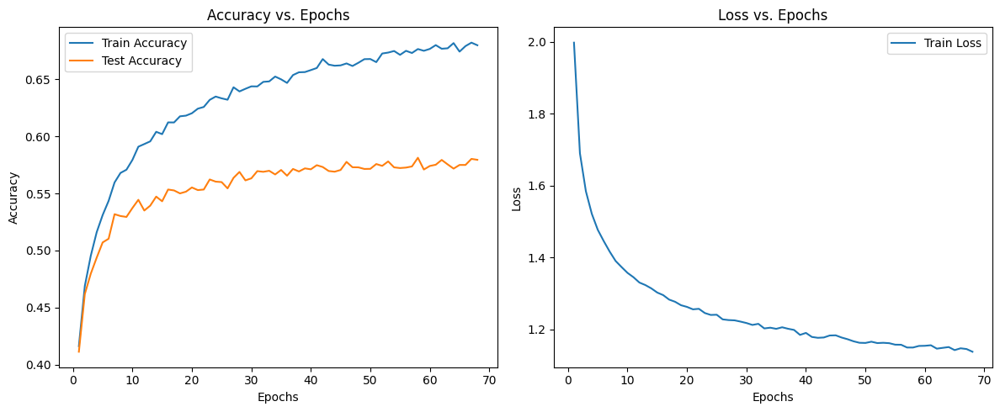

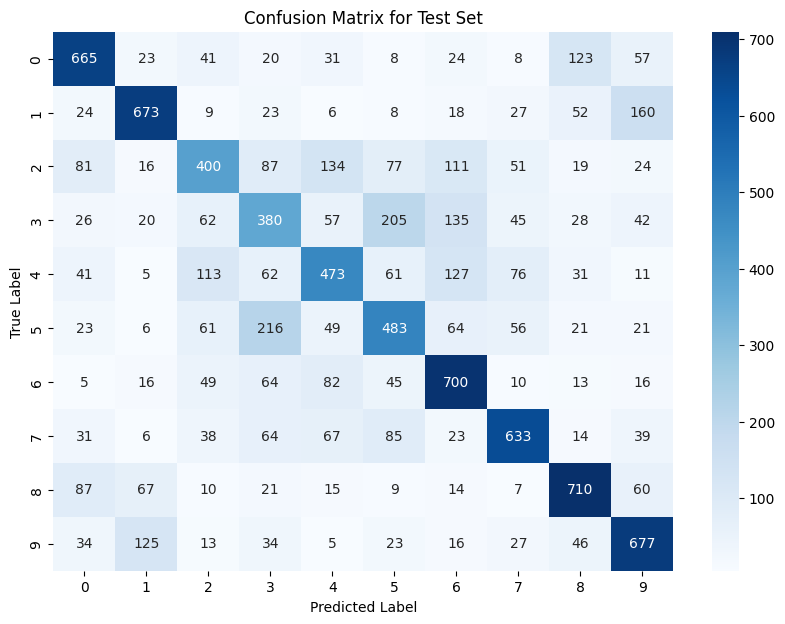

timecost:0.29177093505859375
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.65      0.67      0.66      1000
     Class 1       0.70      0.67      0.69      1000
     Class 2       0.50      0.40      0.45      1000
     Class 3       0.39      0.38      0.39      1000
     Class 4       0.51      0.47      0.49      1000
     Class 5       0.48      0.48      0.48      1000
     Class 6       0.57      0.70      0.63      1000
     Class 7       0.67      0.63      0.65      1000
     Class 8       0.67      0.71      0.69      1000
     Class 9       0.61      0.68      0.64      1000

    accuracy                           0.58     10000
   macro avg       0.58      0.58      0.58     10000
weighted avg       0.58      0.58      0.58     10000



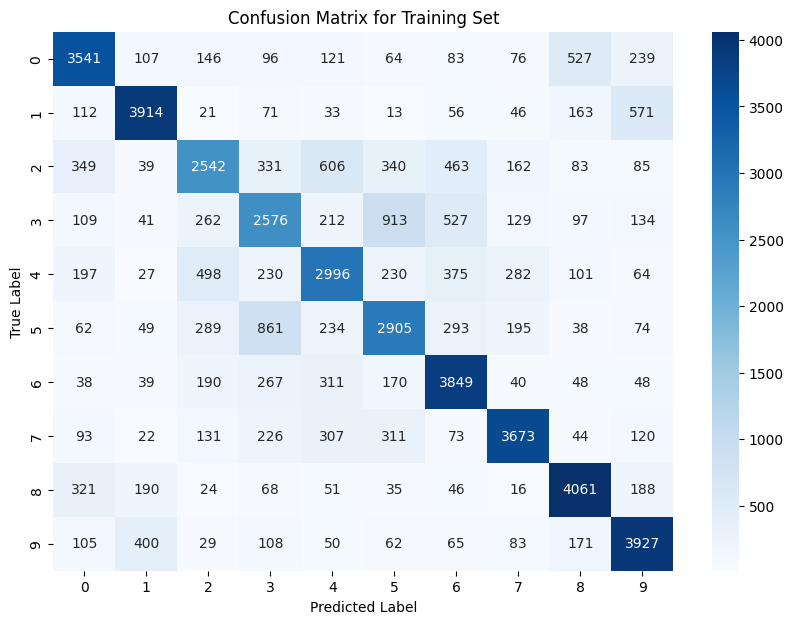

timecost:1.4930393695831299
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.72      0.71      0.71      5000
     Class 1       0.81      0.78      0.80      5000
     Class 2       0.62      0.51      0.56      5000
     Class 3       0.53      0.52      0.52      5000
     Class 4       0.61      0.60      0.60      5000
     Class 5       0.58      0.58      0.58      5000
     Class 6       0.66      0.77      0.71      5000
     Class 7       0.78      0.73      0.76      5000
     Class 8       0.76      0.81      0.79      5000
     Class 9       0.72      0.79      0.75      5000

    accuracy                           0.68     50000
   macro avg       0.68      0.68      0.68     50000
weighted avg       0.68      0.68      0.68     50000

timecost:1009.7468218803406
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (BatchNormLayer): 512 parameters
Layer 2 (GELULayer): No parameters or `param_count` method not imp

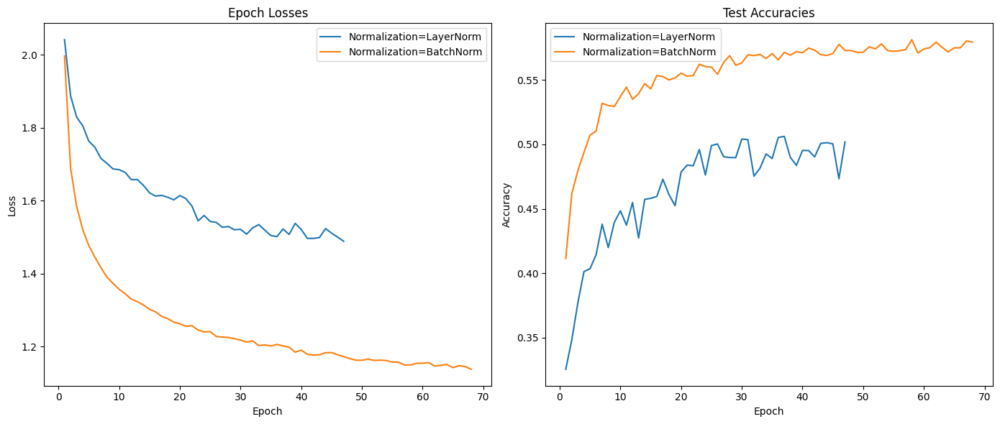

In [ ]:
model = MLP()
model.add(HiddenLayer(128, 256))
model.add(LayerNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(ResidualBlock(256, 256))
model.add(LayerNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
trainings_layernorm = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_layernorm.mini_batch_train()
print("train_accuracies:",trainings_layernorm.train_accuracies)
print("test_accuracies:",trainings_layernorm.test_accuracies)
print("epoch_losses:",trainings_layernorm.epoch_losses)
print("params_count:",trainings_layernorm.params_count)
print("train_timecost:",trainings_layernorm.train_timecost)
print("test_timecost:",trainings_layernorm.test_timecost)
print("train_report:",trainings_layernorm.train_report)
print("test_report:",trainings_layernorm.test_report)

model = MLP()
model.add(HiddenLayer(128, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(ResidualBlock(256, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
trainings_batchnorm = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_batchnorm.mini_batch_train()
print("train_accuracies:",trainings_batchnorm.train_accuracies)
print("test_accuracies:",trainings_batchnorm.test_accuracies)
print("epoch_losses:",trainings_batchnorm.epoch_losses)
print("params_count:",trainings_batchnorm.params_count)
print("train_timecost:",trainings_batchnorm.train_timecost)
print("test_timecost:",trainings_batchnorm.test_timecost)
print("train_report:",trainings_batchnorm.train_report)
print("test_report:",trainings_batchnorm.test_report)

epoch_losses = {
"LayerNorm":trainings_layernorm.epoch_losses,
"BatchNorm":trainings_batchnorm.epoch_losses
}
test_accuracies = {
"LayerNorm":trainings_layernorm.test_accuracies,
"BatchNorm":trainings_batchnorm.test_accuracies
}
plot_training_results(epoch_losses, test_accuracies, 'Normalization')


### activation

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.41344, Test Accuracy: 0.4129, Loss: 2.007012751799059
Epoch 2, Train Accuracy: 0.45836, Test Accuracy: 0.4548, Loss: 1.6929683237183704
Epoch 3, Train Accuracy: 0.49656, Test Accuracy: 0.4807, Loss: 1.587154142648503
Epoch 4, Train Accuracy: 0.5135, Test Accuracy: 0.5009, Loss: 1.527544140166331
Epoch 5, Train Accuracy: 0.52904, Test Accuracy: 0.5124, Loss: 1.4835731890006512
Epoch 6, Train Accuracy: 0.54444, Test Accuracy: 0.518, Loss: 1.45572901803938
Epoch 7, Train Accuracy: 0.55618, Test Accuracy: 0.5221, Loss: 1.4201601957464527
Epoch 8, Train Accuracy: 0.5676, Test Accuracy: 0.5315, Loss: 1.3935637076235392
Epoch 9, Train Accuracy: 0.57374, Test Accuracy: 0.5343, Loss: 1.3729318658060075
Epoch 10, Train Accuracy: 0.58168, Test Accuracy: 0.5376, Loss: 1.3581783011366713
Epoch 11, Train Accuracy: 0.58958, Test Accuracy: 0.5402, Loss: 1.3414234193060672
Epoch 12, Train Accuracy: 0.59608, Test Accuracy: 0.5471, Loss: 1.329792651039858
Epoch 13, Train Accura

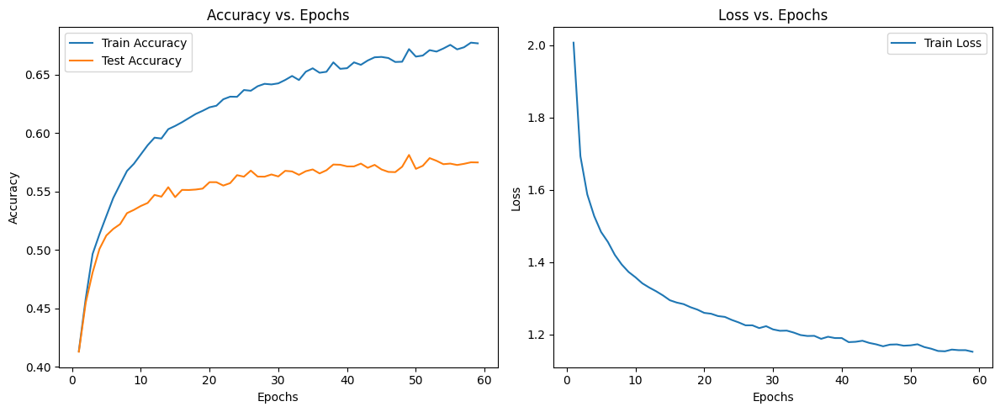

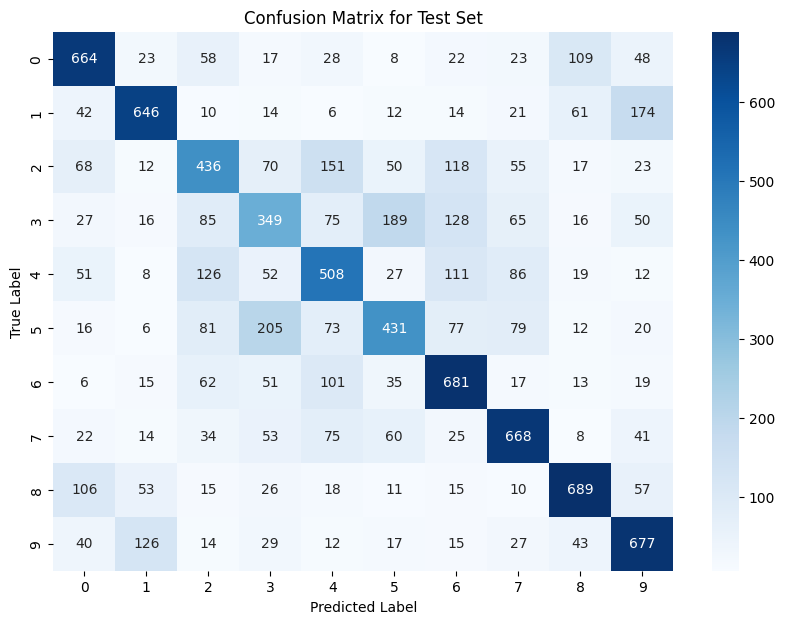

timecost:0.27365565299987793
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.64      0.66      0.65      1000
     Class 1       0.70      0.65      0.67      1000
     Class 2       0.47      0.44      0.45      1000
     Class 3       0.40      0.35      0.37      1000
     Class 4       0.49      0.51      0.50      1000
     Class 5       0.51      0.43      0.47      1000
     Class 6       0.56      0.68      0.62      1000
     Class 7       0.64      0.67      0.65      1000
     Class 8       0.70      0.69      0.69      1000
     Class 9       0.60      0.68      0.64      1000

    accuracy                           0.57     10000
   macro avg       0.57      0.57      0.57     10000
weighted avg       0.57      0.57      0.57     10000



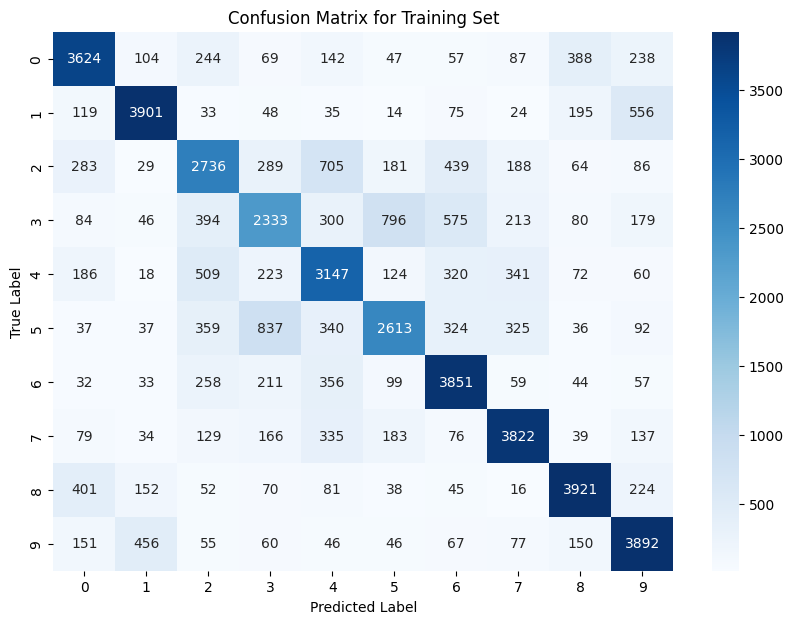

timecost:1.486769676208496
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.73      0.72      0.73      5000
     Class 1       0.81      0.78      0.80      5000
     Class 2       0.57      0.55      0.56      5000
     Class 3       0.54      0.47      0.50      5000
     Class 4       0.57      0.63      0.60      5000
     Class 5       0.63      0.52      0.57      5000
     Class 6       0.66      0.77      0.71      5000
     Class 7       0.74      0.76      0.75      5000
     Class 8       0.79      0.78      0.79      5000
     Class 9       0.70      0.78      0.74      5000

    accuracy                           0.68     50000
   macro avg       0.67      0.68      0.67     50000
weighted avg       0.67      0.68      0.67     50000

timecost:768.0652289390564
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (BatchNormLayer): 512 parameters
Layer 2 (GELULayer): No parameters or `param_count` method not imple

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.41362, Test Accuracy: 0.4138, Loss: 2.022320207270012
Epoch 2, Train Accuracy: 0.4565, Test Accuracy: 0.447, Loss: 1.715416282880877
Epoch 3, Train Accuracy: 0.48914, Test Accuracy: 0.4775, Loss: 1.6138074353629284
Epoch 4, Train Accuracy: 0.5088, Test Accuracy: 0.4924, Loss: 1.5484751387632394
Epoch 5, Train Accuracy: 0.52148, Test Accuracy: 0.5021, Loss: 1.5077869140741889
Epoch 6, Train Accuracy: 0.53846, Test Accuracy: 0.5061, Loss: 1.4719421358805989
Epoch 7, Train Accuracy: 0.55078, Test Accuracy: 0.5187, Loss: 1.4455666996261105
Epoch 8, Train Accuracy: 0.55822, Test Accuracy: 0.5255, Loss: 1.425925231543156
Epoch 9, Train Accuracy: 0.56316, Test Accuracy: 0.5253, Loss: 1.4019460425592563
Epoch 10, Train Accuracy: 0.5706, Test Accuracy: 0.528, Loss: 1.3936217864471678
Epoch 11, Train Accuracy: 0.57746, Test Accuracy: 0.538, Loss: 1.37665306604684
Epoch 12, Train Accuracy: 0.5814, Test Accuracy: 0.5376, Loss: 1.3669228400801656
Epoch 13, Train Accuracy:

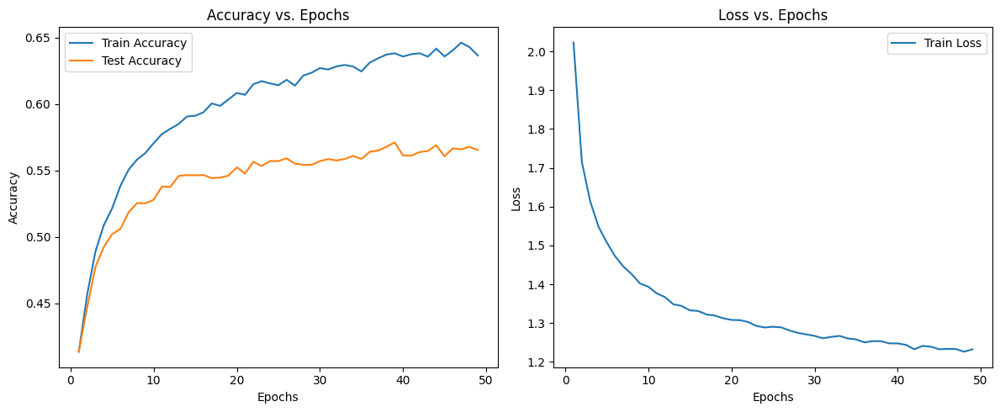

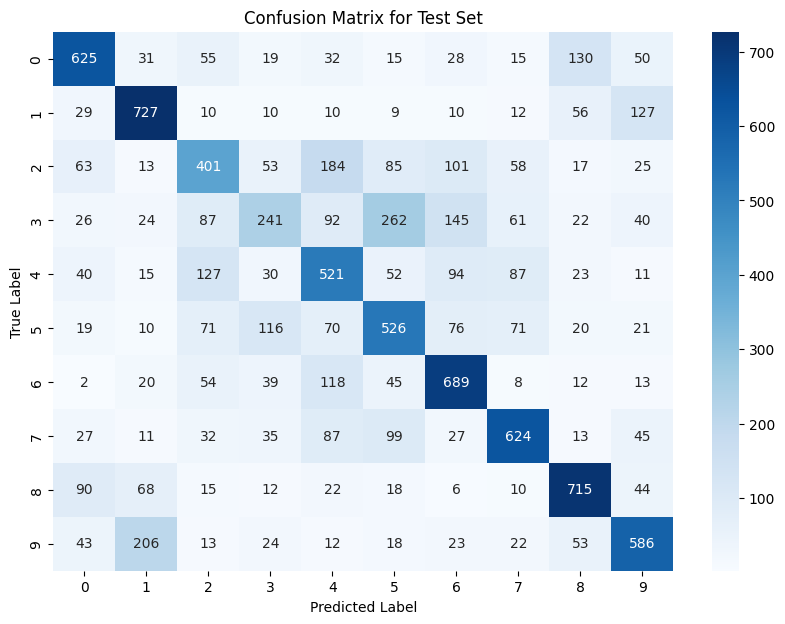

timecost:0.16192197799682617
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.65      0.62      0.64      1000
     Class 1       0.65      0.73      0.68      1000
     Class 2       0.46      0.40      0.43      1000
     Class 3       0.42      0.24      0.31      1000
     Class 4       0.45      0.52      0.49      1000
     Class 5       0.47      0.53      0.49      1000
     Class 6       0.57      0.69      0.63      1000
     Class 7       0.64      0.62      0.63      1000
     Class 8       0.67      0.71      0.69      1000
     Class 9       0.61      0.59      0.60      1000

    accuracy                           0.57     10000
   macro avg       0.56      0.57      0.56     10000
weighted avg       0.56      0.57      0.56     10000



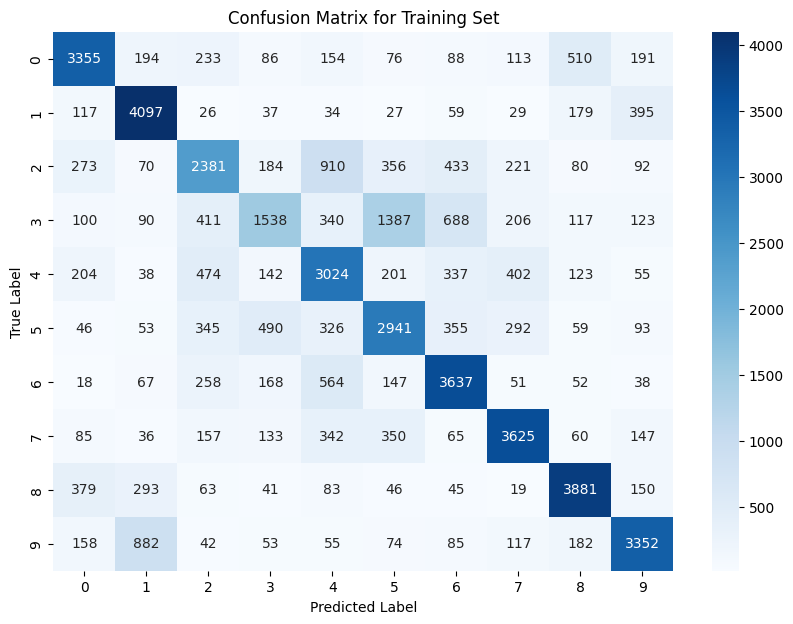

timecost:0.9995362758636475
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.71      0.67      0.69      5000
     Class 1       0.70      0.82      0.76      5000
     Class 2       0.54      0.48      0.51      5000
     Class 3       0.54      0.31      0.39      5000
     Class 4       0.52      0.60      0.56      5000
     Class 5       0.52      0.59      0.55      5000
     Class 6       0.63      0.73      0.67      5000
     Class 7       0.71      0.72      0.72      5000
     Class 8       0.74      0.78      0.76      5000
     Class 9       0.72      0.67      0.70      5000

    accuracy                           0.64     50000
   macro avg       0.63      0.64      0.63     50000
weighted avg       0.63      0.64      0.63     50000

timecost:534.3432509899139
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (BatchNormLayer): 512 parameters
Layer 2 (ReLULayer): No parameters or `param_count` method not impl

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.40246, Test Accuracy: 0.3984, Loss: 2.010486283665397
Epoch 2, Train Accuracy: 0.46116, Test Accuracy: 0.4559, Loss: 1.7141162823630391
Epoch 3, Train Accuracy: 0.49014, Test Accuracy: 0.4767, Loss: 1.6092945960699279
Epoch 4, Train Accuracy: 0.51126, Test Accuracy: 0.4927, Loss: 1.5441581926305903
Epoch 5, Train Accuracy: 0.5245, Test Accuracy: 0.5055, Loss: 1.5043450588211693
Epoch 6, Train Accuracy: 0.53792, Test Accuracy: 0.5107, Loss: 1.4753386071765404
Epoch 7, Train Accuracy: 0.55052, Test Accuracy: 0.5205, Loss: 1.4462345609776797
Epoch 8, Train Accuracy: 0.55812, Test Accuracy: 0.5311, Loss: 1.4252463409885396
Epoch 9, Train Accuracy: 0.56642, Test Accuracy: 0.53, Loss: 1.4069789203564864
Epoch 10, Train Accuracy: 0.57142, Test Accuracy: 0.5322, Loss: 1.3874795538599578
Epoch 11, Train Accuracy: 0.5755, Test Accuracy: 0.5367, Loss: 1.3734493595622346
Epoch 12, Train Accuracy: 0.58342, Test Accuracy: 0.5345, Loss: 1.366002452071728
Epoch 13, Train Acc

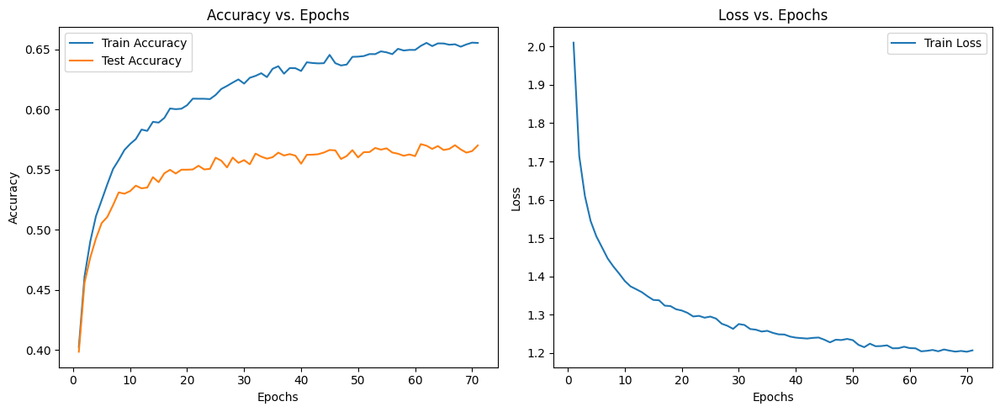

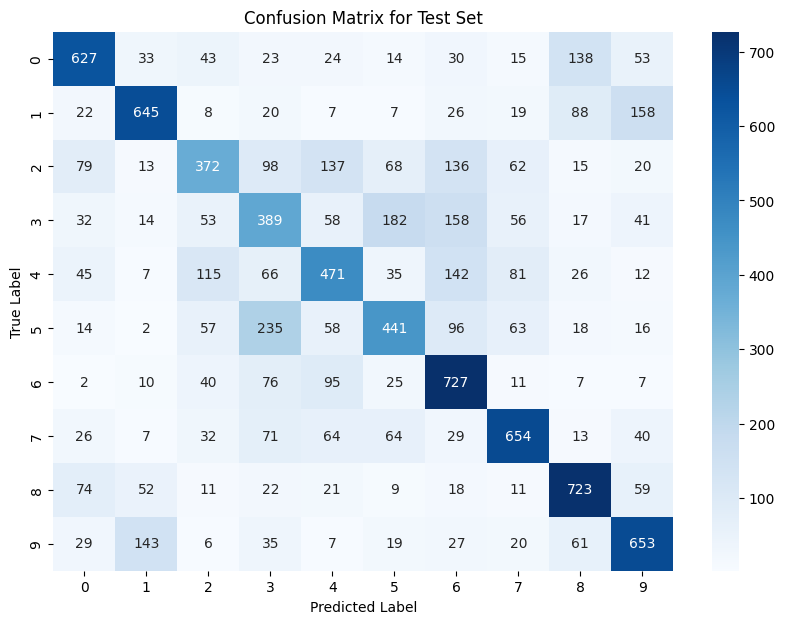

timecost:0.19569921493530273
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.66      0.63      0.64      1000
     Class 1       0.70      0.65      0.67      1000
     Class 2       0.50      0.37      0.43      1000
     Class 3       0.38      0.39      0.38      1000
     Class 4       0.50      0.47      0.49      1000
     Class 5       0.51      0.44      0.47      1000
     Class 6       0.52      0.73      0.61      1000
     Class 7       0.66      0.65      0.66      1000
     Class 8       0.65      0.72      0.69      1000
     Class 9       0.62      0.65      0.63      1000

    accuracy                           0.57     10000
   macro avg       0.57      0.57      0.57     10000
weighted avg       0.57      0.57      0.57     10000



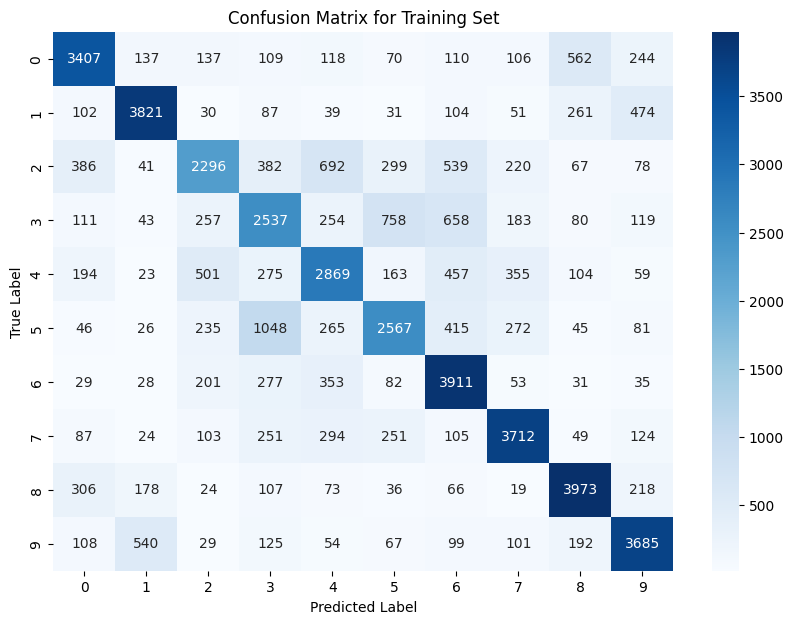

timecost:1.1446723937988281
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.71      0.68      0.70      5000
     Class 1       0.79      0.76      0.77      5000
     Class 2       0.60      0.46      0.52      5000
     Class 3       0.49      0.51      0.50      5000
     Class 4       0.57      0.57      0.57      5000
     Class 5       0.59      0.51      0.55      5000
     Class 6       0.61      0.78      0.68      5000
     Class 7       0.73      0.74      0.74      5000
     Class 8       0.74      0.79      0.77      5000
     Class 9       0.72      0.74      0.73      5000

    accuracy                           0.66     50000
   macro avg       0.66      0.66      0.65     50000
weighted avg       0.66      0.66      0.65     50000

timecost:824.0022325515747
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (BatchNormLayer): 512 parameters
Layer 2 (LeakyReLULayer): No parameters or `param_count` method not

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.40408, Test Accuracy: 0.4051, Loss: 2.0115388174810866
Epoch 2, Train Accuracy: 0.4503, Test Accuracy: 0.4399, Loss: 1.6980723121715056
Epoch 3, Train Accuracy: 0.4847, Test Accuracy: 0.4649, Loss: 1.5851890523937862
Epoch 4, Train Accuracy: 0.51036, Test Accuracy: 0.4905, Loss: 1.5224592532869266
Epoch 5, Train Accuracy: 0.52342, Test Accuracy: 0.5023, Loss: 1.4778876362133826
Epoch 6, Train Accuracy: 0.54554, Test Accuracy: 0.5128, Loss: 1.4373783793288004
Epoch 7, Train Accuracy: 0.55452, Test Accuracy: 0.5199, Loss: 1.4081704836479663
Epoch 8, Train Accuracy: 0.5645, Test Accuracy: 0.526, Loss: 1.3824731070547875
Epoch 9, Train Accuracy: 0.56934, Test Accuracy: 0.5282, Loss: 1.3649068377370024
Epoch 10, Train Accuracy: 0.5786, Test Accuracy: 0.5314, Loss: 1.3525186252976324
Epoch 11, Train Accuracy: 0.58478, Test Accuracy: 0.5371, Loss: 1.3406892752910489
Epoch 12, Train Accuracy: 0.5863, Test Accuracy: 0.5363, Loss: 1.3245915891644613
Epoch 13, Train Acc

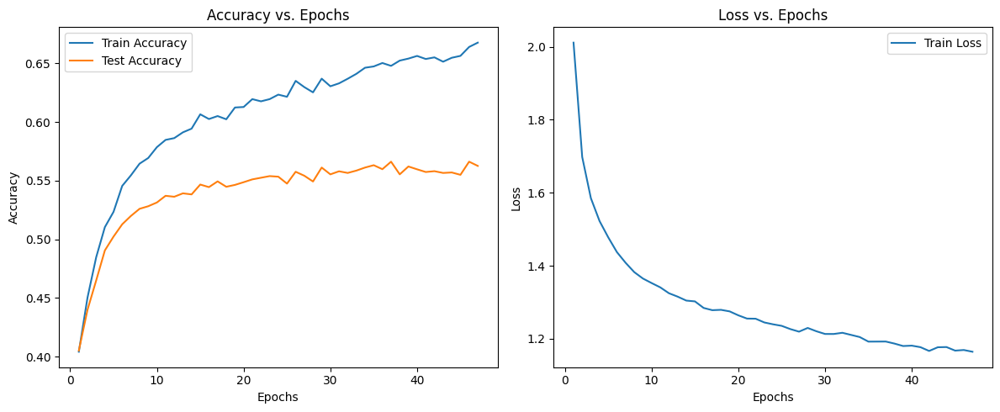

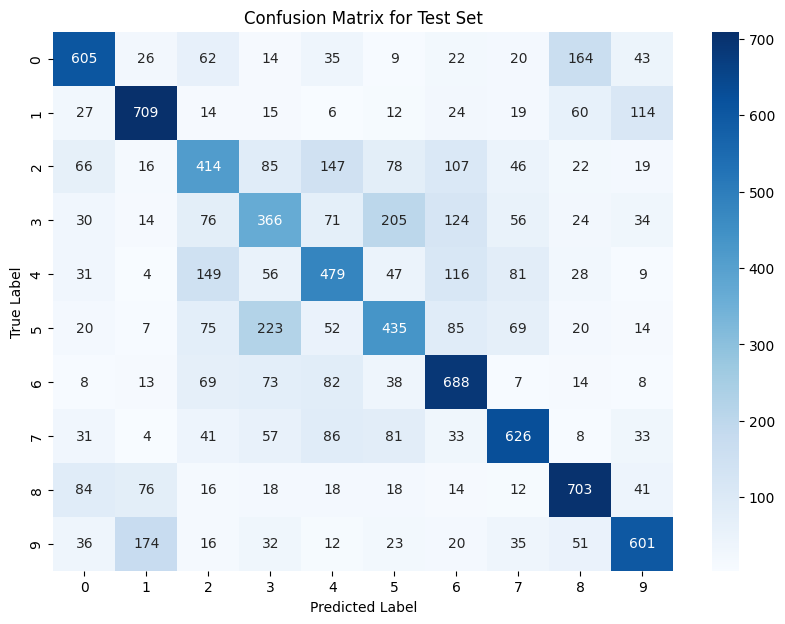

timecost:0.20161223411560059
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.64      0.60      0.62      1000
     Class 1       0.68      0.71      0.69      1000
     Class 2       0.44      0.41      0.43      1000
     Class 3       0.39      0.37      0.38      1000
     Class 4       0.48      0.48      0.48      1000
     Class 5       0.46      0.43      0.45      1000
     Class 6       0.56      0.69      0.62      1000
     Class 7       0.64      0.63      0.64      1000
     Class 8       0.64      0.70      0.67      1000
     Class 9       0.66      0.60      0.63      1000

    accuracy                           0.56     10000
   macro avg       0.56      0.56      0.56     10000
weighted avg       0.56      0.56      0.56     10000



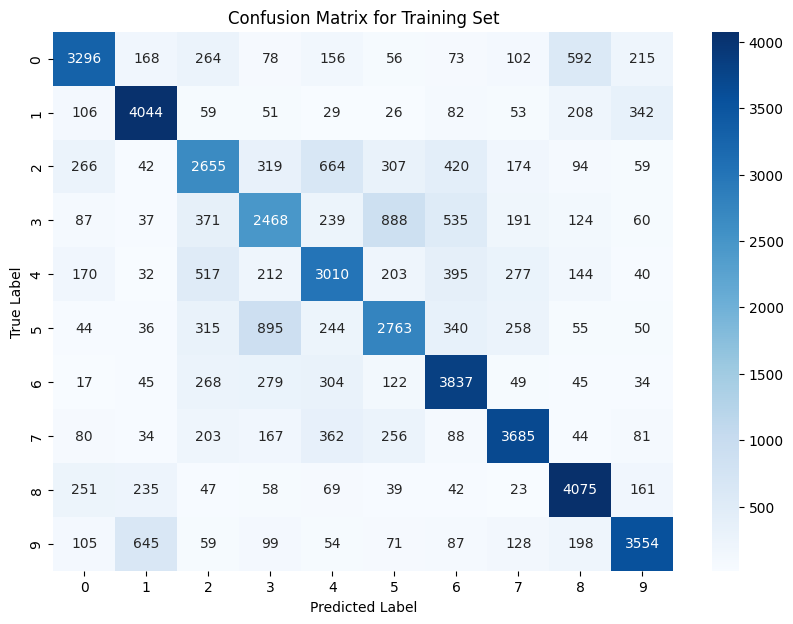

timecost:1.1300513744354248
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.75      0.66      0.70      5000
     Class 1       0.76      0.81      0.78      5000
     Class 2       0.56      0.53      0.54      5000
     Class 3       0.53      0.49      0.51      5000
     Class 4       0.59      0.60      0.59      5000
     Class 5       0.58      0.55      0.57      5000
     Class 6       0.65      0.77      0.70      5000
     Class 7       0.75      0.74      0.74      5000
     Class 8       0.73      0.81      0.77      5000
     Class 9       0.77      0.71      0.74      5000

    accuracy                           0.67     50000
   macro avg       0.67      0.67      0.67     50000
weighted avg       0.67      0.67      0.67     50000

timecost:521.4541254043579
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (BatchNormLayer): 512 parameters
Layer 2 (TanhLayer): No parameters or `param_count` method not impl

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.3259, Test Accuracy: 0.3218, Loss: 2.1944491045882257
Epoch 2, Train Accuracy: 0.35482, Test Accuracy: 0.3562, Loss: 1.951520549683141
Epoch 3, Train Accuracy: 0.36434, Test Accuracy: 0.3596, Loss: 1.8831737967310547
Epoch 4, Train Accuracy: 0.39242, Test Accuracy: 0.3919, Loss: 1.8350416542703623
Epoch 5, Train Accuracy: 0.40854, Test Accuracy: 0.4113, Loss: 1.793415700027897
Epoch 6, Train Accuracy: 0.41322, Test Accuracy: 0.4121, Loss: 1.7602407962256543
Epoch 7, Train Accuracy: 0.41746, Test Accuracy: 0.4158, Loss: 1.7306045978976814
Epoch 8, Train Accuracy: 0.43842, Test Accuracy: 0.4333, Loss: 1.706671591881127
Epoch 9, Train Accuracy: 0.45346, Test Accuracy: 0.4494, Loss: 1.6861175865388776
Epoch 10, Train Accuracy: 0.4592, Test Accuracy: 0.4591, Loss: 1.6704359160314142
Epoch 11, Train Accuracy: 0.4578, Test Accuracy: 0.4518, Loss: 1.6402741690828415
Epoch 12, Train Accuracy: 0.46692, Test Accuracy: 0.4621, Loss: 1.631878160053018
Epoch 13, Train Accu

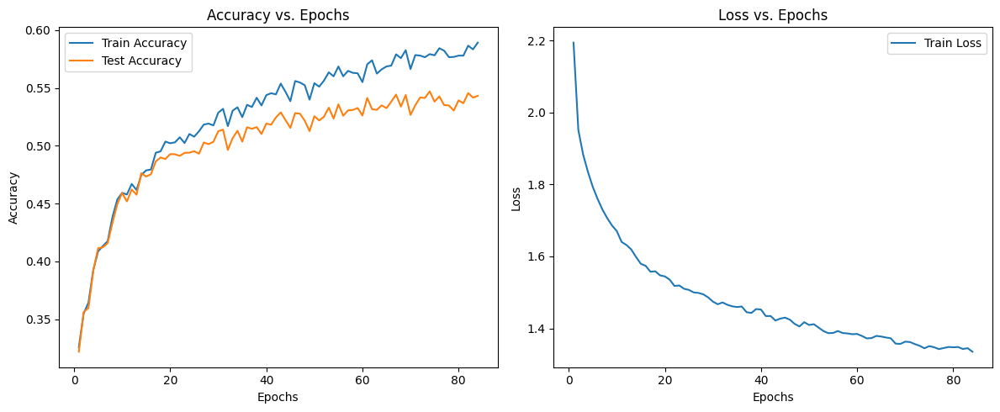

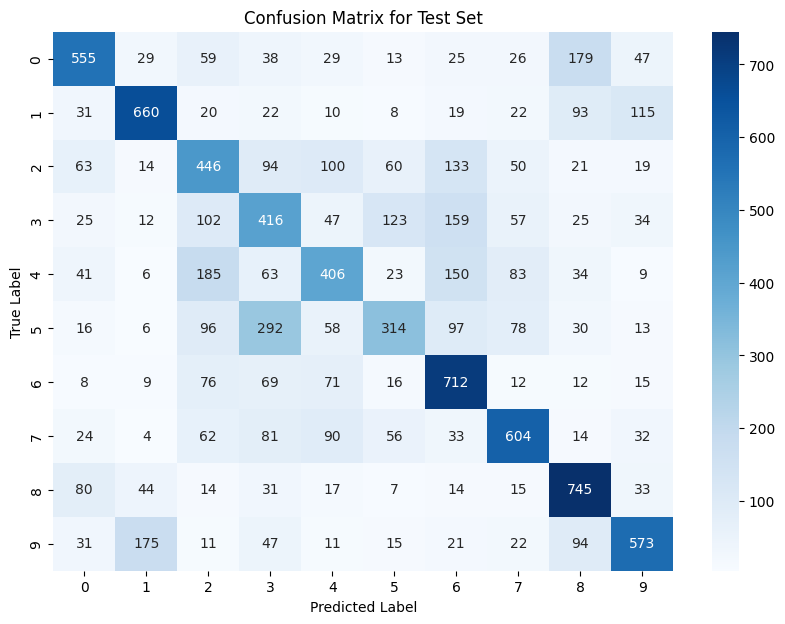

timecost:0.20023679733276367
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.64      0.56      0.59      1000
     Class 1       0.69      0.66      0.67      1000
     Class 2       0.42      0.45      0.43      1000
     Class 3       0.36      0.42      0.39      1000
     Class 4       0.48      0.41      0.44      1000
     Class 5       0.49      0.31      0.38      1000
     Class 6       0.52      0.71      0.60      1000
     Class 7       0.62      0.60      0.61      1000
     Class 8       0.60      0.74      0.66      1000
     Class 9       0.64      0.57      0.61      1000

    accuracy                           0.54     10000
   macro avg       0.55      0.54      0.54     10000
weighted avg       0.55      0.54      0.54     10000



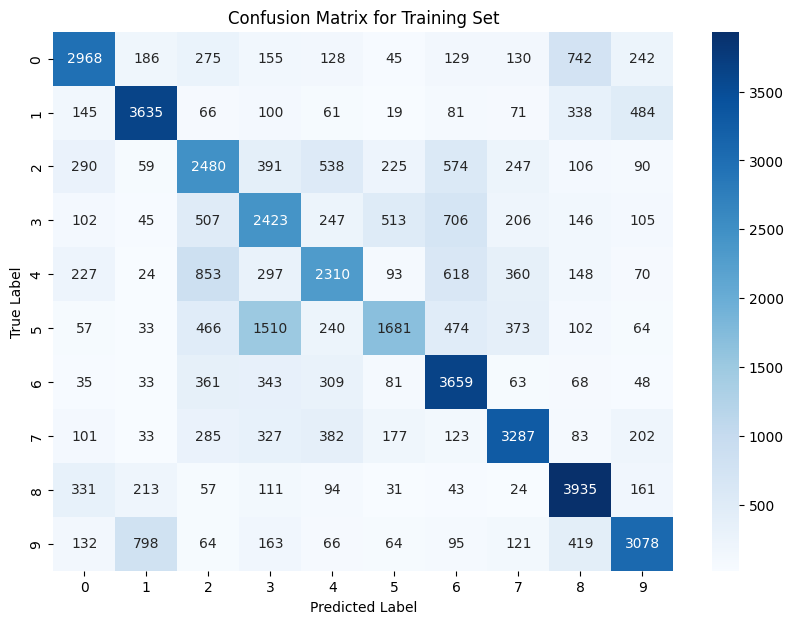

timecost:1.1970508098602295
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.68      0.59      0.63      5000
     Class 1       0.72      0.73      0.72      5000
     Class 2       0.46      0.50      0.48      5000
     Class 3       0.42      0.48      0.45      5000
     Class 4       0.53      0.46      0.49      5000
     Class 5       0.57      0.34      0.42      5000
     Class 6       0.56      0.73      0.64      5000
     Class 7       0.67      0.66      0.67      5000
     Class 8       0.65      0.79      0.71      5000
     Class 9       0.68      0.62      0.65      5000

    accuracy                           0.59     50000
   macro avg       0.59      0.59      0.59     50000
weighted avg       0.59      0.59      0.59     50000

timecost:922.5741541385651
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (BatchNormLayer): 512 parameters
Layer 2 (SigmoidLayer): No parameters or `param_count` method not i

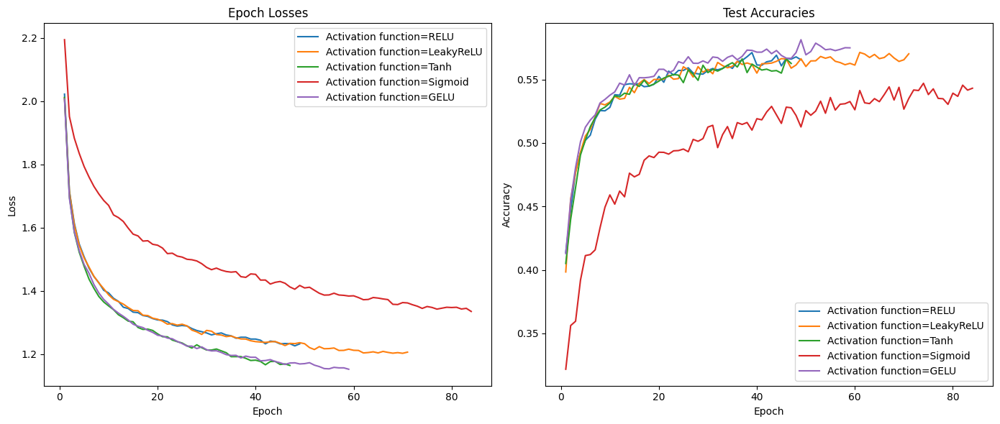

In [ ]:
model = MLP()
model.add(HiddenLayer(128, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(ResidualBlock(256, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
trainings_GELU = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_GELU.mini_batch_train()
print("train_accuracies:",trainings_GELU.train_accuracies)
print("test_accuracies:",trainings_GELU.test_accuracies)
print("epoch_losses:",trainings_GELU.epoch_losses)
print("params_count:",trainings_GELU.params_count)
print("train_timecost:",trainings_GELU.train_timecost)
print("test_timecost:",trainings_GELU.test_timecost)
print("train_report:",trainings_GELU.train_report)
print("test_report:",trainings_GELU.test_report)

model = MLP()
model.add(HiddenLayer(128, 256))
model.add(BatchNormLayer(256))
model.add(ReLULayer())
model.add(DropoutLayer(0.2))
model.add(ResidualBlock(256, 256))
model.add(BatchNormLayer(256))
model.add(ReLULayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
trainings_RELU = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_RELU.mini_batch_train()
print("train_accuracies:",trainings_RELU.train_accuracies)
print("test_accuracies:",trainings_RELU.test_accuracies)
print("epoch_losses:",trainings_RELU.epoch_losses)
print("params_count:",trainings_RELU.params_count)
print("train_timecost:",trainings_RELU.train_timecost)
print("test_timecost:",trainings_RELU.test_timecost)
print("train_report:",trainings_RELU.train_report)
print("test_report:",trainings_RELU.test_report)

model = MLP()
model.add(HiddenLayer(128, 256))
model.add(BatchNormLayer(256))
model.add(LeakyReLULayer())
model.add(DropoutLayer(0.2))
model.add(ResidualBlock(256, 256))
model.add(BatchNormLayer(256))
model.add(LeakyReLULayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
trainings_LeakyReLU = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_LeakyReLU.mini_batch_train()
print("train_accuracies:",trainings_LeakyReLU.train_accuracies)
print("test_accuracies:",trainings_LeakyReLU.test_accuracies)
print("epoch_losses:",trainings_LeakyReLU.epoch_losses)
print("params_count:",trainings_LeakyReLU.params_count)
print("train_timecost:",trainings_LeakyReLU.train_timecost)
print("test_timecost:",trainings_LeakyReLU.test_timecost)
print("train_report:",trainings_LeakyReLU.train_report)
print("test_report:",trainings_LeakyReLU.test_report)

model = MLP()
model.add(HiddenLayer(128, 256))
model.add(BatchNormLayer(256))
model.add(TanhLayer())
model.add(DropoutLayer(0.2))
model.add(ResidualBlock(256, 256))
model.add(BatchNormLayer(256))
model.add(TanhLayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
trainings_Tanh = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_Tanh.mini_batch_train()
print("train_accuracies:",trainings_Tanh.train_accuracies)
print("test_accuracies:",trainings_Tanh.test_accuracies)
print("epoch_losses:",trainings_Tanh.epoch_losses)
print("params_count:",trainings_Tanh.params_count)
print("train_timecost:",trainings_Tanh.train_timecost)
print("test_timecost:",trainings_Tanh.test_timecost)
print("train_report:",trainings_Tanh.train_report)
print("test_report:",trainings_Tanh.test_report)

model = MLP()
model.add(HiddenLayer(128, 256))
model.add(BatchNormLayer(256))
model.add(SigmoidLayer())
model.add(DropoutLayer(0.2))
model.add(ResidualBlock(256, 256))
model.add(BatchNormLayer(256))
model.add(SigmoidLayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
trainings_Sigmoid = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_Sigmoid.mini_batch_train()
print("train_accuracies:",trainings_Sigmoid.train_accuracies)
print("test_accuracies:",trainings_Sigmoid.test_accuracies)
print("epoch_losses:",trainings_Sigmoid.epoch_losses)
print("params_count:",trainings_Sigmoid.params_count)
print("train_timecost:",trainings_Sigmoid.train_timecost)
print("test_timecost:",trainings_Sigmoid.test_timecost)
print("train_report:",trainings_Sigmoid.train_report)
print("test_report:",trainings_Sigmoid.test_report)

epoch_losses = {
    "RELU": trainings_RELU.epoch_losses,
    "LeakyReLU": trainings_LeakyReLU.epoch_losses,
    "Tanh": trainings_Tanh.epoch_losses,
    "Sigmoid": trainings_Sigmoid.epoch_losses,
    "GELU": trainings_GELU.epoch_losses,
}
test_accuracies = {
    "RELU": trainings_RELU.test_accuracies,
    "LeakyReLU": trainings_LeakyReLU.test_accuracies,
    "Tanh": trainings_Tanh.test_accuracies,
    "Sigmoid": trainings_Sigmoid.test_accuracies,
    "GELU": trainings_GELU.test_accuracies
}
plot_training_results(epoch_losses, test_accuracies, 'Activation function')


# Best Model

<ipython-input-5-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.41466, Test Accuracy: 0.4111, Loss: 1.9969037789889437
Epoch 2, Train Accuracy: 0.45756, Test Accuracy: 0.4594, Loss: 1.6940004222527034
Epoch 3, Train Accuracy: 0.48994, Test Accuracy: 0.4793, Loss: 1.5851393316138107
Epoch 4, Train Accuracy: 0.51614, Test Accuracy: 0.4991, Loss: 1.5231552790844698
Epoch 5, Train Accuracy: 0.5307, Test Accuracy: 0.5123, Loss: 1.4803156241742974
Epoch 6, Train Accuracy: 0.54188, Test Accuracy: 0.5145, Loss: 1.4509200332301582
Epoch 7, Train Accuracy: 0.55284, Test Accuracy: 0.522, Loss: 1.4148084647613342
Epoch 8, Train Accuracy: 0.56566, Test Accuracy: 0.5292, Loss: 1.391823355190817
Epoch 9, Train Accuracy: 0.57158, Test Accuracy: 0.5337, Loss: 1.379260125180092
Epoch 10, Train Accuracy: 0.57536, Test Accuracy: 0.5344, Loss: 1.3636649268095227
Epoch 11, Train Accuracy: 0.58556, Test Accuracy: 0.5381, Loss: 1.34754070016515
Epoch 12, Train Accuracy: 0.59188, Test Accuracy: 0.5441, Loss: 1.3354965423410454
Epoch 13, Train Acc

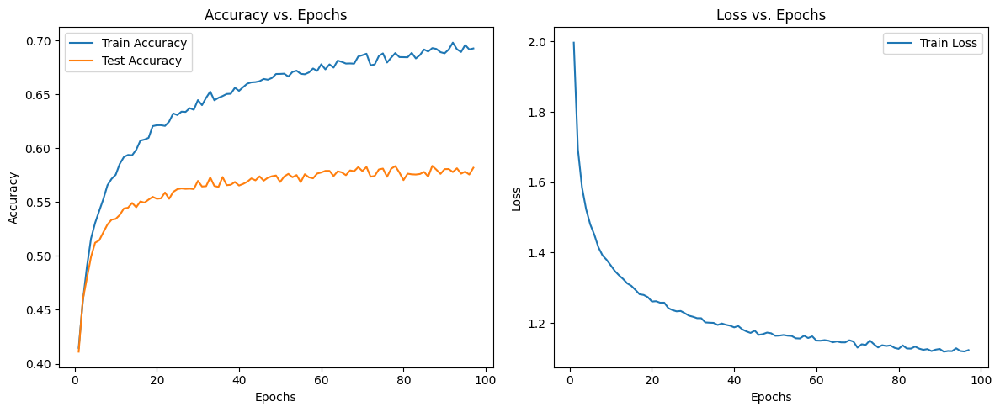

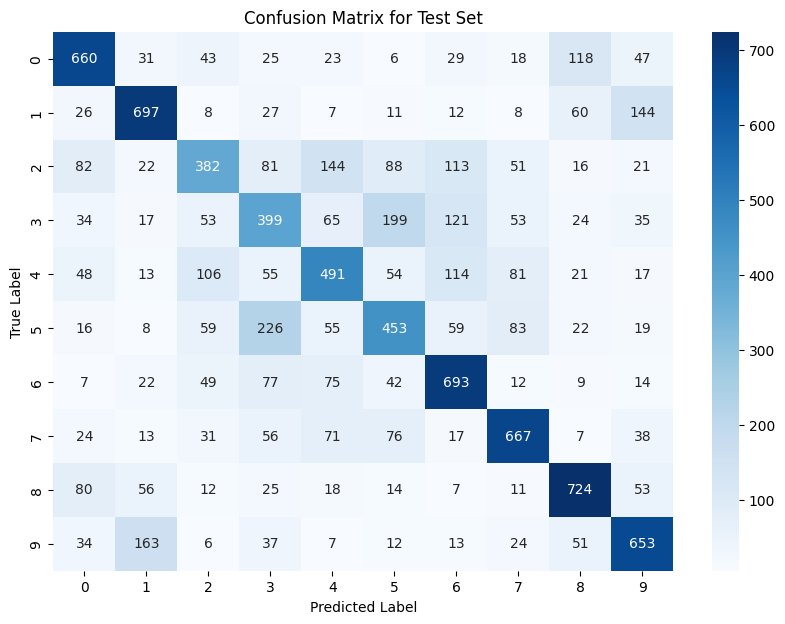

timecost:0.280397891998291
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.65      0.66      0.66      1000
     Class 1       0.67      0.70      0.68      1000
     Class 2       0.51      0.38      0.44      1000
     Class 3       0.40      0.40      0.40      1000
     Class 4       0.51      0.49      0.50      1000
     Class 5       0.47      0.45      0.46      1000
     Class 6       0.59      0.69      0.64      1000
     Class 7       0.66      0.67      0.66      1000
     Class 8       0.69      0.72      0.71      1000
     Class 9       0.63      0.65      0.64      1000

    accuracy                           0.58     10000
   macro avg       0.58      0.58      0.58     10000
weighted avg       0.58      0.58      0.58     10000



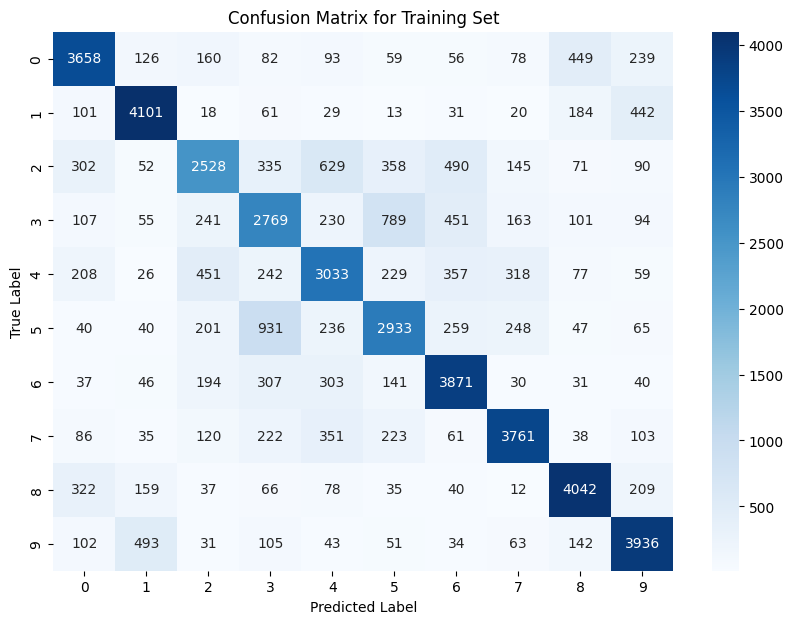

timecost:1.4949722290039062
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.74      0.73      0.73      5000
     Class 1       0.80      0.82      0.81      5000
     Class 2       0.64      0.51      0.56      5000
     Class 3       0.54      0.55      0.55      5000
     Class 4       0.60      0.61      0.61      5000
     Class 5       0.61      0.59      0.60      5000
     Class 6       0.69      0.77      0.73      5000
     Class 7       0.78      0.75      0.76      5000
     Class 8       0.78      0.81      0.79      5000
     Class 9       0.75      0.79      0.77      5000

    accuracy                           0.69     50000
   macro avg       0.69      0.69      0.69     50000
weighted avg       0.69      0.69      0.69     50000

timecost:1268.9979741573334
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (BatchNormLayer): 512 parameters
Layer 2 (GELULayer): No parameters or `param_count` method not imp

In [ ]:
model = MLP()
model.add(HiddenLayer(128, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(ResidualBlock(256, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
trainings_best = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_best.mini_batch_train()
trainings_best.model.save_model('model.h5')
trainings_best.model.load_model('model.h5')
print("train_accuracies:",trainings_best.train_accuracies)
print("test_accuracies:",trainings_best.test_accuracies)
print("epoch_losses:",trainings_best.epoch_losses)
print("params_count:",trainings_best.params_count)
print("train_timecost:",trainings_best.train_timecost)
print("test_timecost:",trainings_best.test_timecost)
print("train_report:",trainings_best.train_report)
print("test_report:",trainings_best.test_report)

# Expanded Comparative Experiments

## CNN

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.35994, Test Accuracy: 0.353, Loss: 2.1827124032294307
Epoch 2, Train Accuracy: 0.4043, Test Accuracy: 0.3925, Loss: 1.8642911521601282
Epoch 3, Train Accuracy: 0.44814, Test Accuracy: 0.4282, Loss: 1.7716148967648961
Epoch 4, Train Accuracy: 0.45828, Test Accuracy: 0.4374, Loss: 1.7176451588262938
Epoch 5, Train Accuracy: 0.4864, Test Accuracy: 0.4574, Loss: 1.6686212890777272
Epoch 6, Train Accuracy: 0.5076, Test Accuracy: 0.4696, Loss: 1.6376784209575088
Epoch 7, Train Accuracy: 0.51858, Test Accuracy: 0.4856, Loss: 1.6066577817558283
Epoch 8, Train Accuracy: 0.52126, Test Accuracy: 0.4893, Loss: 1.5980499989701182
Epoch 9, Train Accuracy: 0.50862, Test Accuracy: 0.4696, Loss: 1.5664059730189517
Epoch 10, Train Accuracy: 0.5453, Test Accuracy: 0.5008, Loss: 1.558167845532285
Epoch 11, Train Accuracy: 0.55924, Test Accuracy: 0.5067, Loss: 1.5268872067569121
Epoch 12, Train Accuracy: 0.49198, Test Accuracy: 0.4617, Loss: 1.5063632030206446
Epoch 13, Train Acc

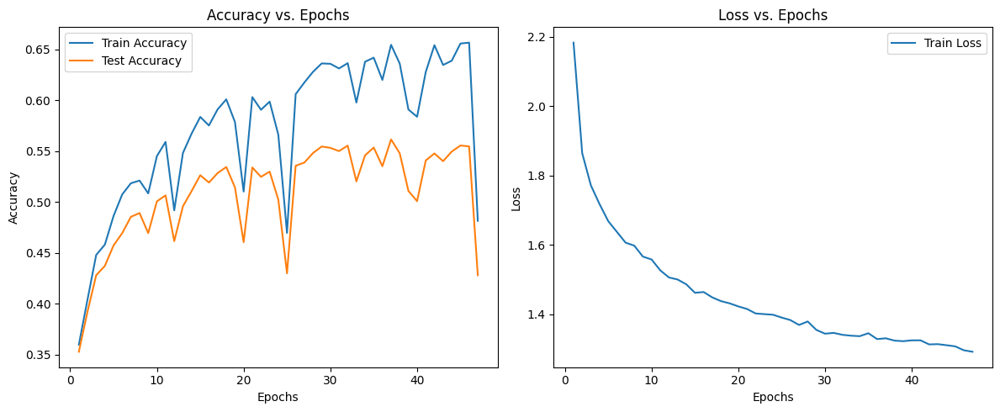

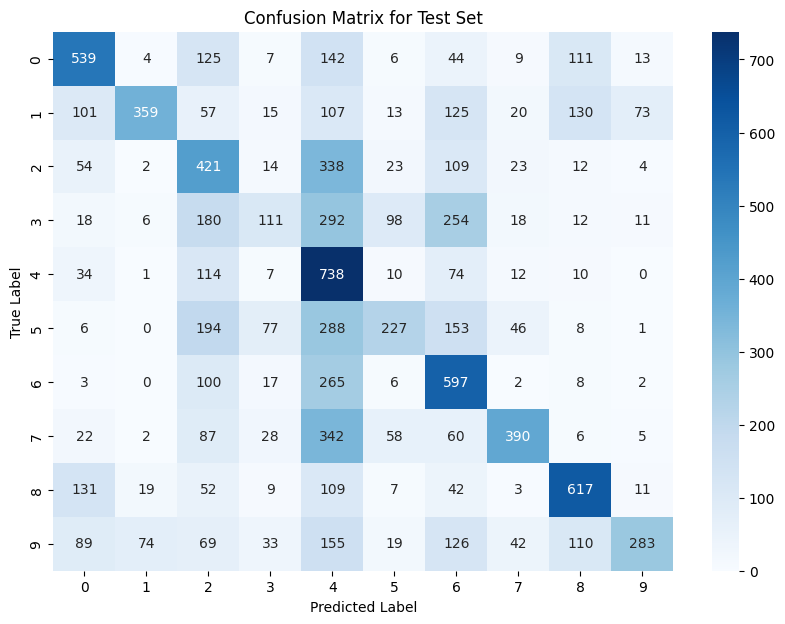

timecost:13.485788345336914
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.54      0.54      0.54      1000
     Class 1       0.77      0.36      0.49      1000
     Class 2       0.30      0.42      0.35      1000
     Class 3       0.35      0.11      0.17      1000
     Class 4       0.27      0.74      0.39      1000
     Class 5       0.49      0.23      0.31      1000
     Class 6       0.38      0.60      0.46      1000
     Class 7       0.69      0.39      0.50      1000
     Class 8       0.60      0.62      0.61      1000
     Class 9       0.70      0.28      0.40      1000

    accuracy                           0.43     10000
   macro avg       0.51      0.43      0.42     10000
weighted avg       0.51      0.43      0.42     10000



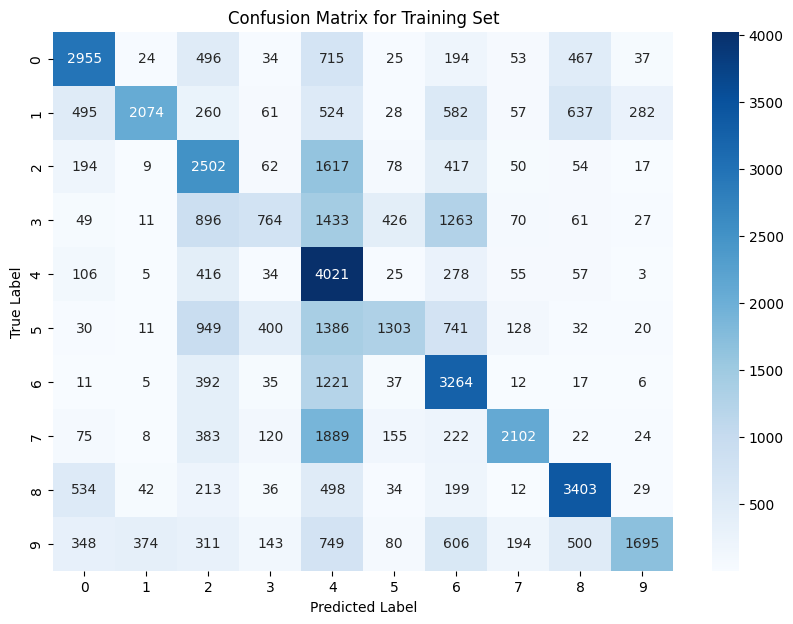

timecost:67.40383172035217
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.62      0.59      0.60      5000
     Class 1       0.81      0.41      0.55      5000
     Class 2       0.37      0.50      0.42      5000
     Class 3       0.45      0.15      0.23      5000
     Class 4       0.29      0.80      0.42      5000
     Class 5       0.59      0.26      0.36      5000
     Class 6       0.42      0.65      0.51      5000
     Class 7       0.77      0.42      0.54      5000
     Class 8       0.65      0.68      0.66      5000
     Class 9       0.79      0.34      0.47      5000

    accuracy                           0.48     50000
   macro avg       0.58      0.48      0.48     50000
weighted avg       0.58      0.48      0.48     50000

timecost:14823.4482588768
Layer 0 (Conv1D): 6 parameters
Layer 1 (BatchNormLayer): 512 parameters
Layer 2 (GELULayer): No parameters or `param_count` method not implemented.
La

In [ ]:
class Conv1D:
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1, flatten=True):
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding
        self.flatten = flatten
        # init parameter
        self.kernels = np.random.randn(out_channels, in_channels, kernel_size) / (in_channels * kernel_size)
        self.v = np.zeros_like(self.kernels)

    def forward(self, input):
        # check the dim of input
        self.was_input_dim_expanded = input.ndim == 2 and self.in_channels == 1
        # expanded the dim when input is 2 dim and was_input_dim_expanded is ture
        if self.was_input_dim_expanded:
            input = input[:, np.newaxis, :]

        self.input_shape = input.shape
        batch_size, in_channels, input_length = input.shape
        assert in_channels == self.in_channels, "Input channels mismatch."

        self.input_padded = np.pad(input, ((0, 0), (0, 0), (self.padding, self.padding)), 'constant', constant_values=0)

        output_length = (input_length + 2 * self.padding - self.kernel_size) // self.stride + 1
        self.output = np.zeros((batch_size, self.out_channels, output_length))
        # Compute the convolution
        for b in range(batch_size):
            for f in range(self.out_channels):
                for i in range(output_length):
                    start_index = i * self.stride
                    end_index = start_index + self.kernel_size
                    self.output[b, f, i] = np.sum(
                        self.input_padded[b, :, start_index:end_index] * self.kernels[f, :, :], axis=(0, 1))
        # Flatten the output if next layer is linear
        if self.flatten:

            self.output_shape_before_flatten = self.output.shape
            self.output = self.output.reshape(batch_size, -1)
        # Squeeze the output dimension if the input dimension was expanded and out_channels is 1
        elif self.was_input_dim_expanded and self.out_channels == 1:

            self.output = self.output.squeeze(axis=1)

        return self.output

    def backward(self, dout):
        # Reshape the output if next layer is linear
        if self.flatten:
            dout = dout.reshape(self.output_shape_before_flatten)
        elif self.was_input_dim_expanded and self.out_channels == 1:

            dout = dout[:, np.newaxis, :]

        batch_size, out_channels, output_length = dout.shape
        dinput_padded = np.zeros_like(self.input_padded)
        dkernels = np.zeros_like(self.kernels)
        # Perform the backward pass
        for b in range(batch_size):
            for f in range(out_channels):
                for i in range(output_length):
                    start_index = i * self.stride
                    end_index = start_index + self.kernel_size
                    dkernels[f, :, :] += dout[b, f, i] * self.input_padded[b, :, start_index:end_index]
                    dinput_padded[b, :, start_index:end_index] += dout[b, f, i] * self.kernels[f, :, :]
        # Handle padding
        if self.padding > 0:
            dinput = dinput_padded[:, :, self.padding:-self.padding]
        else:
            dinput = dinput_padded

        # if self.was_input_dim_expanded and self.out_channels == 1:
        if self.was_input_dim_expanded:
            dinput = dinput.squeeze(axis=1)

        self.dkernel = dkernels
        return dinput

    def update(self, learning_rate=0.01, momentum=0.9, weight_decay=0.01):
        self.lr = learning_rate
        self.momentum = momentum
        self.v = self.momentum * self.v + self.lr * (self.dkernel + weight_decay * self.kernels)
        self.kernels -= self.v

    def params_count(self):
        return self.kernels.size

    def get_params(self):
        return self.kernels

    def set_params(self, params):
        self.kernels = params


###CNN
model = MLP()
model.add(Conv1D(1,2))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(ResidualBlock(256, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
trainings_CNN = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=50,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_CNN.mini_batch_train()


In [ ]:
print("train_accuracies:",trainings_CNN.train_accuracies)
print("test_accuracies:",trainings_CNN.test_accuracies)
print("epoch_losses:",trainings_CNN.epoch_losses)
print("params_count:",trainings_CNN.params_count)
print("train_timecost:",trainings_CNN.train_timecost)
print("test_timecost:",trainings_CNN.test_timecost)
print("train_report:",trainings_CNN.train_report)
print("test_report:",trainings_CNN.test_report)

train_accuracies: [0.35994, 0.4043, 0.44814, 0.45828, 0.4864, 0.5076, 0.51858, 0.52126, 0.50862, 0.5453, 0.55924, 0.49198, 0.5483, 0.56738, 0.58378, 0.57538, 0.5912, 0.60108, 0.57876, 0.51044, 0.6033, 0.59082, 0.5988, 0.5663, 0.46982, 0.60618, 0.6176, 0.6281, 0.63636, 0.63602, 0.63144, 0.63664, 0.5979, 0.63802, 0.64204, 0.62016, 0.65468, 0.63618, 0.59106, 0.58396, 0.62794, 0.6543, 0.63486, 0.63908, 0.65594, 0.6568, 0.48166]
test_accuracies: [0.353, 0.3925, 0.4282, 0.4374, 0.4574, 0.4696, 0.4856, 0.4893, 0.4696, 0.5008, 0.5067, 0.4617, 0.4959, 0.5109, 0.5265, 0.5193, 0.5286, 0.5346, 0.5145, 0.4607, 0.5341, 0.5249, 0.53, 0.5025, 0.4301, 0.5358, 0.5389, 0.5483, 0.5547, 0.5534, 0.5502, 0.5556, 0.5204, 0.546, 0.5537, 0.5353, 0.5617, 0.548, 0.5111, 0.501, 0.541, 0.5479, 0.5403, 0.5498, 0.5557, 0.5548, 0.4282]
epoch_losses: [2.1827124032294307, 1.8642911521601282, 1.7716148967648961, 1.7176451588262938, 1.6686212890777272, 1.6376784209575088, 1.6066577817558283, 1.5980499989701182, 1.56640597

## RNN

<ipython-input-41-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.30878, Test Accuracy: 0.3087, Loss: 2.1065721403523816
Epoch 2, Train Accuracy: 0.33188, Test Accuracy: 0.3338, Loss: 1.964096674715294
Epoch 3, Train Accuracy: 0.33144, Test Accuracy: 0.331, Loss: 1.9242447014242083
Epoch 4, Train Accuracy: 0.34036, Test Accuracy: 0.3454, Loss: 1.9057411012754666
Epoch 5, Train Accuracy: 0.3213, Test Accuracy: 0.3255, Loss: 1.9041589869927864
Epoch 6, Train Accuracy: 0.33638, Test Accuracy: 0.3456, Loss: 1.904773266305136
Epoch 7, Train Accuracy: 0.35122, Test Accuracy: 0.3539, Loss: 1.8832312885964226
Epoch 8, Train Accuracy: 0.33752, Test Accuracy: 0.3434, Loss: 1.8740821934186163
Epoch 9, Train Accuracy: 0.35606, Test Accuracy: 0.3546, Loss: 1.8653274673517821
Epoch 10, Train Accuracy: 0.34824, Test Accuracy: 0.3495, Loss: 1.8549605790755643
Epoch 11, Train Accuracy: 0.35282, Test Accuracy: 0.3551, Loss: 1.849741483411889
Epoch 12, Train Accuracy: 0.36442, Test Accuracy: 0.3671, Loss: 1.834204703511147
Epoch 13, Train Acc

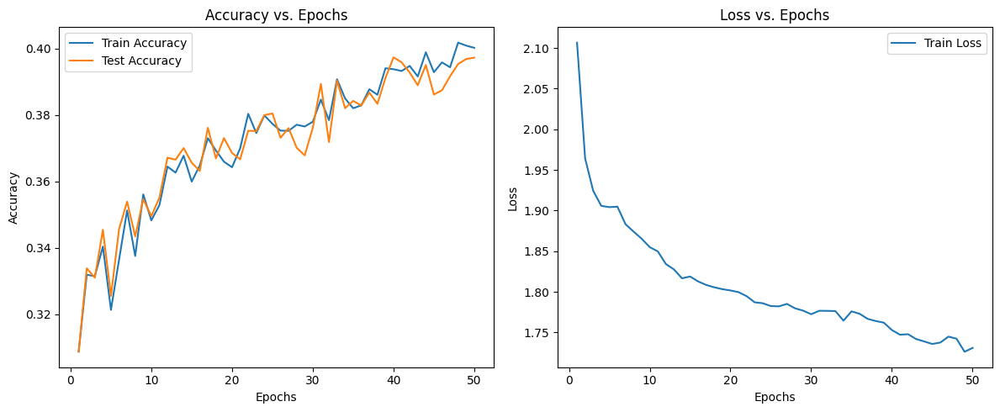

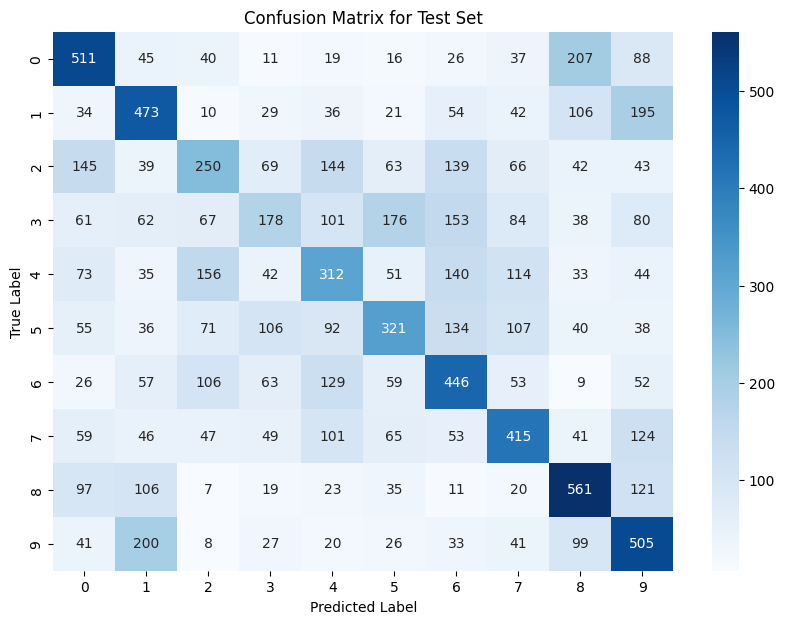

timecost:0.2788987159729004
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.46      0.51      0.49      1000
     Class 1       0.43      0.47      0.45      1000
     Class 2       0.33      0.25      0.28      1000
     Class 3       0.30      0.18      0.22      1000
     Class 4       0.32      0.31      0.32      1000
     Class 5       0.39      0.32      0.35      1000
     Class 6       0.38      0.45      0.41      1000
     Class 7       0.42      0.41      0.42      1000
     Class 8       0.48      0.56      0.52      1000
     Class 9       0.39      0.51      0.44      1000

    accuracy                           0.40     10000
   macro avg       0.39      0.40      0.39     10000
weighted avg       0.39      0.40      0.39     10000



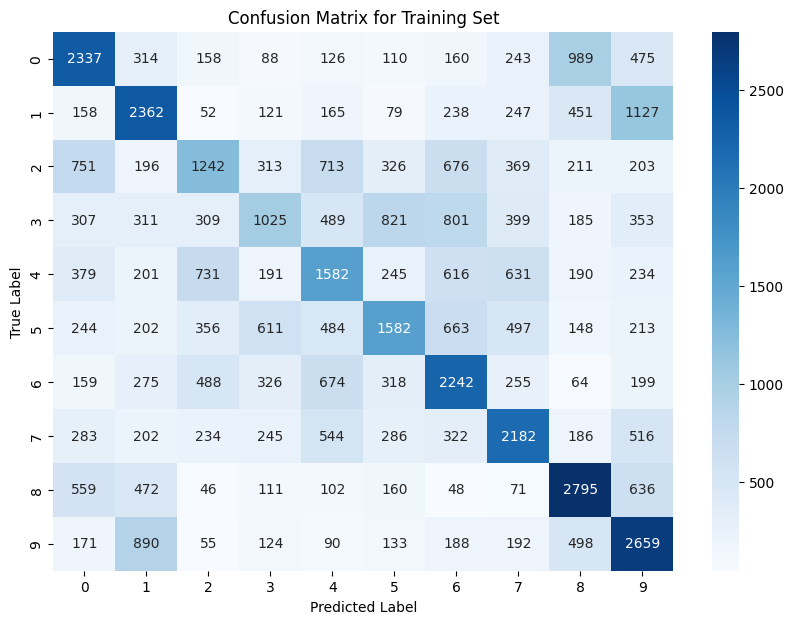

timecost:1.6207637786865234
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.44      0.47      0.45      5000
     Class 1       0.44      0.47      0.45      5000
     Class 2       0.34      0.25      0.29      5000
     Class 3       0.32      0.20      0.25      5000
     Class 4       0.32      0.32      0.32      5000
     Class 5       0.39      0.32      0.35      5000
     Class 6       0.38      0.45      0.41      5000
     Class 7       0.43      0.44      0.43      5000
     Class 8       0.49      0.56      0.52      5000
     Class 9       0.40      0.53      0.46      5000

    accuracy                           0.40     50000
   macro avg       0.39      0.40      0.39     50000
weighted avg       0.39      0.40      0.39     50000

timecost:752.3505446910858
Layer 0 (RNN): 49408 parameters
Layer 1 (HiddenLayer): 33024 parameters
Layer 2 (BatchNormLayer): 512 parameters
Layer 3 (GELULayer): No parameters 

In [ ]:
class RNN:
    def __init__(self, input_size, hidden_size, output_size):
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        # kaiming init
        self.Wxh = np.random.randn(input_size, hidden_size) * np.sqrt(2. / input_size)
        self.Whh = np.random.randn(hidden_size, hidden_size) * np.sqrt(2. / hidden_size)
        self.Why = np.random.randn(hidden_size, output_size) * np.sqrt(2. / hidden_size)
        self.bh = np.zeros((1, hidden_size))
        self.by = np.zeros((1, output_size))

        # init momentum and gradient
        self.dWxh, self.dWhh, self.dWhy = np.zeros_like(self.Wxh), np.zeros_like(self.Whh), np.zeros_like(self.Why)
        self.dbh, self.dby = np.zeros_like(self.bh), np.zeros_like(self.by)
        self.vWxh, self.vWhh, self.vWhy = np.zeros_like(self.Wxh), np.zeros_like(self.Whh), np.zeros_like(self.Why)
        self.vbh, self.vby = np.zeros_like(self.bh), np.zeros_like(self.by)

    def forward(self, X):
        # If the input X has 2 dimensions, convert it to a 3-dimensional tensor
        if X.ndim == 2:

            X = X[:, np.newaxis, :]

        self.X = X

        self.hs = [np.zeros((X.shape[0], self.hidden_size))]
        self.ys = []
        # Loop over each time step in the sequence
        for t in range(X.shape[1]):
            # Calculate the hidden state for the current time step
            xt = X[:, t, :]
            ht = np.tanh(np.dot(xt, self.Wxh) + np.dot(self.hs[-1], self.Whh) + self.bh)
            yt = np.dot(ht, self.Why) + self.by
            self.hs.append(ht)
            self.ys.append(yt)

        # Convert the output list to a 3-dimensional tensor and handle the case of a single time step
        Y = np.array(self.ys).transpose(1, 0, 2)
        if Y.shape[1] == 1:
            Y = Y.squeeze(1)
        return Y

    def backward(self, dY):
         # If the input gradient dY has 2 dimensions, convert it to a 3-dimensional tensor
        if dY.ndim == 2:
            dY = dY[:, np.newaxis, :]

        dX = np.zeros_like(self.X)
        dH_next = np.zeros((dY.shape[0], self.hidden_size))
        # Transpose the output gradient list to have time steps as the first dimension
        dYs = dY.transpose(1, 0, 2)
        # Iterate backward over each time step in the sequence
        for t in reversed(range(len(self.ys))):
            dy = dYs[t]
            dh = (np.dot(dy, self.Why.T) + dH_next) * (1 - self.hs[t + 1] ** 2)

            self.dWhy += np.dot(self.hs[t + 1].T, dy)
            self.dby += np.sum(dy, axis=0)
            self.dWxh += np.dot(self.X[:, t, :].T, dh)
            self.dWhh += np.dot(self.hs[t].T, dh)
            self.dbh += np.sum(dh, axis=0)

            dH_next = np.dot(dh, self.Whh.T)
            dX[:, t, :] = np.dot(dh, self.Wxh.T)
        # Handle the case of a single time step and return the input gradient
        return dX.squeeze(1) if dX.shape[1] == 1 else dX

    def update(self, learning_rate=0.001,weight_decay=0.01, momentum=0.9):
        self.weight_decay = weight_decay
        self.mu = momentum

        for dparam, param, vparam in zip([self.dWxh, self.dWhh, self.dWhy, self.dbh, self.dby],
                                         [self.Wxh, self.Whh, self.Why, self.bh, self.by],
                                         [self.vWxh, self.vWhh, self.vWhy, self.vbh, self.vby]):
            vparam *= self.mu
            vparam += learning_rate * (dparam + self.weight_decay * param)
            param -= vparam

    def params_count(self):
        return self.Wxh.size + self.Whh.size + self.Why.size + self.bh.size + self.by.size

    def get_params(self):
        return self.Wxh, self.Whh, self.Why, self.bh, self.by

    def set_params(self, params):
        self.Wxh, self.Whh, self.Why, self.bh, self.by = params



###RNN
model = MLP()
model.add(RNN(128,128,128))
model.add(HiddenLayer(128, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(ResidualBlock(256, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
trainings_RNN = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_RNN.mini_batch_train()
print("train_accuracies:",trainings_RNN.train_accuracies)
print("test_accuracies:",trainings_RNN.test_accuracies)
print("epoch_losses:",trainings_RNN.epoch_losses)
print("params_count:",trainings_RNN.params_count)
print("train_timecost:",trainings_RNN.train_timecost)
print("test_timecost:",trainings_RNN.test_timecost)
print("train_report:",trainings_RNN.train_report)
print("test_report:",trainings_RNN.test_report)


## MLP

<ipython-input-5-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.4175, Test Accuracy: 0.4168, Loss: 2.0000773029703014
Epoch 2, Train Accuracy: 0.46888, Test Accuracy: 0.4635, Loss: 1.6835869915096697
Epoch 3, Train Accuracy: 0.49576, Test Accuracy: 0.4861, Loss: 1.5790788760534848
Epoch 4, Train Accuracy: 0.51726, Test Accuracy: 0.4943, Loss: 1.5224784077330127
Epoch 5, Train Accuracy: 0.5279, Test Accuracy: 0.5079, Loss: 1.4798951575233779
Epoch 6, Train Accuracy: 0.54694, Test Accuracy: 0.5182, Loss: 1.4451172396918859
Epoch 7, Train Accuracy: 0.5551, Test Accuracy: 0.5207, Loss: 1.4202167063341997
Epoch 8, Train Accuracy: 0.56474, Test Accuracy: 0.5296, Loss: 1.398064714221985
Epoch 9, Train Accuracy: 0.57572, Test Accuracy: 0.5306, Loss: 1.3711000640861692
Epoch 10, Train Accuracy: 0.58366, Test Accuracy: 0.5403, Loss: 1.3574484076676685
Epoch 11, Train Accuracy: 0.58648, Test Accuracy: 0.5428, Loss: 1.342003381777773
Epoch 12, Train Accuracy: 0.589, Test Accuracy: 0.5432, Loss: 1.3327087238220856
Epoch 13, Train Accu

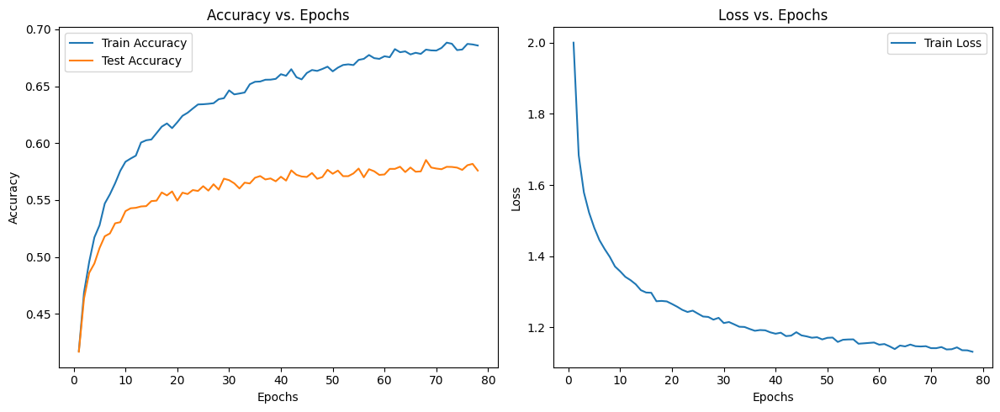

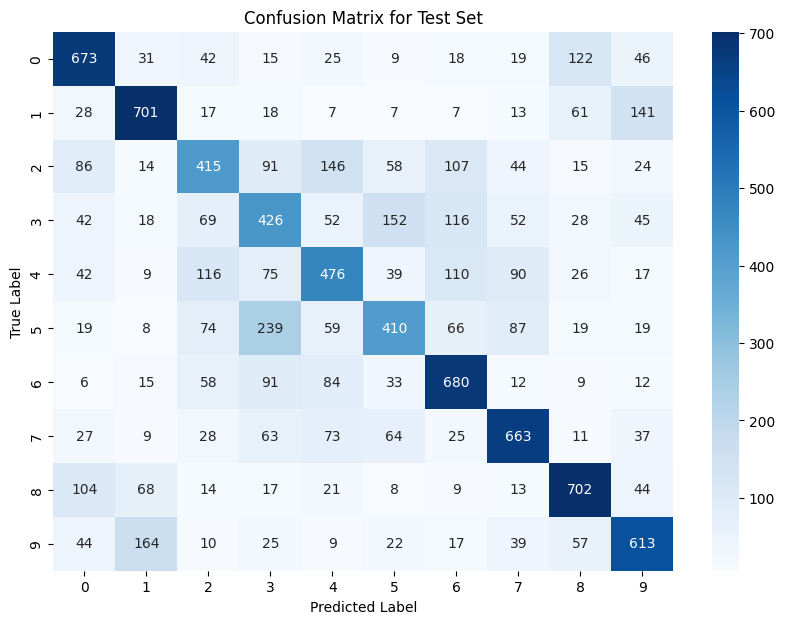

timecost:0.28271007537841797
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.63      0.67      0.65      1000
     Class 1       0.68      0.70      0.69      1000
     Class 2       0.49      0.41      0.45      1000
     Class 3       0.40      0.43      0.41      1000
     Class 4       0.50      0.48      0.49      1000
     Class 5       0.51      0.41      0.46      1000
     Class 6       0.59      0.68      0.63      1000
     Class 7       0.64      0.66      0.65      1000
     Class 8       0.67      0.70      0.68      1000
     Class 9       0.61      0.61      0.61      1000

    accuracy                           0.58     10000
   macro avg       0.57      0.58      0.57     10000
weighted avg       0.57      0.58      0.57     10000



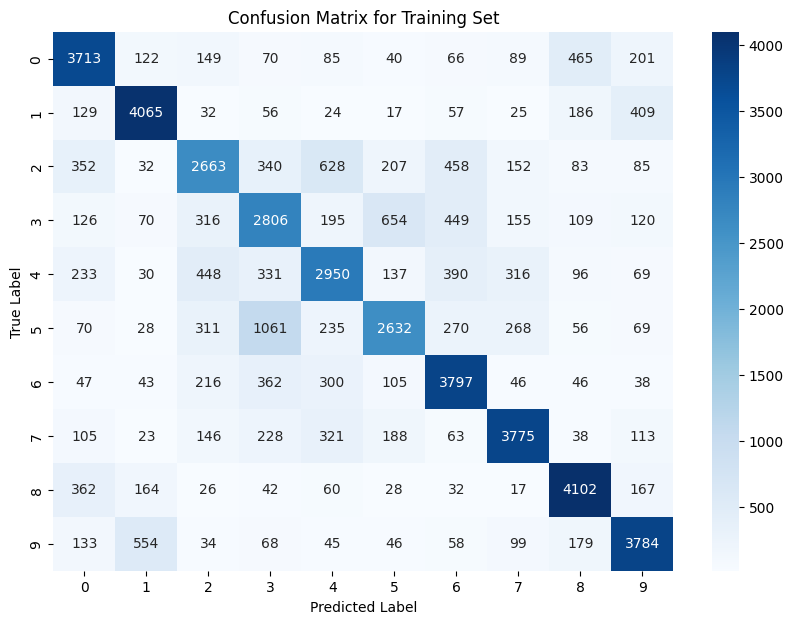

timecost:1.491262435913086
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.70      0.74      0.72      5000
     Class 1       0.79      0.81      0.80      5000
     Class 2       0.61      0.53      0.57      5000
     Class 3       0.52      0.56      0.54      5000
     Class 4       0.61      0.59      0.60      5000
     Class 5       0.65      0.53      0.58      5000
     Class 6       0.67      0.76      0.71      5000
     Class 7       0.76      0.76      0.76      5000
     Class 8       0.77      0.82      0.79      5000
     Class 9       0.75      0.76      0.75      5000

    accuracy                           0.69     50000
   macro avg       0.68      0.69      0.68     50000
weighted avg       0.68      0.69      0.68     50000

timecost:1060.3025646209717
Layer 0 (HiddenLayer): 33024 parameters
Layer 1 (BatchNormLayer): 512 parameters
Layer 2 (GELULayer): No parameters or `param_count` method not impl

In [ ]:
# feature extract
###MLP
model = MLP()
model.add(HiddenLayer(128, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(ResidualBlock(256, 256))
model.add(BatchNormLayer(256))
model.add(GELULayer())
model.add(DropoutLayer(0.2))
model.add(HiddenLayer(256, 10))
model.add(SoftmaxLayer())
trainings_MLP = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=200,
                      batch_size=32,
                      learning_rate=0.05,
                      weight_decay=0.001,
                      mu=0.999,
                      patience=10)
trainings_MLP.mini_batch_train()
print("train_accuracies:",trainings_MLP.train_accuracies)
print("test_accuracies:",trainings_MLP.test_accuracies)
print("epoch_losses:",trainings_MLP.epoch_losses)
print("params_count:",trainings_MLP.params_count)
print("train_timecost:",trainings_MLP.train_timecost)
print("test_timecost:",trainings_MLP.test_timecost)
print("train_report:",trainings_MLP.train_report)
print("test_report:",trainings_MLP.test_report)

# epoch_losses = {
#     "CNN": trainings_CNN.epoch_losses,
#     "RNN": trainings_RNN.epoch_losses,
#     "MLP": trainings_MLP.epoch_losses
# }
# test_accuracies = {
#     "CNN": trainings_CNN.test_accuracies,
#     "RNN": trainings_RNN.test_accuracies,
#     "MLP": trainings_MLP.test_accuracies
# }

# plot_training_results(epoch_losses, test_accuracies, 'Feature Extract and Embedding')


## Self Attention

Layer 0 (HiddenLayer): 4128 parameters
Layer 1 (BatchNormLayer): 64 parameters
Layer 2 (SelfAttention): 3168 parameters
Layer 3 (LayerNormLayer): 64 parameters
Layer 4 (GELULayer): No parameters or `param_count` method not implemented.
Layer 5 (HiddenLayer): 330 parameters
Layer 6 (SoftmaxLayer): No parameters or `param_count` method not implemented.
Total parameters: 7754


<ipython-input-5-d86eeb44503f>:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  encoded_label[int(label)] = 1


Epoch 1, Train Accuracy: 0.17782, Test Accuracy: 0.1794, Loss: 2.2089915313427753
Epoch 2, Train Accuracy: 0.16972, Test Accuracy: 0.1758, Loss: 2.099331573977574
Epoch 3, Train Accuracy: 0.1829, Test Accuracy: 0.1806, Loss: 2.0969032429915138
Epoch 4, Train Accuracy: 0.1872, Test Accuracy: 0.1848, Loss: 2.0879074964853435
Epoch 5, Train Accuracy: 0.1826, Test Accuracy: 0.1823, Loss: 2.0797236305869373
Epoch 6, Train Accuracy: 0.19008, Test Accuracy: 0.1891, Loss: 2.0670059986178715
Epoch 7, Train Accuracy: 0.18546, Test Accuracy: 0.1836, Loss: 2.067731907044792
Epoch 8, Train Accuracy: 0.19502, Test Accuracy: 0.1953, Loss: 2.0705593989079474
Epoch 9, Train Accuracy: 0.18734, Test Accuracy: 0.1865, Loss: 2.0644021875628162
Epoch 10, Train Accuracy: 0.19322, Test Accuracy: 0.1933, Loss: 2.0652871859327036
Epoch 11, Train Accuracy: 0.18612, Test Accuracy: 0.1864, Loss: 2.063391715315957
Epoch 12, Train Accuracy: 0.17596, Test Accuracy: 0.1797, Loss: 2.0636847006081642
Epoch 13, Train Acc

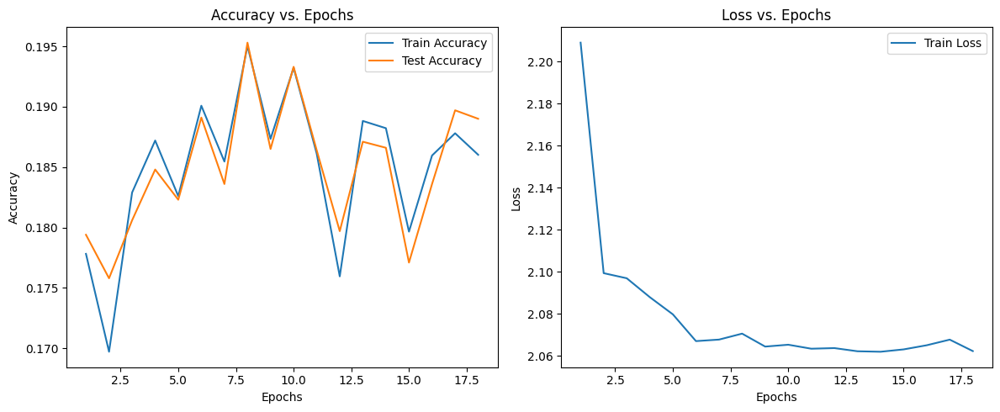

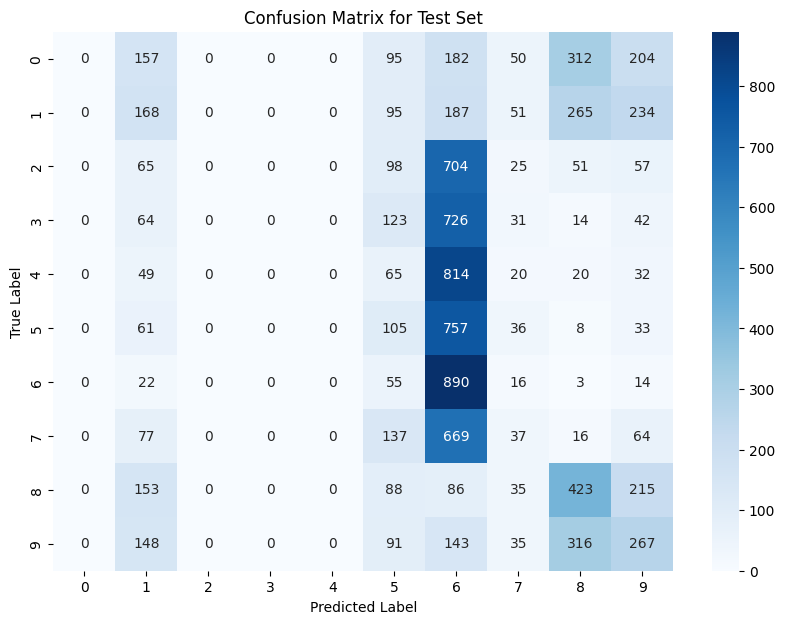

timecost:1.288654088973999
Performance Metrics for Test Set:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      1000
     Class 1       0.17      0.17      0.17      1000
     Class 2       0.00      0.00      0.00      1000
     Class 3       0.00      0.00      0.00      1000
     Class 4       0.00      0.00      0.00      1000
     Class 5       0.11      0.10      0.11      1000
     Class 6       0.17      0.89      0.29      1000
     Class 7       0.11      0.04      0.06      1000
     Class 8       0.30      0.42      0.35      1000
     Class 9       0.23      0.27      0.25      1000

    accuracy                           0.19     10000
   macro avg       0.11      0.19      0.12     10000
weighted avg       0.11      0.19      0.12     10000



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


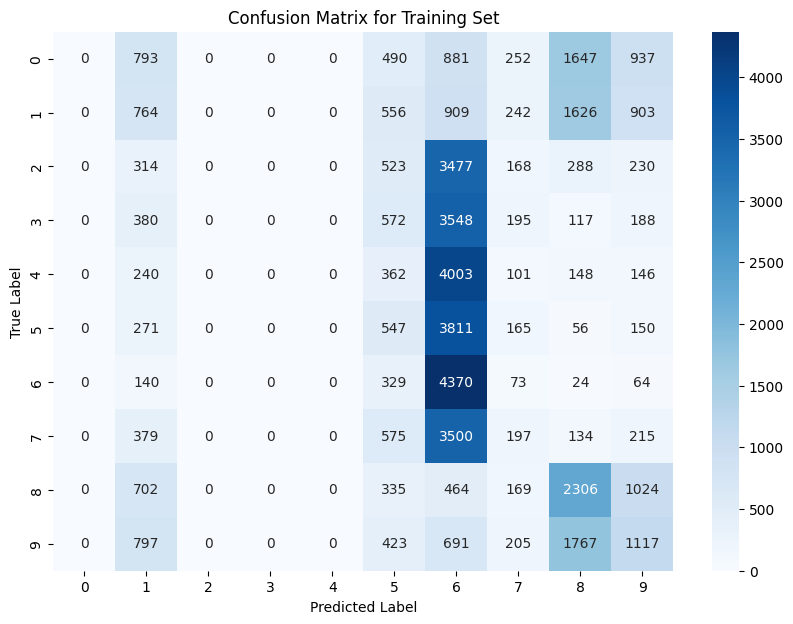

timecost:30.691946029663086
Performance Metrics for Training Set:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5000
     Class 1       0.16      0.15      0.16      5000
     Class 2       0.00      0.00      0.00      5000
     Class 3       0.00      0.00      0.00      5000
     Class 4       0.00      0.00      0.00      5000
     Class 5       0.12      0.11      0.11      5000
     Class 6       0.17      0.87      0.29      5000
     Class 7       0.11      0.04      0.06      5000
     Class 8       0.28      0.46      0.35      5000
     Class 9       0.22      0.22      0.22      5000

    accuracy                           0.19     50000
   macro avg       0.11      0.19      0.12     50000
weighted avg       0.11      0.19      0.12     50000

timecost:635.2543802261353
Layer 0 (HiddenLayer): 4128 parameters
Layer 1 (BatchNormLayer): 64 parameters
Layer 2 (SelfAttention): 3168 parameters
Layer 3 (LayerNormLayer): 64

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
def softmax(x):
    x_max = np.max(x, axis=1, keepdims=True)
    exp_x = np.exp(x - x_max) # Improve numerical stability
    return exp_x / np.sum(exp_x, axis=1, keepdims=True)

class SelfAttention:
    def __init__(self, input_dim, output_dim):
        self.input_dim = input_dim
        self.output_dim = output_dim

        # Initialize weights for Query, Key, and Value
        self.W_q = np.random.randn(input_dim, output_dim) * 0.01
        self.W_k = np.random.randn(input_dim, output_dim) * 0.01
        self.W_v = np.random.randn(input_dim, output_dim) * 0.01

        self.b_q = np.zeros((1, output_dim))
        self.b_k = np.zeros((1, output_dim))
        self.b_v = np.zeros((1, output_dim))

        # Initialize momentum variables
        self.vW_q = np.zeros_like(self.W_q)
        self.vW_k = np.zeros_like(self.W_k)
        self.vW_v = np.zeros_like(self.W_v)

        self.vb_q = np.zeros_like(self.b_q)
        self.vb_k = np.zeros_like(self.b_k)
        self.vb_v = np.zeros_like(self.b_v)

    def forward(self, X):
        self.X = X
        self.Q = np.dot(X, self.W_q) + self.b_q
        self.K = np.dot(X, self.W_k) + self.b_k
        self.V = np.dot(X, self.W_v) + self.b_v

        self.attention_scores = np.dot(self.Q, self.K.T) / np.sqrt(self.output_dim)
        scores_max = np.max(self.attention_scores, axis=1, keepdims=True)  # For numerical stability
        exp_scores = np.exp(self.attention_scores - scores_max)
        self.attention_weights = exp_scores / np.sum(exp_scores, axis=1, keepdims=True)
        self.Z = np.dot(self.attention_weights, self.V)

        return self.Z

    def backward(self, dZ,weight_decay=0.01):
        self.weight_decay = weight_decay
        # Gradient w.r.t. output (V)
        dAttentionWeights = np.dot(dZ, self.V.T)
        dV = np.dot(self.attention_weights.T, dZ)
        self.dW_v = np.dot(self.X.T, dV) + self.weight_decay * self.W_v
        self.db_v = np.sum(dV, axis=0, keepdims=True)

        # Gradient of softmax
        dScores = np.empty_like(self.attention_scores)
        for i in range(len(dScores)):
            grad_softmax = np.diagflat(self.attention_weights[i]) - np.outer(self.attention_weights[i], self.attention_weights[i])
            dScores[i] = np.dot(dAttentionWeights[i], grad_softmax)

        dQ = np.dot(dScores, self.K)
        dK = np.dot(dScores.T, self.Q)

        self.dW_q = np.dot(self.X.T, dQ) + self.weight_decay * self.W_q
        self.db_q = np.sum(dQ, axis=0, keepdims=True)
        self.dW_k = np.dot(self.X.T, dK) + self.weight_decay * self.W_k
        self.db_k = np.sum(dK, axis=0, keepdims=True)

        # Gradient w.r.t. input
        dX = np.dot(dQ, self.W_q.T) + np.dot(dK, self.W_k.T) + np.dot(dV, self.W_v.T)
        return dX

    def update(self, learning_rate=1e-3, weight_decay=0.01, momentum=0.99):
        self.momentum = momentum
        # Update weights and biases with momentum and weight decay
        for param, grad, velocity in [
            (self.W_q, self.dW_q, self.vW_q), (self.W_k, self.dW_k, self.vW_k),
            (self.W_v, self.dW_v, self.vW_v), (self.b_q, self.db_q, self.vb_q),
            (self.b_k, self.db_k, self.vb_k), (self.b_v, self.db_v, self.vb_v)
        ]:
            velocity[:] = self.momentum * velocity + learning_rate * grad
            param -= velocity

    def params_count(self):
        return self.W_q.size + self.W_k.size + self.W_v.size + self.b_q.size + self.b_k.size + self.b_v.size

    def get_params(self):
        return self.W_q, self.W_k, self.W_v, self.b_q, self.b_k, self.b_v

    def set_params(self, W_q, W_k, W_v, b_q, b_k, b_v):
        self.W_q = W_q
        self.W_k = W_k
        self.W_v = W_v
        self.b_q = b_q
        self.b_k = b_k


model = MLP()
model.add(HiddenLayer(128, 32))
model.add(BatchNormLayer(32))
model.add(SelfAttention(32,32))
model.add(LayerNormLayer(32))
model.add(GELULayer())
model.add(HiddenLayer(32, 10))
model.add(SoftmaxLayer())
model.summary()
trainings_attention = Trainings(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                      model=model,
                      epochs=50,
                      batch_size=32,
                      learning_rate=0.01,
                      weight_decay=0.01,
                      mu=0.99,
                      patience=10)
trainings_attention.mini_batch_train()
print("train_accuracies:",trainings_attention.train_accuracies)
print("test_accuracies:",trainings_attention.test_accuracies)
print("epoch_losses:",trainings_attention.epoch_losses)
print("params_count:",trainings_attention.params_count)
print("train_timecost:",trainings_attention.train_timecost)
print("test_timecost:",trainings_attention.test_timecost)
print("train_report:",trainings_attention.train_report)
print("test_report:",trainings_attention.test_report)


## Result

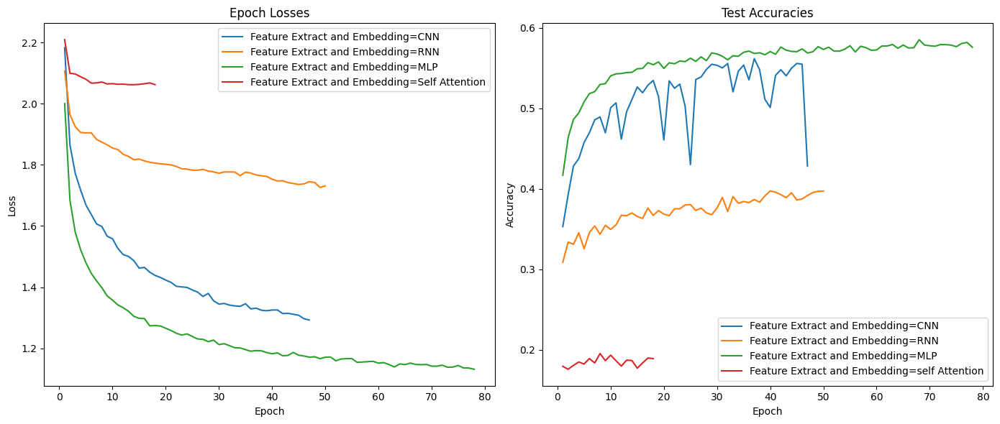

In [ ]:
epoch_losses = {
    "CNN": [2.1827124032294307, 1.8642911521601282, 1.7716148967648961, 1.7176451588262938, 1.6686212890777272, 1.6376784209575088, 1.6066577817558283, 1.5980499989701182, 1.5664059730189517, 1.558167845532285, 1.5268872067569121, 1.5063632030206446, 1.5004764798322145, 1.4866176809939078, 1.4622102374878447, 1.4644154569766237, 1.448927311704541, 1.438265285563221, 1.4318049947480527, 1.423053338726328, 1.415615691235614, 1.4026426799783511, 1.4007424068146015, 1.3989995662866703, 1.390859178789251, 1.3836610747878544, 1.3695501610290026, 1.379594464786139, 1.355338429937187, 1.3444058117739013, 1.3466993771965146, 1.3412242526466545, 1.3386245477177694, 1.3372555046206218, 1.3457842953160055, 1.3288900686943586, 1.331201683699341, 1.3245049675778413, 1.3228235591232775, 1.3251884931456672, 1.3253679680509531, 1.313561392645706, 1.3143123167676845, 1.311250951927032, 1.308000505091109, 1.2967088463450847, 1.2924093523659455],
    "RNN": [2.1065721403523816, 1.964096674715294, 1.9242447014242083, 1.9057411012754666, 1.9041589869927864, 1.904773266305136, 1.8832312885964226, 1.8740821934186163, 1.8653274673517821, 1.8549605790755643, 1.849741483411889, 1.834204703511147, 1.827532446714881, 1.8166136038225387, 1.8188149345649502, 1.812763168957689, 1.8084012485544165, 1.8055079410473882, 1.8032435530264659, 1.8016637813431995, 1.7995799900808485, 1.794646871947665, 1.787061058857697, 1.7859172506784189, 1.7824446059535795, 1.7820947103162486, 1.785098769244982, 1.7796819998084505, 1.7768100780883815, 1.7723968196739812, 1.7766298923948816, 1.7765455201787368, 1.7762708155522362, 1.7644747815455295, 1.775927448572733, 1.7729286475253738, 1.7667018707802198, 1.764027430635836, 1.762048544897413, 1.7529005492431613, 1.7472087048766094, 1.7478065939473044, 1.7418696715659487, 1.738918198340674, 1.7358101146315514, 1.737590917048154, 1.744829143117562, 1.7423285776911388, 1.7262343063214047, 1.7309798946528163],
    "MLP": [2.0000773029703014, 1.6835869915096697, 1.5790788760534848, 1.5224784077330127, 1.4798951575233779, 1.4451172396918859, 1.4202167063341997, 1.398064714221985, 1.3711000640861692, 1.3574484076676685, 1.342003381777773, 1.3327087238220856, 1.321204871658032, 1.3045808648760282, 1.2980131285142902, 1.2972328220885176, 1.2734737217481922, 1.2743309511378564, 1.2729853439989829, 1.265765339826924, 1.2580679019565482, 1.2492228897408055, 1.243278578874309, 1.2470729595932635, 1.2387015563480905, 1.2305513564438444, 1.2293741851725695, 1.2217122858088711, 1.2268485745579332, 1.2121719129219848, 1.2150406132363831, 1.208569572851423, 1.201780660009271, 1.2011733906343585, 1.1955433103806103, 1.1904535172150232, 1.1925092238549269, 1.1917650530486945, 1.1859649583735792, 1.1821873463819306, 1.1850615585084645, 1.1755236937017088, 1.1768220323538556, 1.1864407830868213, 1.1775131121695903, 1.1747009031827542, 1.1709540405567833, 1.1723331260746872, 1.1661974186497654, 1.170720561212008, 1.1714146405413373, 1.159109200751356, 1.1652149068452589, 1.1660790736338045, 1.1663214554575552, 1.1540609064268088, 1.155142416912768, 1.156317947026595, 1.1574545135577594, 1.1513741628578846, 1.153170516696635, 1.1467400991205838, 1.139068729243463, 1.1489630313925052, 1.1465881748369595, 1.1517372369369767, 1.1471390644960229, 1.1463410720526814, 1.147104958248818, 1.1416366637437947, 1.14153113034472, 1.1447317988486536, 1.1379814571130078, 1.1386515887227302, 1.1438630138859072, 1.1358129412290883, 1.1354975835212626, 1.1315348619426622],
    "Self Attention": [2.2089915313427753, 2.099331573977574, 2.0969032429915138, 2.0879074964853435, 2.0797236305869373, 2.0670059986178715, 2.067731907044792, 2.0705593989079474, 2.0644021875628162, 2.0652871859327036, 2.063391715315957, 2.0636847006081642, 2.06217592158313, 2.0619440707071783, 2.0630637043487585, 2.0650310613686926, 2.0677063409796346, 2.062260320613527]
}


test_accuracies = {
    "CNN": [0.353, 0.3925, 0.4282, 0.4374, 0.4574, 0.4696, 0.4856, 0.4893, 0.4696, 0.5008, 0.5067, 0.4617, 0.4959, 0.5109, 0.5265, 0.5193, 0.5286, 0.5346, 0.5145, 0.4607, 0.5341, 0.5249, 0.53, 0.5025, 0.4301, 0.5358, 0.5389, 0.5483, 0.5547, 0.5534, 0.5502, 0.5556, 0.5204, 0.546, 0.5537, 0.5353, 0.5617, 0.548, 0.5111, 0.501, 0.541, 0.5479, 0.5403, 0.5498, 0.5557, 0.5548, 0.4282],
    "RNN": [0.3087, 0.3338, 0.331, 0.3454, 0.3255, 0.3456, 0.3539, 0.3434, 0.3546, 0.3495, 0.3551, 0.3671, 0.3665, 0.37, 0.3656, 0.3631, 0.3761, 0.3669, 0.373, 0.3685, 0.3666, 0.3752, 0.3751, 0.3799, 0.3804, 0.3731, 0.376, 0.3701, 0.3678, 0.3761, 0.3893, 0.3718, 0.3903, 0.382, 0.3842, 0.3828, 0.3867, 0.3833, 0.3911, 0.3973, 0.3958, 0.3927, 0.3889, 0.395, 0.3861, 0.3874, 0.3916, 0.3953, 0.3968, 0.3972],
    "MLP": [0.4168, 0.4635, 0.4861, 0.4943, 0.5079, 0.5182, 0.5207, 0.5296, 0.5306, 0.5403, 0.5428, 0.5432, 0.5444, 0.5447, 0.5491, 0.5495, 0.5567, 0.5541, 0.5576, 0.5495, 0.5565, 0.5553, 0.5588, 0.558, 0.5622, 0.5583, 0.5639, 0.5592, 0.5688, 0.5675, 0.5647, 0.5602, 0.5653, 0.5646, 0.5696, 0.5711, 0.5681, 0.569, 0.5665, 0.5705, 0.5671, 0.5761, 0.5722, 0.5707, 0.5703, 0.5738, 0.5687, 0.5702, 0.5766, 0.5731, 0.5759, 0.571, 0.571, 0.5734, 0.5777, 0.57, 0.5771, 0.5753, 0.5721, 0.5725, 0.5774, 0.5774, 0.5793, 0.5746, 0.5786, 0.5749, 0.5752, 0.5852, 0.5786, 0.5777, 0.5771, 0.5792, 0.5791, 0.5785, 0.5765, 0.5806, 0.5818, 0.5759],
    "self Attention": [0.1794, 0.1758, 0.1806, 0.1848, 0.1823, 0.1891, 0.1836, 0.1953, 0.1865, 0.1933, 0.1864, 0.1797, 0.1871, 0.1866, 0.1771, 0.1836, 0.1897, 0.189]
}
plot_training_results(epoch_losses, test_accuracies, 'Feature Extract and Embedding')